<h1>Federated Datasets</h1>

This example demonstrates how you can develop your custom datasets that work with federated data loaders. The regular torch datasets do not always work directly with federated data loaders.The tutorial aims to highlight the differences and shows you how you could develop a federated dataset with your data that works with the federated data loader. Further you could also use Syft's Base dataset feature to create federated datasets.To demonstrate the principles we will show you how to load the SVHN dataset and convert it to a federated dataset.

Hrishikesh Kamath - GitHub: @<a href="http://github.com/kamathhrishi">kamathhrishi</a>

In [129]:
from torch.utils.data import Dataset
import syft as sy  
import torch

In [130]:
#Define Syft workers Bob and Alice for federated learning

hook = sy.TorchHook(torch)  # <-- NEW: hook PyTorch ie add extra functionalities to support Federated Learning
bob = sy.VirtualWorker(hook, id="bob")  # <-- NEW: define remote worker bob
alice = sy.VirtualWorker(hook, id="alice")  # <-- NEW: and alice

In [131]:
class Arguments():
    def __init__(self):
        self.batch_size = 1
        self.test_batch_size = 1000
        self.epochs = 10
        self.lr = 0.01
        self.momentum = 0.5 #<-We currenly do not support momentum
        self.no_cuda = False
        self.seed = 1
        self.log_interval = 10
        self.save_model = False
        self.context_size=3
        self.embedding_dim=10

In [132]:
args=Arguments()

<h2>Load Data</h2>

Download data required for this tutorial from the following sources:-

<ul>

<li><a href="http://ufldl.stanford.edu/housenumbers/train_32x32.mat">Train Data</li>
<li><a href="http://ufldl.stanford.edu/housenumbers/test_32x32.mat">Test Data</li>


</ul>

The dataset is in MATLAB format

In [133]:
from scipy.io import loadmat
import matplotlib.pyplot as plt

def load_data(path):
    """ Helper function for loading a MAT-File"""
    data = loadmat(path)
    return data['X'], data['y']

In [134]:
train_data,train_labels=load_data("data/train_32x32.mat")
test_data,test_labels=load_data("data/test_32x32.mat")

In [135]:
# Transpose the image arrays
X_train, y_train = train_data.transpose((3,0,1,2)), train_labels[:,0]
X_test, y_test = test_data.transpose((3,0,1,2)), test_labels[:,0]

<h2>Visualize Data</h2>

(73257, 32, 32, 3)
9


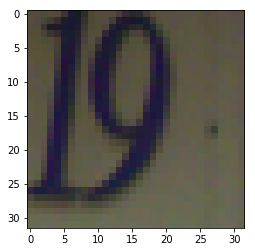

In [136]:
print(X_train.shape)
print(y_train[1])
plt.imshow(X_train[1])
plt.show()

<h2>Torch Dataset</h2>

In [141]:
class SVHNDataset(Dataset):

    def __init__(self,images,labels,transform=None):
        
        """arguments:
        
             text (List of Strings): Text corpus 
             transform: List of transforms to be performed on the input data
             
        """
        
        #Mandatory
        "Data must be initialized as self.data,self.train_data or self.test_data"
        self.data=images
        "Targets must be initialized as self.targets,self.test_labels or self.train_labels"
        self.targets=labels
        
        self.to_torchtensor()
        
        self.transform = transform
        
        
    def to_torchtensor(self):
        
        self.data=torch.from_numpy(self.data)
        self.labels=torch.from_numpy(self.targets)
    
        
    def __len__(self):
        
        #Mandatory
        
        '''Returns:
        
                Length [int]: Length of Dataset/batches
        
        '''
        
        return len(self.data)
    

    def __getitem__(self, idx):
        
        #Mandatory 
        
        '''Returns:
                 
                 Data [Torch Tensor]: 
                 Target [ Torch Tensor]:
        
        '''
        
        sample=self.data[idx]
        target=self.targets[idx]
                
        if self.transform:
            sample = self.transform(sample)

        return sample,target

In [143]:
federated_train_loader = sy.FederatedDataLoader( # <-- this is now a FederatedDataLoader 
                         SVHNDataset(X_train,y_train)
                         .federate((bob, alice)),batch_size=args.batch_size)

In [144]:
for i in federated_train_loader:
    
    print(i)

((Wrapper)>[PointerTensor | me:19630019678 -> bob:93804930794], (Wrapper)>[PointerTensor | me:31454781089 -> bob:91496733161])
((Wrapper)>[PointerTensor | me:50494447836 -> bob:37459162547], (Wrapper)>[PointerTensor | me:59307374262 -> bob:96231690499])
((Wrapper)>[PointerTensor | me:9434641787 -> bob:74304066521], (Wrapper)>[PointerTensor | me:4099951923 -> bob:74221820951])
((Wrapper)>[PointerTensor | me:7178067711 -> bob:99700529507], (Wrapper)>[PointerTensor | me:78183778900 -> bob:45876494119])
((Wrapper)>[PointerTensor | me:54656479595 -> bob:45439690696], (Wrapper)>[PointerTensor | me:74169782826 -> bob:69530940682])
((Wrapper)>[PointerTensor | me:45568297167 -> bob:71970899118], (Wrapper)>[PointerTensor | me:76928348577 -> bob:94283877916])
((Wrapper)>[PointerTensor | me:32180764429 -> bob:73339997530], (Wrapper)>[PointerTensor | me:68137957683 -> bob:19837849577])
((Wrapper)>[PointerTensor | me:23162406960 -> bob:66693394872], (Wrapper)>[PointerTensor | me:5345355271 -> bob:72

((Wrapper)>[PointerTensor | me:46719027640 -> bob:81304980307], (Wrapper)>[PointerTensor | me:6451194375 -> bob:83744988277])
((Wrapper)>[PointerTensor | me:88632822509 -> bob:91961753953], (Wrapper)>[PointerTensor | me:91508338392 -> bob:41755071499])
((Wrapper)>[PointerTensor | me:21837374520 -> bob:89981060310], (Wrapper)>[PointerTensor | me:60738986265 -> bob:92828457315])
((Wrapper)>[PointerTensor | me:40814277331 -> bob:26969198834], (Wrapper)>[PointerTensor | me:11635818965 -> bob:59127068717])
((Wrapper)>[PointerTensor | me:92345319167 -> bob:5348155179], (Wrapper)>[PointerTensor | me:28146008984 -> bob:79086554014])
((Wrapper)>[PointerTensor | me:25637261976 -> bob:78471292883], (Wrapper)>[PointerTensor | me:90462755980 -> bob:60978070819])
((Wrapper)>[PointerTensor | me:65496383088 -> bob:28572957561], (Wrapper)>[PointerTensor | me:66393977405 -> bob:53056825249])
((Wrapper)>[PointerTensor | me:98426261870 -> bob:98908025785], (Wrapper)>[PointerTensor | me:29830600660 -> bob:

((Wrapper)>[PointerTensor | me:86193338759 -> bob:16630328543], (Wrapper)>[PointerTensor | me:71700985199 -> bob:15376620583])
((Wrapper)>[PointerTensor | me:54875034227 -> bob:79645238068], (Wrapper)>[PointerTensor | me:13942230862 -> bob:76935542560])
((Wrapper)>[PointerTensor | me:29558036691 -> bob:56889575094], (Wrapper)>[PointerTensor | me:10457629319 -> bob:39666369183])
((Wrapper)>[PointerTensor | me:61574593626 -> bob:48113901514], (Wrapper)>[PointerTensor | me:47109347080 -> bob:59839161818])
((Wrapper)>[PointerTensor | me:73852604962 -> bob:69058302879], (Wrapper)>[PointerTensor | me:64153509484 -> bob:48495912970])
((Wrapper)>[PointerTensor | me:89967784047 -> bob:88155562776], (Wrapper)>[PointerTensor | me:75952924628 -> bob:13469969041])
((Wrapper)>[PointerTensor | me:88094893266 -> bob:17860752216], (Wrapper)>[PointerTensor | me:41249561941 -> bob:5679964303])
((Wrapper)>[PointerTensor | me:1381763335 -> bob:35268441406], (Wrapper)>[PointerTensor | me:59654853790 -> bob:

((Wrapper)>[PointerTensor | me:95216195287 -> bob:82642496353], (Wrapper)>[PointerTensor | me:14448233886 -> bob:82996956086])
((Wrapper)>[PointerTensor | me:49828811230 -> bob:39441857165], (Wrapper)>[PointerTensor | me:58685835760 -> bob:23039331133])
((Wrapper)>[PointerTensor | me:10287741623 -> bob:58341819435], (Wrapper)>[PointerTensor | me:45135817202 -> bob:59368991764])
((Wrapper)>[PointerTensor | me:85043371182 -> bob:41358529707], (Wrapper)>[PointerTensor | me:53918746385 -> bob:48064922150])
((Wrapper)>[PointerTensor | me:64103390382 -> bob:71192577450], (Wrapper)>[PointerTensor | me:47368286309 -> bob:5480675963])
((Wrapper)>[PointerTensor | me:24349523520 -> bob:38320219861], (Wrapper)>[PointerTensor | me:25357441656 -> bob:47615164780])
((Wrapper)>[PointerTensor | me:3065159065 -> bob:62441829010], (Wrapper)>[PointerTensor | me:65636501831 -> bob:45532009208])
((Wrapper)>[PointerTensor | me:96460169610 -> bob:70271257157], (Wrapper)>[PointerTensor | me:60991382518 -> bob:

((Wrapper)>[PointerTensor | me:73818709299 -> bob:22752479840], (Wrapper)>[PointerTensor | me:91397747054 -> bob:86715944978])
((Wrapper)>[PointerTensor | me:60011681499 -> bob:64057321534], (Wrapper)>[PointerTensor | me:86178862927 -> bob:3940757680])
((Wrapper)>[PointerTensor | me:78133850047 -> bob:37297123519], (Wrapper)>[PointerTensor | me:94289373904 -> bob:65701730301])
((Wrapper)>[PointerTensor | me:86703541730 -> bob:82419893334], (Wrapper)>[PointerTensor | me:97639561395 -> bob:94092554370])
((Wrapper)>[PointerTensor | me:35877486089 -> bob:78902659075], (Wrapper)>[PointerTensor | me:8550399689 -> bob:52868997038])
((Wrapper)>[PointerTensor | me:89118249191 -> bob:98134117155], (Wrapper)>[PointerTensor | me:95972286368 -> bob:77881397476])
((Wrapper)>[PointerTensor | me:46779947578 -> bob:94392036467], (Wrapper)>[PointerTensor | me:63938555867 -> bob:56200649407])
((Wrapper)>[PointerTensor | me:60857320280 -> bob:18927650226], (Wrapper)>[PointerTensor | me:39297392151 -> bob:

((Wrapper)>[PointerTensor | me:34049419077 -> bob:20835328947], (Wrapper)>[PointerTensor | me:23214987284 -> bob:56084672902])
((Wrapper)>[PointerTensor | me:89577184041 -> bob:92994420176], (Wrapper)>[PointerTensor | me:80457513444 -> bob:26199443892])
((Wrapper)>[PointerTensor | me:69656473507 -> bob:60842930015], (Wrapper)>[PointerTensor | me:72855861197 -> bob:74071076712])
((Wrapper)>[PointerTensor | me:68414706220 -> bob:3790832793], (Wrapper)>[PointerTensor | me:25919329862 -> bob:54120592344])
((Wrapper)>[PointerTensor | me:70793319754 -> bob:4667077011], (Wrapper)>[PointerTensor | me:5312504571 -> bob:45759448989])
((Wrapper)>[PointerTensor | me:66575533845 -> bob:62601840070], (Wrapper)>[PointerTensor | me:44140886740 -> bob:7180346966])
((Wrapper)>[PointerTensor | me:26193512421 -> bob:12271013260], (Wrapper)>[PointerTensor | me:87850336487 -> bob:80504141262])
((Wrapper)>[PointerTensor | me:71620005142 -> bob:40245497356], (Wrapper)>[PointerTensor | me:7766504662 -> bob:317

((Wrapper)>[PointerTensor | me:24395115440 -> bob:85184851949], (Wrapper)>[PointerTensor | me:29657683845 -> bob:81254159240])
((Wrapper)>[PointerTensor | me:41135712190 -> bob:44809772174], (Wrapper)>[PointerTensor | me:98989606009 -> bob:50586554467])
((Wrapper)>[PointerTensor | me:15463047477 -> bob:60710593535], (Wrapper)>[PointerTensor | me:63635566110 -> bob:5783282117])
((Wrapper)>[PointerTensor | me:16550081157 -> bob:79096160736], (Wrapper)>[PointerTensor | me:54797394002 -> bob:98092198784])
((Wrapper)>[PointerTensor | me:32380085749 -> bob:61912561509], (Wrapper)>[PointerTensor | me:39775779707 -> bob:31990037455])
((Wrapper)>[PointerTensor | me:98939583599 -> bob:98041366981], (Wrapper)>[PointerTensor | me:86094245919 -> bob:8728596768])
((Wrapper)>[PointerTensor | me:63585996787 -> bob:4265207076], (Wrapper)>[PointerTensor | me:21219817044 -> bob:72246220596])
((Wrapper)>[PointerTensor | me:13041414195 -> bob:47306755744], (Wrapper)>[PointerTensor | me:21960151912 -> bob:7

((Wrapper)>[PointerTensor | me:30672553101 -> bob:87961279008], (Wrapper)>[PointerTensor | me:80717478375 -> bob:84277912700])
((Wrapper)>[PointerTensor | me:14960073183 -> bob:50585068910], (Wrapper)>[PointerTensor | me:47288977616 -> bob:68280218618])
((Wrapper)>[PointerTensor | me:31813599396 -> bob:64890988826], (Wrapper)>[PointerTensor | me:14127110066 -> bob:98647218781])
((Wrapper)>[PointerTensor | me:76452512794 -> bob:74208410116], (Wrapper)>[PointerTensor | me:39933702620 -> bob:30054041766])
((Wrapper)>[PointerTensor | me:42924573053 -> bob:59022904787], (Wrapper)>[PointerTensor | me:53144750777 -> bob:80772443743])
((Wrapper)>[PointerTensor | me:8090140691 -> bob:11662252914], (Wrapper)>[PointerTensor | me:71611801811 -> bob:11337113116])
((Wrapper)>[PointerTensor | me:26958223967 -> bob:83018195835], (Wrapper)>[PointerTensor | me:79568853760 -> bob:20178389845])
((Wrapper)>[PointerTensor | me:78021118153 -> bob:45121434499], (Wrapper)>[PointerTensor | me:18283396083 -> bob

((Wrapper)>[PointerTensor | me:33254001469 -> bob:41682963045], (Wrapper)>[PointerTensor | me:65936136567 -> bob:85624212253])
((Wrapper)>[PointerTensor | me:35888191929 -> bob:75253590696], (Wrapper)>[PointerTensor | me:12882483946 -> bob:42063670161])
((Wrapper)>[PointerTensor | me:85733016082 -> bob:13926952578], (Wrapper)>[PointerTensor | me:72743645187 -> bob:93982288103])
((Wrapper)>[PointerTensor | me:87688250792 -> bob:20042077034], (Wrapper)>[PointerTensor | me:67838221819 -> bob:34423601778])
((Wrapper)>[PointerTensor | me:48517751080 -> bob:82092029428], (Wrapper)>[PointerTensor | me:46487285516 -> bob:43928200685])
((Wrapper)>[PointerTensor | me:83419596266 -> bob:37404638763], (Wrapper)>[PointerTensor | me:68095788068 -> bob:72601406721])
((Wrapper)>[PointerTensor | me:92151406807 -> bob:92968586010], (Wrapper)>[PointerTensor | me:85451943848 -> bob:56763254997])
((Wrapper)>[PointerTensor | me:50196594317 -> bob:95498154492], (Wrapper)>[PointerTensor | me:54324410815 -> bo

((Wrapper)>[PointerTensor | me:17772251781 -> bob:51253118499], (Wrapper)>[PointerTensor | me:88281378100 -> bob:69436312461])
((Wrapper)>[PointerTensor | me:48270170346 -> bob:47825452246], (Wrapper)>[PointerTensor | me:52773799555 -> bob:50657133291])
((Wrapper)>[PointerTensor | me:32722227454 -> bob:7716577384], (Wrapper)>[PointerTensor | me:34420200640 -> bob:8519892341])
((Wrapper)>[PointerTensor | me:46362731705 -> bob:46841269806], (Wrapper)>[PointerTensor | me:21102968898 -> bob:9283076604])
((Wrapper)>[PointerTensor | me:50590268734 -> bob:54158690632], (Wrapper)>[PointerTensor | me:66521103552 -> bob:53607728037])
((Wrapper)>[PointerTensor | me:88569815696 -> bob:62676540475], (Wrapper)>[PointerTensor | me:33927202894 -> bob:85552628579])
((Wrapper)>[PointerTensor | me:74796514953 -> bob:82458389333], (Wrapper)>[PointerTensor | me:36104823543 -> bob:48596650253])
((Wrapper)>[PointerTensor | me:24877597465 -> bob:83131193481], (Wrapper)>[PointerTensor | me:98311402999 -> bob:5

((Wrapper)>[PointerTensor | me:78821996054 -> bob:21987174615], (Wrapper)>[PointerTensor | me:44946898162 -> bob:90046546114])
((Wrapper)>[PointerTensor | me:65239441 -> bob:50042786215], (Wrapper)>[PointerTensor | me:72804721496 -> bob:40891890166])
((Wrapper)>[PointerTensor | me:98277085671 -> bob:38281636135], (Wrapper)>[PointerTensor | me:78929499193 -> bob:16464205505])
((Wrapper)>[PointerTensor | me:69319292442 -> bob:4521601070], (Wrapper)>[PointerTensor | me:12459158362 -> bob:50040982198])
((Wrapper)>[PointerTensor | me:55670554063 -> bob:80811791504], (Wrapper)>[PointerTensor | me:70132327310 -> bob:89526323627])
((Wrapper)>[PointerTensor | me:52259989775 -> bob:90241933336], (Wrapper)>[PointerTensor | me:44705354648 -> bob:57184802568])
((Wrapper)>[PointerTensor | me:78710914995 -> bob:72412517930], (Wrapper)>[PointerTensor | me:88062823441 -> bob:98332235676])
((Wrapper)>[PointerTensor | me:8450387360 -> bob:8366995975], (Wrapper)>[PointerTensor | me:83216853049 -> bob:9816

((Wrapper)>[PointerTensor | me:81261390515 -> bob:14379844901], (Wrapper)>[PointerTensor | me:1659333397 -> bob:22819796237])
((Wrapper)>[PointerTensor | me:82240276268 -> bob:14679982952], (Wrapper)>[PointerTensor | me:65231659838 -> bob:60214095837])
((Wrapper)>[PointerTensor | me:59563081353 -> bob:70578526568], (Wrapper)>[PointerTensor | me:19265183558 -> bob:39542087466])
((Wrapper)>[PointerTensor | me:35101584709 -> bob:52076204247], (Wrapper)>[PointerTensor | me:23726000986 -> bob:72540040870])
((Wrapper)>[PointerTensor | me:75682578370 -> bob:91506918364], (Wrapper)>[PointerTensor | me:77375601790 -> bob:20680335852])
((Wrapper)>[PointerTensor | me:6131719543 -> bob:5586363375], (Wrapper)>[PointerTensor | me:52887353743 -> bob:99317839860])
((Wrapper)>[PointerTensor | me:99604646314 -> bob:58101214738], (Wrapper)>[PointerTensor | me:33655167140 -> bob:62800402758])
((Wrapper)>[PointerTensor | me:29186992147 -> bob:96421302415], (Wrapper)>[PointerTensor | me:91024758579 -> bob:5

((Wrapper)>[PointerTensor | me:37954411650 -> bob:93232209603], (Wrapper)>[PointerTensor | me:19653460810 -> bob:2563918336])
((Wrapper)>[PointerTensor | me:2006359043 -> bob:363107371], (Wrapper)>[PointerTensor | me:70695837352 -> bob:12568560769])
((Wrapper)>[PointerTensor | me:16202657475 -> bob:19779471739], (Wrapper)>[PointerTensor | me:93672962158 -> bob:20174987962])
((Wrapper)>[PointerTensor | me:43807252462 -> bob:48625116654], (Wrapper)>[PointerTensor | me:67960749738 -> bob:49015677411])
((Wrapper)>[PointerTensor | me:68526635583 -> bob:66643854644], (Wrapper)>[PointerTensor | me:17852089059 -> bob:18339727247])
((Wrapper)>[PointerTensor | me:849442548 -> bob:18118850887], (Wrapper)>[PointerTensor | me:12486036992 -> bob:41112560869])
((Wrapper)>[PointerTensor | me:97480274255 -> bob:71134115214], (Wrapper)>[PointerTensor | me:52414631586 -> bob:54489940235])
((Wrapper)>[PointerTensor | me:74514227586 -> bob:19602306985], (Wrapper)>[PointerTensor | me:97546733101 -> bob:9114

((Wrapper)>[PointerTensor | me:3899699931 -> bob:66711355825], (Wrapper)>[PointerTensor | me:76604849368 -> bob:66489225390])
((Wrapper)>[PointerTensor | me:79848778481 -> bob:44915032593], (Wrapper)>[PointerTensor | me:63341539958 -> bob:66283275434])
((Wrapper)>[PointerTensor | me:66991615124 -> bob:21460876375], (Wrapper)>[PointerTensor | me:9303832788 -> bob:65472975370])
((Wrapper)>[PointerTensor | me:12383509770 -> bob:87271375512], (Wrapper)>[PointerTensor | me:16041080116 -> bob:85651437591])
((Wrapper)>[PointerTensor | me:45944309863 -> bob:94913767421], (Wrapper)>[PointerTensor | me:96992033680 -> bob:8439648569])
((Wrapper)>[PointerTensor | me:83225519347 -> bob:48297692851], (Wrapper)>[PointerTensor | me:35615581402 -> bob:69651136569])
((Wrapper)>[PointerTensor | me:1843242176 -> bob:53843015129], (Wrapper)>[PointerTensor | me:30062450959 -> bob:15577314830])
((Wrapper)>[PointerTensor | me:96861871992 -> bob:24395588696], (Wrapper)>[PointerTensor | me:81564015131 -> bob:52

((Wrapper)>[PointerTensor | me:41696410187 -> bob:47487852130], (Wrapper)>[PointerTensor | me:39815289815 -> bob:58932372019])
((Wrapper)>[PointerTensor | me:8780735881 -> bob:79736283378], (Wrapper)>[PointerTensor | me:27886221805 -> bob:23513911241])
((Wrapper)>[PointerTensor | me:48487391117 -> bob:70178532758], (Wrapper)>[PointerTensor | me:95744573593 -> bob:44982233735])
((Wrapper)>[PointerTensor | me:33860242018 -> bob:16004428839], (Wrapper)>[PointerTensor | me:45606533178 -> bob:9501960539])
((Wrapper)>[PointerTensor | me:96557081029 -> bob:27118515451], (Wrapper)>[PointerTensor | me:64153596894 -> bob:82973015051])
((Wrapper)>[PointerTensor | me:14639328281 -> bob:94348470145], (Wrapper)>[PointerTensor | me:77256786850 -> bob:68768141944])
((Wrapper)>[PointerTensor | me:62953172867 -> bob:97127160383], (Wrapper)>[PointerTensor | me:16374150482 -> bob:92230410478])
((Wrapper)>[PointerTensor | me:80514457149 -> bob:27026146826], (Wrapper)>[PointerTensor | me:78809816782 -> bob:

((Wrapper)>[PointerTensor | me:45436874821 -> bob:13196114059], (Wrapper)>[PointerTensor | me:92231283899 -> bob:91430549057])
((Wrapper)>[PointerTensor | me:48115988804 -> bob:87517108595], (Wrapper)>[PointerTensor | me:8355091250 -> bob:23694537569])
((Wrapper)>[PointerTensor | me:77779798104 -> bob:79927511159], (Wrapper)>[PointerTensor | me:73743124637 -> bob:35410506293])
((Wrapper)>[PointerTensor | me:67275362496 -> bob:77601414229], (Wrapper)>[PointerTensor | me:57123390135 -> bob:62458801123])
((Wrapper)>[PointerTensor | me:19440597945 -> bob:78354683471], (Wrapper)>[PointerTensor | me:18361132843 -> bob:69761362799])
((Wrapper)>[PointerTensor | me:82590515887 -> bob:19561675534], (Wrapper)>[PointerTensor | me:51894852795 -> bob:21908808892])
((Wrapper)>[PointerTensor | me:35830072918 -> bob:28915182599], (Wrapper)>[PointerTensor | me:32487579578 -> bob:38037630902])
((Wrapper)>[PointerTensor | me:49539423570 -> bob:16377983158], (Wrapper)>[PointerTensor | me:17721781236 -> bob

((Wrapper)>[PointerTensor | me:40560037262 -> bob:73796922398], (Wrapper)>[PointerTensor | me:24938442020 -> bob:95387223272])
((Wrapper)>[PointerTensor | me:65993291070 -> bob:3588223082], (Wrapper)>[PointerTensor | me:98289409565 -> bob:62870161716])
((Wrapper)>[PointerTensor | me:16608211275 -> bob:72134583422], (Wrapper)>[PointerTensor | me:18108206817 -> bob:84016479841])
((Wrapper)>[PointerTensor | me:78746261869 -> bob:16401706341], (Wrapper)>[PointerTensor | me:95269068982 -> bob:24207421546])
((Wrapper)>[PointerTensor | me:98845069879 -> bob:15153172039], (Wrapper)>[PointerTensor | me:90626129348 -> bob:34690938729])
((Wrapper)>[PointerTensor | me:97725805212 -> bob:91231319480], (Wrapper)>[PointerTensor | me:9736730862 -> bob:70545331375])
((Wrapper)>[PointerTensor | me:57879889423 -> bob:74774580237], (Wrapper)>[PointerTensor | me:72379060661 -> bob:75018354627])
((Wrapper)>[PointerTensor | me:92437315199 -> bob:12790551638], (Wrapper)>[PointerTensor | me:13355155536 -> bob:

((Wrapper)>[PointerTensor | me:19626262111 -> bob:56353302760], (Wrapper)>[PointerTensor | me:56831364404 -> bob:81488080159])
((Wrapper)>[PointerTensor | me:6819282136 -> bob:38336067948], (Wrapper)>[PointerTensor | me:66063555635 -> bob:90742237179])
((Wrapper)>[PointerTensor | me:65918170942 -> bob:18170809818], (Wrapper)>[PointerTensor | me:63116400210 -> bob:42504480099])
((Wrapper)>[PointerTensor | me:97176728186 -> bob:41765967010], (Wrapper)>[PointerTensor | me:23008739763 -> bob:70099045893])
((Wrapper)>[PointerTensor | me:31831817433 -> bob:51872862741], (Wrapper)>[PointerTensor | me:4944767324 -> bob:89523777052])
((Wrapper)>[PointerTensor | me:35509867306 -> bob:97918722876], (Wrapper)>[PointerTensor | me:42205370829 -> bob:85170358099])
((Wrapper)>[PointerTensor | me:69144712255 -> bob:77432268868], (Wrapper)>[PointerTensor | me:66804493966 -> bob:92506231053])
((Wrapper)>[PointerTensor | me:11882222896 -> bob:95971087687], (Wrapper)>[PointerTensor | me:85973477733 -> bob:

((Wrapper)>[PointerTensor | me:33586388027 -> bob:69659166739], (Wrapper)>[PointerTensor | me:75780962231 -> bob:68241777339])
((Wrapper)>[PointerTensor | me:69364035748 -> bob:45178725648], (Wrapper)>[PointerTensor | me:35586574948 -> bob:84950088629])
((Wrapper)>[PointerTensor | me:48756886215 -> bob:98004237078], (Wrapper)>[PointerTensor | me:8459632872 -> bob:14828099546])
((Wrapper)>[PointerTensor | me:35859549058 -> bob:13308493824], (Wrapper)>[PointerTensor | me:70046106630 -> bob:80496395872])
((Wrapper)>[PointerTensor | me:15836615109 -> bob:28681461242], (Wrapper)>[PointerTensor | me:72587743030 -> bob:97038265272])
((Wrapper)>[PointerTensor | me:93885148107 -> bob:69430013341], (Wrapper)>[PointerTensor | me:6792243784 -> bob:17713810574])
((Wrapper)>[PointerTensor | me:53064995147 -> bob:55986950759], (Wrapper)>[PointerTensor | me:3751628952 -> bob:73438422609])
((Wrapper)>[PointerTensor | me:74715528953 -> bob:19002998867], (Wrapper)>[PointerTensor | me:56965836231 -> bob:9

((Wrapper)>[PointerTensor | me:87023529247 -> bob:15639262755], (Wrapper)>[PointerTensor | me:84114475422 -> bob:50931642840])
((Wrapper)>[PointerTensor | me:21461294362 -> bob:59806131185], (Wrapper)>[PointerTensor | me:50290990929 -> bob:26257679371])
((Wrapper)>[PointerTensor | me:96447621749 -> bob:60836014062], (Wrapper)>[PointerTensor | me:3762277022 -> bob:61211504595])
((Wrapper)>[PointerTensor | me:62045545731 -> bob:81178155243], (Wrapper)>[PointerTensor | me:85074916284 -> bob:39302150303])
((Wrapper)>[PointerTensor | me:51863736126 -> bob:28137082508], (Wrapper)>[PointerTensor | me:15855535354 -> bob:87849582820])
((Wrapper)>[PointerTensor | me:37199105859 -> bob:81285856776], (Wrapper)>[PointerTensor | me:34963415324 -> bob:97494514918])
((Wrapper)>[PointerTensor | me:76749742469 -> bob:88033276206], (Wrapper)>[PointerTensor | me:40975785870 -> bob:13547810907])
((Wrapper)>[PointerTensor | me:5690646684 -> bob:42177294919], (Wrapper)>[PointerTensor | me:9100536107 -> bob:1

((Wrapper)>[PointerTensor | me:62122810867 -> bob:86947894750], (Wrapper)>[PointerTensor | me:36561654209 -> bob:33754777115])
((Wrapper)>[PointerTensor | me:43955938417 -> bob:70749239190], (Wrapper)>[PointerTensor | me:30698839755 -> bob:9653559772])
((Wrapper)>[PointerTensor | me:11660495314 -> bob:69117320335], (Wrapper)>[PointerTensor | me:33016781561 -> bob:41574434117])
((Wrapper)>[PointerTensor | me:14949627990 -> bob:52925430262], (Wrapper)>[PointerTensor | me:41388257233 -> bob:62126430494])
((Wrapper)>[PointerTensor | me:35743726983 -> bob:79959802127], (Wrapper)>[PointerTensor | me:97567108098 -> bob:81387675912])
((Wrapper)>[PointerTensor | me:3579896760 -> bob:1090881147], (Wrapper)>[PointerTensor | me:83694783776 -> bob:91849912013])
((Wrapper)>[PointerTensor | me:98893727597 -> bob:61142423589], (Wrapper)>[PointerTensor | me:31558058500 -> bob:74835777734])
((Wrapper)>[PointerTensor | me:49028348443 -> bob:54974146832], (Wrapper)>[PointerTensor | me:44686489060 -> bob:5

((Wrapper)>[PointerTensor | me:57155781843 -> bob:17911357426], (Wrapper)>[PointerTensor | me:48095778762 -> bob:12194727570])
((Wrapper)>[PointerTensor | me:54425621648 -> bob:25784777794], (Wrapper)>[PointerTensor | me:97264683677 -> bob:88250843709])
((Wrapper)>[PointerTensor | me:81706506718 -> bob:49098009283], (Wrapper)>[PointerTensor | me:58636459420 -> bob:85821999316])
((Wrapper)>[PointerTensor | me:54985653531 -> bob:10948333100], (Wrapper)>[PointerTensor | me:42143532363 -> bob:22858917437])
((Wrapper)>[PointerTensor | me:85338579367 -> bob:4766265747], (Wrapper)>[PointerTensor | me:63073128785 -> bob:43705672620])
((Wrapper)>[PointerTensor | me:46097095613 -> bob:89916760261], (Wrapper)>[PointerTensor | me:53655738806 -> bob:65303369905])
((Wrapper)>[PointerTensor | me:38768556552 -> bob:72139050673], (Wrapper)>[PointerTensor | me:29032106601 -> bob:7167406624])
((Wrapper)>[PointerTensor | me:90120972764 -> bob:12377620545], (Wrapper)>[PointerTensor | me:97315789139 -> bob:

((Wrapper)>[PointerTensor | me:71233368021 -> bob:6126609860], (Wrapper)>[PointerTensor | me:73089777371 -> bob:75378500929])
((Wrapper)>[PointerTensor | me:3886977500 -> bob:10015333019], (Wrapper)>[PointerTensor | me:83640874682 -> bob:73457695423])
((Wrapper)>[PointerTensor | me:22647836340 -> bob:30526243740], (Wrapper)>[PointerTensor | me:7804415010 -> bob:98197408387])
((Wrapper)>[PointerTensor | me:76379125524 -> bob:34317768692], (Wrapper)>[PointerTensor | me:64316192506 -> bob:22639652736])
((Wrapper)>[PointerTensor | me:34266945849 -> bob:77561071196], (Wrapper)>[PointerTensor | me:45040587466 -> bob:86555107942])
((Wrapper)>[PointerTensor | me:84653706279 -> bob:49238421086], (Wrapper)>[PointerTensor | me:26162158538 -> bob:74941345973])
((Wrapper)>[PointerTensor | me:96151157377 -> bob:31450566446], (Wrapper)>[PointerTensor | me:82093599256 -> bob:56591709757])
((Wrapper)>[PointerTensor | me:37347528812 -> bob:2614552938], (Wrapper)>[PointerTensor | me:62810128803 -> bob:93

((Wrapper)>[PointerTensor | me:17243983570 -> bob:81852414997], (Wrapper)>[PointerTensor | me:43358223910 -> bob:52954114924])
((Wrapper)>[PointerTensor | me:91523537496 -> bob:3898133983], (Wrapper)>[PointerTensor | me:3380222280 -> bob:64482608583])
((Wrapper)>[PointerTensor | me:44800435242 -> bob:8777549789], (Wrapper)>[PointerTensor | me:51811983707 -> bob:14597307805])
((Wrapper)>[PointerTensor | me:6477206991 -> bob:92847776960], (Wrapper)>[PointerTensor | me:93249115847 -> bob:36295691729])
((Wrapper)>[PointerTensor | me:89502030896 -> bob:25296849947], (Wrapper)>[PointerTensor | me:56606598844 -> bob:57283807071])
((Wrapper)>[PointerTensor | me:93655165728 -> bob:15159837882], (Wrapper)>[PointerTensor | me:69146939755 -> bob:24384852657])
((Wrapper)>[PointerTensor | me:645580607 -> bob:54386073340], (Wrapper)>[PointerTensor | me:53734930985 -> bob:8820181711])
((Wrapper)>[PointerTensor | me:24126811981 -> bob:50572273703], (Wrapper)>[PointerTensor | me:46963780700 -> bob:96167

((Wrapper)>[PointerTensor | me:47272170643 -> bob:85881416453], (Wrapper)>[PointerTensor | me:34975837706 -> bob:82450969765])
((Wrapper)>[PointerTensor | me:95700840968 -> bob:21096316158], (Wrapper)>[PointerTensor | me:43444032863 -> bob:45056178494])
((Wrapper)>[PointerTensor | me:10191871163 -> bob:68466600933], (Wrapper)>[PointerTensor | me:53558804599 -> bob:1886767010])
((Wrapper)>[PointerTensor | me:86501162108 -> bob:25645367299], (Wrapper)>[PointerTensor | me:30932333692 -> bob:17177035958])
((Wrapper)>[PointerTensor | me:28839564672 -> bob:78265254715], (Wrapper)>[PointerTensor | me:43601082746 -> bob:2601220145])
((Wrapper)>[PointerTensor | me:3706001033 -> bob:9090560983], (Wrapper)>[PointerTensor | me:96976646854 -> bob:82104253184])
((Wrapper)>[PointerTensor | me:88569137235 -> bob:96091457775], (Wrapper)>[PointerTensor | me:68249561275 -> bob:68973414421])
((Wrapper)>[PointerTensor | me:25346356153 -> bob:18615647583], (Wrapper)>[PointerTensor | me:96555173393 -> bob:37

((Wrapper)>[PointerTensor | me:44027697476 -> bob:43542348919], (Wrapper)>[PointerTensor | me:48808571095 -> bob:61507040818])
((Wrapper)>[PointerTensor | me:35229233576 -> bob:59129751744], (Wrapper)>[PointerTensor | me:85958491933 -> bob:62539581458])
((Wrapper)>[PointerTensor | me:5980599569 -> bob:51590886917], (Wrapper)>[PointerTensor | me:90598197674 -> bob:26458681241])
((Wrapper)>[PointerTensor | me:72908212852 -> bob:26191779560], (Wrapper)>[PointerTensor | me:25396947043 -> bob:53186047549])
((Wrapper)>[PointerTensor | me:28091823794 -> bob:61686949348], (Wrapper)>[PointerTensor | me:51666813686 -> bob:53769267421])
((Wrapper)>[PointerTensor | me:92144692439 -> bob:92201304666], (Wrapper)>[PointerTensor | me:79873312757 -> bob:72986945956])
((Wrapper)>[PointerTensor | me:21612295392 -> bob:68819648143], (Wrapper)>[PointerTensor | me:14133135315 -> bob:46324086122])
((Wrapper)>[PointerTensor | me:25614151759 -> bob:24851815400], (Wrapper)>[PointerTensor | me:97775239379 -> bob

((Wrapper)>[PointerTensor | me:89799822585 -> bob:71544984013], (Wrapper)>[PointerTensor | me:52019329580 -> bob:36991509203])
((Wrapper)>[PointerTensor | me:55177443150 -> bob:53759342000], (Wrapper)>[PointerTensor | me:45827363901 -> bob:33038059846])
((Wrapper)>[PointerTensor | me:39433285405 -> bob:48144057199], (Wrapper)>[PointerTensor | me:10689435044 -> bob:75132379645])
((Wrapper)>[PointerTensor | me:13613071863 -> bob:5048582309], (Wrapper)>[PointerTensor | me:46418795781 -> bob:21948407935])
((Wrapper)>[PointerTensor | me:52061648163 -> bob:22987298310], (Wrapper)>[PointerTensor | me:74148478912 -> bob:5849542425])
((Wrapper)>[PointerTensor | me:90954979240 -> bob:80421172275], (Wrapper)>[PointerTensor | me:45156232755 -> bob:25480400229])
((Wrapper)>[PointerTensor | me:56543885751 -> bob:71666712885], (Wrapper)>[PointerTensor | me:7494670223 -> bob:98466271381])
((Wrapper)>[PointerTensor | me:1219059494 -> bob:17375721223], (Wrapper)>[PointerTensor | me:13954797316 -> bob:19

((Wrapper)>[PointerTensor | me:94858726151 -> bob:54996335296], (Wrapper)>[PointerTensor | me:51631423028 -> bob:72385047573])
((Wrapper)>[PointerTensor | me:54231661625 -> bob:79543208588], (Wrapper)>[PointerTensor | me:79915197700 -> bob:89228909637])
((Wrapper)>[PointerTensor | me:79995880298 -> bob:12851425398], (Wrapper)>[PointerTensor | me:8036371164 -> bob:66798144299])
((Wrapper)>[PointerTensor | me:57331058524 -> bob:68789381807], (Wrapper)>[PointerTensor | me:12089526280 -> bob:30098230247])
((Wrapper)>[PointerTensor | me:98476304891 -> bob:13792242940], (Wrapper)>[PointerTensor | me:62004965653 -> bob:95446772506])
((Wrapper)>[PointerTensor | me:81940182775 -> bob:22119610543], (Wrapper)>[PointerTensor | me:59383269773 -> bob:66100755315])
((Wrapper)>[PointerTensor | me:30156197375 -> bob:44884438927], (Wrapper)>[PointerTensor | me:19008942000 -> bob:40702202294])
((Wrapper)>[PointerTensor | me:47065611587 -> bob:73153506618], (Wrapper)>[PointerTensor | me:58493038412 -> bob

((Wrapper)>[PointerTensor | me:61968679517 -> bob:66944146379], (Wrapper)>[PointerTensor | me:43870205813 -> bob:59673226744])
((Wrapper)>[PointerTensor | me:9979540435 -> bob:11942773455], (Wrapper)>[PointerTensor | me:33972460896 -> bob:5974332797])
((Wrapper)>[PointerTensor | me:99819032988 -> bob:38352213411], (Wrapper)>[PointerTensor | me:79966876339 -> bob:83738927983])
((Wrapper)>[PointerTensor | me:55654810119 -> bob:53357923994], (Wrapper)>[PointerTensor | me:45116532324 -> bob:55222226551])
((Wrapper)>[PointerTensor | me:87937179120 -> bob:13992632868], (Wrapper)>[PointerTensor | me:4641931204 -> bob:48122720292])
((Wrapper)>[PointerTensor | me:47476208459 -> bob:29390112334], (Wrapper)>[PointerTensor | me:56836845590 -> bob:28212146704])
((Wrapper)>[PointerTensor | me:47130879412 -> bob:38592743629], (Wrapper)>[PointerTensor | me:11481847661 -> bob:67381726820])
((Wrapper)>[PointerTensor | me:36222550957 -> bob:91110735527], (Wrapper)>[PointerTensor | me:52789623788 -> bob:6

((Wrapper)>[PointerTensor | me:42625629397 -> bob:79162984401], (Wrapper)>[PointerTensor | me:51159323267 -> bob:67257441071])
((Wrapper)>[PointerTensor | me:42508933548 -> bob:51206718007], (Wrapper)>[PointerTensor | me:22857313422 -> bob:45344634397])
((Wrapper)>[PointerTensor | me:51443302787 -> bob:52760189254], (Wrapper)>[PointerTensor | me:74634634057 -> bob:23612146772])
((Wrapper)>[PointerTensor | me:45194552340 -> bob:48135458908], (Wrapper)>[PointerTensor | me:12190227591 -> bob:36932935141])
((Wrapper)>[PointerTensor | me:27950827450 -> bob:52783229497], (Wrapper)>[PointerTensor | me:17606781539 -> bob:32287056858])
((Wrapper)>[PointerTensor | me:60397388697 -> bob:6183873088], (Wrapper)>[PointerTensor | me:72145592677 -> bob:98778422568])
((Wrapper)>[PointerTensor | me:16192706546 -> bob:49231936866], (Wrapper)>[PointerTensor | me:32817016223 -> bob:21790136593])
((Wrapper)>[PointerTensor | me:64487087789 -> bob:61187657220], (Wrapper)>[PointerTensor | me:98076173116 -> bob

((Wrapper)>[PointerTensor | me:25157146756 -> bob:78546699719], (Wrapper)>[PointerTensor | me:25679995392 -> bob:45505385842])
((Wrapper)>[PointerTensor | me:70702653116 -> bob:23645150008], (Wrapper)>[PointerTensor | me:1684146627 -> bob:87156184758])
((Wrapper)>[PointerTensor | me:50846448429 -> bob:2381761365], (Wrapper)>[PointerTensor | me:1117883527 -> bob:45683737626])
((Wrapper)>[PointerTensor | me:14596918994 -> bob:89486559292], (Wrapper)>[PointerTensor | me:80368805625 -> bob:21897851263])
((Wrapper)>[PointerTensor | me:55808797779 -> bob:60419379623], (Wrapper)>[PointerTensor | me:74416619723 -> bob:37514371609])
((Wrapper)>[PointerTensor | me:18820633943 -> bob:79893754425], (Wrapper)>[PointerTensor | me:61686865744 -> bob:66506955581])
((Wrapper)>[PointerTensor | me:37295708691 -> bob:4729257591], (Wrapper)>[PointerTensor | me:48987470032 -> bob:86517685809])
((Wrapper)>[PointerTensor | me:90215066075 -> bob:24208463626], (Wrapper)>[PointerTensor | me:46743741729 -> bob:79

((Wrapper)>[PointerTensor | me:39614103053 -> bob:82777138934], (Wrapper)>[PointerTensor | me:90041064008 -> bob:41256812749])
((Wrapper)>[PointerTensor | me:45176937938 -> bob:49755838098], (Wrapper)>[PointerTensor | me:64706304181 -> bob:37486032513])
((Wrapper)>[PointerTensor | me:79174817780 -> bob:210094420], (Wrapper)>[PointerTensor | me:97021698907 -> bob:19481878276])
((Wrapper)>[PointerTensor | me:28755080103 -> bob:64383636520], (Wrapper)>[PointerTensor | me:22847138716 -> bob:7702096986])
((Wrapper)>[PointerTensor | me:25906829910 -> bob:50576295992], (Wrapper)>[PointerTensor | me:20724592349 -> bob:98701036784])
((Wrapper)>[PointerTensor | me:8100931692 -> bob:77376569583], (Wrapper)>[PointerTensor | me:75637720422 -> bob:67351203676])
((Wrapper)>[PointerTensor | me:63853659455 -> bob:16911455556], (Wrapper)>[PointerTensor | me:32996355589 -> bob:25853666290])
((Wrapper)>[PointerTensor | me:39871023934 -> bob:37903940199], (Wrapper)>[PointerTensor | me:63491665347 -> bob:28

((Wrapper)>[PointerTensor | me:76449403795 -> bob:4325103071], (Wrapper)>[PointerTensor | me:72752140027 -> bob:20161810933])
((Wrapper)>[PointerTensor | me:34772106480 -> bob:57263715303], (Wrapper)>[PointerTensor | me:46150076499 -> bob:33525500060])
((Wrapper)>[PointerTensor | me:62367100164 -> bob:3464664449], (Wrapper)>[PointerTensor | me:20809229330 -> bob:29757223561])
((Wrapper)>[PointerTensor | me:80349477457 -> bob:80957125214], (Wrapper)>[PointerTensor | me:99445670445 -> bob:9227610950])
((Wrapper)>[PointerTensor | me:10943726518 -> bob:55268085277], (Wrapper)>[PointerTensor | me:29188366919 -> bob:49614196001])
((Wrapper)>[PointerTensor | me:3622535654 -> bob:60658968607], (Wrapper)>[PointerTensor | me:49703646521 -> bob:63996639145])
((Wrapper)>[PointerTensor | me:27606874826 -> bob:70888761738], (Wrapper)>[PointerTensor | me:72161689549 -> bob:31898165228])
((Wrapper)>[PointerTensor | me:60316086378 -> bob:75144959449], (Wrapper)>[PointerTensor | me:3225135997 -> bob:389

((Wrapper)>[PointerTensor | me:75044779170 -> bob:40004595397], (Wrapper)>[PointerTensor | me:72741903360 -> bob:11779356953])
((Wrapper)>[PointerTensor | me:65357468905 -> bob:69271283223], (Wrapper)>[PointerTensor | me:15972719387 -> bob:5420046143])
((Wrapper)>[PointerTensor | me:204467127 -> bob:94304275007], (Wrapper)>[PointerTensor | me:36940138148 -> bob:65845549778])
((Wrapper)>[PointerTensor | me:2320077806 -> bob:65328189870], (Wrapper)>[PointerTensor | me:68731629927 -> bob:35636460317])
((Wrapper)>[PointerTensor | me:70411210385 -> bob:53897666233], (Wrapper)>[PointerTensor | me:62497127883 -> bob:80629161193])
((Wrapper)>[PointerTensor | me:50784190456 -> bob:67817225921], (Wrapper)>[PointerTensor | me:35851297107 -> bob:40125927006])
((Wrapper)>[PointerTensor | me:78377972115 -> bob:97123302388], (Wrapper)>[PointerTensor | me:4821586992 -> bob:52575920193])
((Wrapper)>[PointerTensor | me:31689736081 -> bob:96706804304], (Wrapper)>[PointerTensor | me:11233446360 -> bob:663

((Wrapper)>[PointerTensor | me:17414013574 -> bob:37290866512], (Wrapper)>[PointerTensor | me:89488389871 -> bob:5464357951])
((Wrapper)>[PointerTensor | me:38345036574 -> bob:16370766681], (Wrapper)>[PointerTensor | me:80305383126 -> bob:84794941788])
((Wrapper)>[PointerTensor | me:46596105821 -> bob:36687227716], (Wrapper)>[PointerTensor | me:93798458987 -> bob:76387689946])
((Wrapper)>[PointerTensor | me:54105430641 -> bob:70400714868], (Wrapper)>[PointerTensor | me:27701826237 -> bob:6288130141])
((Wrapper)>[PointerTensor | me:41984125043 -> bob:47778720907], (Wrapper)>[PointerTensor | me:45119453632 -> bob:55897771640])
((Wrapper)>[PointerTensor | me:48203796785 -> bob:18991500558], (Wrapper)>[PointerTensor | me:74510950757 -> bob:99810711072])
((Wrapper)>[PointerTensor | me:88854703982 -> bob:19093392374], (Wrapper)>[PointerTensor | me:68670674365 -> bob:97104546802])
((Wrapper)>[PointerTensor | me:16863830672 -> bob:10145261253], (Wrapper)>[PointerTensor | me:75177285448 -> bob:

((Wrapper)>[PointerTensor | me:67081143659 -> bob:25157960807], (Wrapper)>[PointerTensor | me:58936175833 -> bob:79305756440])
((Wrapper)>[PointerTensor | me:19416037168 -> bob:86853116596], (Wrapper)>[PointerTensor | me:91132115832 -> bob:63700926971])
((Wrapper)>[PointerTensor | me:45183451531 -> bob:65462805037], (Wrapper)>[PointerTensor | me:98534052172 -> bob:74980674043])
((Wrapper)>[PointerTensor | me:65775224616 -> bob:88528289770], (Wrapper)>[PointerTensor | me:59530377841 -> bob:75904936833])
((Wrapper)>[PointerTensor | me:51796338799 -> bob:64381152498], (Wrapper)>[PointerTensor | me:4796608712 -> bob:30444694801])
((Wrapper)>[PointerTensor | me:91037513139 -> bob:4400243673], (Wrapper)>[PointerTensor | me:578175111 -> bob:13528932624])
((Wrapper)>[PointerTensor | me:26636039610 -> bob:20434299381], (Wrapper)>[PointerTensor | me:66821126176 -> bob:24370434570])
((Wrapper)>[PointerTensor | me:61309817918 -> bob:22833199983], (Wrapper)>[PointerTensor | me:93215398471 -> bob:95

((Wrapper)>[PointerTensor | me:54396361405 -> bob:5676780377], (Wrapper)>[PointerTensor | me:69677520367 -> bob:1302230799])
((Wrapper)>[PointerTensor | me:32883880001 -> bob:48779345112], (Wrapper)>[PointerTensor | me:36915404434 -> bob:31890202130])
((Wrapper)>[PointerTensor | me:38878536473 -> bob:61954647280], (Wrapper)>[PointerTensor | me:35189045090 -> bob:87685847602])
((Wrapper)>[PointerTensor | me:37488714525 -> bob:3763225927], (Wrapper)>[PointerTensor | me:68144427672 -> bob:44945092560])
((Wrapper)>[PointerTensor | me:37061614757 -> bob:43185779365], (Wrapper)>[PointerTensor | me:48058636655 -> bob:70979573386])
((Wrapper)>[PointerTensor | me:17805263952 -> bob:49539438931], (Wrapper)>[PointerTensor | me:18281063020 -> bob:46315422200])
((Wrapper)>[PointerTensor | me:33568409364 -> bob:86864747401], (Wrapper)>[PointerTensor | me:60738211023 -> bob:70934274063])
((Wrapper)>[PointerTensor | me:72724971320 -> bob:46600393898], (Wrapper)>[PointerTensor | me:85816762428 -> bob:2

((Wrapper)>[PointerTensor | me:19670228262 -> bob:38118652492], (Wrapper)>[PointerTensor | me:26158097300 -> bob:23538326162])
((Wrapper)>[PointerTensor | me:57564191742 -> bob:66001726045], (Wrapper)>[PointerTensor | me:65915914196 -> bob:57759300011])
((Wrapper)>[PointerTensor | me:90689425043 -> bob:3901790898], (Wrapper)>[PointerTensor | me:28759968918 -> bob:10180833706])
((Wrapper)>[PointerTensor | me:82540405670 -> bob:34889401751], (Wrapper)>[PointerTensor | me:93880761818 -> bob:87843741544])
((Wrapper)>[PointerTensor | me:46470241293 -> bob:65052959199], (Wrapper)>[PointerTensor | me:32157473932 -> bob:2247691663])
((Wrapper)>[PointerTensor | me:36067675848 -> bob:68297366226], (Wrapper)>[PointerTensor | me:15003694882 -> bob:52906292169])
((Wrapper)>[PointerTensor | me:1499572074 -> bob:99840874429], (Wrapper)>[PointerTensor | me:15602435967 -> bob:33494439431])
((Wrapper)>[PointerTensor | me:57817994260 -> bob:79680725360], (Wrapper)>[PointerTensor | me:54343891727 -> bob:5

((Wrapper)>[PointerTensor | me:12300278058 -> bob:18780553250], (Wrapper)>[PointerTensor | me:67302864027 -> bob:46787592169])
((Wrapper)>[PointerTensor | me:61824030578 -> bob:82540665417], (Wrapper)>[PointerTensor | me:1994563347 -> bob:89144107602])
((Wrapper)>[PointerTensor | me:89027265793 -> bob:76152373826], (Wrapper)>[PointerTensor | me:5914487645 -> bob:83096729194])
((Wrapper)>[PointerTensor | me:32704786551 -> bob:72892172835], (Wrapper)>[PointerTensor | me:67344845288 -> bob:5482187333])
((Wrapper)>[PointerTensor | me:12023266324 -> bob:32944943442], (Wrapper)>[PointerTensor | me:37940002293 -> bob:58364160123])
((Wrapper)>[PointerTensor | me:42886362840 -> bob:18966979130], (Wrapper)>[PointerTensor | me:87727245514 -> bob:64782458532])
((Wrapper)>[PointerTensor | me:24736121474 -> bob:29343018778], (Wrapper)>[PointerTensor | me:25010915769 -> bob:76547275198])
((Wrapper)>[PointerTensor | me:66566338456 -> bob:98695810152], (Wrapper)>[PointerTensor | me:59272278412 -> bob:5

((Wrapper)>[PointerTensor | me:91589726970 -> bob:48703039227], (Wrapper)>[PointerTensor | me:28109682452 -> bob:59802500510])
((Wrapper)>[PointerTensor | me:82352754077 -> bob:80394199302], (Wrapper)>[PointerTensor | me:7057254926 -> bob:15229911577])
((Wrapper)>[PointerTensor | me:13642548469 -> bob:20943918601], (Wrapper)>[PointerTensor | me:2892843184 -> bob:86603984865])
((Wrapper)>[PointerTensor | me:71627328960 -> bob:12757911388], (Wrapper)>[PointerTensor | me:5324872870 -> bob:66175874311])
((Wrapper)>[PointerTensor | me:33929068159 -> bob:68221151516], (Wrapper)>[PointerTensor | me:96624531687 -> bob:18418702723])
((Wrapper)>[PointerTensor | me:8166098647 -> bob:45768668167], (Wrapper)>[PointerTensor | me:62439633396 -> bob:38437338485])
((Wrapper)>[PointerTensor | me:9386026612 -> bob:52240763655], (Wrapper)>[PointerTensor | me:70686634964 -> bob:42378904257])
((Wrapper)>[PointerTensor | me:4443346766 -> bob:86047480870], (Wrapper)>[PointerTensor | me:22296989690 -> bob:1016

((Wrapper)>[PointerTensor | me:87368373947 -> bob:40568574601], (Wrapper)>[PointerTensor | me:12130873019 -> bob:30155151762])
((Wrapper)>[PointerTensor | me:33964070252 -> bob:82919232847], (Wrapper)>[PointerTensor | me:12237366475 -> bob:83051659372])
((Wrapper)>[PointerTensor | me:23185019573 -> bob:65923658567], (Wrapper)>[PointerTensor | me:55540915797 -> bob:44756186487])
((Wrapper)>[PointerTensor | me:48076739197 -> bob:63095363887], (Wrapper)>[PointerTensor | me:35173682411 -> bob:46587419545])
((Wrapper)>[PointerTensor | me:71478662667 -> bob:32528730663], (Wrapper)>[PointerTensor | me:72308717698 -> bob:45561430422])
((Wrapper)>[PointerTensor | me:95579786014 -> bob:53601306428], (Wrapper)>[PointerTensor | me:70084155692 -> bob:47053184840])
((Wrapper)>[PointerTensor | me:45468703925 -> bob:92582573538], (Wrapper)>[PointerTensor | me:41823224194 -> bob:69119465282])
((Wrapper)>[PointerTensor | me:52738160685 -> bob:13389631953], (Wrapper)>[PointerTensor | me:39539448099 -> bo

((Wrapper)>[PointerTensor | me:71851435126 -> bob:72025896791], (Wrapper)>[PointerTensor | me:96288204744 -> bob:12571644068])
((Wrapper)>[PointerTensor | me:62457450773 -> bob:13623371803], (Wrapper)>[PointerTensor | me:48258706287 -> bob:75989149817])
((Wrapper)>[PointerTensor | me:83447614307 -> bob:75014583662], (Wrapper)>[PointerTensor | me:73124497328 -> bob:59569380702])
((Wrapper)>[PointerTensor | me:62428196686 -> bob:89719652271], (Wrapper)>[PointerTensor | me:19299951880 -> bob:23126767564])
((Wrapper)>[PointerTensor | me:47883465603 -> bob:92974786315], (Wrapper)>[PointerTensor | me:57293612395 -> bob:80086980347])
((Wrapper)>[PointerTensor | me:21566900310 -> bob:7571086039], (Wrapper)>[PointerTensor | me:89687590945 -> bob:1147847666])
((Wrapper)>[PointerTensor | me:92935099005 -> bob:55542727577], (Wrapper)>[PointerTensor | me:30318530663 -> bob:83601985545])
((Wrapper)>[PointerTensor | me:12288147502 -> bob:51163517380], (Wrapper)>[PointerTensor | me:33781984884 -> bob:

((Wrapper)>[PointerTensor | me:14322050221 -> bob:90464919251], (Wrapper)>[PointerTensor | me:91109013989 -> bob:12136043819])
((Wrapper)>[PointerTensor | me:91200166749 -> bob:89212220080], (Wrapper)>[PointerTensor | me:26822112493 -> bob:8695505041])
((Wrapper)>[PointerTensor | me:25260562582 -> bob:20406243165], (Wrapper)>[PointerTensor | me:54203004889 -> bob:48132232883])
((Wrapper)>[PointerTensor | me:54366328389 -> bob:48045472690], (Wrapper)>[PointerTensor | me:67952678758 -> bob:4102669289])
((Wrapper)>[PointerTensor | me:26816012107 -> bob:36461742496], (Wrapper)>[PointerTensor | me:64407017479 -> bob:33778815348])
((Wrapper)>[PointerTensor | me:27481703516 -> bob:52454547554], (Wrapper)>[PointerTensor | me:59212103710 -> bob:62434410477])
((Wrapper)>[PointerTensor | me:87633659910 -> bob:23238583450], (Wrapper)>[PointerTensor | me:41590795659 -> bob:42539600860])
((Wrapper)>[PointerTensor | me:78501313121 -> bob:19385940101], (Wrapper)>[PointerTensor | me:83144196044 -> bob:

((Wrapper)>[PointerTensor | me:10197386255 -> bob:31999424057], (Wrapper)>[PointerTensor | me:5804286328 -> bob:334713688])
((Wrapper)>[PointerTensor | me:72027389683 -> bob:14639683351], (Wrapper)>[PointerTensor | me:66290344235 -> bob:35193788724])
((Wrapper)>[PointerTensor | me:35288687591 -> bob:2328793098], (Wrapper)>[PointerTensor | me:21496355513 -> bob:81936710971])
((Wrapper)>[PointerTensor | me:71530428532 -> bob:15369529854], (Wrapper)>[PointerTensor | me:20699579310 -> bob:98570170384])
((Wrapper)>[PointerTensor | me:57412689257 -> bob:28818859154], (Wrapper)>[PointerTensor | me:65509046913 -> bob:99236270783])
((Wrapper)>[PointerTensor | me:11311814937 -> bob:94548587019], (Wrapper)>[PointerTensor | me:15951235751 -> bob:68321436806])
((Wrapper)>[PointerTensor | me:76566118662 -> bob:3496026194], (Wrapper)>[PointerTensor | me:68663841980 -> bob:21187853378])
((Wrapper)>[PointerTensor | me:3870452985 -> bob:84132178451], (Wrapper)>[PointerTensor | me:70843467820 -> bob:6598

((Wrapper)>[PointerTensor | me:11587411721 -> bob:77842336936], (Wrapper)>[PointerTensor | me:57151453858 -> bob:79192882832])
((Wrapper)>[PointerTensor | me:64835018886 -> bob:74450584540], (Wrapper)>[PointerTensor | me:93469006916 -> bob:46369866963])
((Wrapper)>[PointerTensor | me:53658160243 -> bob:46923348679], (Wrapper)>[PointerTensor | me:60674133554 -> bob:60568532463])
((Wrapper)>[PointerTensor | me:22341428114 -> bob:65877599133], (Wrapper)>[PointerTensor | me:42467349965 -> bob:91004258121])
((Wrapper)>[PointerTensor | me:68085408579 -> bob:34415442084], (Wrapper)>[PointerTensor | me:44296685309 -> bob:55276051881])
((Wrapper)>[PointerTensor | me:42300828211 -> bob:52119725898], (Wrapper)>[PointerTensor | me:29062058752 -> bob:71576056940])
((Wrapper)>[PointerTensor | me:68384313458 -> bob:48723027939], (Wrapper)>[PointerTensor | me:84207371914 -> bob:4685899320])
((Wrapper)>[PointerTensor | me:25323387988 -> bob:41303276150], (Wrapper)>[PointerTensor | me:69199738566 -> bob

((Wrapper)>[PointerTensor | me:17569194293 -> bob:83160149065], (Wrapper)>[PointerTensor | me:93038338719 -> bob:77583560951])
((Wrapper)>[PointerTensor | me:98595977945 -> bob:4835914777], (Wrapper)>[PointerTensor | me:27735798955 -> bob:11183116426])
((Wrapper)>[PointerTensor | me:73182821872 -> bob:10046126638], (Wrapper)>[PointerTensor | me:38611874681 -> bob:93643297324])
((Wrapper)>[PointerTensor | me:43868587907 -> bob:49654909699], (Wrapper)>[PointerTensor | me:3958545128 -> bob:88875229308])
((Wrapper)>[PointerTensor | me:62373374508 -> bob:63364960959], (Wrapper)>[PointerTensor | me:88204909455 -> bob:49689184834])
((Wrapper)>[PointerTensor | me:87304474834 -> bob:86259679748], (Wrapper)>[PointerTensor | me:42752761919 -> bob:11982949178])
((Wrapper)>[PointerTensor | me:75942244613 -> bob:54227129559], (Wrapper)>[PointerTensor | me:59519830949 -> bob:85108310393])
((Wrapper)>[PointerTensor | me:34119134407 -> bob:78490479419], (Wrapper)>[PointerTensor | me:76995338765 -> bob:

((Wrapper)>[PointerTensor | me:95650638776 -> bob:44814989394], (Wrapper)>[PointerTensor | me:4578035377 -> bob:73576872011])
((Wrapper)>[PointerTensor | me:32967060129 -> bob:72954355665], (Wrapper)>[PointerTensor | me:10395201565 -> bob:91020824888])
((Wrapper)>[PointerTensor | me:20854322394 -> bob:9929082801], (Wrapper)>[PointerTensor | me:7301422389 -> bob:46814145865])
((Wrapper)>[PointerTensor | me:91836368820 -> bob:46942229410], (Wrapper)>[PointerTensor | me:86442922207 -> bob:34585269320])
((Wrapper)>[PointerTensor | me:66382902872 -> bob:12764554598], (Wrapper)>[PointerTensor | me:96857144034 -> bob:98889707049])
((Wrapper)>[PointerTensor | me:82238314719 -> bob:57804288355], (Wrapper)>[PointerTensor | me:25911104118 -> bob:64491145008])
((Wrapper)>[PointerTensor | me:80854931746 -> bob:61892732310], (Wrapper)>[PointerTensor | me:31074090284 -> bob:39057130232])
((Wrapper)>[PointerTensor | me:27462259104 -> bob:35433579854], (Wrapper)>[PointerTensor | me:76180062940 -> bob:1

((Wrapper)>[PointerTensor | me:99098502986 -> bob:78466941174], (Wrapper)>[PointerTensor | me:81299420072 -> bob:19464506248])
((Wrapper)>[PointerTensor | me:84335815010 -> bob:89419776018], (Wrapper)>[PointerTensor | me:38728842332 -> bob:68203687441])
((Wrapper)>[PointerTensor | me:49006444958 -> bob:2632926974], (Wrapper)>[PointerTensor | me:31485930459 -> bob:71151610833])
((Wrapper)>[PointerTensor | me:82468942405 -> bob:2076335793], (Wrapper)>[PointerTensor | me:75054636247 -> bob:57725844804])
((Wrapper)>[PointerTensor | me:96701786282 -> bob:58005358044], (Wrapper)>[PointerTensor | me:60405922775 -> bob:44256230925])
((Wrapper)>[PointerTensor | me:27053848285 -> bob:61584353899], (Wrapper)>[PointerTensor | me:31206721262 -> bob:11236054367])
((Wrapper)>[PointerTensor | me:13700622414 -> bob:77840804947], (Wrapper)>[PointerTensor | me:62104577050 -> bob:52117830075])
((Wrapper)>[PointerTensor | me:23323684428 -> bob:46804603486], (Wrapper)>[PointerTensor | me:72065662577 -> bob:

((Wrapper)>[PointerTensor | me:2710562247 -> bob:81154677641], (Wrapper)>[PointerTensor | me:20804973372 -> bob:9398267005])
((Wrapper)>[PointerTensor | me:46829142353 -> bob:49188865979], (Wrapper)>[PointerTensor | me:75579758399 -> bob:88610186219])
((Wrapper)>[PointerTensor | me:46957409518 -> bob:80703514825], (Wrapper)>[PointerTensor | me:94548110463 -> bob:37117933694])
((Wrapper)>[PointerTensor | me:20350258913 -> bob:15731482891], (Wrapper)>[PointerTensor | me:35614108605 -> bob:70946512507])
((Wrapper)>[PointerTensor | me:17697769902 -> bob:67267911563], (Wrapper)>[PointerTensor | me:56155723714 -> bob:39540788986])
((Wrapper)>[PointerTensor | me:83654113542 -> bob:82128159743], (Wrapper)>[PointerTensor | me:38732967221 -> bob:11976898283])
((Wrapper)>[PointerTensor | me:63374219350 -> bob:33789373320], (Wrapper)>[PointerTensor | me:50533607330 -> bob:38045854840])
((Wrapper)>[PointerTensor | me:37142563206 -> bob:50032503907], (Wrapper)>[PointerTensor | me:82661961754 -> bob:

((Wrapper)>[PointerTensor | me:94711544162 -> bob:99127069424], (Wrapper)>[PointerTensor | me:51390244718 -> bob:64499261435])
((Wrapper)>[PointerTensor | me:62536522616 -> bob:96903015159], (Wrapper)>[PointerTensor | me:27331387959 -> bob:35396564692])
((Wrapper)>[PointerTensor | me:9544197921 -> bob:35470559169], (Wrapper)>[PointerTensor | me:73722327561 -> bob:49967283886])
((Wrapper)>[PointerTensor | me:19503827592 -> bob:67871517841], (Wrapper)>[PointerTensor | me:57382214732 -> bob:65289393771])
((Wrapper)>[PointerTensor | me:41541370776 -> bob:75335912453], (Wrapper)>[PointerTensor | me:63379793435 -> bob:66514982636])
((Wrapper)>[PointerTensor | me:86202122194 -> bob:16407726727], (Wrapper)>[PointerTensor | me:84968350231 -> bob:1307924335])
((Wrapper)>[PointerTensor | me:37654196237 -> bob:62587128234], (Wrapper)>[PointerTensor | me:56707813371 -> bob:15056052711])
((Wrapper)>[PointerTensor | me:78303520599 -> bob:32257580716], (Wrapper)>[PointerTensor | me:92669400246 -> bob:

((Wrapper)>[PointerTensor | me:94764998629 -> bob:10004824430], (Wrapper)>[PointerTensor | me:2014577681 -> bob:92975605576])
((Wrapper)>[PointerTensor | me:12150940819 -> bob:83369944688], (Wrapper)>[PointerTensor | me:48863146710 -> bob:11265393647])
((Wrapper)>[PointerTensor | me:10459535632 -> bob:55733132471], (Wrapper)>[PointerTensor | me:94240633326 -> bob:19468399185])
((Wrapper)>[PointerTensor | me:10052240763 -> bob:69280007991], (Wrapper)>[PointerTensor | me:14927482485 -> bob:3529996093])
((Wrapper)>[PointerTensor | me:16419227364 -> bob:61029774927], (Wrapper)>[PointerTensor | me:2737345099 -> bob:37167711027])
((Wrapper)>[PointerTensor | me:19858483561 -> bob:22631609984], (Wrapper)>[PointerTensor | me:66584065216 -> bob:25713060860])
((Wrapper)>[PointerTensor | me:35876756120 -> bob:62397689891], (Wrapper)>[PointerTensor | me:65305010751 -> bob:46885752105])
((Wrapper)>[PointerTensor | me:47834476629 -> bob:54063247832], (Wrapper)>[PointerTensor | me:62679071505 -> bob:5

((Wrapper)>[PointerTensor | me:32098073844 -> bob:303965483], (Wrapper)>[PointerTensor | me:59523912045 -> bob:46985890641])
((Wrapper)>[PointerTensor | me:67579988576 -> bob:75670069841], (Wrapper)>[PointerTensor | me:21799258525 -> bob:25019680010])
((Wrapper)>[PointerTensor | me:80293480894 -> bob:5968295243], (Wrapper)>[PointerTensor | me:37270876727 -> bob:46290859036])
((Wrapper)>[PointerTensor | me:40885569664 -> bob:45966866840], (Wrapper)>[PointerTensor | me:84484066170 -> bob:70478538644])
((Wrapper)>[PointerTensor | me:31037086280 -> bob:671721214], (Wrapper)>[PointerTensor | me:16034222824 -> bob:74231570539])
((Wrapper)>[PointerTensor | me:86952828134 -> bob:44597515442], (Wrapper)>[PointerTensor | me:78334956882 -> bob:9441010072])
((Wrapper)>[PointerTensor | me:62791447021 -> bob:95780365929], (Wrapper)>[PointerTensor | me:95978594348 -> bob:15477914257])
((Wrapper)>[PointerTensor | me:22918313976 -> bob:47603628458], (Wrapper)>[PointerTensor | me:13730962732 -> bob:4571

((Wrapper)>[PointerTensor | me:23129004298 -> bob:74528603053], (Wrapper)>[PointerTensor | me:56160490357 -> bob:63089501401])
((Wrapper)>[PointerTensor | me:76073366559 -> bob:3237157321], (Wrapper)>[PointerTensor | me:35755079335 -> bob:15460723247])
((Wrapper)>[PointerTensor | me:35401697720 -> bob:35631156602], (Wrapper)>[PointerTensor | me:70263283908 -> bob:13756887513])
((Wrapper)>[PointerTensor | me:70609018310 -> bob:31182558400], (Wrapper)>[PointerTensor | me:49462927692 -> bob:9048290617])
((Wrapper)>[PointerTensor | me:92209531534 -> bob:68460927954], (Wrapper)>[PointerTensor | me:67744964760 -> bob:44655432095])
((Wrapper)>[PointerTensor | me:21323463290 -> bob:2137909293], (Wrapper)>[PointerTensor | me:14052679284 -> bob:720287601])
((Wrapper)>[PointerTensor | me:21189915356 -> bob:48768190128], (Wrapper)>[PointerTensor | me:25385042566 -> bob:88278564069])
((Wrapper)>[PointerTensor | me:83549482923 -> bob:70287201539], (Wrapper)>[PointerTensor | me:82772277620 -> bob:599

((Wrapper)>[PointerTensor | me:61406492833 -> bob:79506275050], (Wrapper)>[PointerTensor | me:9660645911 -> bob:52358319453])
((Wrapper)>[PointerTensor | me:29439180079 -> bob:21363310370], (Wrapper)>[PointerTensor | me:58057656822 -> bob:58217805709])
((Wrapper)>[PointerTensor | me:6328142420 -> bob:48806279506], (Wrapper)>[PointerTensor | me:28344652649 -> bob:39654335518])
((Wrapper)>[PointerTensor | me:9146331024 -> bob:2615688004], (Wrapper)>[PointerTensor | me:38718464888 -> bob:6104987034])
((Wrapper)>[PointerTensor | me:77860039064 -> bob:56808274800], (Wrapper)>[PointerTensor | me:37005318736 -> bob:899167834])
((Wrapper)>[PointerTensor | me:18575503052 -> bob:46438522526], (Wrapper)>[PointerTensor | me:56144791431 -> bob:33215265984])
((Wrapper)>[PointerTensor | me:90750142964 -> bob:73902467195], (Wrapper)>[PointerTensor | me:54153043513 -> bob:35856005147])
((Wrapper)>[PointerTensor | me:49023639581 -> bob:6354259492], (Wrapper)>[PointerTensor | me:71398438912 -> bob:202523

((Wrapper)>[PointerTensor | me:665184940 -> bob:92032642044], (Wrapper)>[PointerTensor | me:12176178374 -> bob:14216378109])
((Wrapper)>[PointerTensor | me:57737857830 -> bob:23729493018], (Wrapper)>[PointerTensor | me:47151137840 -> bob:13793914628])
((Wrapper)>[PointerTensor | me:17631402940 -> bob:27002865732], (Wrapper)>[PointerTensor | me:94813562857 -> bob:6908979793])
((Wrapper)>[PointerTensor | me:60341986120 -> bob:30867455161], (Wrapper)>[PointerTensor | me:38656012883 -> bob:90775178392])
((Wrapper)>[PointerTensor | me:11566868349 -> bob:39064226091], (Wrapper)>[PointerTensor | me:23069946170 -> bob:58502966278])
((Wrapper)>[PointerTensor | me:48502832173 -> bob:99498111379], (Wrapper)>[PointerTensor | me:1513015885 -> bob:15548729149])
((Wrapper)>[PointerTensor | me:57656243243 -> bob:88956975788], (Wrapper)>[PointerTensor | me:12575143530 -> bob:54430972733])
((Wrapper)>[PointerTensor | me:93108051932 -> bob:11904485173], (Wrapper)>[PointerTensor | me:85025935047 -> bob:73

((Wrapper)>[PointerTensor | me:13027780411 -> bob:50546350744], (Wrapper)>[PointerTensor | me:82453196160 -> bob:67094221291])
((Wrapper)>[PointerTensor | me:55010337289 -> bob:45083260964], (Wrapper)>[PointerTensor | me:93763315706 -> bob:3875980570])
((Wrapper)>[PointerTensor | me:30871539861 -> bob:23700891146], (Wrapper)>[PointerTensor | me:82532404726 -> bob:13793893318])
((Wrapper)>[PointerTensor | me:77883092627 -> bob:5336697635], (Wrapper)>[PointerTensor | me:66700562007 -> bob:39867665222])
((Wrapper)>[PointerTensor | me:40113322109 -> bob:39106494364], (Wrapper)>[PointerTensor | me:79265878965 -> bob:9275821458])
((Wrapper)>[PointerTensor | me:42837940827 -> bob:29274753304], (Wrapper)>[PointerTensor | me:53879765734 -> bob:52816619612])
((Wrapper)>[PointerTensor | me:50270488497 -> bob:32598847957], (Wrapper)>[PointerTensor | me:40184279330 -> bob:57633992075])
((Wrapper)>[PointerTensor | me:23710282933 -> bob:81132366844], (Wrapper)>[PointerTensor | me:80584101951 -> bob:4

((Wrapper)>[PointerTensor | me:4746212290 -> bob:70378501522], (Wrapper)>[PointerTensor | me:16000532788 -> bob:84852374137])
((Wrapper)>[PointerTensor | me:93086153268 -> bob:6179244574], (Wrapper)>[PointerTensor | me:8870766595 -> bob:54796733820])
((Wrapper)>[PointerTensor | me:56477286574 -> bob:92238016293], (Wrapper)>[PointerTensor | me:68660379767 -> bob:15837998005])
((Wrapper)>[PointerTensor | me:14878957846 -> bob:20751220631], (Wrapper)>[PointerTensor | me:64143308100 -> bob:40003089])
((Wrapper)>[PointerTensor | me:41103343545 -> bob:67383092598], (Wrapper)>[PointerTensor | me:10813768245 -> bob:98488053370])
((Wrapper)>[PointerTensor | me:44322367264 -> bob:43860276427], (Wrapper)>[PointerTensor | me:81763766706 -> bob:94257898089])
((Wrapper)>[PointerTensor | me:59538843730 -> bob:75530033279], (Wrapper)>[PointerTensor | me:61544216361 -> bob:64054627325])
((Wrapper)>[PointerTensor | me:60474340962 -> bob:40436001412], (Wrapper)>[PointerTensor | me:30875170600 -> bob:5364

((Wrapper)>[PointerTensor | me:36120715081 -> bob:95204373986], (Wrapper)>[PointerTensor | me:3565015968 -> bob:45206924333])
((Wrapper)>[PointerTensor | me:12851469651 -> bob:74193422503], (Wrapper)>[PointerTensor | me:82688186419 -> bob:68887953783])
((Wrapper)>[PointerTensor | me:5054066869 -> bob:15394147394], (Wrapper)>[PointerTensor | me:55423728193 -> bob:36942836621])
((Wrapper)>[PointerTensor | me:45140404314 -> bob:13982418026], (Wrapper)>[PointerTensor | me:36392842494 -> bob:29775635066])
((Wrapper)>[PointerTensor | me:52418686837 -> bob:14762366878], (Wrapper)>[PointerTensor | me:55662421021 -> bob:60172457015])
((Wrapper)>[PointerTensor | me:78395635038 -> bob:74680479913], (Wrapper)>[PointerTensor | me:42258771680 -> bob:14051703953])
((Wrapper)>[PointerTensor | me:15689497448 -> bob:52720929792], (Wrapper)>[PointerTensor | me:55365630899 -> bob:50208225705])
((Wrapper)>[PointerTensor | me:66736206027 -> bob:68274938545], (Wrapper)>[PointerTensor | me:6462225458 -> bob:5

((Wrapper)>[PointerTensor | me:35260433667 -> bob:65662293274], (Wrapper)>[PointerTensor | me:99090007772 -> bob:64622252050])
((Wrapper)>[PointerTensor | me:14392874765 -> bob:81664640319], (Wrapper)>[PointerTensor | me:94168512584 -> bob:1071551913])
((Wrapper)>[PointerTensor | me:4367126217 -> bob:10287991952], (Wrapper)>[PointerTensor | me:906643517 -> bob:11803233038])
((Wrapper)>[PointerTensor | me:85978120349 -> bob:126055757], (Wrapper)>[PointerTensor | me:6650549434 -> bob:35558028177])
((Wrapper)>[PointerTensor | me:50688421921 -> bob:37552111718], (Wrapper)>[PointerTensor | me:71608220567 -> bob:96515553419])
((Wrapper)>[PointerTensor | me:14885583269 -> bob:39540008117], (Wrapper)>[PointerTensor | me:72292134651 -> bob:44961259025])
((Wrapper)>[PointerTensor | me:26297762772 -> bob:10834604926], (Wrapper)>[PointerTensor | me:91011342849 -> bob:92563460164])
((Wrapper)>[PointerTensor | me:43892912522 -> bob:93325957550], (Wrapper)>[PointerTensor | me:91618006888 -> bob:81027

((Wrapper)>[PointerTensor | me:6133989336 -> bob:5128742194], (Wrapper)>[PointerTensor | me:52371063477 -> bob:59789324803])
((Wrapper)>[PointerTensor | me:15877219896 -> bob:84685676180], (Wrapper)>[PointerTensor | me:93523304662 -> bob:121117425])
((Wrapper)>[PointerTensor | me:36049665982 -> bob:37856656341], (Wrapper)>[PointerTensor | me:26505917280 -> bob:33205608720])
((Wrapper)>[PointerTensor | me:43166731900 -> bob:77865033861], (Wrapper)>[PointerTensor | me:24861859842 -> bob:63633377334])
((Wrapper)>[PointerTensor | me:48162913499 -> bob:46920888624], (Wrapper)>[PointerTensor | me:71966209666 -> bob:8519854709])
((Wrapper)>[PointerTensor | me:22347374047 -> bob:57169857779], (Wrapper)>[PointerTensor | me:33046128963 -> bob:58782942524])
((Wrapper)>[PointerTensor | me:27072982652 -> bob:74648511831], (Wrapper)>[PointerTensor | me:97518102622 -> bob:55914467529])
((Wrapper)>[PointerTensor | me:91750908356 -> bob:73127981278], (Wrapper)>[PointerTensor | me:70749655031 -> bob:451

((Wrapper)>[PointerTensor | me:25822783974 -> bob:15274289101], (Wrapper)>[PointerTensor | me:94541315612 -> bob:14427857223])
((Wrapper)>[PointerTensor | me:6649172080 -> bob:37775127970], (Wrapper)>[PointerTensor | me:10680607858 -> bob:70602092419])
((Wrapper)>[PointerTensor | me:84973589698 -> bob:65413518960], (Wrapper)>[PointerTensor | me:29695936426 -> bob:22296675501])
((Wrapper)>[PointerTensor | me:22964834107 -> bob:41834672656], (Wrapper)>[PointerTensor | me:53780926901 -> bob:29778077577])
((Wrapper)>[PointerTensor | me:1608470535 -> bob:46457632304], (Wrapper)>[PointerTensor | me:31845149861 -> bob:19516385996])
((Wrapper)>[PointerTensor | me:65261949918 -> bob:40681942804], (Wrapper)>[PointerTensor | me:72962237188 -> bob:78049463719])
((Wrapper)>[PointerTensor | me:34382620752 -> bob:86706673880], (Wrapper)>[PointerTensor | me:39044366884 -> bob:4958549125])
((Wrapper)>[PointerTensor | me:22522643598 -> bob:51183888501], (Wrapper)>[PointerTensor | me:18115767088 -> bob:5

((Wrapper)>[PointerTensor | me:20751451587 -> bob:47472994371], (Wrapper)>[PointerTensor | me:98665916069 -> bob:55358612975])
((Wrapper)>[PointerTensor | me:97286434372 -> bob:17684193498], (Wrapper)>[PointerTensor | me:96320012572 -> bob:50891630355])
((Wrapper)>[PointerTensor | me:10837990514 -> bob:59476175350], (Wrapper)>[PointerTensor | me:74618619685 -> bob:75924710459])
((Wrapper)>[PointerTensor | me:21945294937 -> bob:46775960977], (Wrapper)>[PointerTensor | me:86463363046 -> bob:93169040695])
((Wrapper)>[PointerTensor | me:8147598951 -> bob:10074003975], (Wrapper)>[PointerTensor | me:97352310363 -> bob:17238812347])
((Wrapper)>[PointerTensor | me:3531852937 -> bob:67188504379], (Wrapper)>[PointerTensor | me:24512839273 -> bob:22328966023])
((Wrapper)>[PointerTensor | me:27391728081 -> bob:59959247645], (Wrapper)>[PointerTensor | me:96852865957 -> bob:39985712996])
((Wrapper)>[PointerTensor | me:4979773942 -> bob:76316502685], (Wrapper)>[PointerTensor | me:93309817382 -> bob:1

((Wrapper)>[PointerTensor | me:65008858017 -> bob:92159234302], (Wrapper)>[PointerTensor | me:91311128774 -> bob:30065803023])
((Wrapper)>[PointerTensor | me:49611147670 -> bob:69499319105], (Wrapper)>[PointerTensor | me:61820562623 -> bob:79097378105])
((Wrapper)>[PointerTensor | me:34980142430 -> bob:86978569569], (Wrapper)>[PointerTensor | me:19771446133 -> bob:17570501822])
((Wrapper)>[PointerTensor | me:58183743538 -> bob:75234328902], (Wrapper)>[PointerTensor | me:88986410126 -> bob:13899513768])
((Wrapper)>[PointerTensor | me:32923344305 -> bob:64118403923], (Wrapper)>[PointerTensor | me:4668529887 -> bob:6770305628])
((Wrapper)>[PointerTensor | me:63382028155 -> bob:61966645078], (Wrapper)>[PointerTensor | me:25348411492 -> bob:20494419427])
((Wrapper)>[PointerTensor | me:85640507432 -> bob:91285576825], (Wrapper)>[PointerTensor | me:50360827995 -> bob:92272316444])
((Wrapper)>[PointerTensor | me:35222780326 -> bob:17259531974], (Wrapper)>[PointerTensor | me:70218354066 -> bob:

((Wrapper)>[PointerTensor | me:85008442689 -> bob:80234848526], (Wrapper)>[PointerTensor | me:12039742975 -> bob:44017680972])
((Wrapper)>[PointerTensor | me:15105481449 -> bob:10037312651], (Wrapper)>[PointerTensor | me:93022126209 -> bob:89686407450])
((Wrapper)>[PointerTensor | me:56050272705 -> bob:70039026673], (Wrapper)>[PointerTensor | me:54104508640 -> bob:61629396235])
((Wrapper)>[PointerTensor | me:22603022070 -> bob:71131744086], (Wrapper)>[PointerTensor | me:68719947483 -> bob:15635085950])
((Wrapper)>[PointerTensor | me:23936200571 -> bob:34812441345], (Wrapper)>[PointerTensor | me:43959789658 -> bob:94751236086])
((Wrapper)>[PointerTensor | me:61877914709 -> bob:58849097275], (Wrapper)>[PointerTensor | me:63772557265 -> bob:15594661264])
((Wrapper)>[PointerTensor | me:715315016 -> bob:11492673462], (Wrapper)>[PointerTensor | me:58320950223 -> bob:52871404257])
((Wrapper)>[PointerTensor | me:28632041126 -> bob:89245171663], (Wrapper)>[PointerTensor | me:72154246048 -> bob:

((Wrapper)>[PointerTensor | me:56467915044 -> bob:42306557840], (Wrapper)>[PointerTensor | me:72737785547 -> bob:44351777148])
((Wrapper)>[PointerTensor | me:72759965554 -> bob:54263975374], (Wrapper)>[PointerTensor | me:15426921626 -> bob:5150158117])
((Wrapper)>[PointerTensor | me:49243455213 -> bob:48740893623], (Wrapper)>[PointerTensor | me:98181285090 -> bob:76990146881])
((Wrapper)>[PointerTensor | me:14396044926 -> bob:53456930002], (Wrapper)>[PointerTensor | me:43920906282 -> bob:46522257560])
((Wrapper)>[PointerTensor | me:91266678998 -> bob:92203049375], (Wrapper)>[PointerTensor | me:78785423667 -> bob:59187589236])
((Wrapper)>[PointerTensor | me:30658577007 -> bob:54601741672], (Wrapper)>[PointerTensor | me:48418930751 -> bob:77780090876])
((Wrapper)>[PointerTensor | me:49086722542 -> bob:32657166289], (Wrapper)>[PointerTensor | me:97942099368 -> bob:23474874274])
((Wrapper)>[PointerTensor | me:42834516502 -> bob:7695610773], (Wrapper)>[PointerTensor | me:40441667215 -> bob:

((Wrapper)>[PointerTensor | me:17589457736 -> bob:98152211796], (Wrapper)>[PointerTensor | me:90580013632 -> bob:50494656271])
((Wrapper)>[PointerTensor | me:68801398522 -> bob:38620145822], (Wrapper)>[PointerTensor | me:27940331805 -> bob:87703654665])
((Wrapper)>[PointerTensor | me:42550960473 -> bob:50153183620], (Wrapper)>[PointerTensor | me:99731520107 -> bob:93558420458])
((Wrapper)>[PointerTensor | me:13499341904 -> bob:60077815774], (Wrapper)>[PointerTensor | me:92992259412 -> bob:92332060494])
((Wrapper)>[PointerTensor | me:33594324430 -> bob:18786512585], (Wrapper)>[PointerTensor | me:91417230119 -> bob:60766579542])
((Wrapper)>[PointerTensor | me:49649705126 -> bob:64455902741], (Wrapper)>[PointerTensor | me:85625917465 -> bob:38824252568])
((Wrapper)>[PointerTensor | me:98753969955 -> bob:8467851802], (Wrapper)>[PointerTensor | me:14023186779 -> bob:74346764777])
((Wrapper)>[PointerTensor | me:40915998119 -> bob:86412497127], (Wrapper)>[PointerTensor | me:21529510787 -> bob

((Wrapper)>[PointerTensor | me:34612244178 -> bob:17826924998], (Wrapper)>[PointerTensor | me:65957766884 -> bob:84165029565])
((Wrapper)>[PointerTensor | me:22709309421 -> bob:5795039333], (Wrapper)>[PointerTensor | me:95966510706 -> bob:94843704027])
((Wrapper)>[PointerTensor | me:3914856891 -> bob:63947415413], (Wrapper)>[PointerTensor | me:36628706892 -> bob:69798745210])
((Wrapper)>[PointerTensor | me:33891238254 -> bob:7709574785], (Wrapper)>[PointerTensor | me:64720270150 -> bob:39761256120])
((Wrapper)>[PointerTensor | me:27503178422 -> bob:52856971926], (Wrapper)>[PointerTensor | me:64955703359 -> bob:49821429850])
((Wrapper)>[PointerTensor | me:87828463694 -> bob:74066216201], (Wrapper)>[PointerTensor | me:58155576286 -> bob:52538844147])
((Wrapper)>[PointerTensor | me:85373260474 -> bob:24508469954], (Wrapper)>[PointerTensor | me:99754312471 -> bob:65769065645])
((Wrapper)>[PointerTensor | me:15811911292 -> bob:51311404258], (Wrapper)>[PointerTensor | me:8782008152 -> bob:94

((Wrapper)>[PointerTensor | me:55509590521 -> bob:77141237542], (Wrapper)>[PointerTensor | me:44394291035 -> bob:10035038971])
((Wrapper)>[PointerTensor | me:33082058111 -> bob:79485895305], (Wrapper)>[PointerTensor | me:14623323852 -> bob:44808665654])
((Wrapper)>[PointerTensor | me:89028049229 -> bob:9215294730], (Wrapper)>[PointerTensor | me:31651882462 -> bob:10059727057])
((Wrapper)>[PointerTensor | me:80555256001 -> bob:87833035184], (Wrapper)>[PointerTensor | me:93450605090 -> bob:91268969874])
((Wrapper)>[PointerTensor | me:47106303795 -> bob:71394786316], (Wrapper)>[PointerTensor | me:48919887391 -> bob:67156133895])
((Wrapper)>[PointerTensor | me:61661781620 -> bob:65514355902], (Wrapper)>[PointerTensor | me:95272880508 -> bob:91116528146])
((Wrapper)>[PointerTensor | me:34825314928 -> bob:74148641329], (Wrapper)>[PointerTensor | me:38438674244 -> bob:84976973966])
((Wrapper)>[PointerTensor | me:11565222097 -> bob:27688318418], (Wrapper)>[PointerTensor | me:41441929505 -> bob

((Wrapper)>[PointerTensor | me:58621698375 -> bob:63743645971], (Wrapper)>[PointerTensor | me:73193489792 -> bob:77248173146])
((Wrapper)>[PointerTensor | me:43641407581 -> bob:23746605740], (Wrapper)>[PointerTensor | me:57566841914 -> bob:93207694005])
((Wrapper)>[PointerTensor | me:64658660794 -> bob:26060618423], (Wrapper)>[PointerTensor | me:92484580357 -> bob:46565342508])
((Wrapper)>[PointerTensor | me:24462802931 -> bob:33643582209], (Wrapper)>[PointerTensor | me:73087030270 -> bob:71145515406])
((Wrapper)>[PointerTensor | me:81453145879 -> bob:77052328881], (Wrapper)>[PointerTensor | me:75708913962 -> bob:70037830806])
((Wrapper)>[PointerTensor | me:57161855358 -> bob:44313399494], (Wrapper)>[PointerTensor | me:27273893011 -> bob:30026644359])
((Wrapper)>[PointerTensor | me:50026360507 -> bob:8331676885], (Wrapper)>[PointerTensor | me:69943440111 -> bob:41120914492])
((Wrapper)>[PointerTensor | me:76891519142 -> bob:92953809445], (Wrapper)>[PointerTensor | me:6831873224 -> bob:

((Wrapper)>[PointerTensor | me:18043263623 -> bob:97137934812], (Wrapper)>[PointerTensor | me:34793447321 -> bob:76262797494])
((Wrapper)>[PointerTensor | me:171924695 -> bob:24564570077], (Wrapper)>[PointerTensor | me:83166465702 -> bob:66363682178])
((Wrapper)>[PointerTensor | me:23017180432 -> bob:69620535616], (Wrapper)>[PointerTensor | me:90589751025 -> bob:78049463936])
((Wrapper)>[PointerTensor | me:65097602899 -> bob:91153404053], (Wrapper)>[PointerTensor | me:80807719319 -> bob:60255945802])
((Wrapper)>[PointerTensor | me:55241066652 -> bob:48729761932], (Wrapper)>[PointerTensor | me:36942233368 -> bob:71546186557])
((Wrapper)>[PointerTensor | me:24542705026 -> bob:3683079653], (Wrapper)>[PointerTensor | me:42248939672 -> bob:8536638661])
((Wrapper)>[PointerTensor | me:25802258644 -> bob:18217589136], (Wrapper)>[PointerTensor | me:45892714720 -> bob:65515240900])
((Wrapper)>[PointerTensor | me:34553725888 -> bob:1750779732], (Wrapper)>[PointerTensor | me:18624612542 -> bob:560

((Wrapper)>[PointerTensor | me:67743671092 -> bob:3035405621], (Wrapper)>[PointerTensor | me:26090926250 -> bob:36699691334])
((Wrapper)>[PointerTensor | me:93446907944 -> bob:75865328868], (Wrapper)>[PointerTensor | me:21078584180 -> bob:22219519108])
((Wrapper)>[PointerTensor | me:63852488909 -> bob:23425604942], (Wrapper)>[PointerTensor | me:95513099508 -> bob:92851817164])
((Wrapper)>[PointerTensor | me:92031701611 -> bob:18428834069], (Wrapper)>[PointerTensor | me:68913291689 -> bob:71444645705])
((Wrapper)>[PointerTensor | me:56132079204 -> bob:25196380243], (Wrapper)>[PointerTensor | me:82628037824 -> bob:16428065462])
((Wrapper)>[PointerTensor | me:23870131810 -> bob:67525900134], (Wrapper)>[PointerTensor | me:27278423524 -> bob:54542309525])
((Wrapper)>[PointerTensor | me:57960204387 -> bob:7208503773], (Wrapper)>[PointerTensor | me:81263304778 -> bob:19579662053])
((Wrapper)>[PointerTensor | me:7949605350 -> bob:93887160787], (Wrapper)>[PointerTensor | me:95551274402 -> bob:5

((Wrapper)>[PointerTensor | me:60773649754 -> bob:32140097630], (Wrapper)>[PointerTensor | me:34804890320 -> bob:2491750048])
((Wrapper)>[PointerTensor | me:17241073753 -> bob:75790954765], (Wrapper)>[PointerTensor | me:10221063438 -> bob:98218278444])
((Wrapper)>[PointerTensor | me:88097038297 -> bob:38538377367], (Wrapper)>[PointerTensor | me:12582616211 -> bob:52294258746])
((Wrapper)>[PointerTensor | me:69439795899 -> bob:53528582355], (Wrapper)>[PointerTensor | me:79683088407 -> bob:78666742808])
((Wrapper)>[PointerTensor | me:91703471258 -> bob:45260921344], (Wrapper)>[PointerTensor | me:22179840893 -> bob:46987637121])
((Wrapper)>[PointerTensor | me:10168252379 -> bob:24805093990], (Wrapper)>[PointerTensor | me:43782982126 -> bob:44017903131])
((Wrapper)>[PointerTensor | me:17213935262 -> bob:55376551729], (Wrapper)>[PointerTensor | me:68206326431 -> bob:35541425719])
((Wrapper)>[PointerTensor | me:85334636229 -> bob:18235986202], (Wrapper)>[PointerTensor | me:8173316343 -> bob:

((Wrapper)>[PointerTensor | me:88577375043 -> bob:25892053527], (Wrapper)>[PointerTensor | me:33991668641 -> bob:50268734225])
((Wrapper)>[PointerTensor | me:9755307652 -> bob:2264628413], (Wrapper)>[PointerTensor | me:18197907581 -> bob:49223605118])
((Wrapper)>[PointerTensor | me:47750249298 -> bob:68388708335], (Wrapper)>[PointerTensor | me:75373403580 -> bob:90861101967])
((Wrapper)>[PointerTensor | me:21035467303 -> bob:17596426953], (Wrapper)>[PointerTensor | me:99762894860 -> bob:41275081260])
((Wrapper)>[PointerTensor | me:86252379141 -> bob:81290360627], (Wrapper)>[PointerTensor | me:76112528782 -> bob:26807250998])
((Wrapper)>[PointerTensor | me:21281110658 -> bob:75456677440], (Wrapper)>[PointerTensor | me:38731997232 -> bob:64095614544])
((Wrapper)>[PointerTensor | me:58637590848 -> bob:27434806329], (Wrapper)>[PointerTensor | me:34850626530 -> bob:90496874836])
((Wrapper)>[PointerTensor | me:71518433108 -> bob:60621608078], (Wrapper)>[PointerTensor | me:61462104704 -> bob:

((Wrapper)>[PointerTensor | me:74565962883 -> bob:60070577806], (Wrapper)>[PointerTensor | me:11685003360 -> bob:90400451683])
((Wrapper)>[PointerTensor | me:81650705400 -> bob:79192345229], (Wrapper)>[PointerTensor | me:40863052475 -> bob:76275083466])
((Wrapper)>[PointerTensor | me:29806598439 -> bob:171109433], (Wrapper)>[PointerTensor | me:6626284879 -> bob:71083521676])
((Wrapper)>[PointerTensor | me:60336248085 -> bob:23556811415], (Wrapper)>[PointerTensor | me:42892728770 -> bob:27513530880])
((Wrapper)>[PointerTensor | me:68819538513 -> bob:94313601120], (Wrapper)>[PointerTensor | me:27846368962 -> bob:8176948943])
((Wrapper)>[PointerTensor | me:30410797833 -> bob:18074740804], (Wrapper)>[PointerTensor | me:17211856784 -> bob:85475350666])
((Wrapper)>[PointerTensor | me:61957211678 -> bob:10993331449], (Wrapper)>[PointerTensor | me:64471688145 -> bob:85563649933])
((Wrapper)>[PointerTensor | me:39203763091 -> bob:96244935842], (Wrapper)>[PointerTensor | me:32949237516 -> bob:14

((Wrapper)>[PointerTensor | me:28574641636 -> bob:36295135965], (Wrapper)>[PointerTensor | me:45306572789 -> bob:16614434041])
((Wrapper)>[PointerTensor | me:54331019524 -> bob:70427211531], (Wrapper)>[PointerTensor | me:61694027515 -> bob:68559003955])
((Wrapper)>[PointerTensor | me:48900399624 -> bob:21852393804], (Wrapper)>[PointerTensor | me:47410668318 -> bob:93767938375])
((Wrapper)>[PointerTensor | me:18052666666 -> bob:49812393185], (Wrapper)>[PointerTensor | me:13301301514 -> bob:65491413947])
((Wrapper)>[PointerTensor | me:61181989774 -> bob:88838256954], (Wrapper)>[PointerTensor | me:31886165604 -> bob:55730182407])
((Wrapper)>[PointerTensor | me:21686615375 -> bob:65233566254], (Wrapper)>[PointerTensor | me:68734276862 -> bob:44487765591])
((Wrapper)>[PointerTensor | me:99447996585 -> bob:91932035326], (Wrapper)>[PointerTensor | me:21358600435 -> bob:76021380150])
((Wrapper)>[PointerTensor | me:36006861612 -> bob:29634567660], (Wrapper)>[PointerTensor | me:55925663440 -> bo

((Wrapper)>[PointerTensor | me:39525134177 -> bob:20633800157], (Wrapper)>[PointerTensor | me:27358020825 -> bob:2351935210])
((Wrapper)>[PointerTensor | me:19225258468 -> bob:95817843197], (Wrapper)>[PointerTensor | me:78183823153 -> bob:60656329400])
((Wrapper)>[PointerTensor | me:22983798139 -> bob:45975615650], (Wrapper)>[PointerTensor | me:72668291193 -> bob:99456836273])
((Wrapper)>[PointerTensor | me:52960656583 -> bob:70869622473], (Wrapper)>[PointerTensor | me:56670171564 -> bob:92070446205])
((Wrapper)>[PointerTensor | me:93158121550 -> bob:14131990814], (Wrapper)>[PointerTensor | me:73567942459 -> bob:13891547815])
((Wrapper)>[PointerTensor | me:57873029363 -> bob:61847928715], (Wrapper)>[PointerTensor | me:19473887145 -> bob:83578049357])
((Wrapper)>[PointerTensor | me:17188569802 -> bob:9186249481], (Wrapper)>[PointerTensor | me:69097467300 -> bob:80053301922])
((Wrapper)>[PointerTensor | me:7183438541 -> bob:88483718475], (Wrapper)>[PointerTensor | me:45171547136 -> bob:6

((Wrapper)>[PointerTensor | me:24705399568 -> bob:84718047970], (Wrapper)>[PointerTensor | me:43161971789 -> bob:53290907406])
((Wrapper)>[PointerTensor | me:18239288557 -> bob:31443133959], (Wrapper)>[PointerTensor | me:15296918141 -> bob:16372354511])
((Wrapper)>[PointerTensor | me:64238955001 -> bob:97788710089], (Wrapper)>[PointerTensor | me:88827640422 -> bob:31233150128])
((Wrapper)>[PointerTensor | me:7576732657 -> bob:4046980470], (Wrapper)>[PointerTensor | me:40872779247 -> bob:19508057381])
((Wrapper)>[PointerTensor | me:39832216087 -> bob:28400382934], (Wrapper)>[PointerTensor | me:57721008433 -> bob:14528643544])
((Wrapper)>[PointerTensor | me:71981213069 -> bob:44541242540], (Wrapper)>[PointerTensor | me:61010165084 -> bob:3777088473])
((Wrapper)>[PointerTensor | me:70861410459 -> bob:17475878709], (Wrapper)>[PointerTensor | me:35558649424 -> bob:73914864545])
((Wrapper)>[PointerTensor | me:47658709 -> bob:92492845330], (Wrapper)>[PointerTensor | me:14410395456 -> bob:6259

((Wrapper)>[PointerTensor | me:13680519088 -> bob:31847649845], (Wrapper)>[PointerTensor | me:53606266980 -> bob:91391789381])
((Wrapper)>[PointerTensor | me:21700321917 -> bob:39452055935], (Wrapper)>[PointerTensor | me:18265913293 -> bob:19137221206])
((Wrapper)>[PointerTensor | me:26151118017 -> bob:42182152175], (Wrapper)>[PointerTensor | me:4815663306 -> bob:50303930344])
((Wrapper)>[PointerTensor | me:18462548704 -> bob:69446763774], (Wrapper)>[PointerTensor | me:85089675908 -> bob:76379965320])
((Wrapper)>[PointerTensor | me:72288321889 -> bob:13022793401], (Wrapper)>[PointerTensor | me:12338161162 -> bob:42154620174])
((Wrapper)>[PointerTensor | me:4003710645 -> bob:71592955569], (Wrapper)>[PointerTensor | me:455384268 -> bob:13712890837])
((Wrapper)>[PointerTensor | me:52783199013 -> bob:4472819224], (Wrapper)>[PointerTensor | me:67775541026 -> bob:43241098462])
((Wrapper)>[PointerTensor | me:36660538428 -> bob:45680597044], (Wrapper)>[PointerTensor | me:1316297730 -> bob:4816

((Wrapper)>[PointerTensor | me:11977792455 -> bob:78395651402], (Wrapper)>[PointerTensor | me:24563438205 -> bob:24060417678])
((Wrapper)>[PointerTensor | me:24935899424 -> bob:36810984349], (Wrapper)>[PointerTensor | me:93035071666 -> bob:76335414495])
((Wrapper)>[PointerTensor | me:33423394566 -> bob:73858706079], (Wrapper)>[PointerTensor | me:54628067255 -> bob:9725558853])
((Wrapper)>[PointerTensor | me:92523228661 -> bob:32371914488], (Wrapper)>[PointerTensor | me:63040730631 -> bob:47810222207])
((Wrapper)>[PointerTensor | me:23543775750 -> bob:77616196836], (Wrapper)>[PointerTensor | me:26721874849 -> bob:54554474254])
((Wrapper)>[PointerTensor | me:36264950579 -> bob:72033939266], (Wrapper)>[PointerTensor | me:14749952748 -> bob:56423405330])
((Wrapper)>[PointerTensor | me:37590110650 -> bob:12811152760], (Wrapper)>[PointerTensor | me:94642725527 -> bob:65910056498])
((Wrapper)>[PointerTensor | me:30749341167 -> bob:47183876667], (Wrapper)>[PointerTensor | me:67574007070 -> bob

((Wrapper)>[PointerTensor | me:72182347319 -> bob:18424279421], (Wrapper)>[PointerTensor | me:79317025593 -> bob:59652559169])
((Wrapper)>[PointerTensor | me:77531191446 -> bob:44433036464], (Wrapper)>[PointerTensor | me:26064062880 -> bob:45938449345])
((Wrapper)>[PointerTensor | me:13490584494 -> bob:30988324817], (Wrapper)>[PointerTensor | me:2694050237 -> bob:93873008021])
((Wrapper)>[PointerTensor | me:36612109043 -> bob:94376368630], (Wrapper)>[PointerTensor | me:60269894192 -> bob:38153845016])
((Wrapper)>[PointerTensor | me:11323044195 -> bob:81901457388], (Wrapper)>[PointerTensor | me:67175765978 -> bob:88389828664])
((Wrapper)>[PointerTensor | me:86090321136 -> bob:41920238461], (Wrapper)>[PointerTensor | me:32569933731 -> bob:78115004859])
((Wrapper)>[PointerTensor | me:18993773171 -> bob:83571055723], (Wrapper)>[PointerTensor | me:36121291096 -> bob:59574167757])
((Wrapper)>[PointerTensor | me:69695668207 -> bob:82662510995], (Wrapper)>[PointerTensor | me:58083492000 -> bob

((Wrapper)>[PointerTensor | me:60284426128 -> bob:55433509862], (Wrapper)>[PointerTensor | me:79961721698 -> bob:78922312935])
((Wrapper)>[PointerTensor | me:26400244477 -> bob:94306534068], (Wrapper)>[PointerTensor | me:36445385043 -> bob:31226264999])
((Wrapper)>[PointerTensor | me:39790407348 -> bob:11868742775], (Wrapper)>[PointerTensor | me:89525392426 -> bob:87512706086])
((Wrapper)>[PointerTensor | me:38911588329 -> bob:70870944730], (Wrapper)>[PointerTensor | me:79897420420 -> bob:93201723402])
((Wrapper)>[PointerTensor | me:46053855956 -> bob:66205664597], (Wrapper)>[PointerTensor | me:7899833905 -> bob:30005174864])
((Wrapper)>[PointerTensor | me:56543736331 -> bob:68869507004], (Wrapper)>[PointerTensor | me:79858136744 -> bob:78847376782])
((Wrapper)>[PointerTensor | me:93646851525 -> bob:64053644284], (Wrapper)>[PointerTensor | me:31149045887 -> bob:49089441796])
((Wrapper)>[PointerTensor | me:74971178454 -> bob:94653263760], (Wrapper)>[PointerTensor | me:94701085450 -> bob

((Wrapper)>[PointerTensor | me:38083796758 -> bob:54605329725], (Wrapper)>[PointerTensor | me:58064387690 -> bob:41567579545])
((Wrapper)>[PointerTensor | me:59098948425 -> bob:54032915503], (Wrapper)>[PointerTensor | me:9861890050 -> bob:96100231802])
((Wrapper)>[PointerTensor | me:12415763904 -> bob:77665174928], (Wrapper)>[PointerTensor | me:1715474259 -> bob:47103725869])
((Wrapper)>[PointerTensor | me:29701340891 -> bob:60941150665], (Wrapper)>[PointerTensor | me:19437554423 -> bob:5409526834])
((Wrapper)>[PointerTensor | me:66559700931 -> bob:47444279257], (Wrapper)>[PointerTensor | me:43360170044 -> bob:84746672368])
((Wrapper)>[PointerTensor | me:53150160128 -> bob:91967171371], (Wrapper)>[PointerTensor | me:20725546560 -> bob:73497280507])
((Wrapper)>[PointerTensor | me:71242909 -> bob:7612060188], (Wrapper)>[PointerTensor | me:71597760697 -> bob:41910600100])
((Wrapper)>[PointerTensor | me:80266880453 -> bob:14411333891], (Wrapper)>[PointerTensor | me:61915864817 -> bob:43887

((Wrapper)>[PointerTensor | me:16253255446 -> bob:58935408856], (Wrapper)>[PointerTensor | me:68087694149 -> bob:21838908939])
((Wrapper)>[PointerTensor | me:62653124703 -> bob:87268081199], (Wrapper)>[PointerTensor | me:25354699186 -> bob:30047320244])
((Wrapper)>[PointerTensor | me:83848933842 -> bob:86842279389], (Wrapper)>[PointerTensor | me:63767085053 -> bob:18635168613])
((Wrapper)>[PointerTensor | me:74750417083 -> bob:852786254], (Wrapper)>[PointerTensor | me:34542788901 -> bob:4966062510])
((Wrapper)>[PointerTensor | me:23959061577 -> bob:63458183930], (Wrapper)>[PointerTensor | me:49714830407 -> bob:47895883777])
((Wrapper)>[PointerTensor | me:59507445769 -> bob:72296128794], (Wrapper)>[PointerTensor | me:25702458252 -> bob:98957728337])
((Wrapper)>[PointerTensor | me:94185045802 -> bob:28510157613], (Wrapper)>[PointerTensor | me:33579992124 -> bob:32802002029])
((Wrapper)>[PointerTensor | me:32326444064 -> bob:57258206016], (Wrapper)>[PointerTensor | me:21606196733 -> bob:5

((Wrapper)>[PointerTensor | me:4022283540 -> bob:4555905226], (Wrapper)>[PointerTensor | me:20078062025 -> bob:400878030])
((Wrapper)>[PointerTensor | me:26026970884 -> bob:32720799076], (Wrapper)>[PointerTensor | me:88484454569 -> bob:70583655178])
((Wrapper)>[PointerTensor | me:41896218366 -> bob:71168608895], (Wrapper)>[PointerTensor | me:58731172214 -> bob:65307815638])
((Wrapper)>[PointerTensor | me:38776178998 -> bob:14335233523], (Wrapper)>[PointerTensor | me:94090609322 -> bob:14085106746])
((Wrapper)>[PointerTensor | me:24227399971 -> bob:80756247193], (Wrapper)>[PointerTensor | me:66202851509 -> bob:9646529197])
((Wrapper)>[PointerTensor | me:93778599519 -> bob:29666643583], (Wrapper)>[PointerTensor | me:86837254319 -> bob:46199521271])
((Wrapper)>[PointerTensor | me:28038891068 -> bob:14445046657], (Wrapper)>[PointerTensor | me:30481714626 -> bob:50041486760])
((Wrapper)>[PointerTensor | me:74725466587 -> bob:69906266073], (Wrapper)>[PointerTensor | me:23090419899 -> bob:601

((Wrapper)>[PointerTensor | me:42066697325 -> bob:42707178093], (Wrapper)>[PointerTensor | me:74077498804 -> bob:18307386606])
((Wrapper)>[PointerTensor | me:87397917494 -> bob:89791427372], (Wrapper)>[PointerTensor | me:53300565512 -> bob:23495234563])
((Wrapper)>[PointerTensor | me:30394828272 -> bob:37149084113], (Wrapper)>[PointerTensor | me:84983370908 -> bob:20241238358])
((Wrapper)>[PointerTensor | me:79786500803 -> bob:90537636808], (Wrapper)>[PointerTensor | me:17788910846 -> bob:49744262348])
((Wrapper)>[PointerTensor | me:18655516874 -> bob:59955905338], (Wrapper)>[PointerTensor | me:34471056240 -> bob:68422252898])
((Wrapper)>[PointerTensor | me:69945591844 -> bob:17277396233], (Wrapper)>[PointerTensor | me:30977238053 -> bob:17266552702])
((Wrapper)>[PointerTensor | me:16137675237 -> bob:16937898405], (Wrapper)>[PointerTensor | me:20304594401 -> bob:30743472604])
((Wrapper)>[PointerTensor | me:22061020484 -> bob:18951715206], (Wrapper)>[PointerTensor | me:52266742127 -> bo

((Wrapper)>[PointerTensor | me:66662122050 -> bob:13284150330], (Wrapper)>[PointerTensor | me:16954060078 -> bob:85801662360])
((Wrapper)>[PointerTensor | me:75316623020 -> bob:4224519884], (Wrapper)>[PointerTensor | me:44667876003 -> bob:76697959097])
((Wrapper)>[PointerTensor | me:15130210045 -> bob:99705428508], (Wrapper)>[PointerTensor | me:18989336042 -> bob:11262012167])
((Wrapper)>[PointerTensor | me:32628071764 -> bob:36917533286], (Wrapper)>[PointerTensor | me:66945110951 -> bob:76258197022])
((Wrapper)>[PointerTensor | me:76759883517 -> bob:21290699268], (Wrapper)>[PointerTensor | me:98638298356 -> bob:97883291409])
((Wrapper)>[PointerTensor | me:85402500558 -> bob:84141065688], (Wrapper)>[PointerTensor | me:49806680071 -> bob:84541423103])
((Wrapper)>[PointerTensor | me:96644922815 -> bob:24100877897], (Wrapper)>[PointerTensor | me:91899950440 -> bob:26487308701])
((Wrapper)>[PointerTensor | me:32273259041 -> bob:63791008214], (Wrapper)>[PointerTensor | me:44927564212 -> bob

((Wrapper)>[PointerTensor | me:15985426762 -> bob:15000123519], (Wrapper)>[PointerTensor | me:35273223987 -> bob:70976389857])
((Wrapper)>[PointerTensor | me:86367419198 -> bob:6298703286], (Wrapper)>[PointerTensor | me:97155631901 -> bob:24450987741])
((Wrapper)>[PointerTensor | me:90446314058 -> bob:1076671552], (Wrapper)>[PointerTensor | me:67550705530 -> bob:3034163003])
((Wrapper)>[PointerTensor | me:90802527779 -> bob:30202399799], (Wrapper)>[PointerTensor | me:86929147250 -> bob:80393890122])
((Wrapper)>[PointerTensor | me:93471391169 -> bob:4979583623], (Wrapper)>[PointerTensor | me:67265156960 -> bob:71087812861])
((Wrapper)>[PointerTensor | me:82641328850 -> bob:73802478967], (Wrapper)>[PointerTensor | me:96380947250 -> bob:86255134685])
((Wrapper)>[PointerTensor | me:52868157999 -> bob:51224228098], (Wrapper)>[PointerTensor | me:65899716010 -> bob:48446977411])
((Wrapper)>[PointerTensor | me:83755471167 -> bob:96170102635], (Wrapper)>[PointerTensor | me:98894874438 -> bob:90

((Wrapper)>[PointerTensor | me:80257799734 -> bob:71967563841], (Wrapper)>[PointerTensor | me:62887329004 -> bob:20921839411])
((Wrapper)>[PointerTensor | me:97136800014 -> bob:81882376510], (Wrapper)>[PointerTensor | me:733118630 -> bob:62876455614])
((Wrapper)>[PointerTensor | me:41382266011 -> bob:57582609033], (Wrapper)>[PointerTensor | me:81430456075 -> bob:43181940347])
((Wrapper)>[PointerTensor | me:46123879374 -> bob:52247046339], (Wrapper)>[PointerTensor | me:61367806919 -> bob:86592620364])
((Wrapper)>[PointerTensor | me:91467336421 -> bob:83033316029], (Wrapper)>[PointerTensor | me:86827998069 -> bob:56651197281])
((Wrapper)>[PointerTensor | me:8751640745 -> bob:34727784515], (Wrapper)>[PointerTensor | me:92365955576 -> bob:54791926364])
((Wrapper)>[PointerTensor | me:76547543292 -> bob:90825115014], (Wrapper)>[PointerTensor | me:13408020501 -> bob:42266211524])
((Wrapper)>[PointerTensor | me:18016200729 -> bob:3516240072], (Wrapper)>[PointerTensor | me:29084951085 -> bob:13

((Wrapper)>[PointerTensor | me:44378190578 -> bob:61092118454], (Wrapper)>[PointerTensor | me:72378667422 -> bob:65315912125])
((Wrapper)>[PointerTensor | me:37323264640 -> bob:17055374585], (Wrapper)>[PointerTensor | me:31787166479 -> bob:45831718474])
((Wrapper)>[PointerTensor | me:47664734756 -> bob:63927252663], (Wrapper)>[PointerTensor | me:3963687484 -> bob:68938221371])
((Wrapper)>[PointerTensor | me:64196989192 -> bob:57525586741], (Wrapper)>[PointerTensor | me:70102516172 -> bob:82440338102])
((Wrapper)>[PointerTensor | me:73648079052 -> bob:57059489962], (Wrapper)>[PointerTensor | me:16807265167 -> bob:28515393248])
((Wrapper)>[PointerTensor | me:32476407139 -> bob:84481333416], (Wrapper)>[PointerTensor | me:4964371691 -> bob:9522399802])
((Wrapper)>[PointerTensor | me:73258554034 -> bob:76282364367], (Wrapper)>[PointerTensor | me:43380571836 -> bob:91985082813])
((Wrapper)>[PointerTensor | me:82347792572 -> bob:88475962993], (Wrapper)>[PointerTensor | me:91690684001 -> bob:7

((Wrapper)>[PointerTensor | me:94047092912 -> bob:65465333571], (Wrapper)>[PointerTensor | me:84339068141 -> bob:92788172019])
((Wrapper)>[PointerTensor | me:38796433074 -> bob:32155839910], (Wrapper)>[PointerTensor | me:29651500588 -> bob:86145316781])
((Wrapper)>[PointerTensor | me:70888491008 -> bob:41741764549], (Wrapper)>[PointerTensor | me:79049417490 -> bob:64235746935])
((Wrapper)>[PointerTensor | me:29701427289 -> bob:43519261826], (Wrapper)>[PointerTensor | me:95444413612 -> bob:6414283641])
((Wrapper)>[PointerTensor | me:69020758385 -> bob:19415229422], (Wrapper)>[PointerTensor | me:48781880090 -> bob:7943576937])
((Wrapper)>[PointerTensor | me:73201670734 -> bob:5527415890], (Wrapper)>[PointerTensor | me:70343338829 -> bob:12445367])
((Wrapper)>[PointerTensor | me:60233462999 -> bob:17584702101], (Wrapper)>[PointerTensor | me:23132829307 -> bob:34392512941])
((Wrapper)>[PointerTensor | me:35316372994 -> bob:47220488400], (Wrapper)>[PointerTensor | me:12952874255 -> bob:7500

((Wrapper)>[PointerTensor | me:79519620896 -> bob:67904448397], (Wrapper)>[PointerTensor | me:72293752596 -> bob:38581715202])
((Wrapper)>[PointerTensor | me:55676196656 -> bob:31757969046], (Wrapper)>[PointerTensor | me:7924147117 -> bob:38860715908])
((Wrapper)>[PointerTensor | me:53569537806 -> bob:10506166216], (Wrapper)>[PointerTensor | me:85329177319 -> bob:32803281092])
((Wrapper)>[PointerTensor | me:77622182330 -> bob:23574930329], (Wrapper)>[PointerTensor | me:41595479763 -> bob:34642288098])
((Wrapper)>[PointerTensor | me:97569959500 -> bob:587298193], (Wrapper)>[PointerTensor | me:66742073713 -> bob:15130557223])
((Wrapper)>[PointerTensor | me:46985067614 -> bob:63331066783], (Wrapper)>[PointerTensor | me:27995486444 -> bob:57760726759])
((Wrapper)>[PointerTensor | me:50162989117 -> bob:87523769083], (Wrapper)>[PointerTensor | me:23330496622 -> bob:69243906625])
((Wrapper)>[PointerTensor | me:51305098453 -> bob:56530507031], (Wrapper)>[PointerTensor | me:52273860200 -> bob:6

((Wrapper)>[PointerTensor | me:12222211241 -> bob:76648500895], (Wrapper)>[PointerTensor | me:16454806610 -> bob:45088792001])
((Wrapper)>[PointerTensor | me:81888815675 -> bob:92888992053], (Wrapper)>[PointerTensor | me:97407496162 -> bob:68489864685])
((Wrapper)>[PointerTensor | me:95332256528 -> bob:37359371871], (Wrapper)>[PointerTensor | me:53148508261 -> bob:51667553503])
((Wrapper)>[PointerTensor | me:20840760541 -> bob:41946060214], (Wrapper)>[PointerTensor | me:61713083311 -> bob:88047644455])
((Wrapper)>[PointerTensor | me:56982821383 -> bob:90713310169], (Wrapper)>[PointerTensor | me:85756737100 -> bob:23590672800])
((Wrapper)>[PointerTensor | me:24145817560 -> bob:6124456550], (Wrapper)>[PointerTensor | me:91331808474 -> bob:80584772938])
((Wrapper)>[PointerTensor | me:56471133315 -> bob:38654648985], (Wrapper)>[PointerTensor | me:61189665266 -> bob:75414584236])
((Wrapper)>[PointerTensor | me:34569992105 -> bob:97526915569], (Wrapper)>[PointerTensor | me:70072602652 -> bob

((Wrapper)>[PointerTensor | me:94598744527 -> bob:74234027663], (Wrapper)>[PointerTensor | me:80012157406 -> bob:23086352161])
((Wrapper)>[PointerTensor | me:25574543980 -> bob:98620599093], (Wrapper)>[PointerTensor | me:45446667204 -> bob:84707630790])
((Wrapper)>[PointerTensor | me:66952930054 -> bob:31593713890], (Wrapper)>[PointerTensor | me:54706560070 -> bob:69285269553])
((Wrapper)>[PointerTensor | me:90875286924 -> bob:4000905138], (Wrapper)>[PointerTensor | me:76697889931 -> bob:32311746461])
((Wrapper)>[PointerTensor | me:6410116566 -> bob:4086371132], (Wrapper)>[PointerTensor | me:728829074 -> bob:79959407038])
((Wrapper)>[PointerTensor | me:96709366939 -> bob:9281366599], (Wrapper)>[PointerTensor | me:28630217667 -> bob:76304385239])
((Wrapper)>[PointerTensor | me:85860109851 -> bob:34681002403], (Wrapper)>[PointerTensor | me:13664038899 -> bob:98576091276])
((Wrapper)>[PointerTensor | me:32914408109 -> bob:64902626432], (Wrapper)>[PointerTensor | me:23702962232 -> bob:6945

((Wrapper)>[PointerTensor | me:48816855701 -> bob:15974777967], (Wrapper)>[PointerTensor | me:7024552906 -> bob:76896630312])
((Wrapper)>[PointerTensor | me:96165115606 -> bob:37265715945], (Wrapper)>[PointerTensor | me:24208905254 -> bob:13498779905])
((Wrapper)>[PointerTensor | me:98413116042 -> bob:41794812290], (Wrapper)>[PointerTensor | me:98653849603 -> bob:64758376259])
((Wrapper)>[PointerTensor | me:65025641895 -> bob:51113299411], (Wrapper)>[PointerTensor | me:47922801008 -> bob:38389064867])
((Wrapper)>[PointerTensor | me:88866335538 -> bob:861716452], (Wrapper)>[PointerTensor | me:28216034608 -> bob:59614002341])
((Wrapper)>[PointerTensor | me:82051138865 -> bob:49331380869], (Wrapper)>[PointerTensor | me:49549575692 -> bob:61745156409])
((Wrapper)>[PointerTensor | me:98501377062 -> bob:64769040891], (Wrapper)>[PointerTensor | me:9832475562 -> bob:91974637906])
((Wrapper)>[PointerTensor | me:51067241651 -> bob:73765149734], (Wrapper)>[PointerTensor | me:70527218223 -> bob:27

((Wrapper)>[PointerTensor | me:24362860707 -> bob:63970477593], (Wrapper)>[PointerTensor | me:3415733325 -> bob:18479613458])
((Wrapper)>[PointerTensor | me:67270279769 -> bob:59350326870], (Wrapper)>[PointerTensor | me:98843025185 -> bob:13406222181])
((Wrapper)>[PointerTensor | me:21777883466 -> bob:74147548505], (Wrapper)>[PointerTensor | me:71873067170 -> bob:25052200860])
((Wrapper)>[PointerTensor | me:57313010575 -> bob:13256980187], (Wrapper)>[PointerTensor | me:45550712761 -> bob:94176759400])
((Wrapper)>[PointerTensor | me:70702761570 -> bob:43327545338], (Wrapper)>[PointerTensor | me:84251337723 -> bob:63307097938])
((Wrapper)>[PointerTensor | me:93200298135 -> bob:14030867627], (Wrapper)>[PointerTensor | me:68457847349 -> bob:51046011010])
((Wrapper)>[PointerTensor | me:66224047588 -> bob:78697372060], (Wrapper)>[PointerTensor | me:96561556534 -> bob:17757304964])
((Wrapper)>[PointerTensor | me:91476981973 -> bob:86198321462], (Wrapper)>[PointerTensor | me:67171783756 -> bob

((Wrapper)>[PointerTensor | me:67756856065 -> bob:44571156674], (Wrapper)>[PointerTensor | me:7033117099 -> bob:20248405408])
((Wrapper)>[PointerTensor | me:95841504342 -> bob:15124693559], (Wrapper)>[PointerTensor | me:55089189760 -> bob:91778093956])
((Wrapper)>[PointerTensor | me:73266447654 -> bob:26621088570], (Wrapper)>[PointerTensor | me:31759839781 -> bob:85591616793])
((Wrapper)>[PointerTensor | me:89364686230 -> bob:23795317831], (Wrapper)>[PointerTensor | me:19286420225 -> bob:75029654317])
((Wrapper)>[PointerTensor | me:247944075 -> bob:93042717464], (Wrapper)>[PointerTensor | me:80973177089 -> bob:64638646112])
((Wrapper)>[PointerTensor | me:19101265707 -> bob:57682946905], (Wrapper)>[PointerTensor | me:83968935441 -> bob:58188359225])
((Wrapper)>[PointerTensor | me:13240703504 -> bob:95937545749], (Wrapper)>[PointerTensor | me:85489141179 -> bob:65231683337])
((Wrapper)>[PointerTensor | me:78379063888 -> bob:2381420630], (Wrapper)>[PointerTensor | me:24134472125 -> bob:39

((Wrapper)>[PointerTensor | me:69487054755 -> bob:81408405647], (Wrapper)>[PointerTensor | me:17366675550 -> bob:69423537173])
((Wrapper)>[PointerTensor | me:55502129569 -> bob:24750781851], (Wrapper)>[PointerTensor | me:635066822 -> bob:83807787569])
((Wrapper)>[PointerTensor | me:18258026400 -> bob:95379295112], (Wrapper)>[PointerTensor | me:98272709572 -> bob:90761649803])
((Wrapper)>[PointerTensor | me:87400061969 -> bob:58445985839], (Wrapper)>[PointerTensor | me:47271298883 -> bob:77663951255])
((Wrapper)>[PointerTensor | me:36510739759 -> bob:27843491321], (Wrapper)>[PointerTensor | me:57123302450 -> bob:47856722081])
((Wrapper)>[PointerTensor | me:72502881204 -> bob:15405436058], (Wrapper)>[PointerTensor | me:51618623896 -> bob:89117137716])
((Wrapper)>[PointerTensor | me:71952075842 -> bob:70077258933], (Wrapper)>[PointerTensor | me:16172112870 -> bob:596819713])
((Wrapper)>[PointerTensor | me:23275488045 -> bob:11957767419], (Wrapper)>[PointerTensor | me:2981931398 -> bob:201

((Wrapper)>[PointerTensor | me:97626530609 -> bob:41396877274], (Wrapper)>[PointerTensor | me:49742316306 -> bob:89251399523])
((Wrapper)>[PointerTensor | me:75592523613 -> bob:12379690001], (Wrapper)>[PointerTensor | me:13061981560 -> bob:423599272])
((Wrapper)>[PointerTensor | me:43175446220 -> bob:11542802637], (Wrapper)>[PointerTensor | me:38002689998 -> bob:20117045170])
((Wrapper)>[PointerTensor | me:53112758859 -> bob:37566339788], (Wrapper)>[PointerTensor | me:91302578834 -> bob:39423818988])
((Wrapper)>[PointerTensor | me:89791603369 -> bob:6868207833], (Wrapper)>[PointerTensor | me:8957944565 -> bob:17660579598])
((Wrapper)>[PointerTensor | me:60531124916 -> bob:98157694248], (Wrapper)>[PointerTensor | me:7901783345 -> bob:41727696930])
((Wrapper)>[PointerTensor | me:86927678208 -> bob:96688029684], (Wrapper)>[PointerTensor | me:64854149934 -> bob:51868964776])
((Wrapper)>[PointerTensor | me:43301320735 -> bob:23799131197], (Wrapper)>[PointerTensor | me:15520429438 -> bob:540

((Wrapper)>[PointerTensor | me:42087305350 -> bob:64271324209], (Wrapper)>[PointerTensor | me:32846267119 -> bob:91083705039])
((Wrapper)>[PointerTensor | me:35287544217 -> bob:16853032430], (Wrapper)>[PointerTensor | me:77021508972 -> bob:67174057796])
((Wrapper)>[PointerTensor | me:25785894312 -> bob:92380769212], (Wrapper)>[PointerTensor | me:28149727274 -> bob:94491522456])
((Wrapper)>[PointerTensor | me:95203036073 -> bob:51232927003], (Wrapper)>[PointerTensor | me:80004766934 -> bob:36906635155])
((Wrapper)>[PointerTensor | me:8763431279 -> bob:66896204949], (Wrapper)>[PointerTensor | me:3594544115 -> bob:93181525097])
((Wrapper)>[PointerTensor | me:81734553815 -> bob:73352556860], (Wrapper)>[PointerTensor | me:50463347541 -> bob:20226842351])
((Wrapper)>[PointerTensor | me:16755884445 -> bob:5063550691], (Wrapper)>[PointerTensor | me:37501443544 -> bob:34942796471])
((Wrapper)>[PointerTensor | me:90314660716 -> bob:23249277439], (Wrapper)>[PointerTensor | me:59901593318 -> bob:1

((Wrapper)>[PointerTensor | me:80319575254 -> bob:1139158933], (Wrapper)>[PointerTensor | me:52558782319 -> bob:87327655264])
((Wrapper)>[PointerTensor | me:12308971117 -> bob:58419408757], (Wrapper)>[PointerTensor | me:2789245900 -> bob:6331105318])
((Wrapper)>[PointerTensor | me:68122703098 -> bob:19409636956], (Wrapper)>[PointerTensor | me:96591927747 -> bob:34732508519])
((Wrapper)>[PointerTensor | me:12229201539 -> bob:90071129995], (Wrapper)>[PointerTensor | me:7034126883 -> bob:11348294475])
((Wrapper)>[PointerTensor | me:69011581924 -> bob:18535947970], (Wrapper)>[PointerTensor | me:65876784453 -> bob:28366084487])
((Wrapper)>[PointerTensor | me:91112795424 -> bob:19670831960], (Wrapper)>[PointerTensor | me:76272790166 -> bob:30767859511])
((Wrapper)>[PointerTensor | me:27369004922 -> bob:77121287597], (Wrapper)>[PointerTensor | me:93290734526 -> bob:53211726611])
((Wrapper)>[PointerTensor | me:5069799032 -> bob:82153466268], (Wrapper)>[PointerTensor | me:97422545604 -> bob:505

((Wrapper)>[PointerTensor | me:22329093027 -> bob:94314748668], (Wrapper)>[PointerTensor | me:58856148738 -> bob:65233040792])
((Wrapper)>[PointerTensor | me:9802628422 -> bob:2851692325], (Wrapper)>[PointerTensor | me:99674762317 -> bob:51493555870])
((Wrapper)>[PointerTensor | me:72749486799 -> bob:95867743929], (Wrapper)>[PointerTensor | me:49511232428 -> bob:92423751145])
((Wrapper)>[PointerTensor | me:89542395713 -> bob:89520064875], (Wrapper)>[PointerTensor | me:2711163654 -> bob:87599227422])
((Wrapper)>[PointerTensor | me:87589535530 -> bob:97659348836], (Wrapper)>[PointerTensor | me:51035987517 -> bob:57501706014])
((Wrapper)>[PointerTensor | me:90898006371 -> bob:76868894660], (Wrapper)>[PointerTensor | me:51518000783 -> bob:12438880456])
((Wrapper)>[PointerTensor | me:13379482548 -> bob:16803785366], (Wrapper)>[PointerTensor | me:14781130526 -> bob:47856389429])
((Wrapper)>[PointerTensor | me:95215668939 -> bob:61162771450], (Wrapper)>[PointerTensor | me:16326120826 -> bob:3

((Wrapper)>[PointerTensor | me:25037314509 -> bob:50372580593], (Wrapper)>[PointerTensor | me:11046325354 -> bob:36463189787])
((Wrapper)>[PointerTensor | me:18433120834 -> bob:99497466628], (Wrapper)>[PointerTensor | me:4519679502 -> bob:43473676680])
((Wrapper)>[PointerTensor | me:4195157743 -> bob:97209314753], (Wrapper)>[PointerTensor | me:92193352937 -> bob:94229255453])
((Wrapper)>[PointerTensor | me:21278184410 -> bob:5684860273], (Wrapper)>[PointerTensor | me:43545540406 -> bob:97949231351])
((Wrapper)>[PointerTensor | me:97775990828 -> bob:16989312134], (Wrapper)>[PointerTensor | me:60625610515 -> bob:54602184283])
((Wrapper)>[PointerTensor | me:32288422504 -> bob:18933565784], (Wrapper)>[PointerTensor | me:7345911291 -> bob:51909963121])
((Wrapper)>[PointerTensor | me:82237035527 -> bob:37365843655], (Wrapper)>[PointerTensor | me:16728535614 -> bob:20930823666])
((Wrapper)>[PointerTensor | me:69813734178 -> bob:81059086274], (Wrapper)>[PointerTensor | me:62324947307 -> bob:32

((Wrapper)>[PointerTensor | me:61348599398 -> bob:40501336572], (Wrapper)>[PointerTensor | me:16878270754 -> bob:502453837])
((Wrapper)>[PointerTensor | me:89526940599 -> bob:30174176002], (Wrapper)>[PointerTensor | me:58902421718 -> bob:1827870278])
((Wrapper)>[PointerTensor | me:6417946687 -> bob:26952803340], (Wrapper)>[PointerTensor | me:12694183895 -> bob:26178195987])
((Wrapper)>[PointerTensor | me:33923047635 -> bob:48635908951], (Wrapper)>[PointerTensor | me:22358310161 -> bob:69353424481])
((Wrapper)>[PointerTensor | me:78437624346 -> bob:30996103176], (Wrapper)>[PointerTensor | me:27783259596 -> bob:61164174049])
((Wrapper)>[PointerTensor | me:51897389462 -> bob:78938795222], (Wrapper)>[PointerTensor | me:64808850968 -> bob:61037212541])
((Wrapper)>[PointerTensor | me:46648814331 -> bob:66928783252], (Wrapper)>[PointerTensor | me:58623826948 -> bob:99830363802])
((Wrapper)>[PointerTensor | me:86516526817 -> bob:56255715871], (Wrapper)>[PointerTensor | me:90189650372 -> bob:19

((Wrapper)>[PointerTensor | me:19570659404 -> bob:34370127691], (Wrapper)>[PointerTensor | me:47769267485 -> bob:97764876303])
((Wrapper)>[PointerTensor | me:55170789881 -> bob:13859893052], (Wrapper)>[PointerTensor | me:32643250705 -> bob:71425032504])
((Wrapper)>[PointerTensor | me:71559426419 -> bob:73853127701], (Wrapper)>[PointerTensor | me:68728692309 -> bob:82396968528])
((Wrapper)>[PointerTensor | me:19729034405 -> bob:32481053864], (Wrapper)>[PointerTensor | me:89102770505 -> bob:91305774403])
((Wrapper)>[PointerTensor | me:8919242305 -> bob:27844651941], (Wrapper)>[PointerTensor | me:48078880187 -> bob:69188262315])
((Wrapper)>[PointerTensor | me:76630654377 -> bob:35720974751], (Wrapper)>[PointerTensor | me:4666843981 -> bob:67605712600])
((Wrapper)>[PointerTensor | me:47959220891 -> bob:47387659700], (Wrapper)>[PointerTensor | me:66614514280 -> bob:17383804847])
((Wrapper)>[PointerTensor | me:7837329126 -> bob:95606309995], (Wrapper)>[PointerTensor | me:17067668974 -> bob:7

((Wrapper)>[PointerTensor | me:97928795216 -> bob:51375600695], (Wrapper)>[PointerTensor | me:45994609003 -> bob:93637534997])
((Wrapper)>[PointerTensor | me:91675249683 -> bob:21638102749], (Wrapper)>[PointerTensor | me:116911909 -> bob:18845337622])
((Wrapper)>[PointerTensor | me:58314378014 -> bob:94141491192], (Wrapper)>[PointerTensor | me:23548420293 -> bob:36282921778])
((Wrapper)>[PointerTensor | me:765000805 -> bob:17404911857], (Wrapper)>[PointerTensor | me:37202532033 -> bob:55979979535])
((Wrapper)>[PointerTensor | me:71312169290 -> bob:75578567134], (Wrapper)>[PointerTensor | me:76136718522 -> bob:47001401581])
((Wrapper)>[PointerTensor | me:94109819528 -> bob:18242431129], (Wrapper)>[PointerTensor | me:6666736270 -> bob:66039908147])
((Wrapper)>[PointerTensor | me:62733636389 -> bob:73412351206], (Wrapper)>[PointerTensor | me:13607797374 -> bob:60911963390])
((Wrapper)>[PointerTensor | me:59526393814 -> bob:93279431326], (Wrapper)>[PointerTensor | me:69967251362 -> bob:623

((Wrapper)>[PointerTensor | me:90045678443 -> bob:57552455829], (Wrapper)>[PointerTensor | me:67249278622 -> bob:36949924638])
((Wrapper)>[PointerTensor | me:23034206752 -> bob:26798584530], (Wrapper)>[PointerTensor | me:71391959566 -> bob:8619590328])
((Wrapper)>[PointerTensor | me:53023956418 -> bob:5451374041], (Wrapper)>[PointerTensor | me:95555209706 -> bob:6458308235])
((Wrapper)>[PointerTensor | me:32357607820 -> bob:90008929351], (Wrapper)>[PointerTensor | me:2406850684 -> bob:21670909857])
((Wrapper)>[PointerTensor | me:24567521641 -> bob:21078448564], (Wrapper)>[PointerTensor | me:43674129439 -> bob:45611992916])
((Wrapper)>[PointerTensor | me:51471706371 -> bob:97432602941], (Wrapper)>[PointerTensor | me:2146406375 -> bob:50388635995])
((Wrapper)>[PointerTensor | me:30934199334 -> bob:18774794861], (Wrapper)>[PointerTensor | me:45195797650 -> bob:19113880293])
((Wrapper)>[PointerTensor | me:78747125962 -> bob:62216809982], (Wrapper)>[PointerTensor | me:90512378812 -> bob:384

((Wrapper)>[PointerTensor | me:27058204299 -> bob:86898218987], (Wrapper)>[PointerTensor | me:35923911053 -> bob:3233007543])
((Wrapper)>[PointerTensor | me:14591241602 -> bob:15072489208], (Wrapper)>[PointerTensor | me:37020884793 -> bob:76576516148])
((Wrapper)>[PointerTensor | me:18888207602 -> bob:16760562411], (Wrapper)>[PointerTensor | me:8486420537 -> bob:40942452349])
((Wrapper)>[PointerTensor | me:93243482415 -> bob:10355282327], (Wrapper)>[PointerTensor | me:62861567456 -> bob:66200317805])
((Wrapper)>[PointerTensor | me:88578877253 -> bob:99853408488], (Wrapper)>[PointerTensor | me:88282665529 -> bob:51080641700])
((Wrapper)>[PointerTensor | me:11821302452 -> bob:71567242199], (Wrapper)>[PointerTensor | me:8827579076 -> bob:18727909809])
((Wrapper)>[PointerTensor | me:20946401059 -> bob:6694852848], (Wrapper)>[PointerTensor | me:97685407930 -> bob:97359106298])
((Wrapper)>[PointerTensor | me:62787446616 -> bob:62439814119], (Wrapper)>[PointerTensor | me:81289444980 -> bob:29

((Wrapper)>[PointerTensor | me:14091294381 -> bob:47255018368], (Wrapper)>[PointerTensor | me:60429218731 -> bob:58916244936])
((Wrapper)>[PointerTensor | me:30748156309 -> bob:33371539814], (Wrapper)>[PointerTensor | me:77534304838 -> bob:20745577989])
((Wrapper)>[PointerTensor | me:35118268855 -> bob:97392890420], (Wrapper)>[PointerTensor | me:78380684120 -> bob:99882174513])
((Wrapper)>[PointerTensor | me:99051132729 -> bob:64975815827], (Wrapper)>[PointerTensor | me:90433810908 -> bob:50819086282])
((Wrapper)>[PointerTensor | me:69032880648 -> bob:25294163082], (Wrapper)>[PointerTensor | me:8064164908 -> bob:1610819299])
((Wrapper)>[PointerTensor | me:43840198957 -> bob:54010317997], (Wrapper)>[PointerTensor | me:26109006216 -> bob:16646587286])
((Wrapper)>[PointerTensor | me:53581693944 -> bob:17472440146], (Wrapper)>[PointerTensor | me:31126764200 -> bob:69009735757])
((Wrapper)>[PointerTensor | me:80006674166 -> bob:69501853121], (Wrapper)>[PointerTensor | me:82412907920 -> bob:

((Wrapper)>[PointerTensor | me:69275890993 -> bob:20786735670], (Wrapper)>[PointerTensor | me:55849361493 -> bob:89888141129])
((Wrapper)>[PointerTensor | me:58437567802 -> bob:78433667240], (Wrapper)>[PointerTensor | me:16988292562 -> bob:55365419132])
((Wrapper)>[PointerTensor | me:55405272306 -> bob:83700731383], (Wrapper)>[PointerTensor | me:77361906512 -> bob:87442018879])
((Wrapper)>[PointerTensor | me:40482889344 -> bob:69698370632], (Wrapper)>[PointerTensor | me:39358391595 -> bob:16948171478])
((Wrapper)>[PointerTensor | me:83283994554 -> bob:14158312232], (Wrapper)>[PointerTensor | me:77650969479 -> bob:443322])
((Wrapper)>[PointerTensor | me:61342434624 -> bob:50253993154], (Wrapper)>[PointerTensor | me:60082819605 -> bob:21980555879])
((Wrapper)>[PointerTensor | me:39512518562 -> bob:18143629156], (Wrapper)>[PointerTensor | me:32529375648 -> bob:84302796211])
((Wrapper)>[PointerTensor | me:11077726906 -> bob:44908846300], (Wrapper)>[PointerTensor | me:6240126551 -> bob:7396

((Wrapper)>[PointerTensor | me:37728344209 -> bob:61440868899], (Wrapper)>[PointerTensor | me:6007717300 -> bob:81972031857])
((Wrapper)>[PointerTensor | me:65654013878 -> bob:69050602194], (Wrapper)>[PointerTensor | me:77815735383 -> bob:2868156779])
((Wrapper)>[PointerTensor | me:57505899807 -> bob:53958965834], (Wrapper)>[PointerTensor | me:20992362334 -> bob:3186772170])
((Wrapper)>[PointerTensor | me:94359988819 -> bob:12571564828], (Wrapper)>[PointerTensor | me:61101200165 -> bob:33040331362])
((Wrapper)>[PointerTensor | me:64295771090 -> bob:51673069124], (Wrapper)>[PointerTensor | me:98117464497 -> bob:33077116860])
((Wrapper)>[PointerTensor | me:18629559815 -> bob:92851087394], (Wrapper)>[PointerTensor | me:42358445496 -> bob:63934125757])
((Wrapper)>[PointerTensor | me:61474272140 -> bob:35259331172], (Wrapper)>[PointerTensor | me:33334017270 -> bob:95587178906])
((Wrapper)>[PointerTensor | me:60658873049 -> bob:82994585325], (Wrapper)>[PointerTensor | me:34907076464 -> bob:6

((Wrapper)>[PointerTensor | me:39451909489 -> bob:83418408745], (Wrapper)>[PointerTensor | me:44320398246 -> bob:21727981177])
((Wrapper)>[PointerTensor | me:26314880964 -> bob:66564257914], (Wrapper)>[PointerTensor | me:5504892598 -> bob:94739038309])
((Wrapper)>[PointerTensor | me:46828113318 -> bob:30299334961], (Wrapper)>[PointerTensor | me:30971860396 -> bob:77638226574])
((Wrapper)>[PointerTensor | me:66717103486 -> bob:18613389482], (Wrapper)>[PointerTensor | me:24909638546 -> bob:52598931411])
((Wrapper)>[PointerTensor | me:77212621835 -> bob:93389597221], (Wrapper)>[PointerTensor | me:66191283765 -> bob:94865023037])
((Wrapper)>[PointerTensor | me:47020634048 -> bob:32443903525], (Wrapper)>[PointerTensor | me:3289983011 -> bob:76146710310])
((Wrapper)>[PointerTensor | me:23080366503 -> bob:32834736391], (Wrapper)>[PointerTensor | me:97048875200 -> bob:14178060482])
((Wrapper)>[PointerTensor | me:70031288017 -> bob:74298407759], (Wrapper)>[PointerTensor | me:47146061713 -> bob:

((Wrapper)>[PointerTensor | me:64725069077 -> bob:56992501607], (Wrapper)>[PointerTensor | me:29596535209 -> bob:85881688499])
((Wrapper)>[PointerTensor | me:72477133824 -> bob:46543287532], (Wrapper)>[PointerTensor | me:21461545639 -> bob:55288315929])
((Wrapper)>[PointerTensor | me:31759957296 -> bob:33860526155], (Wrapper)>[PointerTensor | me:18157636591 -> bob:48023521848])
((Wrapper)>[PointerTensor | me:25615551842 -> bob:96816143143], (Wrapper)>[PointerTensor | me:71829326118 -> bob:1763218682])
((Wrapper)>[PointerTensor | me:22565026346 -> bob:33748931565], (Wrapper)>[PointerTensor | me:79639335396 -> bob:72358989105])
((Wrapper)>[PointerTensor | me:68481855356 -> bob:99260239176], (Wrapper)>[PointerTensor | me:8381074418 -> bob:26535119806])
((Wrapper)>[PointerTensor | me:27806218053 -> bob:30305422401], (Wrapper)>[PointerTensor | me:15522087286 -> bob:83724680562])
((Wrapper)>[PointerTensor | me:34772719170 -> bob:4457322968], (Wrapper)>[PointerTensor | me:40409422777 -> bob:3

((Wrapper)>[PointerTensor | me:14875884942 -> bob:42610047197], (Wrapper)>[PointerTensor | me:79938570960 -> bob:60115253631])
((Wrapper)>[PointerTensor | me:29675770453 -> bob:14143765878], (Wrapper)>[PointerTensor | me:39794211595 -> bob:41519805654])
((Wrapper)>[PointerTensor | me:59906221257 -> bob:9096242895], (Wrapper)>[PointerTensor | me:47726439966 -> bob:89969258776])
((Wrapper)>[PointerTensor | me:49573612244 -> bob:46837341120], (Wrapper)>[PointerTensor | me:60122478186 -> bob:70037716912])
((Wrapper)>[PointerTensor | me:5203930318 -> bob:6593704961], (Wrapper)>[PointerTensor | me:46461737494 -> bob:19158417022])
((Wrapper)>[PointerTensor | me:94740669333 -> bob:75030398438], (Wrapper)>[PointerTensor | me:34611616522 -> bob:6680912773])
((Wrapper)>[PointerTensor | me:10093582 -> bob:26966104773], (Wrapper)>[PointerTensor | me:41266535485 -> bob:43145224788])
((Wrapper)>[PointerTensor | me:6241699810 -> bob:27015208311], (Wrapper)>[PointerTensor | me:58489102420 -> bob:605798

((Wrapper)>[PointerTensor | me:66961046375 -> bob:64263177690], (Wrapper)>[PointerTensor | me:95595746852 -> bob:15174147945])
((Wrapper)>[PointerTensor | me:88546273195 -> bob:31159431565], (Wrapper)>[PointerTensor | me:62918977195 -> bob:17462093132])
((Wrapper)>[PointerTensor | me:63431609046 -> bob:54586041383], (Wrapper)>[PointerTensor | me:50572157182 -> bob:16854654128])
((Wrapper)>[PointerTensor | me:29131319478 -> bob:44718583009], (Wrapper)>[PointerTensor | me:15168360519 -> bob:35236794074])
((Wrapper)>[PointerTensor | me:6750749176 -> bob:41807110371], (Wrapper)>[PointerTensor | me:72811837477 -> bob:80111387331])
((Wrapper)>[PointerTensor | me:61281515822 -> bob:68760218851], (Wrapper)>[PointerTensor | me:1380867911 -> bob:44591629074])
((Wrapper)>[PointerTensor | me:22757317245 -> bob:9806650601], (Wrapper)>[PointerTensor | me:40306721374 -> bob:63508402556])
((Wrapper)>[PointerTensor | me:15368779796 -> bob:4885943775], (Wrapper)>[PointerTensor | me:45218120941 -> bob:35

((Wrapper)>[PointerTensor | me:21361996428 -> bob:3598943725], (Wrapper)>[PointerTensor | me:78270708495 -> bob:69655067780])
((Wrapper)>[PointerTensor | me:77024619944 -> bob:78331842159], (Wrapper)>[PointerTensor | me:12955591736 -> bob:59634155380])
((Wrapper)>[PointerTensor | me:42848977025 -> bob:74288391856], (Wrapper)>[PointerTensor | me:27356761755 -> bob:12776228256])
((Wrapper)>[PointerTensor | me:73803843704 -> bob:90746875950], (Wrapper)>[PointerTensor | me:41009476312 -> bob:81220007025])
((Wrapper)>[PointerTensor | me:74025129326 -> bob:55112309540], (Wrapper)>[PointerTensor | me:34029696316 -> bob:62334704997])
((Wrapper)>[PointerTensor | me:15403766204 -> bob:4474586160], (Wrapper)>[PointerTensor | me:99126843501 -> bob:83919460954])
((Wrapper)>[PointerTensor | me:65765616131 -> bob:42206607612], (Wrapper)>[PointerTensor | me:17705597924 -> bob:10584850270])
((Wrapper)>[PointerTensor | me:48452726104 -> bob:36184543316], (Wrapper)>[PointerTensor | me:28091846713 -> bob:

((Wrapper)>[PointerTensor | me:86718217873 -> bob:70882157424], (Wrapper)>[PointerTensor | me:62278015648 -> bob:95725851970])
((Wrapper)>[PointerTensor | me:6178655310 -> bob:43925271930], (Wrapper)>[PointerTensor | me:58912927303 -> bob:76141919677])
((Wrapper)>[PointerTensor | me:29353614860 -> bob:85249610705], (Wrapper)>[PointerTensor | me:84303292737 -> bob:3145809482])
((Wrapper)>[PointerTensor | me:56793813873 -> bob:67569718987], (Wrapper)>[PointerTensor | me:51013999734 -> bob:99679720838])
((Wrapper)>[PointerTensor | me:23039790417 -> bob:74082652525], (Wrapper)>[PointerTensor | me:33802335225 -> bob:29066075095])
((Wrapper)>[PointerTensor | me:63871558050 -> bob:59268331951], (Wrapper)>[PointerTensor | me:91779792026 -> bob:40983027495])
((Wrapper)>[PointerTensor | me:1879394019 -> bob:38461718983], (Wrapper)>[PointerTensor | me:16365740100 -> bob:97312225480])
((Wrapper)>[PointerTensor | me:16488935223 -> bob:37238412037], (Wrapper)>[PointerTensor | me:5636422963 -> bob:71

((Wrapper)>[PointerTensor | me:88063784132 -> bob:42815306144], (Wrapper)>[PointerTensor | me:44836218072 -> bob:76396070006])
((Wrapper)>[PointerTensor | me:98439917403 -> bob:64377882924], (Wrapper)>[PointerTensor | me:46320678345 -> bob:74139060399])
((Wrapper)>[PointerTensor | me:53027498230 -> bob:89033286176], (Wrapper)>[PointerTensor | me:11304963231 -> bob:25408460032])
((Wrapper)>[PointerTensor | me:81980294837 -> bob:50232548453], (Wrapper)>[PointerTensor | me:55110388425 -> bob:94336810782])
((Wrapper)>[PointerTensor | me:56321259581 -> bob:32032080374], (Wrapper)>[PointerTensor | me:56053263424 -> bob:97129108485])
((Wrapper)>[PointerTensor | me:93842820158 -> bob:76328955563], (Wrapper)>[PointerTensor | me:4558020460 -> bob:74958330527])
((Wrapper)>[PointerTensor | me:67405979128 -> bob:45679293591], (Wrapper)>[PointerTensor | me:54994788548 -> bob:52260739336])
((Wrapper)>[PointerTensor | me:27864983793 -> bob:36641838743], (Wrapper)>[PointerTensor | me:95699747412 -> bob

((Wrapper)>[PointerTensor | me:50096730105 -> bob:42585511343], (Wrapper)>[PointerTensor | me:74034526608 -> bob:35111908390])
((Wrapper)>[PointerTensor | me:84123510258 -> bob:23283634372], (Wrapper)>[PointerTensor | me:46706429576 -> bob:9772307323])
((Wrapper)>[PointerTensor | me:30920482906 -> bob:82192287661], (Wrapper)>[PointerTensor | me:57341743875 -> bob:67517569817])
((Wrapper)>[PointerTensor | me:94763950327 -> bob:89759016556], (Wrapper)>[PointerTensor | me:24170780632 -> bob:74007373257])
((Wrapper)>[PointerTensor | me:98554558413 -> bob:10333357706], (Wrapper)>[PointerTensor | me:24597651754 -> bob:46587503849])
((Wrapper)>[PointerTensor | me:22233850807 -> bob:75705924499], (Wrapper)>[PointerTensor | me:57080227820 -> bob:35442844903])
((Wrapper)>[PointerTensor | me:31921339167 -> bob:73155716247], (Wrapper)>[PointerTensor | me:62701186760 -> bob:17682328330])
((Wrapper)>[PointerTensor | me:28452608326 -> bob:76384848227], (Wrapper)>[PointerTensor | me:47234071297 -> bob

((Wrapper)>[PointerTensor | me:5985199192 -> bob:1259759493], (Wrapper)>[PointerTensor | me:46878724926 -> bob:46257172062])
((Wrapper)>[PointerTensor | me:70950027788 -> bob:26895193686], (Wrapper)>[PointerTensor | me:13020601167 -> bob:26296238606])
((Wrapper)>[PointerTensor | me:33214328339 -> bob:63257690381], (Wrapper)>[PointerTensor | me:85245023147 -> bob:91895837148])
((Wrapper)>[PointerTensor | me:36525468866 -> bob:13417430408], (Wrapper)>[PointerTensor | me:73158504785 -> bob:78611546452])
((Wrapper)>[PointerTensor | me:46265489888 -> bob:16586825997], (Wrapper)>[PointerTensor | me:35064313350 -> bob:15744853152])
((Wrapper)>[PointerTensor | me:4540893818 -> bob:90289075597], (Wrapper)>[PointerTensor | me:78843730999 -> bob:26349845894])
((Wrapper)>[PointerTensor | me:86683058583 -> bob:92491698069], (Wrapper)>[PointerTensor | me:86403053661 -> bob:45362552381])
((Wrapper)>[PointerTensor | me:79273301475 -> bob:42348358336], (Wrapper)>[PointerTensor | me:51080175859 -> bob:9

((Wrapper)>[PointerTensor | me:91061773642 -> bob:69411467342], (Wrapper)>[PointerTensor | me:55714147327 -> bob:27767354859])
((Wrapper)>[PointerTensor | me:92243730445 -> bob:88786977449], (Wrapper)>[PointerTensor | me:19041040372 -> bob:65879270483])
((Wrapper)>[PointerTensor | me:42021458221 -> bob:89932959364], (Wrapper)>[PointerTensor | me:20383280507 -> bob:20176779152])
((Wrapper)>[PointerTensor | me:76436588592 -> bob:89185328237], (Wrapper)>[PointerTensor | me:82942496309 -> bob:72945142508])
((Wrapper)>[PointerTensor | me:67731777460 -> bob:62638336503], (Wrapper)>[PointerTensor | me:67999117204 -> bob:71843455416])
((Wrapper)>[PointerTensor | me:9673309191 -> bob:22123052572], (Wrapper)>[PointerTensor | me:3384914834 -> bob:45509378458])
((Wrapper)>[PointerTensor | me:55654137680 -> bob:83011574728], (Wrapper)>[PointerTensor | me:30870513057 -> bob:88758097141])
((Wrapper)>[PointerTensor | me:84653337296 -> bob:92803203324], (Wrapper)>[PointerTensor | me:7607466987 -> bob:7

((Wrapper)>[PointerTensor | me:88941385289 -> bob:66240294110], (Wrapper)>[PointerTensor | me:73308811081 -> bob:3107574077])
((Wrapper)>[PointerTensor | me:80001693665 -> bob:59550594815], (Wrapper)>[PointerTensor | me:59298794807 -> bob:22380706823])
((Wrapper)>[PointerTensor | me:49816509064 -> bob:17047586530], (Wrapper)>[PointerTensor | me:51669025756 -> bob:75276374342])
((Wrapper)>[PointerTensor | me:68299373026 -> bob:84530836407], (Wrapper)>[PointerTensor | me:6765075013 -> bob:14603719609])
((Wrapper)>[PointerTensor | me:50699170132 -> bob:47715510968], (Wrapper)>[PointerTensor | me:49037851064 -> bob:79293161251])
((Wrapper)>[PointerTensor | me:10808808710 -> bob:37175726074], (Wrapper)>[PointerTensor | me:72408207888 -> bob:91974768505])
((Wrapper)>[PointerTensor | me:61946384206 -> bob:40693877330], (Wrapper)>[PointerTensor | me:17990603672 -> bob:50244196427])
((Wrapper)>[PointerTensor | me:76756922149 -> bob:89217963889], (Wrapper)>[PointerTensor | me:16335014633 -> bob:

((Wrapper)>[PointerTensor | me:38917194633 -> bob:61841136094], (Wrapper)>[PointerTensor | me:66650091499 -> bob:98968184216])
((Wrapper)>[PointerTensor | me:59251845744 -> bob:11041854627], (Wrapper)>[PointerTensor | me:62493031485 -> bob:6718162951])
((Wrapper)>[PointerTensor | me:58736340823 -> bob:82410001052], (Wrapper)>[PointerTensor | me:84273155965 -> bob:48807212786])
((Wrapper)>[PointerTensor | me:1561543501 -> bob:70026033816], (Wrapper)>[PointerTensor | me:38636991766 -> bob:6735935743])
((Wrapper)>[PointerTensor | me:49329489913 -> bob:64711436712], (Wrapper)>[PointerTensor | me:14766911406 -> bob:63117003884])
((Wrapper)>[PointerTensor | me:27096994223 -> bob:82600662262], (Wrapper)>[PointerTensor | me:42760920074 -> bob:54127383169])
((Wrapper)>[PointerTensor | me:21759996551 -> bob:76976491625], (Wrapper)>[PointerTensor | me:48606035139 -> bob:47738351824])
((Wrapper)>[PointerTensor | me:92589085794 -> bob:22618502766], (Wrapper)>[PointerTensor | me:7893113725 -> bob:35

((Wrapper)>[PointerTensor | me:28960288183 -> bob:51431929970], (Wrapper)>[PointerTensor | me:27619649587 -> bob:53638963279])
((Wrapper)>[PointerTensor | me:84108717734 -> bob:19970576233], (Wrapper)>[PointerTensor | me:10954826404 -> bob:87834194486])
((Wrapper)>[PointerTensor | me:39107271468 -> bob:83212301362], (Wrapper)>[PointerTensor | me:81679566498 -> bob:50762077211])
((Wrapper)>[PointerTensor | me:57334932966 -> bob:5713905844], (Wrapper)>[PointerTensor | me:54581583610 -> bob:51286888664])
((Wrapper)>[PointerTensor | me:12333161296 -> bob:31715640740], (Wrapper)>[PointerTensor | me:93718148512 -> bob:13398219550])
((Wrapper)>[PointerTensor | me:87569635539 -> bob:35989478625], (Wrapper)>[PointerTensor | me:43908500953 -> bob:38660702481])
((Wrapper)>[PointerTensor | me:47718836234 -> bob:98257400620], (Wrapper)>[PointerTensor | me:56015827688 -> bob:6181486216])
((Wrapper)>[PointerTensor | me:75435203985 -> bob:11408338980], (Wrapper)>[PointerTensor | me:16227554454 -> bob:

((Wrapper)>[PointerTensor | me:94986927004 -> bob:84047957394], (Wrapper)>[PointerTensor | me:5888060839 -> bob:7665865498])
((Wrapper)>[PointerTensor | me:91550882957 -> bob:27239194505], (Wrapper)>[PointerTensor | me:16231422378 -> bob:12706909950])
((Wrapper)>[PointerTensor | me:5242843051 -> bob:35928038810], (Wrapper)>[PointerTensor | me:69389390366 -> bob:58497021955])
((Wrapper)>[PointerTensor | me:42926770490 -> bob:75723433128], (Wrapper)>[PointerTensor | me:11137179973 -> bob:17874787118])
((Wrapper)>[PointerTensor | me:24510046730 -> bob:23771332899], (Wrapper)>[PointerTensor | me:71151422191 -> bob:72406455398])
((Wrapper)>[PointerTensor | me:35497074238 -> bob:92534561744], (Wrapper)>[PointerTensor | me:29307013101 -> bob:83626332704])
((Wrapper)>[PointerTensor | me:98549954182 -> bob:69329097750], (Wrapper)>[PointerTensor | me:70590630418 -> bob:34994537551])
((Wrapper)>[PointerTensor | me:13719709465 -> bob:56344210935], (Wrapper)>[PointerTensor | me:76058342175 -> bob:9

((Wrapper)>[PointerTensor | me:76665538228 -> bob:53909422366], (Wrapper)>[PointerTensor | me:94442066416 -> bob:21604948041])
((Wrapper)>[PointerTensor | me:73120537057 -> bob:13220062384], (Wrapper)>[PointerTensor | me:28225971508 -> bob:7324111829])
((Wrapper)>[PointerTensor | me:27171188448 -> bob:90302536232], (Wrapper)>[PointerTensor | me:69833615240 -> bob:32078122317])
((Wrapper)>[PointerTensor | me:67271766420 -> bob:59768342186], (Wrapper)>[PointerTensor | me:47634224631 -> bob:10478525443])
((Wrapper)>[PointerTensor | me:30591710967 -> bob:31603449933], (Wrapper)>[PointerTensor | me:56737823186 -> bob:51824561300])
((Wrapper)>[PointerTensor | me:55014136836 -> bob:39416419288], (Wrapper)>[PointerTensor | me:1003342783 -> bob:38840257708])
((Wrapper)>[PointerTensor | me:51563501179 -> bob:69589833320], (Wrapper)>[PointerTensor | me:92367360689 -> bob:1609298082])
((Wrapper)>[PointerTensor | me:2645036910 -> bob:15477876139], (Wrapper)>[PointerTensor | me:31601414103 -> bob:45

((Wrapper)>[PointerTensor | me:9966451389 -> bob:27922155038], (Wrapper)>[PointerTensor | me:83040420337 -> bob:4672507944])
((Wrapper)>[PointerTensor | me:43951982664 -> bob:21259918943], (Wrapper)>[PointerTensor | me:28740942675 -> bob:33456869259])
((Wrapper)>[PointerTensor | me:19668381496 -> bob:76303828680], (Wrapper)>[PointerTensor | me:31884335015 -> bob:3557911719])
((Wrapper)>[PointerTensor | me:40198302134 -> bob:17286368581], (Wrapper)>[PointerTensor | me:84346609170 -> bob:68116277277])
((Wrapper)>[PointerTensor | me:59666736791 -> bob:84937652208], (Wrapper)>[PointerTensor | me:26010845432 -> bob:79762400310])
((Wrapper)>[PointerTensor | me:18929411022 -> bob:7238186905], (Wrapper)>[PointerTensor | me:99223191679 -> bob:72295639545])
((Wrapper)>[PointerTensor | me:70665623191 -> bob:70249108517], (Wrapper)>[PointerTensor | me:80275143107 -> bob:36302785281])
((Wrapper)>[PointerTensor | me:22576163948 -> bob:53157540668], (Wrapper)>[PointerTensor | me:49448043791 -> bob:16

((Wrapper)>[PointerTensor | me:95284079119 -> bob:77270241149], (Wrapper)>[PointerTensor | me:85252527327 -> bob:83440966803])
((Wrapper)>[PointerTensor | me:80327553807 -> bob:88071060399], (Wrapper)>[PointerTensor | me:23356268188 -> bob:38470169342])
((Wrapper)>[PointerTensor | me:91698406281 -> bob:42802904738], (Wrapper)>[PointerTensor | me:35437437488 -> bob:96991088999])
((Wrapper)>[PointerTensor | me:76244363539 -> bob:36982401805], (Wrapper)>[PointerTensor | me:8987507943 -> bob:10077360301])
((Wrapper)>[PointerTensor | me:44089204731 -> bob:79834462563], (Wrapper)>[PointerTensor | me:92045340682 -> bob:25811513728])
((Wrapper)>[PointerTensor | me:63979686039 -> bob:24099637008], (Wrapper)>[PointerTensor | me:75315792950 -> bob:3840843292])
((Wrapper)>[PointerTensor | me:10071215012 -> bob:74626825488], (Wrapper)>[PointerTensor | me:47784287486 -> bob:64428466998])
((Wrapper)>[PointerTensor | me:82265571468 -> bob:703763019], (Wrapper)>[PointerTensor | me:25633318582 -> bob:32

((Wrapper)>[PointerTensor | me:76972605573 -> bob:28519167365], (Wrapper)>[PointerTensor | me:58637670873 -> bob:80910553358])
((Wrapper)>[PointerTensor | me:1133849774 -> bob:50805495194], (Wrapper)>[PointerTensor | me:81237069325 -> bob:48592710056])
((Wrapper)>[PointerTensor | me:50685522335 -> bob:31709882973], (Wrapper)>[PointerTensor | me:79658646461 -> bob:76417280734])
((Wrapper)>[PointerTensor | me:96564725064 -> bob:42834966237], (Wrapper)>[PointerTensor | me:84682123421 -> bob:19463899419])
((Wrapper)>[PointerTensor | me:22913679889 -> bob:80855845322], (Wrapper)>[PointerTensor | me:42373359281 -> bob:89080585589])
((Wrapper)>[PointerTensor | me:88228983920 -> bob:56567320896], (Wrapper)>[PointerTensor | me:55517927332 -> bob:85140416667])
((Wrapper)>[PointerTensor | me:52108441456 -> bob:84801819180], (Wrapper)>[PointerTensor | me:80752296852 -> bob:73771683209])
((Wrapper)>[PointerTensor | me:71832538362 -> bob:26207737417], (Wrapper)>[PointerTensor | me:58335084340 -> bob

((Wrapper)>[PointerTensor | me:95713538012 -> bob:60209965550], (Wrapper)>[PointerTensor | me:22622691114 -> bob:55766990211])
((Wrapper)>[PointerTensor | me:91641478222 -> bob:93102383666], (Wrapper)>[PointerTensor | me:22421227040 -> bob:3503602561])
((Wrapper)>[PointerTensor | me:14331649838 -> bob:12885138133], (Wrapper)>[PointerTensor | me:26487541006 -> bob:56671480406])
((Wrapper)>[PointerTensor | me:90872555234 -> bob:68751383394], (Wrapper)>[PointerTensor | me:44598759417 -> bob:24732649728])
((Wrapper)>[PointerTensor | me:88375095515 -> bob:45936977262], (Wrapper)>[PointerTensor | me:71269176754 -> bob:2421154182])
((Wrapper)>[PointerTensor | me:39814508023 -> bob:73110367119], (Wrapper)>[PointerTensor | me:36507177379 -> bob:50729764731])
((Wrapper)>[PointerTensor | me:4514041650 -> bob:87670369280], (Wrapper)>[PointerTensor | me:23681358976 -> bob:57817051325])
((Wrapper)>[PointerTensor | me:20911595268 -> bob:78461435152], (Wrapper)>[PointerTensor | me:9667238629 -> bob:40

((Wrapper)>[PointerTensor | me:36705770635 -> bob:68884351739], (Wrapper)>[PointerTensor | me:47359535737 -> bob:90573850463])
((Wrapper)>[PointerTensor | me:14521349214 -> bob:51933432178], (Wrapper)>[PointerTensor | me:63306372052 -> bob:181874931])
((Wrapper)>[PointerTensor | me:35771225758 -> bob:23413799057], (Wrapper)>[PointerTensor | me:46501193925 -> bob:12197069298])
((Wrapper)>[PointerTensor | me:11787840144 -> bob:44221704320], (Wrapper)>[PointerTensor | me:92204961032 -> bob:34574675938])
((Wrapper)>[PointerTensor | me:63657730608 -> bob:40047064403], (Wrapper)>[PointerTensor | me:19529628135 -> bob:98367441022])
((Wrapper)>[PointerTensor | me:4567095995 -> bob:69566308737], (Wrapper)>[PointerTensor | me:88972936570 -> bob:84370928760])
((Wrapper)>[PointerTensor | me:58030989233 -> bob:5250192742], (Wrapper)>[PointerTensor | me:57446708107 -> bob:7138515017])
((Wrapper)>[PointerTensor | me:91042038342 -> bob:70306608881], (Wrapper)>[PointerTensor | me:15531495026 -> bob:481

((Wrapper)>[PointerTensor | me:43928348003 -> bob:22283844180], (Wrapper)>[PointerTensor | me:28163087455 -> bob:80301831985])
((Wrapper)>[PointerTensor | me:74869960880 -> bob:92809159055], (Wrapper)>[PointerTensor | me:32200261574 -> bob:59624921396])
((Wrapper)>[PointerTensor | me:1323851515 -> bob:88338148503], (Wrapper)>[PointerTensor | me:21463259707 -> bob:4260887019])
((Wrapper)>[PointerTensor | me:85684955538 -> bob:19877504676], (Wrapper)>[PointerTensor | me:75854979768 -> bob:34340871983])
((Wrapper)>[PointerTensor | me:64648413147 -> bob:27265093716], (Wrapper)>[PointerTensor | me:19370933350 -> bob:56965833175])
((Wrapper)>[PointerTensor | me:43367875958 -> bob:62634239507], (Wrapper)>[PointerTensor | me:17292143692 -> bob:34478825407])
((Wrapper)>[PointerTensor | me:99246572034 -> bob:42461642610], (Wrapper)>[PointerTensor | me:38693476333 -> bob:50515906504])
((Wrapper)>[PointerTensor | me:60086036035 -> bob:47423889675], (Wrapper)>[PointerTensor | me:94101416788 -> bob:

((Wrapper)>[PointerTensor | me:18987925289 -> bob:13904775762], (Wrapper)>[PointerTensor | me:34709292653 -> bob:22137421237])
((Wrapper)>[PointerTensor | me:85245560205 -> bob:43194397902], (Wrapper)>[PointerTensor | me:95321844010 -> bob:65343334179])
((Wrapper)>[PointerTensor | me:13838509814 -> bob:58775058634], (Wrapper)>[PointerTensor | me:16633486397 -> bob:77938498958])
((Wrapper)>[PointerTensor | me:37014766427 -> bob:35365429955], (Wrapper)>[PointerTensor | me:39686844484 -> bob:8334743943])
((Wrapper)>[PointerTensor | me:57056454507 -> bob:69420378548], (Wrapper)>[PointerTensor | me:5913140407 -> bob:36294363246])
((Wrapper)>[PointerTensor | me:5056231866 -> bob:74157710271], (Wrapper)>[PointerTensor | me:61628051250 -> bob:2349694164])
((Wrapper)>[PointerTensor | me:10733593930 -> bob:47026629509], (Wrapper)>[PointerTensor | me:49790584690 -> bob:66194196909])
((Wrapper)>[PointerTensor | me:36225074834 -> bob:63907355322], (Wrapper)>[PointerTensor | me:79585457066 -> bob:94

((Wrapper)>[PointerTensor | me:58815245269 -> bob:50791256376], (Wrapper)>[PointerTensor | me:19220991051 -> bob:66263358570])
((Wrapper)>[PointerTensor | me:217003852 -> bob:49358819850], (Wrapper)>[PointerTensor | me:98205471970 -> bob:60314267158])
((Wrapper)>[PointerTensor | me:87201733183 -> bob:28945029592], (Wrapper)>[PointerTensor | me:39633400031 -> bob:81527782181])
((Wrapper)>[PointerTensor | me:35857627360 -> bob:28309621266], (Wrapper)>[PointerTensor | me:75164760023 -> bob:17329018072])
((Wrapper)>[PointerTensor | me:83424518723 -> bob:73501277171], (Wrapper)>[PointerTensor | me:12778966694 -> bob:12057513291])
((Wrapper)>[PointerTensor | me:72153691541 -> bob:55248918356], (Wrapper)>[PointerTensor | me:24317152390 -> bob:24091055718])
((Wrapper)>[PointerTensor | me:60789195163 -> bob:15145840882], (Wrapper)>[PointerTensor | me:52482861281 -> bob:55953366003])
((Wrapper)>[PointerTensor | me:96080446747 -> bob:66473486640], (Wrapper)>[PointerTensor | me:9400729467 -> bob:7

((Wrapper)>[PointerTensor | me:82700642168 -> bob:98560923145], (Wrapper)>[PointerTensor | me:92300964852 -> bob:70776249959])
((Wrapper)>[PointerTensor | me:19865770836 -> bob:63802024711], (Wrapper)>[PointerTensor | me:57728670808 -> bob:30719460099])
((Wrapper)>[PointerTensor | me:53198599900 -> bob:8422219907], (Wrapper)>[PointerTensor | me:88844508334 -> bob:36205113101])
((Wrapper)>[PointerTensor | me:72524424162 -> bob:73241962229], (Wrapper)>[PointerTensor | me:31022895720 -> bob:7874070081])
((Wrapper)>[PointerTensor | me:37792634525 -> bob:33510753523], (Wrapper)>[PointerTensor | me:92940221618 -> bob:31361641885])
((Wrapper)>[PointerTensor | me:13938682703 -> bob:99323363014], (Wrapper)>[PointerTensor | me:33788839162 -> bob:18380210452])
((Wrapper)>[PointerTensor | me:35096249587 -> bob:20769024801], (Wrapper)>[PointerTensor | me:67245974995 -> bob:98650665012])
((Wrapper)>[PointerTensor | me:44341421682 -> bob:19608787653], (Wrapper)>[PointerTensor | me:38036649769 -> bob:

((Wrapper)>[PointerTensor | me:17394754834 -> bob:794155191], (Wrapper)>[PointerTensor | me:10045460266 -> bob:25719326471])
((Wrapper)>[PointerTensor | me:89746331707 -> bob:63148707886], (Wrapper)>[PointerTensor | me:23142857908 -> bob:47237032982])
((Wrapper)>[PointerTensor | me:3063101863 -> bob:23386386299], (Wrapper)>[PointerTensor | me:66867002940 -> bob:72491812618])
((Wrapper)>[PointerTensor | me:35986209555 -> bob:79949373515], (Wrapper)>[PointerTensor | me:56877323278 -> bob:90267691610])
((Wrapper)>[PointerTensor | me:26440992388 -> bob:34508628435], (Wrapper)>[PointerTensor | me:11880477617 -> bob:45924668712])
((Wrapper)>[PointerTensor | me:60738307103 -> bob:76700610393], (Wrapper)>[PointerTensor | me:28470892354 -> bob:72557186099])
((Wrapper)>[PointerTensor | me:60670907897 -> bob:9286162329], (Wrapper)>[PointerTensor | me:63925622898 -> bob:23903580789])
((Wrapper)>[PointerTensor | me:28536105746 -> bob:22480228066], (Wrapper)>[PointerTensor | me:35595605884 -> bob:83

((Wrapper)>[PointerTensor | me:38284639396 -> bob:88384282473], (Wrapper)>[PointerTensor | me:89491552724 -> bob:66918754176])
((Wrapper)>[PointerTensor | me:59796584491 -> bob:22103282160], (Wrapper)>[PointerTensor | me:33953953404 -> bob:20076287653])
((Wrapper)>[PointerTensor | me:48579652985 -> bob:29901816666], (Wrapper)>[PointerTensor | me:35951170173 -> bob:39608872278])
((Wrapper)>[PointerTensor | me:2727500775 -> bob:11606072897], (Wrapper)>[PointerTensor | me:93703530204 -> bob:1839229863])
((Wrapper)>[PointerTensor | me:30588930652 -> bob:28572394971], (Wrapper)>[PointerTensor | me:32619881965 -> bob:77639474770])
((Wrapper)>[PointerTensor | me:40113237930 -> bob:48911182594], (Wrapper)>[PointerTensor | me:68121981422 -> bob:76068580571])
((Wrapper)>[PointerTensor | me:5631062811 -> bob:81464194184], (Wrapper)>[PointerTensor | me:97054215195 -> bob:4973418197])
((Wrapper)>[PointerTensor | me:25597822933 -> bob:14876179468], (Wrapper)>[PointerTensor | me:47456208153 -> bob:37

((Wrapper)>[PointerTensor | me:93832019062 -> bob:25639496746], (Wrapper)>[PointerTensor | me:76416934490 -> bob:22431089748])
((Wrapper)>[PointerTensor | me:87809018058 -> bob:33875049557], (Wrapper)>[PointerTensor | me:4813903212 -> bob:17542076796])
((Wrapper)>[PointerTensor | me:32776754628 -> bob:31522425038], (Wrapper)>[PointerTensor | me:28077194609 -> bob:47807762278])
((Wrapper)>[PointerTensor | me:35193611404 -> bob:64721654703], (Wrapper)>[PointerTensor | me:84325716783 -> bob:81795045765])
((Wrapper)>[PointerTensor | me:66697858228 -> bob:99250407385], (Wrapper)>[PointerTensor | me:67636638966 -> bob:44136659556])
((Wrapper)>[PointerTensor | me:39295907914 -> bob:80551315893], (Wrapper)>[PointerTensor | me:91835992418 -> bob:36946384079])
((Wrapper)>[PointerTensor | me:45601842939 -> bob:17690083451], (Wrapper)>[PointerTensor | me:83622052896 -> bob:73561133770])
((Wrapper)>[PointerTensor | me:59108492468 -> bob:34679963963], (Wrapper)>[PointerTensor | me:94263618395 -> bob

((Wrapper)>[PointerTensor | me:85045363565 -> bob:62738392826], (Wrapper)>[PointerTensor | me:93196925809 -> bob:87103344411])
((Wrapper)>[PointerTensor | me:46974184380 -> bob:14647669512], (Wrapper)>[PointerTensor | me:70327268680 -> bob:66375157071])
((Wrapper)>[PointerTensor | me:57080022949 -> bob:72404809225], (Wrapper)>[PointerTensor | me:71204081630 -> bob:46311101081])
((Wrapper)>[PointerTensor | me:10195938614 -> bob:1778938098], (Wrapper)>[PointerTensor | me:44835023356 -> bob:44287417989])
((Wrapper)>[PointerTensor | me:34183323530 -> bob:22122144045], (Wrapper)>[PointerTensor | me:26483573368 -> bob:16435689763])
((Wrapper)>[PointerTensor | me:66658119549 -> bob:73097829355], (Wrapper)>[PointerTensor | me:47968095838 -> bob:70523531072])
((Wrapper)>[PointerTensor | me:46563964896 -> bob:60457427663], (Wrapper)>[PointerTensor | me:55023289265 -> bob:38030745095])
((Wrapper)>[PointerTensor | me:80676643336 -> bob:93137007904], (Wrapper)>[PointerTensor | me:46213600856 -> bob

((Wrapper)>[PointerTensor | me:67523592053 -> bob:58828056500], (Wrapper)>[PointerTensor | me:59148770205 -> bob:30738133952])
((Wrapper)>[PointerTensor | me:33503005138 -> bob:65878941061], (Wrapper)>[PointerTensor | me:79293640005 -> bob:97057013765])
((Wrapper)>[PointerTensor | me:9177667995 -> bob:80667246854], (Wrapper)>[PointerTensor | me:10675306255 -> bob:26059906413])
((Wrapper)>[PointerTensor | me:12629750958 -> bob:64911943097], (Wrapper)>[PointerTensor | me:91509886962 -> bob:49414169302])
((Wrapper)>[PointerTensor | me:59484575544 -> bob:31532200839], (Wrapper)>[PointerTensor | me:62600404940 -> bob:45442157707])
((Wrapper)>[PointerTensor | me:9816643065 -> bob:96134577141], (Wrapper)>[PointerTensor | me:738768117 -> bob:39565745310])
((Wrapper)>[PointerTensor | me:64056633332 -> bob:81559637012], (Wrapper)>[PointerTensor | me:39512161291 -> bob:14041012874])
((Wrapper)>[PointerTensor | me:59756275725 -> bob:45992067813], (Wrapper)>[PointerTensor | me:45791255378 -> bob:66

((Wrapper)>[PointerTensor | me:6428980139 -> bob:67039015156], (Wrapper)>[PointerTensor | me:89172933745 -> bob:3457508604])
((Wrapper)>[PointerTensor | me:96256437368 -> bob:60009125691], (Wrapper)>[PointerTensor | me:11720826829 -> bob:65330216936])
((Wrapper)>[PointerTensor | me:75103425455 -> bob:71393646980], (Wrapper)>[PointerTensor | me:36712764205 -> bob:72837073631])
((Wrapper)>[PointerTensor | me:2878990766 -> bob:89596762790], (Wrapper)>[PointerTensor | me:501333839 -> bob:72005465308])
((Wrapper)>[PointerTensor | me:52739773399 -> bob:44270392743], (Wrapper)>[PointerTensor | me:13444353072 -> bob:81566734599])
((Wrapper)>[PointerTensor | me:39688529030 -> bob:46955393779], (Wrapper)>[PointerTensor | me:47503298851 -> bob:44275276313])
((Wrapper)>[PointerTensor | me:79357207975 -> bob:49142424811], (Wrapper)>[PointerTensor | me:23400377045 -> bob:71116067275])
((Wrapper)>[PointerTensor | me:87240479636 -> bob:24721464201], (Wrapper)>[PointerTensor | me:64147539892 -> bob:170

((Wrapper)>[PointerTensor | me:53062133666 -> bob:20749706235], (Wrapper)>[PointerTensor | me:9655295900 -> bob:16270814699])
((Wrapper)>[PointerTensor | me:71969527238 -> bob:15373659738], (Wrapper)>[PointerTensor | me:80801284298 -> bob:99746204333])
((Wrapper)>[PointerTensor | me:13016853435 -> bob:3902391146], (Wrapper)>[PointerTensor | me:55950123761 -> bob:51494466025])
((Wrapper)>[PointerTensor | me:73569176015 -> bob:23296055009], (Wrapper)>[PointerTensor | me:83261699230 -> bob:18503077400])
((Wrapper)>[PointerTensor | me:79111653424 -> bob:81546972715], (Wrapper)>[PointerTensor | me:72262401879 -> bob:13814599801])
((Wrapper)>[PointerTensor | me:47608959117 -> bob:38498998744], (Wrapper)>[PointerTensor | me:54977180984 -> bob:68882827660])
((Wrapper)>[PointerTensor | me:83085236834 -> bob:45079986404], (Wrapper)>[PointerTensor | me:81000630299 -> bob:18747540793])
((Wrapper)>[PointerTensor | me:78783805603 -> bob:36131903772], (Wrapper)>[PointerTensor | me:36069694902 -> bob:

((Wrapper)>[PointerTensor | me:95260545284 -> bob:85574714985], (Wrapper)>[PointerTensor | me:99029858584 -> bob:53824395347])
((Wrapper)>[PointerTensor | me:71559370696 -> bob:2483139996], (Wrapper)>[PointerTensor | me:16077001893 -> bob:10126652239])
((Wrapper)>[PointerTensor | me:6830583975 -> bob:59678367876], (Wrapper)>[PointerTensor | me:3913774457 -> bob:43302399802])
((Wrapper)>[PointerTensor | me:57503075484 -> bob:6804569874], (Wrapper)>[PointerTensor | me:68892476797 -> bob:73575351663])
((Wrapper)>[PointerTensor | me:7689786812 -> bob:90469058504], (Wrapper)>[PointerTensor | me:20319422897 -> bob:61580726340])
((Wrapper)>[PointerTensor | me:15904219121 -> bob:65406895270], (Wrapper)>[PointerTensor | me:57370348229 -> bob:34075503153])
((Wrapper)>[PointerTensor | me:88599613043 -> bob:77712326857], (Wrapper)>[PointerTensor | me:13154923262 -> bob:41434675251])
((Wrapper)>[PointerTensor | me:20989559162 -> bob:30932166026], (Wrapper)>[PointerTensor | me:34030602747 -> bob:824

((Wrapper)>[PointerTensor | me:25383812489 -> bob:19638898169], (Wrapper)>[PointerTensor | me:88195974602 -> bob:59606461732])
((Wrapper)>[PointerTensor | me:47218311639 -> bob:24657342824], (Wrapper)>[PointerTensor | me:60415501494 -> bob:88207203824])
((Wrapper)>[PointerTensor | me:1724584821 -> bob:89065706321], (Wrapper)>[PointerTensor | me:17746858805 -> bob:4803363914])
((Wrapper)>[PointerTensor | me:77188311041 -> bob:76850800688], (Wrapper)>[PointerTensor | me:14903598908 -> bob:19023016451])
((Wrapper)>[PointerTensor | me:95622018361 -> bob:72026766765], (Wrapper)>[PointerTensor | me:66952619612 -> bob:29111290236])
((Wrapper)>[PointerTensor | me:84674810888 -> bob:76767254808], (Wrapper)>[PointerTensor | me:71807023239 -> bob:60795450102])
((Wrapper)>[PointerTensor | me:86866903840 -> bob:31570710736], (Wrapper)>[PointerTensor | me:91853990310 -> bob:83002226599])
((Wrapper)>[PointerTensor | me:97788251960 -> bob:67101078132], (Wrapper)>[PointerTensor | me:19905156298 -> bob:

((Wrapper)>[PointerTensor | me:97885122591 -> bob:59873003158], (Wrapper)>[PointerTensor | me:83422047443 -> bob:38876235396])
((Wrapper)>[PointerTensor | me:96548102977 -> bob:97137032515], (Wrapper)>[PointerTensor | me:51263070777 -> bob:75202304101])
((Wrapper)>[PointerTensor | me:78696903700 -> bob:60556533334], (Wrapper)>[PointerTensor | me:45181783524 -> bob:54466826554])
((Wrapper)>[PointerTensor | me:68938021837 -> bob:97752172565], (Wrapper)>[PointerTensor | me:87025492640 -> bob:73257306212])
((Wrapper)>[PointerTensor | me:46701906549 -> bob:81915569957], (Wrapper)>[PointerTensor | me:59937209892 -> bob:61740887673])
((Wrapper)>[PointerTensor | me:13545168072 -> bob:49205437293], (Wrapper)>[PointerTensor | me:44352008800 -> bob:30492123990])
((Wrapper)>[PointerTensor | me:32912679469 -> bob:92743705689], (Wrapper)>[PointerTensor | me:6007299654 -> bob:53798971129])
((Wrapper)>[PointerTensor | me:96802306715 -> bob:39929477056], (Wrapper)>[PointerTensor | me:1448793045 -> bob:

((Wrapper)>[PointerTensor | me:88531248073 -> bob:13643020557], (Wrapper)>[PointerTensor | me:71004343777 -> bob:81160223244])
((Wrapper)>[PointerTensor | me:28684816218 -> bob:25116802693], (Wrapper)>[PointerTensor | me:78230263653 -> bob:87457065669])
((Wrapper)>[PointerTensor | me:11702585984 -> bob:46019898404], (Wrapper)>[PointerTensor | me:3253578164 -> bob:34996949718])
((Wrapper)>[PointerTensor | me:1055137523 -> bob:43831561216], (Wrapper)>[PointerTensor | me:86219631510 -> bob:36156661447])
((Wrapper)>[PointerTensor | me:30033242334 -> bob:90494080070], (Wrapper)>[PointerTensor | me:11345359920 -> bob:82980379674])
((Wrapper)>[PointerTensor | me:55283523144 -> bob:42799111178], (Wrapper)>[PointerTensor | me:79633332390 -> bob:11473739960])
((Wrapper)>[PointerTensor | me:13981639846 -> bob:46040349378], (Wrapper)>[PointerTensor | me:95104275155 -> bob:69819740227])
((Wrapper)>[PointerTensor | me:94592741698 -> bob:18310538783], (Wrapper)>[PointerTensor | me:36957454938 -> bob:

((Wrapper)>[PointerTensor | me:39075967334 -> bob:93610506146], (Wrapper)>[PointerTensor | me:34276861855 -> bob:24938307083])
((Wrapper)>[PointerTensor | me:37862114603 -> bob:12815283714], (Wrapper)>[PointerTensor | me:30826166110 -> bob:78989379176])
((Wrapper)>[PointerTensor | me:57506354325 -> bob:75219497195], (Wrapper)>[PointerTensor | me:90103109433 -> bob:85944546234])
((Wrapper)>[PointerTensor | me:12711456980 -> bob:2698350476], (Wrapper)>[PointerTensor | me:47767909243 -> bob:8831621808])
((Wrapper)>[PointerTensor | me:7220031203 -> bob:33689975190], (Wrapper)>[PointerTensor | me:77520361261 -> bob:83511280665])
((Wrapper)>[PointerTensor | me:5564825531 -> bob:69505198522], (Wrapper)>[PointerTensor | me:95589668236 -> bob:77980769111])
((Wrapper)>[PointerTensor | me:21053430353 -> bob:19806282560], (Wrapper)>[PointerTensor | me:37724104104 -> bob:34883464540])
((Wrapper)>[PointerTensor | me:49762850383 -> bob:89062231015], (Wrapper)>[PointerTensor | me:11531109575 -> bob:15

((Wrapper)>[PointerTensor | me:42827886295 -> bob:64096983437], (Wrapper)>[PointerTensor | me:25567332538 -> bob:24469269677])
((Wrapper)>[PointerTensor | me:23504915186 -> bob:3010363225], (Wrapper)>[PointerTensor | me:35396884637 -> bob:91570817576])
((Wrapper)>[PointerTensor | me:19232000576 -> bob:78886911045], (Wrapper)>[PointerTensor | me:90600389636 -> bob:5079054511])
((Wrapper)>[PointerTensor | me:46169588600 -> bob:16834322309], (Wrapper)>[PointerTensor | me:45450141886 -> bob:31122707040])
((Wrapper)>[PointerTensor | me:3363564623 -> bob:40772099788], (Wrapper)>[PointerTensor | me:27109265615 -> bob:66264003547])
((Wrapper)>[PointerTensor | me:78008657538 -> bob:68926267545], (Wrapper)>[PointerTensor | me:4946867713 -> bob:7736432162])
((Wrapper)>[PointerTensor | me:13607682759 -> bob:30757959855], (Wrapper)>[PointerTensor | me:53998724431 -> bob:9985048846])
((Wrapper)>[PointerTensor | me:69858720120 -> bob:61346085782], (Wrapper)>[PointerTensor | me:84274980476 -> bob:8314

((Wrapper)>[PointerTensor | me:44211480076 -> bob:88365998066], (Wrapper)>[PointerTensor | me:15826813308 -> bob:66294625785])
((Wrapper)>[PointerTensor | me:63898827302 -> bob:54956897255], (Wrapper)>[PointerTensor | me:75221112057 -> bob:95496230829])
((Wrapper)>[PointerTensor | me:75691446350 -> bob:91092736491], (Wrapper)>[PointerTensor | me:87090184415 -> bob:34786344865])
((Wrapper)>[PointerTensor | me:5334077089 -> bob:15725377308], (Wrapper)>[PointerTensor | me:57348819825 -> bob:48855925263])
((Wrapper)>[PointerTensor | me:99798047619 -> bob:71632431919], (Wrapper)>[PointerTensor | me:1414882074 -> bob:28035588320])
((Wrapper)>[PointerTensor | me:43079697997 -> bob:98060777803], (Wrapper)>[PointerTensor | me:42784795244 -> bob:78288584770])
((Wrapper)>[PointerTensor | me:59681743741 -> bob:25180623321], (Wrapper)>[PointerTensor | me:37334959666 -> bob:20054386651])
((Wrapper)>[PointerTensor | me:20374339985 -> bob:79877251489], (Wrapper)>[PointerTensor | me:39258905731 -> bob:

((Wrapper)>[PointerTensor | me:69756543047 -> bob:18862992669], (Wrapper)>[PointerTensor | me:89107621194 -> bob:74575554631])
((Wrapper)>[PointerTensor | me:19045445494 -> bob:48353751220], (Wrapper)>[PointerTensor | me:76819999309 -> bob:18176841432])
((Wrapper)>[PointerTensor | me:18965029019 -> bob:55942804629], (Wrapper)>[PointerTensor | me:84852601114 -> bob:46652589648])
((Wrapper)>[PointerTensor | me:42315746039 -> bob:7043489378], (Wrapper)>[PointerTensor | me:89214210331 -> bob:2956111691])
((Wrapper)>[PointerTensor | me:19666226101 -> bob:31239600208], (Wrapper)>[PointerTensor | me:51919922660 -> bob:98966027583])
((Wrapper)>[PointerTensor | me:3770980032 -> bob:68283110116], (Wrapper)>[PointerTensor | me:77586149140 -> bob:70749890303])
((Wrapper)>[PointerTensor | me:22797455976 -> bob:47720873312], (Wrapper)>[PointerTensor | me:57971888619 -> bob:38484207645])
((Wrapper)>[PointerTensor | me:9365387884 -> bob:3398399872], (Wrapper)>[PointerTensor | me:67432253969 -> bob:323

((Wrapper)>[PointerTensor | me:85816468369 -> bob:21116719865], (Wrapper)>[PointerTensor | me:7362221361 -> bob:67946572050])
((Wrapper)>[PointerTensor | me:64358142412 -> bob:35199044458], (Wrapper)>[PointerTensor | me:62336860055 -> bob:82202592421])
((Wrapper)>[PointerTensor | me:87030523589 -> bob:5707767374], (Wrapper)>[PointerTensor | me:68300048210 -> bob:40073844791])
((Wrapper)>[PointerTensor | me:89864306720 -> bob:23496084527], (Wrapper)>[PointerTensor | me:52303175380 -> bob:55593988596])
((Wrapper)>[PointerTensor | me:63358959586 -> bob:68688167264], (Wrapper)>[PointerTensor | me:88408600912 -> bob:92124872141])
((Wrapper)>[PointerTensor | me:15703525190 -> bob:66995226553], (Wrapper)>[PointerTensor | me:9417789072 -> bob:89125092163])
((Wrapper)>[PointerTensor | me:22403366094 -> bob:43393199639], (Wrapper)>[PointerTensor | me:60813779482 -> bob:82967329706])
((Wrapper)>[PointerTensor | me:40938834271 -> bob:34120203697], (Wrapper)>[PointerTensor | me:88180343586 -> bob:3

((Wrapper)>[PointerTensor | me:96520035694 -> bob:33322284265], (Wrapper)>[PointerTensor | me:10947240173 -> bob:89442003739])
((Wrapper)>[PointerTensor | me:71790530294 -> bob:69029600752], (Wrapper)>[PointerTensor | me:65948484733 -> bob:46770987143])
((Wrapper)>[PointerTensor | me:649890440 -> bob:83193474800], (Wrapper)>[PointerTensor | me:78519621566 -> bob:77393776197])
((Wrapper)>[PointerTensor | me:75284921232 -> bob:76239836398], (Wrapper)>[PointerTensor | me:65022079738 -> bob:93784308594])
((Wrapper)>[PointerTensor | me:11685604177 -> bob:90408663447], (Wrapper)>[PointerTensor | me:280087101 -> bob:1249083389])
((Wrapper)>[PointerTensor | me:6597711019 -> bob:49660811093], (Wrapper)>[PointerTensor | me:87470011898 -> bob:69282663228])
((Wrapper)>[PointerTensor | me:70673249846 -> bob:5981099231], (Wrapper)>[PointerTensor | me:76364797465 -> bob:12111961157])
((Wrapper)>[PointerTensor | me:71108829549 -> bob:8649265014], (Wrapper)>[PointerTensor | me:69349652178 -> bob:945302

((Wrapper)>[PointerTensor | me:25584217549 -> bob:50279899988], (Wrapper)>[PointerTensor | me:39272499332 -> bob:40402639991])
((Wrapper)>[PointerTensor | me:78257354319 -> bob:70975320769], (Wrapper)>[PointerTensor | me:80732869250 -> bob:71030861201])
((Wrapper)>[PointerTensor | me:31352848326 -> bob:32945838132], (Wrapper)>[PointerTensor | me:63737356527 -> bob:351442804])
((Wrapper)>[PointerTensor | me:26060504252 -> bob:42899542951], (Wrapper)>[PointerTensor | me:36965581189 -> bob:50944369114])
((Wrapper)>[PointerTensor | me:43592224073 -> bob:89363693513], (Wrapper)>[PointerTensor | me:71343145350 -> bob:19629940557])
((Wrapper)>[PointerTensor | me:22283179845 -> bob:18406242084], (Wrapper)>[PointerTensor | me:28578997926 -> bob:77729673181])
((Wrapper)>[PointerTensor | me:42162193285 -> bob:77280824417], (Wrapper)>[PointerTensor | me:87610462101 -> bob:17621513404])
((Wrapper)>[PointerTensor | me:2069080313 -> bob:44592850785], (Wrapper)>[PointerTensor | me:54535660328 -> bob:4

((Wrapper)>[PointerTensor | me:3860286062 -> bob:63869081454], (Wrapper)>[PointerTensor | me:10760912359 -> bob:92447350344])
((Wrapper)>[PointerTensor | me:2743407326 -> bob:81608507179], (Wrapper)>[PointerTensor | me:46002724632 -> bob:64851197995])
((Wrapper)>[PointerTensor | me:44730394578 -> bob:86931013683], (Wrapper)>[PointerTensor | me:43050172906 -> bob:96605946249])
((Wrapper)>[PointerTensor | me:76851389424 -> bob:6124791306], (Wrapper)>[PointerTensor | me:58647441964 -> bob:12614247693])
((Wrapper)>[PointerTensor | me:73338556413 -> bob:28127254086], (Wrapper)>[PointerTensor | me:14060681274 -> bob:70793222218])
((Wrapper)>[PointerTensor | me:27560872587 -> bob:35272708633], (Wrapper)>[PointerTensor | me:3425193230 -> bob:98928567389])
((Wrapper)>[PointerTensor | me:55531360473 -> bob:76044251354], (Wrapper)>[PointerTensor | me:65253286045 -> bob:9350144174])
((Wrapper)>[PointerTensor | me:28749368419 -> bob:60771873262], (Wrapper)>[PointerTensor | me:63812499336 -> bob:693

((Wrapper)>[PointerTensor | me:39571603463 -> bob:64770721921], (Wrapper)>[PointerTensor | me:60959098666 -> bob:1215092119])
((Wrapper)>[PointerTensor | me:25960363078 -> bob:30889395869], (Wrapper)>[PointerTensor | me:87387405231 -> bob:86136603500])
((Wrapper)>[PointerTensor | me:70959541080 -> bob:20819853279], (Wrapper)>[PointerTensor | me:54943965450 -> bob:57533508731])
((Wrapper)>[PointerTensor | me:2504540378 -> bob:75315958935], (Wrapper)>[PointerTensor | me:48086081152 -> bob:44493595973])
((Wrapper)>[PointerTensor | me:77269458840 -> bob:93503267798], (Wrapper)>[PointerTensor | me:12773127596 -> bob:42998150444])
((Wrapper)>[PointerTensor | me:43951213881 -> bob:73223718313], (Wrapper)>[PointerTensor | me:96348315312 -> bob:46683476498])
((Wrapper)>[PointerTensor | me:94855851179 -> bob:40716656396], (Wrapper)>[PointerTensor | me:80874285473 -> bob:81540336911])
((Wrapper)>[PointerTensor | me:58452134574 -> bob:24479741909], (Wrapper)>[PointerTensor | me:60306126208 -> bob:

((Wrapper)>[PointerTensor | me:48475131995 -> bob:73996404403], (Wrapper)>[PointerTensor | me:83252710047 -> bob:86067518622])
((Wrapper)>[PointerTensor | me:18340705552 -> bob:83791721016], (Wrapper)>[PointerTensor | me:78581143813 -> bob:67723759454])
((Wrapper)>[PointerTensor | me:77114391438 -> bob:58218987440], (Wrapper)>[PointerTensor | me:3180260733 -> bob:54201906903])
((Wrapper)>[PointerTensor | me:94181835215 -> bob:9343240118], (Wrapper)>[PointerTensor | me:42192874140 -> bob:85914224845])
((Wrapper)>[PointerTensor | me:60671732456 -> bob:41291976286], (Wrapper)>[PointerTensor | me:911834198 -> bob:64720552182])
((Wrapper)>[PointerTensor | me:25124114192 -> bob:40206567205], (Wrapper)>[PointerTensor | me:19134174926 -> bob:74758328484])
((Wrapper)>[PointerTensor | me:56325080372 -> bob:61558304907], (Wrapper)>[PointerTensor | me:23759358351 -> bob:19328805003])
((Wrapper)>[PointerTensor | me:76479947470 -> bob:76882518119], (Wrapper)>[PointerTensor | me:30755547692 -> bob:95

((Wrapper)>[PointerTensor | me:59158555861 -> bob:10146746755], (Wrapper)>[PointerTensor | me:77278542708 -> bob:68497561250])
((Wrapper)>[PointerTensor | me:81340831802 -> bob:63432542418], (Wrapper)>[PointerTensor | me:34644865596 -> bob:27618611358])
((Wrapper)>[PointerTensor | me:37725982316 -> bob:21596908025], (Wrapper)>[PointerTensor | me:58445614151 -> bob:64068917721])
((Wrapper)>[PointerTensor | me:11046229576 -> bob:29094757859], (Wrapper)>[PointerTensor | me:35482407370 -> bob:83534296298])
((Wrapper)>[PointerTensor | me:51549710107 -> bob:53019571867], (Wrapper)>[PointerTensor | me:60939225954 -> bob:6003741794])
((Wrapper)>[PointerTensor | me:83474528207 -> bob:86187923908], (Wrapper)>[PointerTensor | me:1526844336 -> bob:87513953154])
((Wrapper)>[PointerTensor | me:75905892522 -> bob:23704076998], (Wrapper)>[PointerTensor | me:15905340116 -> bob:99194536581])
((Wrapper)>[PointerTensor | me:2357239888 -> bob:91975283901], (Wrapper)>[PointerTensor | me:19567358180 -> bob:5

((Wrapper)>[PointerTensor | me:47251289868 -> bob:18439762561], (Wrapper)>[PointerTensor | me:10906036170 -> bob:4838061088])
((Wrapper)>[PointerTensor | me:3729994096 -> bob:31092918549], (Wrapper)>[PointerTensor | me:9239552986 -> bob:68600562273])
((Wrapper)>[PointerTensor | me:10055219065 -> bob:37549553347], (Wrapper)>[PointerTensor | me:46508819449 -> bob:82050451786])
((Wrapper)>[PointerTensor | me:34869048729 -> bob:7691845302], (Wrapper)>[PointerTensor | me:4519299002 -> bob:81569858343])
((Wrapper)>[PointerTensor | me:48664516376 -> bob:44131578347], (Wrapper)>[PointerTensor | me:25113768691 -> bob:66153415694])
((Wrapper)>[PointerTensor | me:3502414156 -> bob:46808916695], (Wrapper)>[PointerTensor | me:52292677130 -> bob:56139177135])
((Wrapper)>[PointerTensor | me:16497258442 -> bob:52244512757], (Wrapper)>[PointerTensor | me:77821087809 -> bob:27560310728])
((Wrapper)>[PointerTensor | me:77670708273 -> bob:29338996171], (Wrapper)>[PointerTensor | me:35796192083 -> bob:4449

((Wrapper)>[PointerTensor | me:14437866883 -> bob:7771993327], (Wrapper)>[PointerTensor | me:72528588870 -> bob:50408876453])
((Wrapper)>[PointerTensor | me:21736009145 -> bob:29108450596], (Wrapper)>[PointerTensor | me:52822260319 -> bob:61325179719])
((Wrapper)>[PointerTensor | me:70054152830 -> bob:54317070133], (Wrapper)>[PointerTensor | me:15143553200 -> bob:48433208437])
((Wrapper)>[PointerTensor | me:58617853888 -> bob:67627994710], (Wrapper)>[PointerTensor | me:86212872294 -> bob:63377072545])
((Wrapper)>[PointerTensor | me:14977638162 -> bob:32545866112], (Wrapper)>[PointerTensor | me:19421597248 -> bob:87936424215])
((Wrapper)>[PointerTensor | me:851901319 -> bob:71226086208], (Wrapper)>[PointerTensor | me:9184049219 -> bob:30012914923])
((Wrapper)>[PointerTensor | me:88722956235 -> bob:97426730785], (Wrapper)>[PointerTensor | me:72210515478 -> bob:2235092573])
((Wrapper)>[PointerTensor | me:82157517184 -> bob:44465376270], (Wrapper)>[PointerTensor | me:59271418780 -> bob:944

((Wrapper)>[PointerTensor | me:10991468349 -> bob:80806173228], (Wrapper)>[PointerTensor | me:39965980432 -> bob:23904097686])
((Wrapper)>[PointerTensor | me:38812275449 -> bob:71585258570], (Wrapper)>[PointerTensor | me:65096817812 -> bob:39930075820])
((Wrapper)>[PointerTensor | me:8882051757 -> bob:2514466809], (Wrapper)>[PointerTensor | me:82547630466 -> bob:45119968364])
((Wrapper)>[PointerTensor | me:69263722885 -> bob:68597435686], (Wrapper)>[PointerTensor | me:21708652616 -> bob:97946315384])
((Wrapper)>[PointerTensor | me:27845689868 -> bob:38540917988], (Wrapper)>[PointerTensor | me:93590489060 -> bob:9799788908])
((Wrapper)>[PointerTensor | me:12728908327 -> bob:7700032227], (Wrapper)>[PointerTensor | me:72135039609 -> bob:3101556436])
((Wrapper)>[PointerTensor | me:52797402951 -> bob:90450552857], (Wrapper)>[PointerTensor | me:55669952235 -> bob:23859640670])
((Wrapper)>[PointerTensor | me:49525168541 -> bob:90568382100], (Wrapper)>[PointerTensor | me:56302503476 -> bob:672

((Wrapper)>[PointerTensor | me:77737001705 -> bob:90019854187], (Wrapper)>[PointerTensor | me:17575929375 -> bob:50939426771])
((Wrapper)>[PointerTensor | me:84706890792 -> bob:9260137999], (Wrapper)>[PointerTensor | me:39056959289 -> bob:28974828753])
((Wrapper)>[PointerTensor | me:24627343670 -> bob:58600397589], (Wrapper)>[PointerTensor | me:48927810658 -> bob:53881725586])
((Wrapper)>[PointerTensor | me:5767075182 -> bob:35514600588], (Wrapper)>[PointerTensor | me:23900191011 -> bob:22384131256])
((Wrapper)>[PointerTensor | me:79005427559 -> bob:74740712546], (Wrapper)>[PointerTensor | me:33432395525 -> bob:74688568086])
((Wrapper)>[PointerTensor | me:42976474033 -> bob:69807713822], (Wrapper)>[PointerTensor | me:2979429607 -> bob:56393559670])
((Wrapper)>[PointerTensor | me:8303736016 -> bob:61222238526], (Wrapper)>[PointerTensor | me:80116145974 -> bob:34340386340])
((Wrapper)>[PointerTensor | me:88972072917 -> bob:16290197747], (Wrapper)>[PointerTensor | me:97247343817 -> bob:26

((Wrapper)>[PointerTensor | me:59871663602 -> bob:44250388386], (Wrapper)>[PointerTensor | me:76066402483 -> bob:24390418199])
((Wrapper)>[PointerTensor | me:37256821102 -> bob:3989658194], (Wrapper)>[PointerTensor | me:5215373974 -> bob:29832747930])
((Wrapper)>[PointerTensor | me:2346311120 -> bob:45185991921], (Wrapper)>[PointerTensor | me:45000982192 -> bob:31718754052])
((Wrapper)>[PointerTensor | me:27757555259 -> bob:38745186502], (Wrapper)>[PointerTensor | me:50506591912 -> bob:82580169128])
((Wrapper)>[PointerTensor | me:14307959250 -> bob:89988392058], (Wrapper)>[PointerTensor | me:23600074679 -> bob:55898969096])
((Wrapper)>[PointerTensor | me:95764610973 -> bob:35928057041], (Wrapper)>[PointerTensor | me:95013312043 -> bob:24553788177])
((Wrapper)>[PointerTensor | me:78059353128 -> bob:49202436230], (Wrapper)>[PointerTensor | me:67397190293 -> bob:50483015320])
((Wrapper)>[PointerTensor | me:52222016420 -> bob:69988897025], (Wrapper)>[PointerTensor | me:86399785413 -> bob:1

((Wrapper)>[PointerTensor | me:51667490996 -> bob:6025825148], (Wrapper)>[PointerTensor | me:96381347515 -> bob:41073634213])
((Wrapper)>[PointerTensor | me:56689966496 -> bob:39445204286], (Wrapper)>[PointerTensor | me:80881067243 -> bob:34555208643])
((Wrapper)>[PointerTensor | me:64418319025 -> bob:86372411197], (Wrapper)>[PointerTensor | me:44637482989 -> bob:50888733841])
((Wrapper)>[PointerTensor | me:97044068355 -> bob:98060038143], (Wrapper)>[PointerTensor | me:6935654937 -> bob:57706881464])
((Wrapper)>[PointerTensor | me:83605782298 -> bob:54928820736], (Wrapper)>[PointerTensor | me:78627423899 -> bob:92409442617])
((Wrapper)>[PointerTensor | me:32951025380 -> bob:11704031569], (Wrapper)>[PointerTensor | me:70511377748 -> bob:28211620598])
((Wrapper)>[PointerTensor | me:54901284308 -> bob:35565869267], (Wrapper)>[PointerTensor | me:77625627458 -> bob:6311188963])
((Wrapper)>[PointerTensor | me:19548871340 -> bob:73838839562], (Wrapper)>[PointerTensor | me:48271447907 -> bob:5

((Wrapper)>[PointerTensor | me:64518256068 -> bob:92345421419], (Wrapper)>[PointerTensor | me:29745440390 -> bob:30818940369])
((Wrapper)>[PointerTensor | me:16777145037 -> bob:83124969502], (Wrapper)>[PointerTensor | me:77909447082 -> bob:4893927029])
((Wrapper)>[PointerTensor | me:87345735019 -> bob:62420527528], (Wrapper)>[PointerTensor | me:21163787676 -> bob:69447666138])
((Wrapper)>[PointerTensor | me:32498768060 -> bob:69885537234], (Wrapper)>[PointerTensor | me:94365330107 -> bob:78068712621])
((Wrapper)>[PointerTensor | me:60844981882 -> bob:91457686545], (Wrapper)>[PointerTensor | me:8270261311 -> bob:72703050981])
((Wrapper)>[PointerTensor | me:73736211929 -> bob:13153920188], (Wrapper)>[PointerTensor | me:50246485459 -> bob:79398379418])
((Wrapper)>[PointerTensor | me:79067498799 -> bob:51338969077], (Wrapper)>[PointerTensor | me:89974637736 -> bob:96831745441])
((Wrapper)>[PointerTensor | me:87827350625 -> bob:91779950466], (Wrapper)>[PointerTensor | me:45406435670 -> bob:

((Wrapper)>[PointerTensor | me:99629153296 -> bob:29785758213], (Wrapper)>[PointerTensor | me:99578994016 -> bob:35396898355])
((Wrapper)>[PointerTensor | me:75603949421 -> bob:2556483602], (Wrapper)>[PointerTensor | me:78212888332 -> bob:27641812053])
((Wrapper)>[PointerTensor | me:46410661852 -> bob:35573427017], (Wrapper)>[PointerTensor | me:73190161034 -> bob:66367525343])
((Wrapper)>[PointerTensor | me:53526444025 -> bob:89514969134], (Wrapper)>[PointerTensor | me:51576071901 -> bob:36900041255])
((Wrapper)>[PointerTensor | me:11962872935 -> bob:81191387448], (Wrapper)>[PointerTensor | me:57157514894 -> bob:26224364344])
((Wrapper)>[PointerTensor | me:12759664623 -> bob:90812516853], (Wrapper)>[PointerTensor | me:75872139745 -> bob:82449141091])
((Wrapper)>[PointerTensor | me:11391803269 -> bob:61327704798], (Wrapper)>[PointerTensor | me:84541409869 -> bob:2882314093])
((Wrapper)>[PointerTensor | me:32826290508 -> bob:44517938048], (Wrapper)>[PointerTensor | me:61852414247 -> bob:

((Wrapper)>[PointerTensor | me:67891193483 -> bob:27752357178], (Wrapper)>[PointerTensor | me:46334399178 -> bob:76287539337])
((Wrapper)>[PointerTensor | me:48333886104 -> bob:4112873292], (Wrapper)>[PointerTensor | me:25673179556 -> bob:6662711344])
((Wrapper)>[PointerTensor | me:38012371271 -> bob:46693172246], (Wrapper)>[PointerTensor | me:69305652947 -> bob:46927445024])
((Wrapper)>[PointerTensor | me:96604263125 -> bob:99088481407], (Wrapper)>[PointerTensor | me:72256427452 -> bob:53182086574])
((Wrapper)>[PointerTensor | me:96260396028 -> bob:55755506492], (Wrapper)>[PointerTensor | me:49623705629 -> bob:83544540542])
((Wrapper)>[PointerTensor | me:34252680013 -> bob:37573814523], (Wrapper)>[PointerTensor | me:98613345017 -> bob:70374458873])
((Wrapper)>[PointerTensor | me:98977529059 -> bob:69368476236], (Wrapper)>[PointerTensor | me:46375203432 -> bob:93301302481])
((Wrapper)>[PointerTensor | me:13627904516 -> bob:91010131028], (Wrapper)>[PointerTensor | me:89870402264 -> bob:

((Wrapper)>[PointerTensor | me:48436800095 -> bob:35905462660], (Wrapper)>[PointerTensor | me:23277163981 -> bob:44041862254])
((Wrapper)>[PointerTensor | me:912293290 -> bob:33053994339], (Wrapper)>[PointerTensor | me:22931311251 -> bob:40738455151])
((Wrapper)>[PointerTensor | me:76164741572 -> bob:78232647964], (Wrapper)>[PointerTensor | me:22745842009 -> bob:33854600877])
((Wrapper)>[PointerTensor | me:11324601539 -> bob:85816045044], (Wrapper)>[PointerTensor | me:42951204145 -> bob:76009796624])
((Wrapper)>[PointerTensor | me:65616779563 -> bob:55017521558], (Wrapper)>[PointerTensor | me:90426345747 -> bob:73574814564])
((Wrapper)>[PointerTensor | me:8705110150 -> bob:16499618402], (Wrapper)>[PointerTensor | me:60850021007 -> bob:38242879196])
((Wrapper)>[PointerTensor | me:21394636585 -> bob:59544391781], (Wrapper)>[PointerTensor | me:57767698226 -> bob:20428406815])
((Wrapper)>[PointerTensor | me:82039879024 -> bob:27401263182], (Wrapper)>[PointerTensor | me:1623998785 -> bob:89

((Wrapper)>[PointerTensor | me:90317439542 -> bob:26954707623], (Wrapper)>[PointerTensor | me:5450379940 -> bob:87717164899])
((Wrapper)>[PointerTensor | me:52304333067 -> bob:95246749637], (Wrapper)>[PointerTensor | me:29371517557 -> bob:836644412])
((Wrapper)>[PointerTensor | me:458874083 -> bob:9814503019], (Wrapper)>[PointerTensor | me:16863995848 -> bob:47449719894])
((Wrapper)>[PointerTensor | me:99358208569 -> bob:81287854781], (Wrapper)>[PointerTensor | me:7991218422 -> bob:934062432])
((Wrapper)>[PointerTensor | me:33410668227 -> bob:85656449500], (Wrapper)>[PointerTensor | me:96817151656 -> bob:17409898840])
((Wrapper)>[PointerTensor | me:24065960210 -> bob:72358080722], (Wrapper)>[PointerTensor | me:97511790032 -> bob:95694389041])
((Wrapper)>[PointerTensor | me:55422086521 -> bob:89864851577], (Wrapper)>[PointerTensor | me:39708596274 -> bob:43379893699])
((Wrapper)>[PointerTensor | me:15165081563 -> bob:68930581491], (Wrapper)>[PointerTensor | me:73694807473 -> bob:4561655

((Wrapper)>[PointerTensor | me:67450248723 -> bob:761711237], (Wrapper)>[PointerTensor | me:39357417522 -> bob:14006162973])
((Wrapper)>[PointerTensor | me:92383096446 -> bob:41385317760], (Wrapper)>[PointerTensor | me:33153780005 -> bob:86334458863])
((Wrapper)>[PointerTensor | me:4255631564 -> bob:96935672505], (Wrapper)>[PointerTensor | me:44667152873 -> bob:78116398929])
((Wrapper)>[PointerTensor | me:75318813404 -> bob:13975605503], (Wrapper)>[PointerTensor | me:11217667282 -> bob:73088324173])
((Wrapper)>[PointerTensor | me:16523656879 -> bob:53775746382], (Wrapper)>[PointerTensor | me:98039861295 -> bob:53644592163])
((Wrapper)>[PointerTensor | me:93909081072 -> bob:20351042995], (Wrapper)>[PointerTensor | me:59676253406 -> bob:93966504208])
((Wrapper)>[PointerTensor | me:23894687172 -> bob:91317468940], (Wrapper)>[PointerTensor | me:49366994934 -> bob:44730891452])
((Wrapper)>[PointerTensor | me:16634460949 -> bob:43949696787], (Wrapper)>[PointerTensor | me:90119035437 -> bob:1

((Wrapper)>[PointerTensor | me:905250834 -> bob:7332844339], (Wrapper)>[PointerTensor | me:6698884502 -> bob:27674280485])
((Wrapper)>[PointerTensor | me:79026309782 -> bob:65220516286], (Wrapper)>[PointerTensor | me:1132111894 -> bob:2917693281])
((Wrapper)>[PointerTensor | me:4779403105 -> bob:92330872168], (Wrapper)>[PointerTensor | me:25046991606 -> bob:80589274249])
((Wrapper)>[PointerTensor | me:33009163693 -> bob:7275445722], (Wrapper)>[PointerTensor | me:61398889610 -> bob:85504778389])
((Wrapper)>[PointerTensor | me:45161914521 -> bob:86217613868], (Wrapper)>[PointerTensor | me:41390015394 -> bob:68657444507])
((Wrapper)>[PointerTensor | me:29015124583 -> bob:44380231585], (Wrapper)>[PointerTensor | me:11970272535 -> bob:71901175865])
((Wrapper)>[PointerTensor | me:2830794584 -> bob:35634312432], (Wrapper)>[PointerTensor | me:65175842378 -> bob:50430964070])
((Wrapper)>[PointerTensor | me:75429707528 -> bob:91907693426], (Wrapper)>[PointerTensor | me:43031645776 -> bob:5834819

((Wrapper)>[PointerTensor | me:19537109135 -> bob:57711327854], (Wrapper)>[PointerTensor | me:75603601657 -> bob:69034880163])
((Wrapper)>[PointerTensor | me:99078961160 -> bob:94210903420], (Wrapper)>[PointerTensor | me:90599486624 -> bob:82697765019])
((Wrapper)>[PointerTensor | me:14619770963 -> bob:83326073149], (Wrapper)>[PointerTensor | me:2691110982 -> bob:90565148387])
((Wrapper)>[PointerTensor | me:13729905528 -> bob:61825852083], (Wrapper)>[PointerTensor | me:43127804617 -> bob:78472260025])
((Wrapper)>[PointerTensor | me:84467267657 -> bob:30153058083], (Wrapper)>[PointerTensor | me:38186684146 -> bob:88350443154])
((Wrapper)>[PointerTensor | me:60640437695 -> bob:40520871553], (Wrapper)>[PointerTensor | me:1514093772 -> bob:16758545594])
((Wrapper)>[PointerTensor | me:53268222075 -> bob:92891823393], (Wrapper)>[PointerTensor | me:67106450564 -> bob:50215347401])
((Wrapper)>[PointerTensor | me:83723190191 -> bob:22142646044], (Wrapper)>[PointerTensor | me:35135758427 -> bob:

((Wrapper)>[PointerTensor | me:51731732454 -> bob:90428621504], (Wrapper)>[PointerTensor | me:44158265638 -> bob:89415149539])
((Wrapper)>[PointerTensor | me:19820803922 -> bob:66399249249], (Wrapper)>[PointerTensor | me:16400504716 -> bob:43744492996])
((Wrapper)>[PointerTensor | me:8698915282 -> bob:53461495675], (Wrapper)>[PointerTensor | me:6587471669 -> bob:22829693735])
((Wrapper)>[PointerTensor | me:58801296361 -> bob:23290927792], (Wrapper)>[PointerTensor | me:99530712335 -> bob:95521508735])
((Wrapper)>[PointerTensor | me:20929112082 -> bob:60433414704], (Wrapper)>[PointerTensor | me:30204557582 -> bob:35971491701])
((Wrapper)>[PointerTensor | me:51333581181 -> bob:82326662480], (Wrapper)>[PointerTensor | me:95342453521 -> bob:40397395064])
((Wrapper)>[PointerTensor | me:77022965978 -> bob:34480404086], (Wrapper)>[PointerTensor | me:99115950164 -> bob:6539978161])
((Wrapper)>[PointerTensor | me:68138855660 -> bob:54018712336], (Wrapper)>[PointerTensor | me:85917564188 -> bob:8

((Wrapper)>[PointerTensor | me:81963128084 -> bob:87804227019], (Wrapper)>[PointerTensor | me:89822028281 -> bob:59974622094])
((Wrapper)>[PointerTensor | me:91230490590 -> bob:74177075], (Wrapper)>[PointerTensor | me:25860687953 -> bob:92703740951])
((Wrapper)>[PointerTensor | me:19279510410 -> bob:99232249864], (Wrapper)>[PointerTensor | me:24875008987 -> bob:72545323640])
((Wrapper)>[PointerTensor | me:49754472985 -> bob:5909161945], (Wrapper)>[PointerTensor | me:89981556222 -> bob:31627613522])
((Wrapper)>[PointerTensor | me:71783776840 -> bob:73395787069], (Wrapper)>[PointerTensor | me:90535788310 -> bob:67245421708])
((Wrapper)>[PointerTensor | me:27137525173 -> bob:54624681260], (Wrapper)>[PointerTensor | me:52371446173 -> bob:37210729809])
((Wrapper)>[PointerTensor | me:59266102122 -> bob:52512760493], (Wrapper)>[PointerTensor | me:72248382725 -> bob:1065750548])
((Wrapper)>[PointerTensor | me:91147238415 -> bob:65792342563], (Wrapper)>[PointerTensor | me:85122381304 -> bob:264

((Wrapper)>[PointerTensor | me:25237291012 -> bob:66248107184], (Wrapper)>[PointerTensor | me:11977649158 -> bob:905413615])
((Wrapper)>[PointerTensor | me:9976294838 -> bob:19024575487], (Wrapper)>[PointerTensor | me:92336978363 -> bob:88687559765])
((Wrapper)>[PointerTensor | me:27515921821 -> bob:9997015685], (Wrapper)>[PointerTensor | me:83874735366 -> bob:61278698179])
((Wrapper)>[PointerTensor | me:61213072376 -> bob:46480498427], (Wrapper)>[PointerTensor | me:53999553646 -> bob:66454439490])
((Wrapper)>[PointerTensor | me:35207858590 -> bob:37622126053], (Wrapper)>[PointerTensor | me:29738044271 -> bob:86181805621])
((Wrapper)>[PointerTensor | me:87644511982 -> bob:90019136676], (Wrapper)>[PointerTensor | me:9694630700 -> bob:56898677946])
((Wrapper)>[PointerTensor | me:69590040952 -> bob:44881070587], (Wrapper)>[PointerTensor | me:76553418872 -> bob:5352888130])
((Wrapper)>[PointerTensor | me:63532909135 -> bob:46757801436], (Wrapper)>[PointerTensor | me:40633536181 -> bob:3654

((Wrapper)>[PointerTensor | me:70940215232 -> bob:20009967671], (Wrapper)>[PointerTensor | me:72074231950 -> bob:8505886872])
((Wrapper)>[PointerTensor | me:62630620664 -> bob:7772957442], (Wrapper)>[PointerTensor | me:3204251100 -> bob:38436639593])
((Wrapper)>[PointerTensor | me:16839699376 -> bob:83458259040], (Wrapper)>[PointerTensor | me:14368612674 -> bob:44593802436])
((Wrapper)>[PointerTensor | me:33607631271 -> bob:1266838706], (Wrapper)>[PointerTensor | me:65658153131 -> bob:65460072422])
((Wrapper)>[PointerTensor | me:92625175195 -> bob:24573345845], (Wrapper)>[PointerTensor | me:36819176477 -> bob:98660235119])
((Wrapper)>[PointerTensor | me:21301717614 -> bob:18211557401], (Wrapper)>[PointerTensor | me:54296532042 -> bob:64446577588])
((Wrapper)>[PointerTensor | me:9781676692 -> bob:91848600126], (Wrapper)>[PointerTensor | me:14039202878 -> bob:45922821579])
((Wrapper)>[PointerTensor | me:92038920475 -> bob:8904623581], (Wrapper)>[PointerTensor | me:70258960810 -> bob:6483

((Wrapper)>[PointerTensor | me:77602605836 -> bob:11777834649], (Wrapper)>[PointerTensor | me:67257148657 -> bob:43725788597])
((Wrapper)>[PointerTensor | me:49899026430 -> bob:27782028082], (Wrapper)>[PointerTensor | me:59573497005 -> bob:37042485107])
((Wrapper)>[PointerTensor | me:60096542803 -> bob:33091270379], (Wrapper)>[PointerTensor | me:86224142970 -> bob:33898667198])
((Wrapper)>[PointerTensor | me:87511579408 -> bob:67485130246], (Wrapper)>[PointerTensor | me:49796992488 -> bob:48806567621])
((Wrapper)>[PointerTensor | me:90827994332 -> bob:75784049321], (Wrapper)>[PointerTensor | me:7902536681 -> bob:63830878188])
((Wrapper)>[PointerTensor | me:46752371650 -> bob:6660774199], (Wrapper)>[PointerTensor | me:8675893993 -> bob:74098807603])
((Wrapper)>[PointerTensor | me:38179653976 -> bob:34798736429], (Wrapper)>[PointerTensor | me:30268283158 -> bob:31011236684])
((Wrapper)>[PointerTensor | me:40920986666 -> bob:96675606984], (Wrapper)>[PointerTensor | me:850171119 -> bob:393

((Wrapper)>[PointerTensor | me:41937111979 -> bob:87239533822], (Wrapper)>[PointerTensor | me:52311060997 -> bob:21206363847])
((Wrapper)>[PointerTensor | me:97602881413 -> bob:73259374269], (Wrapper)>[PointerTensor | me:27523367728 -> bob:79040688684])
((Wrapper)>[PointerTensor | me:7969834891 -> bob:44593354502], (Wrapper)>[PointerTensor | me:93124706122 -> bob:11896704724])
((Wrapper)>[PointerTensor | me:36839010439 -> bob:61372681970], (Wrapper)>[PointerTensor | me:5599507198 -> bob:20876016095])
((Wrapper)>[PointerTensor | me:65853174190 -> bob:89913554872], (Wrapper)>[PointerTensor | me:44564512794 -> bob:17820095808])
((Wrapper)>[PointerTensor | me:65218672866 -> bob:42230453117], (Wrapper)>[PointerTensor | me:34810309207 -> bob:2752896058])
((Wrapper)>[PointerTensor | me:29282814608 -> bob:20776540803], (Wrapper)>[PointerTensor | me:48916174903 -> bob:76804792766])
((Wrapper)>[PointerTensor | me:59833355210 -> bob:93571433064], (Wrapper)>[PointerTensor | me:80088966466 -> bob:1

((Wrapper)>[PointerTensor | me:34971725039 -> bob:97670483185], (Wrapper)>[PointerTensor | me:46967965621 -> bob:29638346793])
((Wrapper)>[PointerTensor | me:34942409300 -> bob:69451076751], (Wrapper)>[PointerTensor | me:49682059706 -> bob:67260289943])
((Wrapper)>[PointerTensor | me:26632557161 -> bob:13283997334], (Wrapper)>[PointerTensor | me:20742652351 -> bob:76775940716])
((Wrapper)>[PointerTensor | me:6027090786 -> bob:53476326046], (Wrapper)>[PointerTensor | me:8608721460 -> bob:27591032070])
((Wrapper)>[PointerTensor | me:36582715608 -> bob:80046661269], (Wrapper)>[PointerTensor | me:31732126627 -> bob:75336170734])
((Wrapper)>[PointerTensor | me:18330217744 -> bob:47709038116], (Wrapper)>[PointerTensor | me:13815308347 -> bob:20418061979])
((Wrapper)>[PointerTensor | me:68080464715 -> bob:48318362736], (Wrapper)>[PointerTensor | me:66988654378 -> bob:45470420918])
((Wrapper)>[PointerTensor | me:12343061276 -> bob:94940255782], (Wrapper)>[PointerTensor | me:71614719915 -> bob:

((Wrapper)>[PointerTensor | me:2083911541 -> bob:95547511109], (Wrapper)>[PointerTensor | me:46262630146 -> bob:61776711408])
((Wrapper)>[PointerTensor | me:24577349271 -> bob:36463095663], (Wrapper)>[PointerTensor | me:74561302769 -> bob:90934797734])
((Wrapper)>[PointerTensor | me:28485569621 -> bob:86695824067], (Wrapper)>[PointerTensor | me:25916519317 -> bob:49836823443])
((Wrapper)>[PointerTensor | me:11983601202 -> bob:779580810], (Wrapper)>[PointerTensor | me:76190706224 -> bob:79410076606])
((Wrapper)>[PointerTensor | me:30707992616 -> bob:42443623279], (Wrapper)>[PointerTensor | me:28749113270 -> bob:96092449156])
((Wrapper)>[PointerTensor | me:91406818092 -> bob:75281908870], (Wrapper)>[PointerTensor | me:91244023107 -> bob:34107298384])
((Wrapper)>[PointerTensor | me:25990341171 -> bob:67096558857], (Wrapper)>[PointerTensor | me:80017951961 -> bob:94060808006])
((Wrapper)>[PointerTensor | me:31214129694 -> bob:23784008129], (Wrapper)>[PointerTensor | me:19041999316 -> bob:3

((Wrapper)>[PointerTensor | me:14411710110 -> bob:32055136742], (Wrapper)>[PointerTensor | me:49586551041 -> bob:45686564231])
((Wrapper)>[PointerTensor | me:64229681791 -> bob:88381086709], (Wrapper)>[PointerTensor | me:44948419925 -> bob:65396789256])
((Wrapper)>[PointerTensor | me:30882984315 -> bob:764241749], (Wrapper)>[PointerTensor | me:46564946022 -> bob:11269923229])
((Wrapper)>[PointerTensor | me:64863652413 -> bob:29380586825], (Wrapper)>[PointerTensor | me:42903104147 -> bob:25487813646])
((Wrapper)>[PointerTensor | me:11485642784 -> bob:20084270961], (Wrapper)>[PointerTensor | me:56696653978 -> bob:12289245450])
((Wrapper)>[PointerTensor | me:13270039182 -> bob:58223782675], (Wrapper)>[PointerTensor | me:65924960711 -> bob:65928404499])
((Wrapper)>[PointerTensor | me:84018413165 -> bob:75401126486], (Wrapper)>[PointerTensor | me:12675448671 -> bob:89009244562])
((Wrapper)>[PointerTensor | me:46354774138 -> bob:70297158354], (Wrapper)>[PointerTensor | me:26288356981 -> bob:

((Wrapper)>[PointerTensor | me:65821134210 -> bob:75680918471], (Wrapper)>[PointerTensor | me:26748713933 -> bob:50094875836])
((Wrapper)>[PointerTensor | me:40563902058 -> bob:39919007609], (Wrapper)>[PointerTensor | me:19731081440 -> bob:13876868020])
((Wrapper)>[PointerTensor | me:50038113390 -> bob:85880622460], (Wrapper)>[PointerTensor | me:89366180510 -> bob:75509271438])
((Wrapper)>[PointerTensor | me:40401702358 -> bob:51365836063], (Wrapper)>[PointerTensor | me:18070239193 -> bob:48386075780])
((Wrapper)>[PointerTensor | me:6447426513 -> bob:50712267835], (Wrapper)>[PointerTensor | me:64500754717 -> bob:80796126227])
((Wrapper)>[PointerTensor | me:20299088143 -> bob:85933343389], (Wrapper)>[PointerTensor | me:41383071088 -> bob:44095500308])
((Wrapper)>[PointerTensor | me:82656065637 -> bob:56754179554], (Wrapper)>[PointerTensor | me:42689264285 -> bob:59722621026])
((Wrapper)>[PointerTensor | me:73798616106 -> bob:16996871419], (Wrapper)>[PointerTensor | me:73510951574 -> bob

((Wrapper)>[PointerTensor | me:77055067430 -> bob:64367475060], (Wrapper)>[PointerTensor | me:50544741849 -> bob:55696648536])
((Wrapper)>[PointerTensor | me:99264026322 -> bob:59314806925], (Wrapper)>[PointerTensor | me:18507118302 -> bob:9333552474])
((Wrapper)>[PointerTensor | me:22172792575 -> bob:50890807951], (Wrapper)>[PointerTensor | me:18325673538 -> bob:14150556697])
((Wrapper)>[PointerTensor | me:40060074113 -> bob:85323537630], (Wrapper)>[PointerTensor | me:98186907093 -> bob:99301646355])
((Wrapper)>[PointerTensor | me:89354195217 -> bob:63704922067], (Wrapper)>[PointerTensor | me:33017489978 -> bob:11029523983])
((Wrapper)>[PointerTensor | me:97089725729 -> bob:63637698608], (Wrapper)>[PointerTensor | me:74753185747 -> bob:6835792529])
((Wrapper)>[PointerTensor | me:97147877548 -> bob:76551511392], (Wrapper)>[PointerTensor | me:96120364442 -> bob:53206031602])
((Wrapper)>[PointerTensor | me:14289632802 -> bob:10228955182], (Wrapper)>[PointerTensor | me:21961284679 -> bob:

((Wrapper)>[PointerTensor | me:20442059077 -> bob:25076426718], (Wrapper)>[PointerTensor | me:61731631233 -> bob:19977689559])
((Wrapper)>[PointerTensor | me:51344370748 -> bob:21058463917], (Wrapper)>[PointerTensor | me:68651499788 -> bob:34575737733])
((Wrapper)>[PointerTensor | me:97175259909 -> bob:86460658746], (Wrapper)>[PointerTensor | me:34762407556 -> bob:93582609514])
((Wrapper)>[PointerTensor | me:5471554263 -> bob:51466048626], (Wrapper)>[PointerTensor | me:52531269823 -> bob:59307128170])
((Wrapper)>[PointerTensor | me:69704194040 -> bob:97410752870], (Wrapper)>[PointerTensor | me:39606837247 -> bob:37291634240])
((Wrapper)>[PointerTensor | me:1977384093 -> bob:33354434925], (Wrapper)>[PointerTensor | me:50415233957 -> bob:73400834010])
((Wrapper)>[PointerTensor | me:32718815755 -> bob:15624361047], (Wrapper)>[PointerTensor | me:46437680455 -> bob:86004080400])
((Wrapper)>[PointerTensor | me:19693679630 -> bob:95754368086], (Wrapper)>[PointerTensor | me:69516590288 -> bob:

((Wrapper)>[PointerTensor | me:67216598285 -> bob:40760329529], (Wrapper)>[PointerTensor | me:45581758962 -> bob:21907042278])
((Wrapper)>[PointerTensor | me:997814706 -> bob:86821308945], (Wrapper)>[PointerTensor | me:84359909406 -> bob:66477453364])
((Wrapper)>[PointerTensor | me:41888422675 -> bob:27732918870], (Wrapper)>[PointerTensor | me:20757227863 -> bob:40771937287])
((Wrapper)>[PointerTensor | me:37165488794 -> bob:40384014282], (Wrapper)>[PointerTensor | me:22241353221 -> bob:81588421943])
((Wrapper)>[PointerTensor | me:10070032693 -> bob:71367194324], (Wrapper)>[PointerTensor | me:45742135633 -> bob:97685764407])
((Wrapper)>[PointerTensor | me:31817967075 -> bob:1029007091], (Wrapper)>[PointerTensor | me:9753559709 -> bob:35339546643])
((Wrapper)>[PointerTensor | me:63155278625 -> bob:49110723354], (Wrapper)>[PointerTensor | me:73022482929 -> bob:88788020421])
((Wrapper)>[PointerTensor | me:15150903176 -> bob:6569714751], (Wrapper)>[PointerTensor | me:93318197658 -> bob:188

((Wrapper)>[PointerTensor | me:16444483102 -> bob:61657377920], (Wrapper)>[PointerTensor | me:59869550672 -> bob:26707081224])
((Wrapper)>[PointerTensor | me:68264591680 -> bob:27164879681], (Wrapper)>[PointerTensor | me:63118020764 -> bob:63330580133])
((Wrapper)>[PointerTensor | me:32517348434 -> bob:42349386354], (Wrapper)>[PointerTensor | me:29762844023 -> bob:93996092904])
((Wrapper)>[PointerTensor | me:67444943686 -> bob:85504443021], (Wrapper)>[PointerTensor | me:37474874743 -> bob:9693179432])
((Wrapper)>[PointerTensor | me:65793191652 -> bob:24244738431], (Wrapper)>[PointerTensor | me:71491520910 -> bob:61989762822])
((Wrapper)>[PointerTensor | me:99950709844 -> bob:60715703354], (Wrapper)>[PointerTensor | me:59587801985 -> bob:42295695607])
((Wrapper)>[PointerTensor | me:29561901485 -> bob:89814704888], (Wrapper)>[PointerTensor | me:88129109932 -> bob:57150550382])
((Wrapper)>[PointerTensor | me:3123617244 -> bob:80079355586], (Wrapper)>[PointerTensor | me:2520959869 -> bob:4

((Wrapper)>[PointerTensor | me:16489445553 -> bob:22396717898], (Wrapper)>[PointerTensor | me:9713828700 -> bob:9340280993])
((Wrapper)>[PointerTensor | me:38672023462 -> bob:71774758304], (Wrapper)>[PointerTensor | me:83220724395 -> bob:41041574361])
((Wrapper)>[PointerTensor | me:99847109921 -> bob:78548583879], (Wrapper)>[PointerTensor | me:46245204799 -> bob:41193136436])
((Wrapper)>[PointerTensor | me:70638545934 -> bob:71479551561], (Wrapper)>[PointerTensor | me:92418069554 -> bob:78482871173])
((Wrapper)>[PointerTensor | me:51783508514 -> bob:60302066846], (Wrapper)>[PointerTensor | me:33001770872 -> bob:42182520783])
((Wrapper)>[PointerTensor | me:70425428898 -> bob:96110916181], (Wrapper)>[PointerTensor | me:35940954169 -> bob:56292545355])
((Wrapper)>[PointerTensor | me:12513512275 -> bob:33820320048], (Wrapper)>[PointerTensor | me:77645308503 -> bob:61664033350])
((Wrapper)>[PointerTensor | me:89868894450 -> bob:36673512580], (Wrapper)>[PointerTensor | me:38384985056 -> bob:

((Wrapper)>[PointerTensor | me:43287886097 -> bob:97305372598], (Wrapper)>[PointerTensor | me:92156417500 -> bob:81591116889])
((Wrapper)>[PointerTensor | me:28222311144 -> bob:46331683212], (Wrapper)>[PointerTensor | me:35225716521 -> bob:46228394390])
((Wrapper)>[PointerTensor | me:63274510482 -> bob:14915428683], (Wrapper)>[PointerTensor | me:35096288577 -> bob:83971254512])
((Wrapper)>[PointerTensor | me:42050151467 -> bob:58219389359], (Wrapper)>[PointerTensor | me:71872111946 -> bob:92321530838])
((Wrapper)>[PointerTensor | me:70619007400 -> bob:29561522685], (Wrapper)>[PointerTensor | me:43802358799 -> bob:94268202228])
((Wrapper)>[PointerTensor | me:39268930584 -> bob:65104605286], (Wrapper)>[PointerTensor | me:1353336795 -> bob:30576464690])
((Wrapper)>[PointerTensor | me:83943186290 -> bob:73246398770], (Wrapper)>[PointerTensor | me:36469614564 -> bob:99341163324])
((Wrapper)>[PointerTensor | me:24168666091 -> bob:92776454771], (Wrapper)>[PointerTensor | me:21408351490 -> bob

((Wrapper)>[PointerTensor | me:22023146440 -> bob:7819792845], (Wrapper)>[PointerTensor | me:46366576165 -> bob:51485130520])
((Wrapper)>[PointerTensor | me:34576246107 -> bob:8492480611], (Wrapper)>[PointerTensor | me:2584355725 -> bob:90631032163])
((Wrapper)>[PointerTensor | me:81297900299 -> bob:12034035819], (Wrapper)>[PointerTensor | me:68829231386 -> bob:59949945975])
((Wrapper)>[PointerTensor | me:22855391573 -> bob:63889856491], (Wrapper)>[PointerTensor | me:7028710177 -> bob:63341617030])
((Wrapper)>[PointerTensor | me:445645835 -> bob:94291406548], (Wrapper)>[PointerTensor | me:83940893430 -> bob:94907646430])
((Wrapper)>[PointerTensor | me:72016940893 -> bob:73444835133], (Wrapper)>[PointerTensor | me:51452335018 -> bob:42383171330])
((Wrapper)>[PointerTensor | me:31700648061 -> bob:60330330810], (Wrapper)>[PointerTensor | me:30539044226 -> bob:97104905045])
((Wrapper)>[PointerTensor | me:71814484406 -> bob:45066418208], (Wrapper)>[PointerTensor | me:30356412191 -> bob:3029

((Wrapper)>[PointerTensor | me:12749810321 -> bob:31561148340], (Wrapper)>[PointerTensor | me:79517571840 -> bob:85732849821])
((Wrapper)>[PointerTensor | me:94989056349 -> bob:26998079860], (Wrapper)>[PointerTensor | me:69001080311 -> bob:41332950374])
((Wrapper)>[PointerTensor | me:92262425481 -> bob:58125868277], (Wrapper)>[PointerTensor | me:88298451070 -> bob:13080217878])
((Wrapper)>[PointerTensor | me:72593437995 -> bob:29180612039], (Wrapper)>[PointerTensor | me:73213914887 -> bob:96000102457])
((Wrapper)>[PointerTensor | me:41580736211 -> bob:59298768949], (Wrapper)>[PointerTensor | me:67910010419 -> bob:35376369762])
((Wrapper)>[PointerTensor | me:72888974424 -> bob:99966930588], (Wrapper)>[PointerTensor | me:86110134714 -> bob:64726270643])
((Wrapper)>[PointerTensor | me:91016161675 -> bob:60970427165], (Wrapper)>[PointerTensor | me:6291110491 -> bob:25692965574])
((Wrapper)>[PointerTensor | me:71789525191 -> bob:69868388047], (Wrapper)>[PointerTensor | me:21940580498 -> bob

((Wrapper)>[PointerTensor | me:67612317114 -> bob:60355589921], (Wrapper)>[PointerTensor | me:80576639201 -> bob:50136104978])
((Wrapper)>[PointerTensor | me:98175764151 -> bob:72931409032], (Wrapper)>[PointerTensor | me:15211044684 -> bob:39683767513])
((Wrapper)>[PointerTensor | me:19276611407 -> bob:7356740110], (Wrapper)>[PointerTensor | me:2949371680 -> bob:86536271893])
((Wrapper)>[PointerTensor | me:72694108313 -> bob:6742133569], (Wrapper)>[PointerTensor | me:21951783014 -> bob:3007268291])
((Wrapper)>[PointerTensor | me:91315111096 -> bob:61046818497], (Wrapper)>[PointerTensor | me:42414447274 -> bob:45547112107])
((Wrapper)>[PointerTensor | me:29835325558 -> bob:81560219465], (Wrapper)>[PointerTensor | me:24917457369 -> bob:87096217479])
((Wrapper)>[PointerTensor | me:76722635661 -> bob:69538993835], (Wrapper)>[PointerTensor | me:49381606019 -> bob:5868682175])
((Wrapper)>[PointerTensor | me:30497506783 -> bob:48775825640], (Wrapper)>[PointerTensor | me:13540874530 -> bob:802

((Wrapper)>[PointerTensor | me:26155100181 -> bob:57774880079], (Wrapper)>[PointerTensor | me:81235406130 -> bob:19494016604])
((Wrapper)>[PointerTensor | me:22643002492 -> bob:30667404505], (Wrapper)>[PointerTensor | me:30045350575 -> bob:88423498674])
((Wrapper)>[PointerTensor | me:57519640912 -> bob:32870341477], (Wrapper)>[PointerTensor | me:3903251408 -> bob:76131668747])
((Wrapper)>[PointerTensor | me:35106604378 -> bob:50892871378], (Wrapper)>[PointerTensor | me:65325713295 -> bob:2112087446])
((Wrapper)>[PointerTensor | me:52992872547 -> bob:32448569514], (Wrapper)>[PointerTensor | me:48532410052 -> bob:11642201319])
((Wrapper)>[PointerTensor | me:37467738022 -> bob:7535718182], (Wrapper)>[PointerTensor | me:15579490232 -> bob:22326664168])
((Wrapper)>[PointerTensor | me:1252213109 -> bob:37690358469], (Wrapper)>[PointerTensor | me:56482494555 -> bob:27721819264])
((Wrapper)>[PointerTensor | me:48180650513 -> bob:79861478539], (Wrapper)>[PointerTensor | me:32309530615 -> bob:59

((Wrapper)>[PointerTensor | me:60237791367 -> bob:83736478562], (Wrapper)>[PointerTensor | me:96787470090 -> bob:34476457384])
((Wrapper)>[PointerTensor | me:13181720453 -> bob:16335457999], (Wrapper)>[PointerTensor | me:86579358453 -> bob:70077995673])
((Wrapper)>[PointerTensor | me:87562795509 -> bob:12387180602], (Wrapper)>[PointerTensor | me:41765264409 -> bob:23372801725])
((Wrapper)>[PointerTensor | me:62840113085 -> bob:91329991417], (Wrapper)>[PointerTensor | me:79547061078 -> bob:10777367346])
((Wrapper)>[PointerTensor | me:70134648394 -> bob:97582347532], (Wrapper)>[PointerTensor | me:32106958963 -> bob:21332235451])
((Wrapper)>[PointerTensor | me:84080219312 -> bob:33261759183], (Wrapper)>[PointerTensor | me:79793128207 -> bob:70784798314])
((Wrapper)>[PointerTensor | me:30431106836 -> bob:58068087523], (Wrapper)>[PointerTensor | me:44487710395 -> bob:84688350581])
((Wrapper)>[PointerTensor | me:58069648742 -> bob:60667961853], (Wrapper)>[PointerTensor | me:39972541393 -> bo

((Wrapper)>[PointerTensor | me:4145457274 -> bob:58270010286], (Wrapper)>[PointerTensor | me:32411793103 -> bob:68555248996])
((Wrapper)>[PointerTensor | me:35975643259 -> bob:91248331856], (Wrapper)>[PointerTensor | me:24282891073 -> bob:99867596681])
((Wrapper)>[PointerTensor | me:54721149931 -> bob:87954062921], (Wrapper)>[PointerTensor | me:8211824143 -> bob:81297495135])
((Wrapper)>[PointerTensor | me:7243619677 -> bob:47341308708], (Wrapper)>[PointerTensor | me:5168107453 -> bob:60755552917])
((Wrapper)>[PointerTensor | me:1455427167 -> bob:44566374076], (Wrapper)>[PointerTensor | me:2578410593 -> bob:3752626395])
((Wrapper)>[PointerTensor | me:89411078836 -> bob:97642218479], (Wrapper)>[PointerTensor | me:89520574808 -> bob:47500459845])
((Wrapper)>[PointerTensor | me:82837227429 -> bob:56423355063], (Wrapper)>[PointerTensor | me:50663325203 -> bob:10326896625])
((Wrapper)>[PointerTensor | me:5392143065 -> bob:4937040543], (Wrapper)>[PointerTensor | me:90559213606 -> bob:3052250

((Wrapper)>[PointerTensor | me:12060772708 -> bob:13220227372], (Wrapper)>[PointerTensor | me:88107167647 -> bob:38185280300])
((Wrapper)>[PointerTensor | me:98936842316 -> bob:43464816004], (Wrapper)>[PointerTensor | me:27322117279 -> bob:70759560181])
((Wrapper)>[PointerTensor | me:22070761095 -> bob:53902412902], (Wrapper)>[PointerTensor | me:92323792812 -> bob:61173652823])
((Wrapper)>[PointerTensor | me:68982027477 -> bob:17060062942], (Wrapper)>[PointerTensor | me:33473499281 -> bob:20237558505])
((Wrapper)>[PointerTensor | me:51373181628 -> bob:97362716226], (Wrapper)>[PointerTensor | me:96444599206 -> bob:82716743413])
((Wrapper)>[PointerTensor | me:73022467460 -> bob:13845320987], (Wrapper)>[PointerTensor | me:49293928322 -> bob:57853741261])
((Wrapper)>[PointerTensor | me:75477134755 -> bob:48778505030], (Wrapper)>[PointerTensor | me:89954250114 -> bob:83857262300])
((Wrapper)>[PointerTensor | me:21528751299 -> bob:49632706103], (Wrapper)>[PointerTensor | me:94781495751 -> bo

((Wrapper)>[PointerTensor | me:70379919876 -> bob:89387291455], (Wrapper)>[PointerTensor | me:81463633091 -> bob:72888468295])
((Wrapper)>[PointerTensor | me:8403353673 -> bob:35435242176], (Wrapper)>[PointerTensor | me:73165158149 -> bob:53616880063])
((Wrapper)>[PointerTensor | me:23442926230 -> bob:83932167661], (Wrapper)>[PointerTensor | me:5672870282 -> bob:1267252245])
((Wrapper)>[PointerTensor | me:76195304645 -> bob:15046126022], (Wrapper)>[PointerTensor | me:21604051715 -> bob:20507416127])
((Wrapper)>[PointerTensor | me:97544541074 -> bob:57634259359], (Wrapper)>[PointerTensor | me:38445705928 -> bob:30644097035])
((Wrapper)>[PointerTensor | me:5505359371 -> bob:18299585274], (Wrapper)>[PointerTensor | me:5254383612 -> bob:47723620086])
((Wrapper)>[PointerTensor | me:51968470177 -> bob:47773653957], (Wrapper)>[PointerTensor | me:8489938475 -> bob:43208553691])
((Wrapper)>[PointerTensor | me:71016053223 -> bob:89652968352], (Wrapper)>[PointerTensor | me:98614623273 -> bob:7949

((Wrapper)>[PointerTensor | me:45815477025 -> bob:8080482603], (Wrapper)>[PointerTensor | me:44466768590 -> bob:78530726152])
((Wrapper)>[PointerTensor | me:15364454682 -> bob:96886104683], (Wrapper)>[PointerTensor | me:54891645743 -> bob:52851544841])
((Wrapper)>[PointerTensor | me:87608811148 -> bob:81181171219], (Wrapper)>[PointerTensor | me:56959831393 -> bob:67495866864])
((Wrapper)>[PointerTensor | me:68560369736 -> bob:43498323369], (Wrapper)>[PointerTensor | me:23970835763 -> bob:19835086225])
((Wrapper)>[PointerTensor | me:59367626334 -> bob:30984015119], (Wrapper)>[PointerTensor | me:30075087609 -> bob:46077850104])
((Wrapper)>[PointerTensor | me:48214489155 -> bob:86715071249], (Wrapper)>[PointerTensor | me:42690782546 -> bob:11992765582])
((Wrapper)>[PointerTensor | me:73539234148 -> bob:59458578421], (Wrapper)>[PointerTensor | me:71391134057 -> bob:59440178131])
((Wrapper)>[PointerTensor | me:29875112621 -> bob:46422449269], (Wrapper)>[PointerTensor | me:27195218970 -> bob

((Wrapper)>[PointerTensor | me:80717444775 -> bob:6021396007], (Wrapper)>[PointerTensor | me:76388831647 -> bob:65295683085])
((Wrapper)>[PointerTensor | me:5069600397 -> bob:18323712952], (Wrapper)>[PointerTensor | me:14163790636 -> bob:82368216464])
((Wrapper)>[PointerTensor | me:78680866871 -> bob:29879099603], (Wrapper)>[PointerTensor | me:959071078 -> bob:21752528428])
((Wrapper)>[PointerTensor | me:51499963101 -> bob:87143189165], (Wrapper)>[PointerTensor | me:29173784206 -> bob:28917567914])
((Wrapper)>[PointerTensor | me:74727759211 -> bob:58855011823], (Wrapper)>[PointerTensor | me:36132439277 -> bob:73376691971])
((Wrapper)>[PointerTensor | me:68775402734 -> bob:8139969742], (Wrapper)>[PointerTensor | me:80422464377 -> bob:28358152410])
((Wrapper)>[PointerTensor | me:89023935068 -> bob:57203216458], (Wrapper)>[PointerTensor | me:16928068237 -> bob:6240134699])
((Wrapper)>[PointerTensor | me:86193918035 -> bob:85216858815], (Wrapper)>[PointerTensor | me:86222725431 -> bob:3328

((Wrapper)>[PointerTensor | me:35706261055 -> bob:30783272791], (Wrapper)>[PointerTensor | me:48953365862 -> bob:4943493333])
((Wrapper)>[PointerTensor | me:96422221222 -> bob:17692859223], (Wrapper)>[PointerTensor | me:60283380536 -> bob:99157427225])
((Wrapper)>[PointerTensor | me:52606008543 -> bob:22358003526], (Wrapper)>[PointerTensor | me:39133874605 -> bob:41084668022])
((Wrapper)>[PointerTensor | me:70738368008 -> bob:94790775331], (Wrapper)>[PointerTensor | me:70080744293 -> bob:53314535922])
((Wrapper)>[PointerTensor | me:90794382129 -> bob:69018161672], (Wrapper)>[PointerTensor | me:67137862990 -> bob:10218382722])
((Wrapper)>[PointerTensor | me:34190735061 -> bob:33967537874], (Wrapper)>[PointerTensor | me:51913920278 -> bob:68981377919])
((Wrapper)>[PointerTensor | me:5558918302 -> bob:23008224697], (Wrapper)>[PointerTensor | me:60155573502 -> bob:91667861109])
((Wrapper)>[PointerTensor | me:37139472337 -> bob:67465839354], (Wrapper)>[PointerTensor | me:44003243991 -> bob:

((Wrapper)>[PointerTensor | me:21657474128 -> bob:59413940837], (Wrapper)>[PointerTensor | me:4969457438 -> bob:42907475975])
((Wrapper)>[PointerTensor | me:50829907564 -> bob:26792434595], (Wrapper)>[PointerTensor | me:51080071147 -> bob:28338212369])
((Wrapper)>[PointerTensor | me:84601441642 -> bob:58065578739], (Wrapper)>[PointerTensor | me:33724748720 -> bob:70204005947])
((Wrapper)>[PointerTensor | me:70145122780 -> bob:44142280255], (Wrapper)>[PointerTensor | me:79169879418 -> bob:1910465507])
((Wrapper)>[PointerTensor | me:16634570063 -> bob:1047487933], (Wrapper)>[PointerTensor | me:46923676283 -> bob:7018793625])
((Wrapper)>[PointerTensor | me:5268859315 -> bob:52440619085], (Wrapper)>[PointerTensor | me:82830689571 -> bob:47008265219])
((Wrapper)>[PointerTensor | me:61760177022 -> bob:37511856785], (Wrapper)>[PointerTensor | me:87072278629 -> bob:59403268801])
((Wrapper)>[PointerTensor | me:33184777998 -> bob:49437609909], (Wrapper)>[PointerTensor | me:63008119165 -> bob:164

((Wrapper)>[PointerTensor | me:50593251513 -> bob:83408820763], (Wrapper)>[PointerTensor | me:40619492131 -> bob:84187925677])
((Wrapper)>[PointerTensor | me:76530584601 -> bob:76241877799], (Wrapper)>[PointerTensor | me:66689181677 -> bob:31438494741])
((Wrapper)>[PointerTensor | me:67467000812 -> bob:78408788076], (Wrapper)>[PointerTensor | me:18587521368 -> bob:15494826636])
((Wrapper)>[PointerTensor | me:83390952678 -> bob:54498873752], (Wrapper)>[PointerTensor | me:93696464499 -> bob:94999733217])
((Wrapper)>[PointerTensor | me:63202020680 -> bob:38663832197], (Wrapper)>[PointerTensor | me:73869196066 -> bob:48002849706])
((Wrapper)>[PointerTensor | me:41285850593 -> bob:54164390279], (Wrapper)>[PointerTensor | me:24320303697 -> bob:75913203993])
((Wrapper)>[PointerTensor | me:41277350195 -> bob:66313713457], (Wrapper)>[PointerTensor | me:16001126657 -> bob:70333157326])
((Wrapper)>[PointerTensor | me:64166234092 -> bob:84905969166], (Wrapper)>[PointerTensor | me:51257754381 -> bo

((Wrapper)>[PointerTensor | me:16761690485 -> bob:9854291668], (Wrapper)>[PointerTensor | me:71482382042 -> bob:71623852173])
((Wrapper)>[PointerTensor | me:21425058988 -> bob:6804658695], (Wrapper)>[PointerTensor | me:31902453308 -> bob:95247541790])
((Wrapper)>[PointerTensor | me:82486546607 -> bob:92997094175], (Wrapper)>[PointerTensor | me:45820260303 -> bob:56526063769])
((Wrapper)>[PointerTensor | me:63040226663 -> bob:46634698583], (Wrapper)>[PointerTensor | me:29318808111 -> bob:91476374753])
((Wrapper)>[PointerTensor | me:58770535745 -> bob:96370356726], (Wrapper)>[PointerTensor | me:90368459557 -> bob:60577012940])
((Wrapper)>[PointerTensor | me:47708141104 -> bob:61257938201], (Wrapper)>[PointerTensor | me:33009378084 -> bob:30524074675])
((Wrapper)>[PointerTensor | me:47321996573 -> bob:8571915849], (Wrapper)>[PointerTensor | me:52495415023 -> bob:13068702625])
((Wrapper)>[PointerTensor | me:30425023551 -> bob:97955501408], (Wrapper)>[PointerTensor | me:99561716541 -> bob:3

((Wrapper)>[PointerTensor | me:5488029201 -> bob:93497701774], (Wrapper)>[PointerTensor | me:48918245722 -> bob:30956394273])
((Wrapper)>[PointerTensor | me:30248074760 -> bob:57531326135], (Wrapper)>[PointerTensor | me:880957243 -> bob:85103514717])
((Wrapper)>[PointerTensor | me:1951562962 -> bob:6125980346], (Wrapper)>[PointerTensor | me:33346458630 -> bob:67350081720])
((Wrapper)>[PointerTensor | me:36494784583 -> bob:27527688839], (Wrapper)>[PointerTensor | me:24513911421 -> bob:70506671084])
((Wrapper)>[PointerTensor | me:50232330994 -> bob:72488233897], (Wrapper)>[PointerTensor | me:57050527455 -> bob:53733114883])
((Wrapper)>[PointerTensor | me:75207543076 -> bob:93084817284], (Wrapper)>[PointerTensor | me:11436807965 -> bob:8130219585])
((Wrapper)>[PointerTensor | me:87229100123 -> bob:35590440441], (Wrapper)>[PointerTensor | me:59228859260 -> bob:78353391984])
((Wrapper)>[PointerTensor | me:43812440569 -> bob:27163430308], (Wrapper)>[PointerTensor | me:95352780692 -> bob:8583

((Wrapper)>[PointerTensor | me:36352335105 -> bob:68626155973], (Wrapper)>[PointerTensor | me:43539558567 -> bob:40165003706])
((Wrapper)>[PointerTensor | me:90202177199 -> bob:93496531467], (Wrapper)>[PointerTensor | me:73980785597 -> bob:28984680183])
((Wrapper)>[PointerTensor | me:57257967449 -> bob:98173299127], (Wrapper)>[PointerTensor | me:6050027051 -> bob:25515574987])
((Wrapper)>[PointerTensor | me:61189017283 -> bob:47504115343], (Wrapper)>[PointerTensor | me:23501679614 -> bob:25353615574])
((Wrapper)>[PointerTensor | me:57567963606 -> bob:22834619858], (Wrapper)>[PointerTensor | me:42867300197 -> bob:39659969735])
((Wrapper)>[PointerTensor | me:92784809271 -> bob:63418290366], (Wrapper)>[PointerTensor | me:81537880572 -> bob:38946734398])
((Wrapper)>[PointerTensor | me:65925901015 -> bob:83033724744], (Wrapper)>[PointerTensor | me:99979476973 -> bob:46974783699])
((Wrapper)>[PointerTensor | me:94618797096 -> bob:85477417127], (Wrapper)>[PointerTensor | me:98738541795 -> bob

((Wrapper)>[PointerTensor | me:86665083187 -> bob:3139560968], (Wrapper)>[PointerTensor | me:40724468025 -> bob:87111059087])
((Wrapper)>[PointerTensor | me:29908647067 -> bob:36261971247], (Wrapper)>[PointerTensor | me:6284059267 -> bob:65384834034])
((Wrapper)>[PointerTensor | me:80680422969 -> bob:66124286809], (Wrapper)>[PointerTensor | me:13138789994 -> bob:44230823980])
((Wrapper)>[PointerTensor | me:23349540853 -> bob:23572756338], (Wrapper)>[PointerTensor | me:39728719653 -> bob:4937648877])
((Wrapper)>[PointerTensor | me:39068269603 -> bob:65862919553], (Wrapper)>[PointerTensor | me:15071665250 -> bob:35975020397])
((Wrapper)>[PointerTensor | me:65510687211 -> bob:72661677382], (Wrapper)>[PointerTensor | me:84795257667 -> bob:66358307533])
((Wrapper)>[PointerTensor | me:46021438926 -> bob:46391232209], (Wrapper)>[PointerTensor | me:43045743945 -> bob:87564591536])
((Wrapper)>[PointerTensor | me:31279483795 -> bob:69953720341], (Wrapper)>[PointerTensor | me:75516714154 -> bob:1

((Wrapper)>[PointerTensor | me:72545481439 -> bob:77118113570], (Wrapper)>[PointerTensor | me:13983139903 -> bob:95106186563])
((Wrapper)>[PointerTensor | me:870030962 -> bob:72240010798], (Wrapper)>[PointerTensor | me:93072965203 -> bob:55674258326])
((Wrapper)>[PointerTensor | me:20415135190 -> bob:63587867986], (Wrapper)>[PointerTensor | me:40085744173 -> bob:15298212913])
((Wrapper)>[PointerTensor | me:8809803121 -> bob:51187906083], (Wrapper)>[PointerTensor | me:11939065575 -> bob:80428946731])
((Wrapper)>[PointerTensor | me:81285547382 -> bob:52066162716], (Wrapper)>[PointerTensor | me:28164033506 -> bob:52392641687])
((Wrapper)>[PointerTensor | me:75459257543 -> bob:72493199749], (Wrapper)>[PointerTensor | me:7316025396 -> bob:44936672929])
((Wrapper)>[PointerTensor | me:61938080723 -> bob:75688469954], (Wrapper)>[PointerTensor | me:91909383949 -> bob:66703403782])
((Wrapper)>[PointerTensor | me:34542403232 -> bob:72448105619], (Wrapper)>[PointerTensor | me:36908644808 -> bob:61

((Wrapper)>[PointerTensor | me:83095369057 -> bob:30794054128], (Wrapper)>[PointerTensor | me:60833968882 -> bob:73897822989])
((Wrapper)>[PointerTensor | me:40014221121 -> bob:45100652890], (Wrapper)>[PointerTensor | me:37168927644 -> bob:62067437647])
((Wrapper)>[PointerTensor | me:76360419727 -> bob:28491925919], (Wrapper)>[PointerTensor | me:19740679433 -> bob:98862614615])
((Wrapper)>[PointerTensor | me:47640237953 -> bob:64783889056], (Wrapper)>[PointerTensor | me:61709843097 -> bob:390938728])
((Wrapper)>[PointerTensor | me:88697917051 -> bob:61580196880], (Wrapper)>[PointerTensor | me:60665387466 -> bob:36182720765])
((Wrapper)>[PointerTensor | me:49042450449 -> bob:34168191178], (Wrapper)>[PointerTensor | me:97645639215 -> bob:56649302189])
((Wrapper)>[PointerTensor | me:93598234021 -> bob:89603665178], (Wrapper)>[PointerTensor | me:80758152052 -> bob:23668379933])
((Wrapper)>[PointerTensor | me:87698239040 -> bob:15620361600], (Wrapper)>[PointerTensor | me:73331863904 -> bob:

((Wrapper)>[PointerTensor | me:36093348005 -> bob:52610074658], (Wrapper)>[PointerTensor | me:62578397916 -> bob:62446013435])
((Wrapper)>[PointerTensor | me:27791306843 -> bob:59697079557], (Wrapper)>[PointerTensor | me:54188380263 -> bob:44314895299])
((Wrapper)>[PointerTensor | me:25598397615 -> bob:9964055683], (Wrapper)>[PointerTensor | me:38698270487 -> bob:37746019952])
((Wrapper)>[PointerTensor | me:806272360 -> bob:94230292610], (Wrapper)>[PointerTensor | me:397956172 -> bob:48796322258])
((Wrapper)>[PointerTensor | me:37048994476 -> bob:77883386273], (Wrapper)>[PointerTensor | me:82160492678 -> bob:31251607603])
((Wrapper)>[PointerTensor | me:50428451948 -> bob:13568033706], (Wrapper)>[PointerTensor | me:69739630867 -> bob:92194601910])
((Wrapper)>[PointerTensor | me:76508645356 -> bob:46275184816], (Wrapper)>[PointerTensor | me:43352581702 -> bob:32114072006])
((Wrapper)>[PointerTensor | me:51258600727 -> bob:40399038375], (Wrapper)>[PointerTensor | me:49057108734 -> bob:973

((Wrapper)>[PointerTensor | me:93203515412 -> bob:63931437027], (Wrapper)>[PointerTensor | me:92662587173 -> bob:84069007019])
((Wrapper)>[PointerTensor | me:2663222819 -> bob:81324150653], (Wrapper)>[PointerTensor | me:51686446254 -> bob:69254560219])
((Wrapper)>[PointerTensor | me:74278963356 -> bob:5951266120], (Wrapper)>[PointerTensor | me:93928390873 -> bob:41305785345])
((Wrapper)>[PointerTensor | me:89441663482 -> bob:44459699833], (Wrapper)>[PointerTensor | me:87692220420 -> bob:64382906068])
((Wrapper)>[PointerTensor | me:18444200624 -> bob:3612528843], (Wrapper)>[PointerTensor | me:41582458788 -> bob:89824590377])
((Wrapper)>[PointerTensor | me:57903209468 -> bob:61731483077], (Wrapper)>[PointerTensor | me:71720762696 -> bob:27023678547])
((Wrapper)>[PointerTensor | me:14837855260 -> bob:36621154314], (Wrapper)>[PointerTensor | me:60946939753 -> bob:49504546808])
((Wrapper)>[PointerTensor | me:53067499182 -> bob:32387761832], (Wrapper)>[PointerTensor | me:76248370848 -> bob:9

((Wrapper)>[PointerTensor | me:77074297299 -> bob:68644639241], (Wrapper)>[PointerTensor | me:7816194725 -> bob:36756432089])
((Wrapper)>[PointerTensor | me:45621326895 -> bob:58162097553], (Wrapper)>[PointerTensor | me:7427702570 -> bob:41317289703])
((Wrapper)>[PointerTensor | me:53869114277 -> bob:76902877319], (Wrapper)>[PointerTensor | me:90934721665 -> bob:44060594535])
((Wrapper)>[PointerTensor | me:68364244883 -> bob:41388610936], (Wrapper)>[PointerTensor | me:64000427106 -> bob:49799634400])
((Wrapper)>[PointerTensor | me:67686937887 -> bob:7216765254], (Wrapper)>[PointerTensor | me:48245880884 -> bob:80794585581])
((Wrapper)>[PointerTensor | me:94766007422 -> bob:63406130787], (Wrapper)>[PointerTensor | me:35846312448 -> bob:14666433199])
((Wrapper)>[PointerTensor | me:88846679361 -> bob:62637182125], (Wrapper)>[PointerTensor | me:28564128834 -> bob:37336436583])
((Wrapper)>[PointerTensor | me:12069049793 -> bob:51044299441], (Wrapper)>[PointerTensor | me:31123826773 -> bob:9

((Wrapper)>[PointerTensor | me:30510897065 -> bob:78819171402], (Wrapper)>[PointerTensor | me:93884564464 -> bob:52495834425])
((Wrapper)>[PointerTensor | me:53723499019 -> bob:34580337597], (Wrapper)>[PointerTensor | me:93570605563 -> bob:17126272553])
((Wrapper)>[PointerTensor | me:93356775309 -> bob:60957494368], (Wrapper)>[PointerTensor | me:82783984994 -> bob:99638457880])
((Wrapper)>[PointerTensor | me:39362879279 -> bob:2066157435], (Wrapper)>[PointerTensor | me:49917961592 -> bob:9171505034])
((Wrapper)>[PointerTensor | me:74162857521 -> bob:2324862071], (Wrapper)>[PointerTensor | me:14105949642 -> bob:83386554907])
((Wrapper)>[PointerTensor | me:16331391716 -> bob:96254084588], (Wrapper)>[PointerTensor | me:47314505145 -> bob:31625824210])
((Wrapper)>[PointerTensor | me:30884485955 -> bob:93031563137], (Wrapper)>[PointerTensor | me:26129790603 -> bob:44589831864])
((Wrapper)>[PointerTensor | me:79861333174 -> bob:78774611799], (Wrapper)>[PointerTensor | me:49491099172 -> bob:7

((Wrapper)>[PointerTensor | me:32722933319 -> bob:56421644154], (Wrapper)>[PointerTensor | me:40376901740 -> bob:2429211548])
((Wrapper)>[PointerTensor | me:94714696951 -> bob:24975670499], (Wrapper)>[PointerTensor | me:20905270656 -> bob:27700158252])
((Wrapper)>[PointerTensor | me:26543360696 -> bob:71509417587], (Wrapper)>[PointerTensor | me:33071123903 -> bob:13569977689])
((Wrapper)>[PointerTensor | me:39435787417 -> bob:56017893899], (Wrapper)>[PointerTensor | me:49814936555 -> bob:61207022105])
((Wrapper)>[PointerTensor | me:97023621931 -> bob:61738846275], (Wrapper)>[PointerTensor | me:49991924289 -> bob:67914424130])
((Wrapper)>[PointerTensor | me:47388763363 -> bob:58649953300], (Wrapper)>[PointerTensor | me:29914588168 -> bob:32764679216])
((Wrapper)>[PointerTensor | me:42508741878 -> bob:9626550138], (Wrapper)>[PointerTensor | me:82095077451 -> bob:82188771434])
((Wrapper)>[PointerTensor | me:71739646380 -> bob:70060166701], (Wrapper)>[PointerTensor | me:70284452497 -> bob:

((Wrapper)>[PointerTensor | me:37894978900 -> bob:91556551352], (Wrapper)>[PointerTensor | me:7194402078 -> bob:56788547918])
((Wrapper)>[PointerTensor | me:83901597197 -> bob:45975804941], (Wrapper)>[PointerTensor | me:44607400135 -> bob:83878764182])
((Wrapper)>[PointerTensor | me:51395202411 -> bob:4972595044], (Wrapper)>[PointerTensor | me:32965289454 -> bob:92017272292])
((Wrapper)>[PointerTensor | me:97678453440 -> bob:43849969737], (Wrapper)>[PointerTensor | me:307475229 -> bob:12830711575])
((Wrapper)>[PointerTensor | me:45700273348 -> bob:7376823311], (Wrapper)>[PointerTensor | me:93186898346 -> bob:99287574278])
((Wrapper)>[PointerTensor | me:23053129570 -> bob:428134654], (Wrapper)>[PointerTensor | me:16889739864 -> bob:9830572891])
((Wrapper)>[PointerTensor | me:17668609953 -> bob:91683086032], (Wrapper)>[PointerTensor | me:56162246586 -> bob:88502467250])
((Wrapper)>[PointerTensor | me:54754843947 -> bob:2352472672], (Wrapper)>[PointerTensor | me:81738401059 -> bob:7537369

((Wrapper)>[PointerTensor | me:76638636426 -> bob:1078926881], (Wrapper)>[PointerTensor | me:16288853342 -> bob:92714671925])
((Wrapper)>[PointerTensor | me:3834541398 -> bob:41441254746], (Wrapper)>[PointerTensor | me:56240485228 -> bob:59432893477])
((Wrapper)>[PointerTensor | me:88507532502 -> bob:95980664416], (Wrapper)>[PointerTensor | me:77877847106 -> bob:76530123714])
((Wrapper)>[PointerTensor | me:83899501903 -> bob:10483752277], (Wrapper)>[PointerTensor | me:63310697618 -> bob:29783954857])
((Wrapper)>[PointerTensor | me:36234069669 -> bob:1246306839], (Wrapper)>[PointerTensor | me:58453478455 -> bob:86445525739])
((Wrapper)>[PointerTensor | me:31106406274 -> bob:31071686071], (Wrapper)>[PointerTensor | me:77348479550 -> bob:47167590935])
((Wrapper)>[PointerTensor | me:75599034815 -> bob:35937182480], (Wrapper)>[PointerTensor | me:12779319678 -> bob:20394976782])
((Wrapper)>[PointerTensor | me:96890978878 -> bob:97647458381], (Wrapper)>[PointerTensor | me:20453144655 -> bob:4

((Wrapper)>[PointerTensor | me:51741555094 -> bob:72288174414], (Wrapper)>[PointerTensor | me:48922125941 -> bob:46910860223])
((Wrapper)>[PointerTensor | me:40701314987 -> bob:48492562332], (Wrapper)>[PointerTensor | me:95910071769 -> bob:74654179683])
((Wrapper)>[PointerTensor | me:16588661805 -> bob:5238461282], (Wrapper)>[PointerTensor | me:10969565066 -> bob:66943560479])
((Wrapper)>[PointerTensor | me:73122673675 -> bob:34467856409], (Wrapper)>[PointerTensor | me:75328284638 -> bob:59024601138])
((Wrapper)>[PointerTensor | me:35662950092 -> bob:58085062430], (Wrapper)>[PointerTensor | me:64558062169 -> bob:3783282448])
((Wrapper)>[PointerTensor | me:41271526821 -> bob:695452651], (Wrapper)>[PointerTensor | me:23666320427 -> bob:79689070774])
((Wrapper)>[PointerTensor | me:37478480180 -> bob:33680523698], (Wrapper)>[PointerTensor | me:67713357415 -> bob:10333959697])
((Wrapper)>[PointerTensor | me:76726491748 -> bob:25307147835], (Wrapper)>[PointerTensor | me:68535682792 -> bob:42

((Wrapper)>[PointerTensor | me:15526839857 -> bob:87241987562], (Wrapper)>[PointerTensor | me:97765123261 -> bob:51466445722])
((Wrapper)>[PointerTensor | me:99828223817 -> bob:69245886391], (Wrapper)>[PointerTensor | me:86476857041 -> bob:25227904367])
((Wrapper)>[PointerTensor | me:42235317491 -> bob:15112895859], (Wrapper)>[PointerTensor | me:2102620562 -> bob:94226170433])
((Wrapper)>[PointerTensor | me:955697190 -> bob:11177173489], (Wrapper)>[PointerTensor | me:64851877018 -> bob:27385819733])
((Wrapper)>[PointerTensor | me:80516942814 -> bob:23819452066], (Wrapper)>[PointerTensor | me:85192930237 -> bob:27999940143])
((Wrapper)>[PointerTensor | me:43890952014 -> bob:21085728435], (Wrapper)>[PointerTensor | me:95255748383 -> bob:8492727835])
((Wrapper)>[PointerTensor | me:23768623638 -> bob:69902443576], (Wrapper)>[PointerTensor | me:13214649016 -> bob:68860921184])
((Wrapper)>[PointerTensor | me:98074336428 -> bob:12863469043], (Wrapper)>[PointerTensor | me:66987801558 -> bob:48

((Wrapper)>[PointerTensor | me:30151072247 -> bob:51116041383], (Wrapper)>[PointerTensor | me:66615287055 -> bob:43089880636])
((Wrapper)>[PointerTensor | me:9195176184 -> bob:52231839347], (Wrapper)>[PointerTensor | me:35168347753 -> bob:73032512915])
((Wrapper)>[PointerTensor | me:44726304526 -> bob:35086072536], (Wrapper)>[PointerTensor | me:21772095248 -> bob:95701144962])
((Wrapper)>[PointerTensor | me:76966224753 -> bob:26331689465], (Wrapper)>[PointerTensor | me:40699858141 -> bob:2638007993])
((Wrapper)>[PointerTensor | me:57807541705 -> bob:3846571223], (Wrapper)>[PointerTensor | me:35500798243 -> bob:40375904913])
((Wrapper)>[PointerTensor | me:36374084755 -> bob:35426236721], (Wrapper)>[PointerTensor | me:75877896073 -> bob:53420616114])
((Wrapper)>[PointerTensor | me:18738527899 -> bob:19038958533], (Wrapper)>[PointerTensor | me:31946425406 -> bob:9392977069])
((Wrapper)>[PointerTensor | me:57888335265 -> bob:25333097088], (Wrapper)>[PointerTensor | me:82356217517 -> bob:91

((Wrapper)>[PointerTensor | me:95162761849 -> bob:1004285603], (Wrapper)>[PointerTensor | me:32916961772 -> bob:46865625595])
((Wrapper)>[PointerTensor | me:79463017412 -> bob:72668866120], (Wrapper)>[PointerTensor | me:55272252434 -> bob:82234734448])
((Wrapper)>[PointerTensor | me:43828566147 -> bob:87066216711], (Wrapper)>[PointerTensor | me:62523264669 -> bob:45801038679])
((Wrapper)>[PointerTensor | me:17340119255 -> bob:51208967482], (Wrapper)>[PointerTensor | me:27270809776 -> bob:95495017332])
((Wrapper)>[PointerTensor | me:6038882169 -> bob:8309983967], (Wrapper)>[PointerTensor | me:73996948410 -> bob:12504404502])
((Wrapper)>[PointerTensor | me:66459555482 -> bob:7634881438], (Wrapper)>[PointerTensor | me:14741727591 -> bob:56380173114])
((Wrapper)>[PointerTensor | me:61228185824 -> bob:25764579766], (Wrapper)>[PointerTensor | me:40434695165 -> bob:55136559278])
((Wrapper)>[PointerTensor | me:60493275452 -> bob:5317141302], (Wrapper)>[PointerTensor | me:74266158268 -> bob:336

((Wrapper)>[PointerTensor | me:76210670137 -> bob:68729062527], (Wrapper)>[PointerTensor | me:6526902588 -> bob:60504135905])
((Wrapper)>[PointerTensor | me:92292612378 -> bob:3889917724], (Wrapper)>[PointerTensor | me:57575189925 -> bob:36111515087])
((Wrapper)>[PointerTensor | me:19087577835 -> bob:5976158118], (Wrapper)>[PointerTensor | me:16955444609 -> bob:73747518999])
((Wrapper)>[PointerTensor | me:84910220447 -> bob:28950954309], (Wrapper)>[PointerTensor | me:98569234236 -> bob:83822544745])
((Wrapper)>[PointerTensor | me:18918713851 -> bob:20279681882], (Wrapper)>[PointerTensor | me:78884994876 -> bob:73565940473])
((Wrapper)>[PointerTensor | me:62289713862 -> bob:20304044872], (Wrapper)>[PointerTensor | me:18732881189 -> bob:56280130229])
((Wrapper)>[PointerTensor | me:65898663265 -> bob:57601228859], (Wrapper)>[PointerTensor | me:29499804920 -> bob:42761086989])
((Wrapper)>[PointerTensor | me:33916347534 -> bob:98249895625], (Wrapper)>[PointerTensor | me:59975809198 -> bob:7

((Wrapper)>[PointerTensor | me:94231243702 -> bob:81216499694], (Wrapper)>[PointerTensor | me:78276650476 -> bob:51196498069])
((Wrapper)>[PointerTensor | me:20104446690 -> bob:18770612013], (Wrapper)>[PointerTensor | me:2194484392 -> bob:70404060845])
((Wrapper)>[PointerTensor | me:74903298063 -> bob:43601556251], (Wrapper)>[PointerTensor | me:87234502967 -> bob:56464665278])
((Wrapper)>[PointerTensor | me:36616442249 -> bob:20032528629], (Wrapper)>[PointerTensor | me:4055325811 -> bob:93781190089])
((Wrapper)>[PointerTensor | me:21951442242 -> bob:510742661], (Wrapper)>[PointerTensor | me:38904646934 -> bob:29359091275])
((Wrapper)>[PointerTensor | me:11475381874 -> bob:22293900294], (Wrapper)>[PointerTensor | me:94081950069 -> bob:4442143679])
((Wrapper)>[PointerTensor | me:5333389190 -> bob:21356820910], (Wrapper)>[PointerTensor | me:2698103358 -> bob:56606926692])
((Wrapper)>[PointerTensor | me:77520614934 -> bob:7787835], (Wrapper)>[PointerTensor | me:96583856484 -> bob:113691029

((Wrapper)>[PointerTensor | me:71757991296 -> bob:81135656088], (Wrapper)>[PointerTensor | me:31472248665 -> bob:45811894837])
((Wrapper)>[PointerTensor | me:79461358431 -> bob:97819298011], (Wrapper)>[PointerTensor | me:98119138845 -> bob:18948729412])
((Wrapper)>[PointerTensor | me:39389877776 -> bob:43592995845], (Wrapper)>[PointerTensor | me:77261042567 -> bob:84410213342])
((Wrapper)>[PointerTensor | me:53354332957 -> bob:34575523606], (Wrapper)>[PointerTensor | me:67795804054 -> bob:61891331681])
((Wrapper)>[PointerTensor | me:65160770466 -> bob:60709944978], (Wrapper)>[PointerTensor | me:37722645198 -> bob:97753789709])
((Wrapper)>[PointerTensor | me:74327846959 -> bob:96996860179], (Wrapper)>[PointerTensor | me:84551300004 -> bob:40037795239])
((Wrapper)>[PointerTensor | me:50570316307 -> bob:36327126667], (Wrapper)>[PointerTensor | me:3687471679 -> bob:34424420336])
((Wrapper)>[PointerTensor | me:19920026686 -> bob:84425849879], (Wrapper)>[PointerTensor | me:72224271221 -> bob

((Wrapper)>[PointerTensor | me:30119468626 -> bob:60216106030], (Wrapper)>[PointerTensor | me:70331377643 -> bob:5025913426])
((Wrapper)>[PointerTensor | me:2481869356 -> bob:96873523457], (Wrapper)>[PointerTensor | me:37090484047 -> bob:19963469205])
((Wrapper)>[PointerTensor | me:32970896826 -> bob:94871279311], (Wrapper)>[PointerTensor | me:97533956500 -> bob:18590044972])
((Wrapper)>[PointerTensor | me:43594431311 -> bob:45722139664], (Wrapper)>[PointerTensor | me:69765267234 -> bob:75694011332])
((Wrapper)>[PointerTensor | me:10705899408 -> bob:77013192209], (Wrapper)>[PointerTensor | me:48996940913 -> bob:44293621684])
((Wrapper)>[PointerTensor | me:29598058192 -> bob:62029214240], (Wrapper)>[PointerTensor | me:28511528635 -> bob:61550328743])
((Wrapper)>[PointerTensor | me:54384002708 -> bob:94463381093], (Wrapper)>[PointerTensor | me:13557191432 -> bob:59445478527])
((Wrapper)>[PointerTensor | me:94131303366 -> bob:24914193317], (Wrapper)>[PointerTensor | me:48550431988 -> bob:

((Wrapper)>[PointerTensor | me:59214060061 -> bob:69767995263], (Wrapper)>[PointerTensor | me:7059143765 -> bob:10923349723])
((Wrapper)>[PointerTensor | me:9525879501 -> bob:12308359161], (Wrapper)>[PointerTensor | me:65796844385 -> bob:50972444200])
((Wrapper)>[PointerTensor | me:14179656787 -> bob:54029170168], (Wrapper)>[PointerTensor | me:26140019377 -> bob:78663475478])
((Wrapper)>[PointerTensor | me:55348638521 -> bob:57172804307], (Wrapper)>[PointerTensor | me:97679627145 -> bob:19149200736])
((Wrapper)>[PointerTensor | me:27018481715 -> bob:63275806932], (Wrapper)>[PointerTensor | me:37563961226 -> bob:13120656885])
((Wrapper)>[PointerTensor | me:9134037567 -> bob:10402325907], (Wrapper)>[PointerTensor | me:19504927652 -> bob:84404083812])
((Wrapper)>[PointerTensor | me:62775662259 -> bob:13976868871], (Wrapper)>[PointerTensor | me:12038396576 -> bob:7736577453])
((Wrapper)>[PointerTensor | me:17872571120 -> bob:42276289521], (Wrapper)>[PointerTensor | me:78301564958 -> bob:58

((Wrapper)>[PointerTensor | me:42434041411 -> bob:67180719505], (Wrapper)>[PointerTensor | me:39093804042 -> bob:46355924059])
((Wrapper)>[PointerTensor | me:78213311066 -> bob:6016878619], (Wrapper)>[PointerTensor | me:29233590644 -> bob:75819768056])
((Wrapper)>[PointerTensor | me:93205616669 -> bob:6233902607], (Wrapper)>[PointerTensor | me:27919851669 -> bob:24994124371])
((Wrapper)>[PointerTensor | me:41323674808 -> bob:49823459193], (Wrapper)>[PointerTensor | me:96529782633 -> bob:60988089689])
((Wrapper)>[PointerTensor | me:56180900772 -> bob:82794680332], (Wrapper)>[PointerTensor | me:94339290850 -> bob:21257375666])
((Wrapper)>[PointerTensor | me:96926012859 -> bob:46859839110], (Wrapper)>[PointerTensor | me:6876559674 -> bob:60992802730])
((Wrapper)>[PointerTensor | me:13097749943 -> bob:20307298429], (Wrapper)>[PointerTensor | me:87378463532 -> bob:78498227941])
((Wrapper)>[PointerTensor | me:74281903582 -> bob:66982784251], (Wrapper)>[PointerTensor | me:61698993960 -> bob:1

((Wrapper)>[PointerTensor | me:27577939877 -> bob:24442751551], (Wrapper)>[PointerTensor | me:97365443767 -> bob:26453321685])
((Wrapper)>[PointerTensor | me:67931511964 -> bob:44805308632], (Wrapper)>[PointerTensor | me:65762942064 -> bob:69144190906])
((Wrapper)>[PointerTensor | me:78063949619 -> bob:37678744452], (Wrapper)>[PointerTensor | me:76107025094 -> bob:84319516191])
((Wrapper)>[PointerTensor | me:20276699714 -> bob:91870575575], (Wrapper)>[PointerTensor | me:17367003120 -> bob:26110932743])
((Wrapper)>[PointerTensor | me:25155220287 -> bob:78405414], (Wrapper)>[PointerTensor | me:10076037621 -> bob:24880645471])
((Wrapper)>[PointerTensor | me:25714363640 -> bob:29451551446], (Wrapper)>[PointerTensor | me:29374842881 -> bob:14960197485])
((Wrapper)>[PointerTensor | me:74510569068 -> bob:16854263093], (Wrapper)>[PointerTensor | me:69168123995 -> bob:14393531414])
((Wrapper)>[PointerTensor | me:58591531976 -> bob:88174829375], (Wrapper)>[PointerTensor | me:49304047926 -> bob:4

((Wrapper)>[PointerTensor | me:3709068147 -> bob:75076998462], (Wrapper)>[PointerTensor | me:19820938639 -> bob:42066935735])
((Wrapper)>[PointerTensor | me:60262308551 -> bob:59673860187], (Wrapper)>[PointerTensor | me:3046727647 -> bob:92055461861])
((Wrapper)>[PointerTensor | me:49330158324 -> bob:20325721623], (Wrapper)>[PointerTensor | me:64746156917 -> bob:11139207455])
((Wrapper)>[PointerTensor | me:46062439847 -> bob:58499659548], (Wrapper)>[PointerTensor | me:14181717005 -> bob:57609504510])
((Wrapper)>[PointerTensor | me:54596213302 -> bob:37550255976], (Wrapper)>[PointerTensor | me:82881239749 -> bob:71221196102])
((Wrapper)>[PointerTensor | me:27843506187 -> bob:13519363477], (Wrapper)>[PointerTensor | me:5164018034 -> bob:70861299569])
((Wrapper)>[PointerTensor | me:21910748883 -> bob:30363400158], (Wrapper)>[PointerTensor | me:57583782668 -> bob:26376265467])
((Wrapper)>[PointerTensor | me:94514049244 -> bob:75444048558], (Wrapper)>[PointerTensor | me:80655938594 -> bob:1

((Wrapper)>[PointerTensor | me:75329300194 -> bob:57767594577], (Wrapper)>[PointerTensor | me:97624585162 -> bob:92006566484])
((Wrapper)>[PointerTensor | me:50427292222 -> bob:87644149768], (Wrapper)>[PointerTensor | me:31713814548 -> bob:74143377851])
((Wrapper)>[PointerTensor | me:90183698324 -> bob:29114130078], (Wrapper)>[PointerTensor | me:95403914400 -> bob:77639205978])
((Wrapper)>[PointerTensor | me:10727463829 -> bob:36660167286], (Wrapper)>[PointerTensor | me:2396271521 -> bob:1083564188])
((Wrapper)>[PointerTensor | me:10478749903 -> bob:39460365034], (Wrapper)>[PointerTensor | me:85128115570 -> bob:68223427400])
((Wrapper)>[PointerTensor | me:58304196632 -> bob:21360090681], (Wrapper)>[PointerTensor | me:51409928353 -> bob:16649994109])
((Wrapper)>[PointerTensor | me:53029555858 -> bob:37715893024], (Wrapper)>[PointerTensor | me:16971905179 -> bob:41196433456])
((Wrapper)>[PointerTensor | me:754290212 -> bob:90999506730], (Wrapper)>[PointerTensor | me:73540961438 -> bob:56

((Wrapper)>[PointerTensor | me:94490305204 -> bob:39131779944], (Wrapper)>[PointerTensor | me:28583191901 -> bob:67065537199])
((Wrapper)>[PointerTensor | me:72132845438 -> bob:61879268903], (Wrapper)>[PointerTensor | me:28072280951 -> bob:60589910558])
((Wrapper)>[PointerTensor | me:26534843397 -> bob:54959082985], (Wrapper)>[PointerTensor | me:26790026036 -> bob:98629427068])
((Wrapper)>[PointerTensor | me:29609460762 -> bob:94636314801], (Wrapper)>[PointerTensor | me:75913702722 -> bob:15430952073])
((Wrapper)>[PointerTensor | me:83118075996 -> bob:4130787192], (Wrapper)>[PointerTensor | me:41463552346 -> bob:73731574395])
((Wrapper)>[PointerTensor | me:3971413427 -> bob:25449466271], (Wrapper)>[PointerTensor | me:30791822554 -> bob:92987552919])
((Wrapper)>[PointerTensor | me:52582004552 -> bob:95745118395], (Wrapper)>[PointerTensor | me:4463501998 -> bob:67286364098])
((Wrapper)>[PointerTensor | me:78992496011 -> bob:69894835873], (Wrapper)>[PointerTensor | me:80124379088 -> bob:4

((Wrapper)>[PointerTensor | me:80323832774 -> bob:40577147793], (Wrapper)>[PointerTensor | me:7941134250 -> bob:18961866479])
((Wrapper)>[PointerTensor | me:79057998212 -> bob:45674177620], (Wrapper)>[PointerTensor | me:45755264827 -> bob:41218577273])
((Wrapper)>[PointerTensor | me:75370512992 -> bob:50809896066], (Wrapper)>[PointerTensor | me:18000113575 -> bob:61781964103])
((Wrapper)>[PointerTensor | me:34609526202 -> bob:11892526016], (Wrapper)>[PointerTensor | me:19876963409 -> bob:11703694029])
((Wrapper)>[PointerTensor | me:4821124094 -> bob:16035346109], (Wrapper)>[PointerTensor | me:42952979328 -> bob:18950681857])
((Wrapper)>[PointerTensor | me:49658795621 -> bob:8455931439], (Wrapper)>[PointerTensor | me:16358716955 -> bob:97790599014])
((Wrapper)>[PointerTensor | me:29146462725 -> bob:23644556138], (Wrapper)>[PointerTensor | me:97133653597 -> bob:17992029227])
((Wrapper)>[PointerTensor | me:53949357221 -> bob:74161560069], (Wrapper)>[PointerTensor | me:59790097468 -> bob:6

((Wrapper)>[PointerTensor | me:81639933871 -> bob:72434382189], (Wrapper)>[PointerTensor | me:4025502285 -> bob:4037560997])
((Wrapper)>[PointerTensor | me:36620845132 -> bob:24753546396], (Wrapper)>[PointerTensor | me:17038801681 -> bob:84972229726])
((Wrapper)>[PointerTensor | me:1639134544 -> bob:7408255688], (Wrapper)>[PointerTensor | me:35428043314 -> bob:31490643010])
((Wrapper)>[PointerTensor | me:6284002531 -> bob:68854847363], (Wrapper)>[PointerTensor | me:67251362155 -> bob:49464931789])
((Wrapper)>[PointerTensor | me:62175762813 -> bob:24858665550], (Wrapper)>[PointerTensor | me:51156885263 -> bob:65933717780])
((Wrapper)>[PointerTensor | me:21873402963 -> bob:14041426730], (Wrapper)>[PointerTensor | me:7194908998 -> bob:56704750270])
((Wrapper)>[PointerTensor | me:55380001300 -> bob:16906706170], (Wrapper)>[PointerTensor | me:13547084100 -> bob:97760537888])
((Wrapper)>[PointerTensor | me:4821165286 -> bob:89912986546], (Wrapper)>[PointerTensor | me:78612087256 -> bob:81846

((Wrapper)>[PointerTensor | me:71919635083 -> bob:52309575615], (Wrapper)>[PointerTensor | me:50749872993 -> bob:13444617885])
((Wrapper)>[PointerTensor | me:72169596176 -> bob:47788535296], (Wrapper)>[PointerTensor | me:90698537372 -> bob:55638812670])
((Wrapper)>[PointerTensor | me:30453307350 -> bob:56880140619], (Wrapper)>[PointerTensor | me:99467453629 -> bob:97605454734])
((Wrapper)>[PointerTensor | me:61321019530 -> bob:21949149170], (Wrapper)>[PointerTensor | me:98351360438 -> bob:66705189953])
((Wrapper)>[PointerTensor | me:4633682551 -> bob:75786762431], (Wrapper)>[PointerTensor | me:79975347272 -> bob:53517592353])
((Wrapper)>[PointerTensor | me:87689306417 -> bob:59513516293], (Wrapper)>[PointerTensor | me:69170596261 -> bob:47042865918])
((Wrapper)>[PointerTensor | me:39026368679 -> bob:38839777626], (Wrapper)>[PointerTensor | me:95884218576 -> bob:65168654767])
((Wrapper)>[PointerTensor | me:29299435984 -> bob:74778655713], (Wrapper)>[PointerTensor | me:47291233546 -> bob

((Wrapper)>[PointerTensor | me:2040843959 -> bob:37284066883], (Wrapper)>[PointerTensor | me:49592629899 -> bob:81600150538])
((Wrapper)>[PointerTensor | me:4187272479 -> bob:3119415492], (Wrapper)>[PointerTensor | me:58676850167 -> bob:4123003141])
((Wrapper)>[PointerTensor | me:74233004322 -> bob:18033436876], (Wrapper)>[PointerTensor | me:93324009923 -> bob:84097181563])
((Wrapper)>[PointerTensor | me:51849152999 -> bob:79929066249], (Wrapper)>[PointerTensor | me:43884909901 -> bob:75514124479])
((Wrapper)>[PointerTensor | me:18713179380 -> bob:48434580309], (Wrapper)>[PointerTensor | me:25630198165 -> bob:65482776741])
((Wrapper)>[PointerTensor | me:66863948691 -> bob:10376835097], (Wrapper)>[PointerTensor | me:84177459998 -> bob:34770283843])
((Wrapper)>[PointerTensor | me:73775418357 -> bob:75735266977], (Wrapper)>[PointerTensor | me:71866817433 -> bob:50000971534])
((Wrapper)>[PointerTensor | me:52637967412 -> bob:30155506709], (Wrapper)>[PointerTensor | me:24271691863 -> bob:51

((Wrapper)>[PointerTensor | me:43610094818 -> bob:11550817234], (Wrapper)>[PointerTensor | me:75173194151 -> bob:69156545961])
((Wrapper)>[PointerTensor | me:26981071557 -> bob:62040570243], (Wrapper)>[PointerTensor | me:6511594865 -> bob:74564011657])
((Wrapper)>[PointerTensor | me:55343695169 -> bob:71208140005], (Wrapper)>[PointerTensor | me:38821152178 -> bob:33545823218])
((Wrapper)>[PointerTensor | me:38695791516 -> bob:58792929600], (Wrapper)>[PointerTensor | me:65394800315 -> bob:14353000213])
((Wrapper)>[PointerTensor | me:59460206752 -> bob:11754917765], (Wrapper)>[PointerTensor | me:14929148640 -> bob:44572590960])
((Wrapper)>[PointerTensor | me:27645227723 -> bob:4515223905], (Wrapper)>[PointerTensor | me:1840696964 -> bob:9119159281])
((Wrapper)>[PointerTensor | me:2047893411 -> bob:40189986507], (Wrapper)>[PointerTensor | me:55068484072 -> bob:63165220694])
((Wrapper)>[PointerTensor | me:94215372104 -> bob:2592547424], (Wrapper)>[PointerTensor | me:15798946845 -> bob:8807

((Wrapper)>[PointerTensor | me:50648230055 -> bob:78484899109], (Wrapper)>[PointerTensor | me:53665055535 -> bob:47615879998])
((Wrapper)>[PointerTensor | me:70215580113 -> bob:36118427096], (Wrapper)>[PointerTensor | me:84989183029 -> bob:97308368077])
((Wrapper)>[PointerTensor | me:82717303675 -> bob:94999210219], (Wrapper)>[PointerTensor | me:81049243385 -> bob:32408500668])
((Wrapper)>[PointerTensor | me:9364863210 -> bob:3310439271], (Wrapper)>[PointerTensor | me:77387503019 -> bob:4634368127])
((Wrapper)>[PointerTensor | me:15227885541 -> bob:42565833573], (Wrapper)>[PointerTensor | me:41532991928 -> bob:82472319851])
((Wrapper)>[PointerTensor | me:16542794876 -> bob:80033433397], (Wrapper)>[PointerTensor | me:11203494064 -> bob:56012930430])
((Wrapper)>[PointerTensor | me:92199384479 -> bob:434432667], (Wrapper)>[PointerTensor | me:93804190038 -> bob:53849699430])
((Wrapper)>[PointerTensor | me:40538621928 -> bob:14431136413], (Wrapper)>[PointerTensor | me:98119661150 -> bob:949

((Wrapper)>[PointerTensor | me:38027832194 -> bob:43108913745], (Wrapper)>[PointerTensor | me:39399753533 -> bob:84727399468])
((Wrapper)>[PointerTensor | me:87668078784 -> bob:49076722834], (Wrapper)>[PointerTensor | me:63916396478 -> bob:2702726334])
((Wrapper)>[PointerTensor | me:86214617038 -> bob:6109018031], (Wrapper)>[PointerTensor | me:23564789461 -> bob:25650714916])
((Wrapper)>[PointerTensor | me:80687331616 -> bob:97018697870], (Wrapper)>[PointerTensor | me:96669311549 -> bob:97619284621])
((Wrapper)>[PointerTensor | me:6264352213 -> bob:92526780154], (Wrapper)>[PointerTensor | me:46698033013 -> bob:76445344115])
((Wrapper)>[PointerTensor | me:42554710078 -> bob:3682999562], (Wrapper)>[PointerTensor | me:92697581209 -> bob:69306775691])
((Wrapper)>[PointerTensor | me:71560182658 -> bob:54321980563], (Wrapper)>[PointerTensor | me:74721013256 -> bob:50026839829])
((Wrapper)>[PointerTensor | me:24384864134 -> bob:13932175436], (Wrapper)>[PointerTensor | me:35822574299 -> bob:57

((Wrapper)>[PointerTensor | me:45628956179 -> bob:95549635694], (Wrapper)>[PointerTensor | me:16423249557 -> bob:11314921039])
((Wrapper)>[PointerTensor | me:77040962367 -> bob:8036968647], (Wrapper)>[PointerTensor | me:32965170524 -> bob:35925012040])
((Wrapper)>[PointerTensor | me:97036407689 -> bob:20401187443], (Wrapper)>[PointerTensor | me:85418910196 -> bob:3053805121])
((Wrapper)>[PointerTensor | me:12356102051 -> bob:10602685780], (Wrapper)>[PointerTensor | me:48885129829 -> bob:36370733714])
((Wrapper)>[PointerTensor | me:31477339157 -> bob:56085976560], (Wrapper)>[PointerTensor | me:30016307557 -> bob:20634599627])
((Wrapper)>[PointerTensor | me:83618357092 -> bob:27103240743], (Wrapper)>[PointerTensor | me:8624032962 -> bob:44452125964])
((Wrapper)>[PointerTensor | me:21610111439 -> bob:40261410030], (Wrapper)>[PointerTensor | me:29429409170 -> bob:15515139994])
((Wrapper)>[PointerTensor | me:12888515088 -> bob:23756718792], (Wrapper)>[PointerTensor | me:14306925884 -> bob:6

((Wrapper)>[PointerTensor | me:60524251801 -> bob:93146685922], (Wrapper)>[PointerTensor | me:79301964121 -> bob:79057809081])
((Wrapper)>[PointerTensor | me:87530107338 -> bob:41737773594], (Wrapper)>[PointerTensor | me:36505107260 -> bob:69554707823])
((Wrapper)>[PointerTensor | me:62149745544 -> bob:12158604952], (Wrapper)>[PointerTensor | me:62420062136 -> bob:99372808523])
((Wrapper)>[PointerTensor | me:44406361177 -> bob:55294115166], (Wrapper)>[PointerTensor | me:59618069250 -> bob:68376232164])
((Wrapper)>[PointerTensor | me:38544515957 -> bob:20640901641], (Wrapper)>[PointerTensor | me:55750662680 -> bob:91287742218])
((Wrapper)>[PointerTensor | me:26402467414 -> bob:99223481815], (Wrapper)>[PointerTensor | me:49193296191 -> bob:82915950990])
((Wrapper)>[PointerTensor | me:58395556890 -> bob:75174477733], (Wrapper)>[PointerTensor | me:30122867671 -> bob:896367621])
((Wrapper)>[PointerTensor | me:16993989028 -> bob:19967306637], (Wrapper)>[PointerTensor | me:9566795110 -> bob:6

((Wrapper)>[PointerTensor | me:5471226433 -> bob:28242351727], (Wrapper)>[PointerTensor | me:77743980624 -> bob:11589723096])
((Wrapper)>[PointerTensor | me:50893801528 -> bob:9671630824], (Wrapper)>[PointerTensor | me:41669122849 -> bob:87589365845])
((Wrapper)>[PointerTensor | me:5379853453 -> bob:23011599129], (Wrapper)>[PointerTensor | me:97660375417 -> bob:95506977835])
((Wrapper)>[PointerTensor | me:86767964265 -> bob:95995110325], (Wrapper)>[PointerTensor | me:44046229163 -> bob:2803214036])
((Wrapper)>[PointerTensor | me:73614543390 -> bob:31129183201], (Wrapper)>[PointerTensor | me:47971620005 -> bob:19987760030])
((Wrapper)>[PointerTensor | me:55108387193 -> bob:33343989614], (Wrapper)>[PointerTensor | me:14379712683 -> bob:18455815371])
((Wrapper)>[PointerTensor | me:87600558486 -> bob:48691819037], (Wrapper)>[PointerTensor | me:11198761524 -> bob:69750241687])
((Wrapper)>[PointerTensor | me:65425473847 -> bob:59749805000], (Wrapper)>[PointerTensor | me:64733645711 -> bob:51

((Wrapper)>[PointerTensor | me:65149142903 -> bob:32075285160], (Wrapper)>[PointerTensor | me:40195420603 -> bob:66033425945])
((Wrapper)>[PointerTensor | me:41598707013 -> bob:9713762912], (Wrapper)>[PointerTensor | me:70082195181 -> bob:46211042860])
((Wrapper)>[PointerTensor | me:98646748435 -> bob:61631917208], (Wrapper)>[PointerTensor | me:59520110665 -> bob:49507127498])
((Wrapper)>[PointerTensor | me:42808703217 -> bob:98199175167], (Wrapper)>[PointerTensor | me:98687763004 -> bob:54589597158])
((Wrapper)>[PointerTensor | me:32691176342 -> bob:267813408], (Wrapper)>[PointerTensor | me:46777505969 -> bob:9573039716])
((Wrapper)>[PointerTensor | me:31685511475 -> bob:50168125403], (Wrapper)>[PointerTensor | me:71934788409 -> bob:48117367569])
((Wrapper)>[PointerTensor | me:45737370078 -> bob:73408389104], (Wrapper)>[PointerTensor | me:83972910123 -> bob:68371139323])
((Wrapper)>[PointerTensor | me:46954487646 -> bob:73500840173], (Wrapper)>[PointerTensor | me:79752873218 -> bob:93

((Wrapper)>[PointerTensor | me:66132117703 -> bob:2015859095], (Wrapper)>[PointerTensor | me:93446752837 -> bob:81745532009])
((Wrapper)>[PointerTensor | me:74488321529 -> bob:85930605902], (Wrapper)>[PointerTensor | me:66141692703 -> bob:61600319098])
((Wrapper)>[PointerTensor | me:10430597393 -> bob:41427066953], (Wrapper)>[PointerTensor | me:91534051047 -> bob:91881613005])
((Wrapper)>[PointerTensor | me:89713714377 -> bob:98569375431], (Wrapper)>[PointerTensor | me:82980964641 -> bob:54906675087])
((Wrapper)>[PointerTensor | me:91631551107 -> bob:46588957323], (Wrapper)>[PointerTensor | me:55271785506 -> bob:88791097280])
((Wrapper)>[PointerTensor | me:51160618296 -> bob:57924536027], (Wrapper)>[PointerTensor | me:69852631973 -> bob:18646546431])
((Wrapper)>[PointerTensor | me:18055052136 -> bob:86406809074], (Wrapper)>[PointerTensor | me:83118309383 -> bob:14839695475])
((Wrapper)>[PointerTensor | me:54328865969 -> bob:47980337510], (Wrapper)>[PointerTensor | me:43757346378 -> bob

((Wrapper)>[PointerTensor | me:9500770214 -> bob:33307978049], (Wrapper)>[PointerTensor | me:14826597953 -> bob:83661296051])
((Wrapper)>[PointerTensor | me:80273522749 -> bob:8099776396], (Wrapper)>[PointerTensor | me:65902278915 -> bob:99256333153])
((Wrapper)>[PointerTensor | me:62939413405 -> bob:54072078559], (Wrapper)>[PointerTensor | me:85035107902 -> bob:79188109565])
((Wrapper)>[PointerTensor | me:64609320180 -> bob:30456804138], (Wrapper)>[PointerTensor | me:50359153497 -> bob:59955519767])
((Wrapper)>[PointerTensor | me:54799454178 -> bob:53957707834], (Wrapper)>[PointerTensor | me:14603099995 -> bob:69400887140])
((Wrapper)>[PointerTensor | me:32691053631 -> bob:53616767187], (Wrapper)>[PointerTensor | me:63646066661 -> bob:83027512741])
((Wrapper)>[PointerTensor | me:28152255036 -> bob:63553521326], (Wrapper)>[PointerTensor | me:55356397139 -> bob:51553437875])
((Wrapper)>[PointerTensor | me:26316344384 -> bob:95552985147], (Wrapper)>[PointerTensor | me:88043183334 -> bob:

((Wrapper)>[PointerTensor | me:72747438966 -> bob:75392976366], (Wrapper)>[PointerTensor | me:35413855747 -> bob:84699641364])
((Wrapper)>[PointerTensor | me:75691737091 -> bob:15283267436], (Wrapper)>[PointerTensor | me:90672114831 -> bob:31308492547])
((Wrapper)>[PointerTensor | me:65453407242 -> bob:80031327381], (Wrapper)>[PointerTensor | me:25269555537 -> bob:68812205917])
((Wrapper)>[PointerTensor | me:92868108663 -> bob:45813202033], (Wrapper)>[PointerTensor | me:68043408425 -> bob:69605138045])
((Wrapper)>[PointerTensor | me:92907172313 -> bob:48757079172], (Wrapper)>[PointerTensor | me:15717730565 -> bob:46606851805])
((Wrapper)>[PointerTensor | me:41277938105 -> bob:72046321703], (Wrapper)>[PointerTensor | me:2956666922 -> bob:29745190060])
((Wrapper)>[PointerTensor | me:56194286179 -> bob:17940516694], (Wrapper)>[PointerTensor | me:78751314848 -> bob:14304827784])
((Wrapper)>[PointerTensor | me:47575326877 -> bob:94955180530], (Wrapper)>[PointerTensor | me:74024557080 -> bob

((Wrapper)>[PointerTensor | me:59368564984 -> bob:27646861662], (Wrapper)>[PointerTensor | me:70758153946 -> bob:74259617314])
((Wrapper)>[PointerTensor | me:40491924935 -> bob:93263360455], (Wrapper)>[PointerTensor | me:66679749910 -> bob:57991167596])
((Wrapper)>[PointerTensor | me:17756094036 -> bob:73892219167], (Wrapper)>[PointerTensor | me:66860825541 -> bob:36996807054])
((Wrapper)>[PointerTensor | me:70502080645 -> bob:69095821982], (Wrapper)>[PointerTensor | me:25060358784 -> bob:26230674189])
((Wrapper)>[PointerTensor | me:87560937708 -> bob:43508480887], (Wrapper)>[PointerTensor | me:29697502237 -> bob:98326914306])
((Wrapper)>[PointerTensor | me:24711080085 -> bob:28322766000], (Wrapper)>[PointerTensor | me:46738033955 -> bob:68241514509])
((Wrapper)>[PointerTensor | me:71938693612 -> bob:21180284457], (Wrapper)>[PointerTensor | me:89949611224 -> bob:88179242174])
((Wrapper)>[PointerTensor | me:53809259290 -> bob:92961748102], (Wrapper)>[PointerTensor | me:54581627142 -> bo

((Wrapper)>[PointerTensor | me:9199319054 -> bob:770667827], (Wrapper)>[PointerTensor | me:13860511041 -> bob:68475571947])
((Wrapper)>[PointerTensor | me:54189864870 -> bob:81929495496], (Wrapper)>[PointerTensor | me:62644934081 -> bob:58520757378])
((Wrapper)>[PointerTensor | me:2179858952 -> bob:35066467742], (Wrapper)>[PointerTensor | me:16777108083 -> bob:57483240710])
((Wrapper)>[PointerTensor | me:96934180129 -> bob:74815664181], (Wrapper)>[PointerTensor | me:5865461436 -> bob:33221456378])
((Wrapper)>[PointerTensor | me:54931301048 -> bob:65389952491], (Wrapper)>[PointerTensor | me:62252844759 -> bob:24351852068])
((Wrapper)>[PointerTensor | me:2658277951 -> bob:95299861014], (Wrapper)>[PointerTensor | me:652261667 -> bob:27917487844])
((Wrapper)>[PointerTensor | me:97825124129 -> bob:60219151592], (Wrapper)>[PointerTensor | me:85724793836 -> bob:22035530870])
((Wrapper)>[PointerTensor | me:63657285613 -> bob:45281752803], (Wrapper)>[PointerTensor | me:68608482824 -> bob:856620

((Wrapper)>[PointerTensor | me:59079707954 -> bob:44000889738], (Wrapper)>[PointerTensor | me:71031141796 -> bob:18890606015])
((Wrapper)>[PointerTensor | me:39795955467 -> bob:85740385700], (Wrapper)>[PointerTensor | me:39131289901 -> bob:72308250430])
((Wrapper)>[PointerTensor | me:75205217886 -> bob:73626812475], (Wrapper)>[PointerTensor | me:74367610028 -> bob:71288833647])
((Wrapper)>[PointerTensor | me:17595775791 -> bob:76649153915], (Wrapper)>[PointerTensor | me:49404437549 -> bob:51429584256])
((Wrapper)>[PointerTensor | me:71597658347 -> bob:89392769538], (Wrapper)>[PointerTensor | me:9366917415 -> bob:46721627707])
((Wrapper)>[PointerTensor | me:57158473976 -> bob:84494884701], (Wrapper)>[PointerTensor | me:72773336042 -> bob:5870037283])
((Wrapper)>[PointerTensor | me:83116750800 -> bob:80122519520], (Wrapper)>[PointerTensor | me:7865988646 -> bob:24565038991])
((Wrapper)>[PointerTensor | me:53756699007 -> bob:42731044339], (Wrapper)>[PointerTensor | me:96963282895 -> bob:7

((Wrapper)>[PointerTensor | me:7522674522 -> bob:75133572907], (Wrapper)>[PointerTensor | me:15378091132 -> bob:38921958109])
((Wrapper)>[PointerTensor | me:73338784488 -> bob:7171137493], (Wrapper)>[PointerTensor | me:52204667075 -> bob:87074289679])
((Wrapper)>[PointerTensor | me:29414802760 -> bob:70768710440], (Wrapper)>[PointerTensor | me:60783288292 -> bob:4838965526])
((Wrapper)>[PointerTensor | me:17107550890 -> bob:86480089250], (Wrapper)>[PointerTensor | me:6084415984 -> bob:17182325210])
((Wrapper)>[PointerTensor | me:10703038873 -> bob:12616034516], (Wrapper)>[PointerTensor | me:79157305847 -> bob:67508613120])
((Wrapper)>[PointerTensor | me:59917148726 -> bob:12530513164], (Wrapper)>[PointerTensor | me:33408836180 -> bob:58159028911])
((Wrapper)>[PointerTensor | me:94118047157 -> bob:32280592296], (Wrapper)>[PointerTensor | me:88994974640 -> bob:91279236651])
((Wrapper)>[PointerTensor | me:72291952023 -> bob:72747488868], (Wrapper)>[PointerTensor | me:35678379342 -> bob:37

((Wrapper)>[PointerTensor | me:74662270120 -> bob:27808527355], (Wrapper)>[PointerTensor | me:20800571116 -> bob:74212210197])
((Wrapper)>[PointerTensor | me:45119949375 -> bob:52257999817], (Wrapper)>[PointerTensor | me:1579292025 -> bob:23821316557])
((Wrapper)>[PointerTensor | me:27300207987 -> bob:73231450098], (Wrapper)>[PointerTensor | me:68281264674 -> bob:83501460295])
((Wrapper)>[PointerTensor | me:90996023872 -> bob:94764206492], (Wrapper)>[PointerTensor | me:63135838340 -> bob:9484352017])
((Wrapper)>[PointerTensor | me:91551879595 -> bob:71926272653], (Wrapper)>[PointerTensor | me:36714475034 -> bob:20626411556])
((Wrapper)>[PointerTensor | me:79172664989 -> bob:12025615217], (Wrapper)>[PointerTensor | me:82265715469 -> bob:5957241111])
((Wrapper)>[PointerTensor | me:90867934959 -> bob:77998784012], (Wrapper)>[PointerTensor | me:62111330065 -> bob:76600954767])
((Wrapper)>[PointerTensor | me:91381956853 -> bob:7317635680], (Wrapper)>[PointerTensor | me:42779322448 -> bob:34

((Wrapper)>[PointerTensor | me:5462005067 -> bob:73224143343], (Wrapper)>[PointerTensor | me:6301599685 -> bob:51800039577])
((Wrapper)>[PointerTensor | me:69598896480 -> bob:12352150456], (Wrapper)>[PointerTensor | me:97488207474 -> bob:75004237495])
((Wrapper)>[PointerTensor | me:86751109854 -> bob:36608888491], (Wrapper)>[PointerTensor | me:36604454010 -> bob:1879461107])
((Wrapper)>[PointerTensor | me:66116987898 -> bob:5794981184], (Wrapper)>[PointerTensor | me:910017129 -> bob:10804489478])
((Wrapper)>[PointerTensor | me:89645568783 -> bob:28184631704], (Wrapper)>[PointerTensor | me:47139517403 -> bob:89690653570])
((Wrapper)>[PointerTensor | me:15718637372 -> bob:44699683061], (Wrapper)>[PointerTensor | me:68327242921 -> bob:1816247842])
((Wrapper)>[PointerTensor | me:54625320345 -> bob:53079058996], (Wrapper)>[PointerTensor | me:38126127817 -> bob:50731075628])
((Wrapper)>[PointerTensor | me:81239846070 -> bob:39569686675], (Wrapper)>[PointerTensor | me:45461469932 -> bob:98320

((Wrapper)>[PointerTensor | me:34863001866 -> bob:78618038652], (Wrapper)>[PointerTensor | me:67375168673 -> bob:13973865548])
((Wrapper)>[PointerTensor | me:74015004251 -> bob:93150296774], (Wrapper)>[PointerTensor | me:83659168229 -> bob:31034858673])
((Wrapper)>[PointerTensor | me:50550898280 -> bob:2972078537], (Wrapper)>[PointerTensor | me:85996390000 -> bob:4336743602])
((Wrapper)>[PointerTensor | me:11075815151 -> bob:35133161384], (Wrapper)>[PointerTensor | me:54634691497 -> bob:30058566616])
((Wrapper)>[PointerTensor | me:85549077736 -> bob:44166522793], (Wrapper)>[PointerTensor | me:36938020350 -> bob:16117277899])
((Wrapper)>[PointerTensor | me:27677130196 -> bob:72789774581], (Wrapper)>[PointerTensor | me:84326772044 -> bob:81359874928])
((Wrapper)>[PointerTensor | me:16245569304 -> bob:55486829936], (Wrapper)>[PointerTensor | me:18075775665 -> bob:16824820066])
((Wrapper)>[PointerTensor | me:5212717903 -> bob:1845134582], (Wrapper)>[PointerTensor | me:15788636156 -> bob:45

((Wrapper)>[PointerTensor | me:32988309320 -> bob:33315175469], (Wrapper)>[PointerTensor | me:19095100433 -> bob:82892060744])
((Wrapper)>[PointerTensor | me:93853166374 -> bob:52629155101], (Wrapper)>[PointerTensor | me:1528221221 -> bob:30413150258])
((Wrapper)>[PointerTensor | me:52533741631 -> bob:2900276187], (Wrapper)>[PointerTensor | me:37112886142 -> bob:80948219450])
((Wrapper)>[PointerTensor | me:6157102538 -> bob:95813288299], (Wrapper)>[PointerTensor | me:29528258426 -> bob:74122731266])
((Wrapper)>[PointerTensor | me:69376876744 -> bob:56901179467], (Wrapper)>[PointerTensor | me:42187733174 -> bob:54994243712])
((Wrapper)>[PointerTensor | me:5641525980 -> bob:12478695137], (Wrapper)>[PointerTensor | me:6810192622 -> bob:25192798682])
((Wrapper)>[PointerTensor | me:43879563055 -> bob:32905768837], (Wrapper)>[PointerTensor | me:81080522871 -> bob:39695914640])
((Wrapper)>[PointerTensor | me:41763992353 -> bob:57472272580], (Wrapper)>[PointerTensor | me:43696961673 -> bob:416

((Wrapper)>[PointerTensor | me:74852090707 -> bob:10555290095], (Wrapper)>[PointerTensor | me:9330467621 -> bob:37399944735])
((Wrapper)>[PointerTensor | me:86641255703 -> bob:55385643502], (Wrapper)>[PointerTensor | me:38467099458 -> bob:93758998400])
((Wrapper)>[PointerTensor | me:74671683735 -> bob:6804191133], (Wrapper)>[PointerTensor | me:22082040240 -> bob:44228046346])
((Wrapper)>[PointerTensor | me:66143217561 -> bob:31818372086], (Wrapper)>[PointerTensor | me:56620182091 -> bob:583974688])
((Wrapper)>[PointerTensor | me:90455628238 -> bob:84453579229], (Wrapper)>[PointerTensor | me:36285549149 -> bob:36237578852])
((Wrapper)>[PointerTensor | me:56462134352 -> bob:98178476996], (Wrapper)>[PointerTensor | me:89003190454 -> bob:41227904075])
((Wrapper)>[PointerTensor | me:18974673987 -> bob:86583425019], (Wrapper)>[PointerTensor | me:95805300572 -> bob:66852038722])
((Wrapper)>[PointerTensor | me:3542111346 -> bob:30983461819], (Wrapper)>[PointerTensor | me:6773881917 -> bob:3008

((Wrapper)>[PointerTensor | me:10833963627 -> bob:72376901640], (Wrapper)>[PointerTensor | me:21601953443 -> bob:77055922147])
((Wrapper)>[PointerTensor | me:40268856062 -> bob:64204891159], (Wrapper)>[PointerTensor | me:67118620859 -> bob:35821351809])
((Wrapper)>[PointerTensor | me:50465861218 -> bob:12875392842], (Wrapper)>[PointerTensor | me:96378035591 -> bob:31875767470])
((Wrapper)>[PointerTensor | me:48887862396 -> bob:66295257088], (Wrapper)>[PointerTensor | me:72192825922 -> bob:35427693069])
((Wrapper)>[PointerTensor | me:81368331053 -> bob:4686206104], (Wrapper)>[PointerTensor | me:53065615192 -> bob:44021012826])
((Wrapper)>[PointerTensor | me:7859599154 -> bob:46081171440], (Wrapper)>[PointerTensor | me:66183294528 -> bob:54843975917])
((Wrapper)>[PointerTensor | me:20383651788 -> bob:9675247796], (Wrapper)>[PointerTensor | me:48764376920 -> bob:8255653106])
((Wrapper)>[PointerTensor | me:79905634121 -> bob:51606067761], (Wrapper)>[PointerTensor | me:4330292983 -> bob:655

((Wrapper)>[PointerTensor | me:71106170062 -> bob:83712806881], (Wrapper)>[PointerTensor | me:33690812577 -> bob:8315483617])
((Wrapper)>[PointerTensor | me:68653373268 -> bob:75233750180], (Wrapper)>[PointerTensor | me:81030136053 -> bob:82899102519])
((Wrapper)>[PointerTensor | me:73832403642 -> bob:92020391501], (Wrapper)>[PointerTensor | me:45168062355 -> bob:45221624762])
((Wrapper)>[PointerTensor | me:29842156660 -> bob:41192815254], (Wrapper)>[PointerTensor | me:30053778968 -> bob:5647879815])
((Wrapper)>[PointerTensor | me:31785876776 -> bob:16890663391], (Wrapper)>[PointerTensor | me:78848459171 -> bob:39434818020])
((Wrapper)>[PointerTensor | me:55304680386 -> bob:58097483157], (Wrapper)>[PointerTensor | me:24780236578 -> bob:37666869632])
((Wrapper)>[PointerTensor | me:28294316127 -> bob:68714732988], (Wrapper)>[PointerTensor | me:34441688874 -> bob:95976478987])
((Wrapper)>[PointerTensor | me:56441617742 -> bob:45354484461], (Wrapper)>[PointerTensor | me:40130740632 -> bob:

((Wrapper)>[PointerTensor | me:39294525104 -> bob:45236572351], (Wrapper)>[PointerTensor | me:991085454 -> bob:46002239306])
((Wrapper)>[PointerTensor | me:95788440244 -> bob:62082970397], (Wrapper)>[PointerTensor | me:73071371301 -> bob:12020659391])
((Wrapper)>[PointerTensor | me:64575379825 -> bob:74769701837], (Wrapper)>[PointerTensor | me:58363211773 -> bob:28641965288])
((Wrapper)>[PointerTensor | me:2893723133 -> bob:64888145597], (Wrapper)>[PointerTensor | me:34517032750 -> bob:41841139318])
((Wrapper)>[PointerTensor | me:42733447207 -> bob:64435745465], (Wrapper)>[PointerTensor | me:8275173990 -> bob:91898949039])
((Wrapper)>[PointerTensor | me:63766317401 -> bob:47851746150], (Wrapper)>[PointerTensor | me:60463315464 -> bob:8415004618])
((Wrapper)>[PointerTensor | me:34431332913 -> bob:30600720491], (Wrapper)>[PointerTensor | me:8128605739 -> bob:37172450834])
((Wrapper)>[PointerTensor | me:52216054082 -> bob:55942013282], (Wrapper)>[PointerTensor | me:97009442298 -> bob:5553

((Wrapper)>[PointerTensor | me:82878024568 -> bob:21150689586], (Wrapper)>[PointerTensor | me:29536704254 -> bob:69032701553])
((Wrapper)>[PointerTensor | me:82804235648 -> bob:62543293234], (Wrapper)>[PointerTensor | me:58036814979 -> bob:83653143080])
((Wrapper)>[PointerTensor | me:44787528039 -> bob:93485639207], (Wrapper)>[PointerTensor | me:90245187715 -> bob:53500227737])
((Wrapper)>[PointerTensor | me:4960119663 -> bob:766372972], (Wrapper)>[PointerTensor | me:34132315739 -> bob:55215898422])
((Wrapper)>[PointerTensor | me:1432165750 -> bob:89761356260], (Wrapper)>[PointerTensor | me:91231401625 -> bob:25111412751])
((Wrapper)>[PointerTensor | me:30627163500 -> bob:12169991479], (Wrapper)>[PointerTensor | me:62849568923 -> bob:67644578649])
((Wrapper)>[PointerTensor | me:26379504973 -> bob:29367738280], (Wrapper)>[PointerTensor | me:33678510497 -> bob:47665135227])
((Wrapper)>[PointerTensor | me:78883196145 -> bob:64136915519], (Wrapper)>[PointerTensor | me:11563420479 -> bob:23

((Wrapper)>[PointerTensor | me:38833053027 -> bob:91604661954], (Wrapper)>[PointerTensor | me:29407512968 -> bob:17769077599])
((Wrapper)>[PointerTensor | me:72841228266 -> bob:29897467714], (Wrapper)>[PointerTensor | me:9460201517 -> bob:50369260805])
((Wrapper)>[PointerTensor | me:6907428269 -> bob:76233112878], (Wrapper)>[PointerTensor | me:41125651723 -> bob:18621645365])
((Wrapper)>[PointerTensor | me:5683169777 -> bob:26241328707], (Wrapper)>[PointerTensor | me:98553282435 -> bob:31157801288])
((Wrapper)>[PointerTensor | me:29664039282 -> bob:32471677933], (Wrapper)>[PointerTensor | me:30867548100 -> bob:68889218337])
((Wrapper)>[PointerTensor | me:39248003952 -> bob:61742861152], (Wrapper)>[PointerTensor | me:19163619269 -> bob:22283914192])
((Wrapper)>[PointerTensor | me:17810898505 -> bob:15111524711], (Wrapper)>[PointerTensor | me:73745772870 -> bob:78758210100])
((Wrapper)>[PointerTensor | me:34978868877 -> bob:42176093617], (Wrapper)>[PointerTensor | me:94778459777 -> bob:3

((Wrapper)>[PointerTensor | me:72847738082 -> bob:2827691395], (Wrapper)>[PointerTensor | me:22129993594 -> bob:66959190564])
((Wrapper)>[PointerTensor | me:7172169915 -> bob:76597112245], (Wrapper)>[PointerTensor | me:63089188948 -> bob:26453068268])
((Wrapper)>[PointerTensor | me:11444404810 -> bob:85512287121], (Wrapper)>[PointerTensor | me:71349483957 -> bob:42718352701])
((Wrapper)>[PointerTensor | me:55081412789 -> bob:57420435314], (Wrapper)>[PointerTensor | me:76627273015 -> bob:94746212703])
((Wrapper)>[PointerTensor | me:41296438845 -> bob:73240826332], (Wrapper)>[PointerTensor | me:44152220886 -> bob:67431589404])
((Wrapper)>[PointerTensor | me:125700846 -> bob:40810111389], (Wrapper)>[PointerTensor | me:2024062283 -> bob:63665461736])
((Wrapper)>[PointerTensor | me:30746443168 -> bob:15195593147], (Wrapper)>[PointerTensor | me:8149544283 -> bob:35369395125])
((Wrapper)>[PointerTensor | me:85516991802 -> bob:47906696333], (Wrapper)>[PointerTensor | me:26603854950 -> bob:4523

((Wrapper)>[PointerTensor | me:65327210866 -> bob:12544200627], (Wrapper)>[PointerTensor | me:15313726802 -> bob:88467877824])
((Wrapper)>[PointerTensor | me:82264972076 -> bob:96037997648], (Wrapper)>[PointerTensor | me:83482482559 -> bob:98726898154])
((Wrapper)>[PointerTensor | me:93021758443 -> bob:32202026194], (Wrapper)>[PointerTensor | me:3379435192 -> bob:56413532577])
((Wrapper)>[PointerTensor | me:66460770570 -> bob:83919155510], (Wrapper)>[PointerTensor | me:99265283669 -> bob:37831767453])
((Wrapper)>[PointerTensor | me:11598352498 -> bob:44923918876], (Wrapper)>[PointerTensor | me:31454759751 -> bob:50474416503])
((Wrapper)>[PointerTensor | me:50299993200 -> bob:39608238378], (Wrapper)>[PointerTensor | me:71619141474 -> bob:82134665907])
((Wrapper)>[PointerTensor | me:40598261234 -> bob:51533751718], (Wrapper)>[PointerTensor | me:39758023120 -> bob:2917778830])
((Wrapper)>[PointerTensor | me:9847981785 -> bob:4486885459], (Wrapper)>[PointerTensor | me:11485718320 -> bob:99

((Wrapper)>[PointerTensor | me:6604914029 -> bob:75808318314], (Wrapper)>[PointerTensor | me:84286604173 -> bob:3027261064])
((Wrapper)>[PointerTensor | me:27477720951 -> bob:49077438033], (Wrapper)>[PointerTensor | me:24181098458 -> bob:37197590374])
((Wrapper)>[PointerTensor | me:21842390068 -> bob:69015357165], (Wrapper)>[PointerTensor | me:31758407826 -> bob:5726825134])
((Wrapper)>[PointerTensor | me:47768413853 -> bob:43996169238], (Wrapper)>[PointerTensor | me:55655338779 -> bob:53582449235])
((Wrapper)>[PointerTensor | me:98364548761 -> bob:114208392], (Wrapper)>[PointerTensor | me:30718639514 -> bob:90109031040])
((Wrapper)>[PointerTensor | me:33516371856 -> bob:81653206676], (Wrapper)>[PointerTensor | me:75619625160 -> bob:99226965081])
((Wrapper)>[PointerTensor | me:94491266273 -> bob:69320382638], (Wrapper)>[PointerTensor | me:18753969860 -> bob:62103798882])
((Wrapper)>[PointerTensor | me:50455787593 -> bob:38470985133], (Wrapper)>[PointerTensor | me:59861513187 -> bob:566

((Wrapper)>[PointerTensor | me:80968468935 -> bob:34341072269], (Wrapper)>[PointerTensor | me:29323981143 -> bob:202389332])
((Wrapper)>[PointerTensor | me:26400314709 -> bob:8112758546], (Wrapper)>[PointerTensor | me:27457909136 -> bob:6529157693])
((Wrapper)>[PointerTensor | me:60035134876 -> bob:33844839993], (Wrapper)>[PointerTensor | me:2414359106 -> bob:37304929952])
((Wrapper)>[PointerTensor | me:79018787232 -> bob:49879661300], (Wrapper)>[PointerTensor | me:25413122385 -> bob:1728492366])
((Wrapper)>[PointerTensor | me:23006749726 -> bob:70006878194], (Wrapper)>[PointerTensor | me:48419255591 -> bob:28009306512])
((Wrapper)>[PointerTensor | me:75238447354 -> bob:37656128446], (Wrapper)>[PointerTensor | me:56372589605 -> bob:86325236830])
((Wrapper)>[PointerTensor | me:17692610580 -> bob:34647368545], (Wrapper)>[PointerTensor | me:75340919795 -> bob:45816590842])
((Wrapper)>[PointerTensor | me:78747751893 -> bob:46251063574], (Wrapper)>[PointerTensor | me:38727304447 -> bob:1979

((Wrapper)>[PointerTensor | me:4102123078 -> bob:23108182649], (Wrapper)>[PointerTensor | me:2417614090 -> bob:6279417719])
((Wrapper)>[PointerTensor | me:21268241182 -> bob:79342210165], (Wrapper)>[PointerTensor | me:15071913157 -> bob:64618328694])
((Wrapper)>[PointerTensor | me:55401014727 -> bob:8433350650], (Wrapper)>[PointerTensor | me:89661832293 -> bob:1320957762])
((Wrapper)>[PointerTensor | me:98456003708 -> bob:53502770254], (Wrapper)>[PointerTensor | me:7440130689 -> bob:75448960756])
((Wrapper)>[PointerTensor | me:44948077690 -> bob:76067401913], (Wrapper)>[PointerTensor | me:4286043511 -> bob:9120729595])
((Wrapper)>[PointerTensor | me:55585565835 -> bob:82669631435], (Wrapper)>[PointerTensor | me:636669648 -> bob:27697263410])
((Wrapper)>[PointerTensor | me:48940305855 -> bob:89696827583], (Wrapper)>[PointerTensor | me:11321641493 -> bob:72636849024])
((Wrapper)>[PointerTensor | me:62777535212 -> bob:60188000123], (Wrapper)>[PointerTensor | me:76679812788 -> bob:96184748

((Wrapper)>[PointerTensor | me:97159547937 -> bob:87243135091], (Wrapper)>[PointerTensor | me:88973944086 -> bob:72223460819])
((Wrapper)>[PointerTensor | me:6733687047 -> bob:70696636233], (Wrapper)>[PointerTensor | me:75746273133 -> bob:13449853395])
((Wrapper)>[PointerTensor | me:57420493652 -> bob:40026102566], (Wrapper)>[PointerTensor | me:84157958204 -> bob:26958846435])
((Wrapper)>[PointerTensor | me:13623859462 -> bob:8411894931], (Wrapper)>[PointerTensor | me:46479454704 -> bob:87974277948])
((Wrapper)>[PointerTensor | me:16922794099 -> bob:5084303293], (Wrapper)>[PointerTensor | me:24933360790 -> bob:47901424347])
((Wrapper)>[PointerTensor | me:97320326612 -> bob:50191240204], (Wrapper)>[PointerTensor | me:3329085460 -> bob:65931581464])
((Wrapper)>[PointerTensor | me:63903586818 -> bob:36790013360], (Wrapper)>[PointerTensor | me:69812840427 -> bob:85607906194])
((Wrapper)>[PointerTensor | me:26437605166 -> bob:21679456503], (Wrapper)>[PointerTensor | me:77517192679 -> bob:13

((Wrapper)>[PointerTensor | me:4474628992 -> bob:44480121737], (Wrapper)>[PointerTensor | me:38696361145 -> bob:51775100884])
((Wrapper)>[PointerTensor | me:49616069531 -> bob:78024217341], (Wrapper)>[PointerTensor | me:12002099256 -> bob:86452625630])
((Wrapper)>[PointerTensor | me:73150354476 -> bob:28695722512], (Wrapper)>[PointerTensor | me:64673373565 -> bob:43088282614])
((Wrapper)>[PointerTensor | me:55912518866 -> bob:57374170917], (Wrapper)>[PointerTensor | me:47448360313 -> bob:75400743076])
((Wrapper)>[PointerTensor | me:87537338404 -> bob:5162578093], (Wrapper)>[PointerTensor | me:18882597871 -> bob:46428370410])
((Wrapper)>[PointerTensor | me:56990077766 -> bob:66084719426], (Wrapper)>[PointerTensor | me:90590297301 -> bob:97041738035])
((Wrapper)>[PointerTensor | me:7199611679 -> bob:79352316890], (Wrapper)>[PointerTensor | me:77016872492 -> bob:19541901643])
((Wrapper)>[PointerTensor | me:46757676865 -> bob:98711747747], (Wrapper)>[PointerTensor | me:73505794118 -> bob:6

((Wrapper)>[PointerTensor | me:28028028759 -> bob:93101173826], (Wrapper)>[PointerTensor | me:65710730522 -> bob:29059058165])
((Wrapper)>[PointerTensor | me:55157431287 -> bob:59029678270], (Wrapper)>[PointerTensor | me:40407596666 -> bob:48206534785])
((Wrapper)>[PointerTensor | me:94760107781 -> bob:24028168333], (Wrapper)>[PointerTensor | me:66347986263 -> bob:2630152325])
((Wrapper)>[PointerTensor | me:79839217646 -> bob:71255780138], (Wrapper)>[PointerTensor | me:295388917 -> bob:95134799081])
((Wrapper)>[PointerTensor | me:28327204011 -> bob:90922627342], (Wrapper)>[PointerTensor | me:37961713973 -> bob:96327734892])
((Wrapper)>[PointerTensor | me:28458486662 -> bob:2928233204], (Wrapper)>[PointerTensor | me:87401254185 -> bob:42820317832])
((Wrapper)>[PointerTensor | me:87143777949 -> bob:48641608254], (Wrapper)>[PointerTensor | me:63478538561 -> bob:55188586469])
((Wrapper)>[PointerTensor | me:10445910131 -> bob:73505512331], (Wrapper)>[PointerTensor | me:41271796105 -> bob:75

((Wrapper)>[PointerTensor | me:47622511268 -> bob:3979790235], (Wrapper)>[PointerTensor | me:31845186410 -> bob:68548260221])
((Wrapper)>[PointerTensor | me:20276036282 -> bob:3636973967], (Wrapper)>[PointerTensor | me:17267921746 -> bob:94052027154])
((Wrapper)>[PointerTensor | me:37901981307 -> bob:98829945474], (Wrapper)>[PointerTensor | me:14673496387 -> bob:52348039215])
((Wrapper)>[PointerTensor | me:4370818958 -> bob:35346241283], (Wrapper)>[PointerTensor | me:16159626878 -> bob:53982056151])
((Wrapper)>[PointerTensor | me:76751659509 -> bob:45278335840], (Wrapper)>[PointerTensor | me:4323595081 -> bob:85671380650])
((Wrapper)>[PointerTensor | me:76447594419 -> bob:40755649724], (Wrapper)>[PointerTensor | me:78934777992 -> bob:85741099034])
((Wrapper)>[PointerTensor | me:50001462563 -> bob:74404669529], (Wrapper)>[PointerTensor | me:78272325441 -> bob:59188398369])
((Wrapper)>[PointerTensor | me:54807300831 -> bob:23437730516], (Wrapper)>[PointerTensor | me:15319678469 -> bob:67

((Wrapper)>[PointerTensor | me:41161421006 -> bob:53573199710], (Wrapper)>[PointerTensor | me:15283640739 -> bob:52330269799])
((Wrapper)>[PointerTensor | me:26689577356 -> bob:15941220068], (Wrapper)>[PointerTensor | me:65508720429 -> bob:23753332323])
((Wrapper)>[PointerTensor | me:32142647051 -> bob:18936441489], (Wrapper)>[PointerTensor | me:43169231605 -> bob:66967030566])
((Wrapper)>[PointerTensor | me:25731058902 -> bob:54226434395], (Wrapper)>[PointerTensor | me:78863697014 -> bob:10800161721])
((Wrapper)>[PointerTensor | me:2357153486 -> bob:15326136839], (Wrapper)>[PointerTensor | me:52258470310 -> bob:77937231584])
((Wrapper)>[PointerTensor | me:58473338614 -> bob:41380416992], (Wrapper)>[PointerTensor | me:69531796850 -> bob:30867372267])
((Wrapper)>[PointerTensor | me:70381396090 -> bob:50415657762], (Wrapper)>[PointerTensor | me:58135520237 -> bob:89689345840])
((Wrapper)>[PointerTensor | me:32548690155 -> bob:51003807483], (Wrapper)>[PointerTensor | me:88043385731 -> bob

((Wrapper)>[PointerTensor | me:16755819343 -> bob:3233700765], (Wrapper)>[PointerTensor | me:23716635886 -> bob:96397953470])
((Wrapper)>[PointerTensor | me:92632550522 -> bob:92106122085], (Wrapper)>[PointerTensor | me:40551497414 -> bob:84287445445])
((Wrapper)>[PointerTensor | me:58375465243 -> bob:4964476964], (Wrapper)>[PointerTensor | me:54639068969 -> bob:24731531089])
((Wrapper)>[PointerTensor | me:9758473988 -> bob:41275292651], (Wrapper)>[PointerTensor | me:63963725244 -> bob:84085887125])
((Wrapper)>[PointerTensor | me:85358943376 -> bob:36818099256], (Wrapper)>[PointerTensor | me:38612895729 -> bob:44825095786])
((Wrapper)>[PointerTensor | me:68376828228 -> bob:17938715705], (Wrapper)>[PointerTensor | me:64051107514 -> bob:7317684976])
((Wrapper)>[PointerTensor | me:26705341130 -> bob:91027108499], (Wrapper)>[PointerTensor | me:7766993320 -> bob:83549070522])
((Wrapper)>[PointerTensor | me:29495132198 -> bob:86526011640], (Wrapper)>[PointerTensor | me:62520726026 -> bob:657

((Wrapper)>[PointerTensor | me:11444442431 -> bob:44115890397], (Wrapper)>[PointerTensor | me:39107788086 -> bob:2216218772])
((Wrapper)>[PointerTensor | me:3067167042 -> bob:27305941276], (Wrapper)>[PointerTensor | me:5937323432 -> bob:76441217608])
((Wrapper)>[PointerTensor | me:17950379531 -> bob:40225809598], (Wrapper)>[PointerTensor | me:91940297870 -> bob:7935032729])
((Wrapper)>[PointerTensor | me:33774191099 -> bob:97577345598], (Wrapper)>[PointerTensor | me:4890815619 -> bob:25519695842])
((Wrapper)>[PointerTensor | me:51471275997 -> bob:33202942130], (Wrapper)>[PointerTensor | me:51943291023 -> bob:10523537267])
((Wrapper)>[PointerTensor | me:87562616976 -> bob:70749374772], (Wrapper)>[PointerTensor | me:65488550820 -> bob:67097489614])
((Wrapper)>[PointerTensor | me:75840684478 -> bob:47969298372], (Wrapper)>[PointerTensor | me:78780182034 -> bob:45876025281])
((Wrapper)>[PointerTensor | me:41579087742 -> bob:10509985876], (Wrapper)>[PointerTensor | me:93470091368 -> bob:460

((Wrapper)>[PointerTensor | me:5740856302 -> bob:16120213450], (Wrapper)>[PointerTensor | me:95769924766 -> bob:87163593141])
((Wrapper)>[PointerTensor | me:88973217426 -> bob:97296131754], (Wrapper)>[PointerTensor | me:96801030213 -> bob:94706181932])
((Wrapper)>[PointerTensor | me:13052569203 -> bob:60295275406], (Wrapper)>[PointerTensor | me:7039906177 -> bob:4532090801])
((Wrapper)>[PointerTensor | me:91025536598 -> bob:11877647382], (Wrapper)>[PointerTensor | me:65057628888 -> bob:20097182466])
((Wrapper)>[PointerTensor | me:33800629607 -> bob:69324704823], (Wrapper)>[PointerTensor | me:83832069952 -> bob:6748344146])
((Wrapper)>[PointerTensor | me:49235435112 -> bob:30538708944], (Wrapper)>[PointerTensor | me:15433050045 -> bob:69488129034])
((Wrapper)>[PointerTensor | me:83339623977 -> bob:59884153703], (Wrapper)>[PointerTensor | me:71014313345 -> bob:93121509027])
((Wrapper)>[PointerTensor | me:89146263083 -> bob:99782083579], (Wrapper)>[PointerTensor | me:52781545187 -> bob:55

((Wrapper)>[PointerTensor | me:59388014475 -> bob:45257994674], (Wrapper)>[PointerTensor | me:65339143820 -> bob:1696595572])
((Wrapper)>[PointerTensor | me:16989927963 -> bob:24457789403], (Wrapper)>[PointerTensor | me:6761488290 -> bob:26829493383])
((Wrapper)>[PointerTensor | me:81762598577 -> bob:32080152484], (Wrapper)>[PointerTensor | me:26801257988 -> bob:71236487368])
((Wrapper)>[PointerTensor | me:93782923142 -> bob:44638329328], (Wrapper)>[PointerTensor | me:29377752373 -> bob:26062781864])
((Wrapper)>[PointerTensor | me:87445785119 -> bob:29044568585], (Wrapper)>[PointerTensor | me:593026249 -> bob:97457570910])
((Wrapper)>[PointerTensor | me:93758854261 -> bob:53635191592], (Wrapper)>[PointerTensor | me:28716920972 -> bob:44936867507])
((Wrapper)>[PointerTensor | me:50908874741 -> bob:8464384818], (Wrapper)>[PointerTensor | me:6239112044 -> bob:44183586231])
((Wrapper)>[PointerTensor | me:69522788697 -> bob:18912247598], (Wrapper)>[PointerTensor | me:29742241213 -> bob:2919

((Wrapper)>[PointerTensor | me:53525262845 -> bob:75996693137], (Wrapper)>[PointerTensor | me:58887257718 -> bob:19487612009])
((Wrapper)>[PointerTensor | me:88872097479 -> bob:90767644956], (Wrapper)>[PointerTensor | me:25823141888 -> bob:20723310933])
((Wrapper)>[PointerTensor | me:56992644735 -> bob:64420735593], (Wrapper)>[PointerTensor | me:1760516164 -> bob:91010740900])
((Wrapper)>[PointerTensor | me:95124122681 -> bob:16826288334], (Wrapper)>[PointerTensor | me:75122049502 -> bob:69440671904])
((Wrapper)>[PointerTensor | me:26511137336 -> bob:61620921189], (Wrapper)>[PointerTensor | me:32129000674 -> bob:23147910156])
((Wrapper)>[PointerTensor | me:21696938349 -> bob:37603584463], (Wrapper)>[PointerTensor | me:32298442969 -> bob:65215635737])
((Wrapper)>[PointerTensor | me:38067200066 -> bob:867448787], (Wrapper)>[PointerTensor | me:61720891326 -> bob:51547375878])
((Wrapper)>[PointerTensor | me:2860348578 -> bob:42235680495], (Wrapper)>[PointerTensor | me:13379175839 -> bob:32

((Wrapper)>[PointerTensor | me:55771431262 -> bob:39266254019], (Wrapper)>[PointerTensor | me:60994617527 -> bob:83161031463])
((Wrapper)>[PointerTensor | me:91501981119 -> bob:4764661707], (Wrapper)>[PointerTensor | me:13860603066 -> bob:69437862193])
((Wrapper)>[PointerTensor | me:83803680937 -> bob:68842797454], (Wrapper)>[PointerTensor | me:17434017726 -> bob:91335566285])
((Wrapper)>[PointerTensor | me:50946499981 -> bob:55489049237], (Wrapper)>[PointerTensor | me:77860326478 -> bob:96286398776])
((Wrapper)>[PointerTensor | me:16198778879 -> bob:56580933718], (Wrapper)>[PointerTensor | me:56913612516 -> bob:47189664659])
((Wrapper)>[PointerTensor | me:12826257898 -> bob:53493348556], (Wrapper)>[PointerTensor | me:51636858652 -> bob:91300365826])
((Wrapper)>[PointerTensor | me:99225383042 -> bob:29028188012], (Wrapper)>[PointerTensor | me:846987142 -> bob:60187595933])
((Wrapper)>[PointerTensor | me:55330621225 -> bob:84702055403], (Wrapper)>[PointerTensor | me:83002389803 -> bob:5

((Wrapper)>[PointerTensor | me:42771720079 -> bob:33540164983], (Wrapper)>[PointerTensor | me:27098632391 -> bob:56271110932])
((Wrapper)>[PointerTensor | me:29324898735 -> bob:27549470682], (Wrapper)>[PointerTensor | me:75431390618 -> bob:55337844543])
((Wrapper)>[PointerTensor | me:69254435165 -> bob:6326575753], (Wrapper)>[PointerTensor | me:45652211775 -> bob:97480914240])
((Wrapper)>[PointerTensor | me:96288011079 -> bob:59847460392], (Wrapper)>[PointerTensor | me:80957109478 -> bob:79159314947])
((Wrapper)>[PointerTensor | me:33684076805 -> bob:31697822907], (Wrapper)>[PointerTensor | me:65564315280 -> bob:98504812195])
((Wrapper)>[PointerTensor | me:83048336169 -> bob:41652650638], (Wrapper)>[PointerTensor | me:4140083209 -> bob:66017657874])
((Wrapper)>[PointerTensor | me:73106727365 -> bob:33621963436], (Wrapper)>[PointerTensor | me:5766430927 -> bob:37709618138])
((Wrapper)>[PointerTensor | me:72473226208 -> bob:76530948384], (Wrapper)>[PointerTensor | me:75397082453 -> bob:6

((Wrapper)>[PointerTensor | me:65658278180 -> bob:78286049994], (Wrapper)>[PointerTensor | me:33486551116 -> bob:27727910064])
((Wrapper)>[PointerTensor | me:77176081198 -> bob:69244127033], (Wrapper)>[PointerTensor | me:52067862383 -> bob:60056318981])
((Wrapper)>[PointerTensor | me:35908384452 -> bob:32633224857], (Wrapper)>[PointerTensor | me:67589873613 -> bob:3501482718])
((Wrapper)>[PointerTensor | me:93895102240 -> bob:84575351314], (Wrapper)>[PointerTensor | me:65750068286 -> bob:3269972949])
((Wrapper)>[PointerTensor | me:43197051304 -> bob:57689830561], (Wrapper)>[PointerTensor | me:78997866278 -> bob:18053731634])
((Wrapper)>[PointerTensor | me:1109914413 -> bob:60891627035], (Wrapper)>[PointerTensor | me:58396415388 -> bob:95819802336])
((Wrapper)>[PointerTensor | me:53021389670 -> bob:81507412948], (Wrapper)>[PointerTensor | me:19512881651 -> bob:21226819645])
((Wrapper)>[PointerTensor | me:76378388927 -> bob:3012299422], (Wrapper)>[PointerTensor | me:90872750282 -> bob:77

((Wrapper)>[PointerTensor | me:79741779905 -> bob:44111615521], (Wrapper)>[PointerTensor | me:77856778877 -> bob:21366256809])
((Wrapper)>[PointerTensor | me:30957550313 -> bob:70615571470], (Wrapper)>[PointerTensor | me:68561991895 -> bob:52080417773])
((Wrapper)>[PointerTensor | me:93519466729 -> bob:14658765622], (Wrapper)>[PointerTensor | me:88286207214 -> bob:47424680144])
((Wrapper)>[PointerTensor | me:60249149722 -> bob:22493381779], (Wrapper)>[PointerTensor | me:46205300853 -> bob:9840018983])
((Wrapper)>[PointerTensor | me:4644319685 -> bob:70013580201], (Wrapper)>[PointerTensor | me:20640745465 -> bob:79903164567])
((Wrapper)>[PointerTensor | me:85860965183 -> bob:76957426653], (Wrapper)>[PointerTensor | me:51127588743 -> bob:70099150605])
((Wrapper)>[PointerTensor | me:62634975831 -> bob:87008739285], (Wrapper)>[PointerTensor | me:67147807328 -> bob:86802339978])
((Wrapper)>[PointerTensor | me:14375131361 -> bob:77892918721], (Wrapper)>[PointerTensor | me:88546591454 -> bob:

((Wrapper)>[PointerTensor | me:40216944811 -> bob:70774854756], (Wrapper)>[PointerTensor | me:99838013332 -> bob:92467577425])
((Wrapper)>[PointerTensor | me:45831371010 -> bob:39348252735], (Wrapper)>[PointerTensor | me:87293842658 -> bob:56812374365])
((Wrapper)>[PointerTensor | me:40493164996 -> bob:48088841650], (Wrapper)>[PointerTensor | me:55154253099 -> bob:96374021414])
((Wrapper)>[PointerTensor | me:6922969687 -> bob:93976312435], (Wrapper)>[PointerTensor | me:96473401698 -> bob:97724497025])
((Wrapper)>[PointerTensor | me:99840779061 -> bob:21353196920], (Wrapper)>[PointerTensor | me:58424190896 -> bob:57906954085])
((Wrapper)>[PointerTensor | me:39090237210 -> bob:22500649211], (Wrapper)>[PointerTensor | me:71914545939 -> bob:60037960405])
((Wrapper)>[PointerTensor | me:37351886255 -> bob:53991996674], (Wrapper)>[PointerTensor | me:21611852462 -> bob:17677658487])
((Wrapper)>[PointerTensor | me:83517075002 -> bob:72278755314], (Wrapper)>[PointerTensor | me:7925680194 -> bob:

((Wrapper)>[PointerTensor | me:21611337886 -> bob:20448664144], (Wrapper)>[PointerTensor | me:5877495050 -> bob:28161767848])
((Wrapper)>[PointerTensor | me:10420634939 -> bob:47686475097], (Wrapper)>[PointerTensor | me:38970377914 -> bob:72741549170])
((Wrapper)>[PointerTensor | me:19591347345 -> bob:79716866404], (Wrapper)>[PointerTensor | me:62875688904 -> bob:75458692171])
((Wrapper)>[PointerTensor | me:59475623123 -> bob:21730365447], (Wrapper)>[PointerTensor | me:55940648862 -> bob:34845093928])
((Wrapper)>[PointerTensor | me:35432682765 -> bob:35990565677], (Wrapper)>[PointerTensor | me:41963694026 -> bob:8344350925])
((Wrapper)>[PointerTensor | me:76581456733 -> bob:24882810812], (Wrapper)>[PointerTensor | me:70166727534 -> bob:19181191355])
((Wrapper)>[PointerTensor | me:75908945757 -> bob:92685066530], (Wrapper)>[PointerTensor | me:21554979475 -> bob:89285936945])
((Wrapper)>[PointerTensor | me:86455657845 -> bob:27953748934], (Wrapper)>[PointerTensor | me:1914076486 -> bob:2

((Wrapper)>[PointerTensor | me:82158482315 -> bob:62732339641], (Wrapper)>[PointerTensor | me:52013311714 -> bob:72122335700])
((Wrapper)>[PointerTensor | me:42078022251 -> bob:63577400019], (Wrapper)>[PointerTensor | me:80172790719 -> bob:70449438986])
((Wrapper)>[PointerTensor | me:28651394682 -> bob:4230711822], (Wrapper)>[PointerTensor | me:66763034517 -> bob:33836805750])
((Wrapper)>[PointerTensor | me:33001074221 -> bob:54296053164], (Wrapper)>[PointerTensor | me:58931634809 -> bob:73826419330])
((Wrapper)>[PointerTensor | me:87880301591 -> bob:81385020480], (Wrapper)>[PointerTensor | me:84394748196 -> bob:19450549212])
((Wrapper)>[PointerTensor | me:69812873954 -> bob:77689795420], (Wrapper)>[PointerTensor | me:6404726042 -> bob:40445278327])
((Wrapper)>[PointerTensor | me:58480177469 -> bob:44147379626], (Wrapper)>[PointerTensor | me:5775199136 -> bob:22507178675])
((Wrapper)>[PointerTensor | me:75713629429 -> bob:16650661502], (Wrapper)>[PointerTensor | me:7539016005 -> bob:51

((Wrapper)>[PointerTensor | me:44015262245 -> bob:6386183814], (Wrapper)>[PointerTensor | me:94679625302 -> bob:41613091794])
((Wrapper)>[PointerTensor | me:50637810210 -> bob:42524429633], (Wrapper)>[PointerTensor | me:10249619737 -> bob:55466694306])
((Wrapper)>[PointerTensor | me:84571670072 -> bob:14084538559], (Wrapper)>[PointerTensor | me:95125906287 -> bob:30078605431])
((Wrapper)>[PointerTensor | me:80988154302 -> bob:24299484716], (Wrapper)>[PointerTensor | me:72851695007 -> bob:96926068988])
((Wrapper)>[PointerTensor | me:89644491462 -> bob:39459857337], (Wrapper)>[PointerTensor | me:57208097461 -> bob:89595236107])
((Wrapper)>[PointerTensor | me:68553277081 -> bob:34386504118], (Wrapper)>[PointerTensor | me:44813007064 -> bob:67539329508])
((Wrapper)>[PointerTensor | me:49326812005 -> bob:70363002123], (Wrapper)>[PointerTensor | me:94254672173 -> bob:66215672947])
((Wrapper)>[PointerTensor | me:18386938881 -> bob:2916319059], (Wrapper)>[PointerTensor | me:47996332231 -> bob:

((Wrapper)>[PointerTensor | me:81299939810 -> bob:15643894348], (Wrapper)>[PointerTensor | me:24180810387 -> bob:22147021623])
((Wrapper)>[PointerTensor | me:97605889405 -> bob:75996829401], (Wrapper)>[PointerTensor | me:91800541100 -> bob:64531117032])
((Wrapper)>[PointerTensor | me:99931856950 -> bob:77406272421], (Wrapper)>[PointerTensor | me:54392754330 -> bob:81685768521])
((Wrapper)>[PointerTensor | me:5269311475 -> bob:41905402432], (Wrapper)>[PointerTensor | me:60435009796 -> bob:2626404750])
((Wrapper)>[PointerTensor | me:53491380073 -> bob:26677423174], (Wrapper)>[PointerTensor | me:34442380703 -> bob:79923674921])
((Wrapper)>[PointerTensor | me:44928339475 -> bob:47625717840], (Wrapper)>[PointerTensor | me:95161262446 -> bob:50425488250])
((Wrapper)>[PointerTensor | me:37665008191 -> bob:76785830656], (Wrapper)>[PointerTensor | me:1888338031 -> bob:67080753436])
((Wrapper)>[PointerTensor | me:7787254814 -> bob:27146924209], (Wrapper)>[PointerTensor | me:47186890910 -> bob:30

((Wrapper)>[PointerTensor | me:59813946633 -> bob:36162607562], (Wrapper)>[PointerTensor | me:58610114265 -> bob:45891356998])
((Wrapper)>[PointerTensor | me:70988767197 -> bob:27625738769], (Wrapper)>[PointerTensor | me:33400826739 -> bob:31402583855])
((Wrapper)>[PointerTensor | me:21924123662 -> bob:34507735827], (Wrapper)>[PointerTensor | me:95733468974 -> bob:5889024086])
((Wrapper)>[PointerTensor | me:25479196773 -> bob:71341187929], (Wrapper)>[PointerTensor | me:91361348393 -> bob:22336784737])
((Wrapper)>[PointerTensor | me:64802903881 -> bob:14910942074], (Wrapper)>[PointerTensor | me:55900073584 -> bob:87037391077])
((Wrapper)>[PointerTensor | me:4271594536 -> bob:86386513974], (Wrapper)>[PointerTensor | me:6792586754 -> bob:28169571494])
((Wrapper)>[PointerTensor | me:8438387774 -> bob:97296744319], (Wrapper)>[PointerTensor | me:81190445207 -> bob:7478761608])
((Wrapper)>[PointerTensor | me:92132949052 -> bob:81701751980], (Wrapper)>[PointerTensor | me:476603173 -> bob:75402

((Wrapper)>[PointerTensor | me:13339358469 -> bob:77676972854], (Wrapper)>[PointerTensor | me:59499400914 -> bob:11242304913])
((Wrapper)>[PointerTensor | me:75172335326 -> bob:95242998729], (Wrapper)>[PointerTensor | me:74591253453 -> bob:54341043448])
((Wrapper)>[PointerTensor | me:18915939037 -> bob:48699696700], (Wrapper)>[PointerTensor | me:92066997387 -> bob:94510025240])
((Wrapper)>[PointerTensor | me:78688540982 -> bob:82242695725], (Wrapper)>[PointerTensor | me:27773570804 -> bob:54285006823])
((Wrapper)>[PointerTensor | me:40677437838 -> bob:870964266], (Wrapper)>[PointerTensor | me:72864722388 -> bob:98796767171])
((Wrapper)>[PointerTensor | me:76660928829 -> bob:59544263730], (Wrapper)>[PointerTensor | me:41042297310 -> bob:23966140628])
((Wrapper)>[PointerTensor | me:4831110649 -> bob:91887282209], (Wrapper)>[PointerTensor | me:38029060311 -> bob:87139336221])
((Wrapper)>[PointerTensor | me:60771027750 -> bob:90019920462], (Wrapper)>[PointerTensor | me:15101775592 -> bob:8

((Wrapper)>[PointerTensor | me:80132483033 -> bob:71132097145], (Wrapper)>[PointerTensor | me:62593852060 -> bob:98032189389])
((Wrapper)>[PointerTensor | me:47888699851 -> bob:11654433963], (Wrapper)>[PointerTensor | me:14100257635 -> bob:47840725367])
((Wrapper)>[PointerTensor | me:26380032195 -> bob:76564744778], (Wrapper)>[PointerTensor | me:27788395930 -> bob:75380955347])
((Wrapper)>[PointerTensor | me:14207741546 -> bob:47054229843], (Wrapper)>[PointerTensor | me:31169707991 -> bob:35167376562])
((Wrapper)>[PointerTensor | me:36478737773 -> bob:38011978166], (Wrapper)>[PointerTensor | me:78252809792 -> bob:46041452420])
((Wrapper)>[PointerTensor | me:35036925570 -> bob:90721870297], (Wrapper)>[PointerTensor | me:61222932331 -> bob:62664316637])
((Wrapper)>[PointerTensor | me:26973103325 -> bob:62936342165], (Wrapper)>[PointerTensor | me:19719654832 -> bob:88997977805])
((Wrapper)>[PointerTensor | me:7326066472 -> bob:47417573161], (Wrapper)>[PointerTensor | me:85864030671 -> bob

((Wrapper)>[PointerTensor | me:28955460793 -> bob:47764905022], (Wrapper)>[PointerTensor | me:82907841632 -> bob:39049164571])
((Wrapper)>[PointerTensor | me:21628521715 -> bob:98735339217], (Wrapper)>[PointerTensor | me:40717422978 -> bob:56408218377])
((Wrapper)>[PointerTensor | me:47270498332 -> bob:66433475882], (Wrapper)>[PointerTensor | me:49159049067 -> bob:76251741620])
((Wrapper)>[PointerTensor | me:29452438137 -> bob:50369184564], (Wrapper)>[PointerTensor | me:51436423779 -> bob:79497150388])
((Wrapper)>[PointerTensor | me:25636005033 -> bob:35317753652], (Wrapper)>[PointerTensor | me:51106704206 -> bob:62743720965])
((Wrapper)>[PointerTensor | me:29250053898 -> bob:24828037507], (Wrapper)>[PointerTensor | me:95556133290 -> bob:68267156021])
((Wrapper)>[PointerTensor | me:72202558362 -> bob:1870048198], (Wrapper)>[PointerTensor | me:1102645985 -> bob:82867744559])
((Wrapper)>[PointerTensor | me:7863173959 -> bob:57340272], (Wrapper)>[PointerTensor | me:64716372503 -> bob:6094

((Wrapper)>[PointerTensor | me:38138221790 -> bob:86542433119], (Wrapper)>[PointerTensor | me:56748337870 -> bob:44249239844])
((Wrapper)>[PointerTensor | me:85057640314 -> bob:67167694220], (Wrapper)>[PointerTensor | me:37485939189 -> bob:55694823734])
((Wrapper)>[PointerTensor | me:79128304328 -> bob:82930165124], (Wrapper)>[PointerTensor | me:51037460232 -> bob:82551181074])
((Wrapper)>[PointerTensor | me:73563120661 -> bob:87799963876], (Wrapper)>[PointerTensor | me:11068566388 -> bob:31729661838])
((Wrapper)>[PointerTensor | me:43912129336 -> bob:17349898143], (Wrapper)>[PointerTensor | me:2493269046 -> bob:57627666011])
((Wrapper)>[PointerTensor | me:10823613046 -> bob:78616022874], (Wrapper)>[PointerTensor | me:31757107071 -> bob:28044884896])
((Wrapper)>[PointerTensor | me:3590146828 -> bob:3930993367], (Wrapper)>[PointerTensor | me:69123263533 -> bob:37427804143])
((Wrapper)>[PointerTensor | me:78780335090 -> bob:58941645845], (Wrapper)>[PointerTensor | me:79645082398 -> bob:7

((Wrapper)>[PointerTensor | me:27020596659 -> bob:64702547294], (Wrapper)>[PointerTensor | me:39835243421 -> bob:97392152428])
((Wrapper)>[PointerTensor | me:38609000711 -> bob:82671431357], (Wrapper)>[PointerTensor | me:28969520655 -> bob:50943694438])
((Wrapper)>[PointerTensor | me:27463561263 -> bob:12939538455], (Wrapper)>[PointerTensor | me:11396826881 -> bob:47762952085])
((Wrapper)>[PointerTensor | me:44536484680 -> bob:31081017813], (Wrapper)>[PointerTensor | me:91846633087 -> bob:75358387970])
((Wrapper)>[PointerTensor | me:3128186189 -> bob:25322810228], (Wrapper)>[PointerTensor | me:28004017580 -> bob:88703505770])
((Wrapper)>[PointerTensor | me:34968539182 -> bob:38019290856], (Wrapper)>[PointerTensor | me:6825258328 -> bob:14576881832])
((Wrapper)>[PointerTensor | me:60533754998 -> bob:12579185389], (Wrapper)>[PointerTensor | me:33821497397 -> bob:74811623811])
((Wrapper)>[PointerTensor | me:77076106226 -> bob:23562082162], (Wrapper)>[PointerTensor | me:40244309335 -> bob:

((Wrapper)>[PointerTensor | me:99287773329 -> bob:85302263130], (Wrapper)>[PointerTensor | me:10354064494 -> bob:353714610])
((Wrapper)>[PointerTensor | me:61695420869 -> bob:64900633120], (Wrapper)>[PointerTensor | me:95922173994 -> bob:78074698088])
((Wrapper)>[PointerTensor | me:56076456523 -> bob:62998728776], (Wrapper)>[PointerTensor | me:17879608987 -> bob:69854653388])
((Wrapper)>[PointerTensor | me:98896163656 -> bob:81237941948], (Wrapper)>[PointerTensor | me:24822156190 -> bob:15128008449])
((Wrapper)>[PointerTensor | me:99654015473 -> bob:9959524735], (Wrapper)>[PointerTensor | me:35282663357 -> bob:1734131371])
((Wrapper)>[PointerTensor | me:25055329892 -> bob:86833662703], (Wrapper)>[PointerTensor | me:46844255866 -> bob:76153858434])
((Wrapper)>[PointerTensor | me:89638033315 -> bob:2265937231], (Wrapper)>[PointerTensor | me:10933597068 -> bob:18213201770])
((Wrapper)>[PointerTensor | me:45289072557 -> bob:59445411941], (Wrapper)>[PointerTensor | me:9924107102 -> bob:3608

((Wrapper)>[PointerTensor | me:4961070217 -> bob:85209079237], (Wrapper)>[PointerTensor | me:55283149519 -> bob:79011246999])
((Wrapper)>[PointerTensor | me:79335940070 -> bob:83315626512], (Wrapper)>[PointerTensor | me:20431478544 -> bob:32689705160])
((Wrapper)>[PointerTensor | me:41565457786 -> bob:2721197727], (Wrapper)>[PointerTensor | me:23159640504 -> bob:96975981472])
((Wrapper)>[PointerTensor | me:46251308292 -> bob:38531795071], (Wrapper)>[PointerTensor | me:37186318927 -> bob:98301466464])
((Wrapper)>[PointerTensor | me:66409363544 -> bob:98203954714], (Wrapper)>[PointerTensor | me:42997258248 -> bob:46582775988])
((Wrapper)>[PointerTensor | me:87952771011 -> bob:91460783237], (Wrapper)>[PointerTensor | me:35747384519 -> bob:65933873344])
((Wrapper)>[PointerTensor | me:74137640012 -> bob:48406764843], (Wrapper)>[PointerTensor | me:32883374307 -> bob:78956281612])
((Wrapper)>[PointerTensor | me:68926346065 -> bob:85613836248], (Wrapper)>[PointerTensor | me:86837528572 -> bob:

((Wrapper)>[PointerTensor | me:70630176927 -> bob:16384338650], (Wrapper)>[PointerTensor | me:66412853715 -> bob:3029975765])
((Wrapper)>[PointerTensor | me:78336922041 -> bob:44218048509], (Wrapper)>[PointerTensor | me:61823322272 -> bob:91579035546])
((Wrapper)>[PointerTensor | me:67867497835 -> bob:81658409369], (Wrapper)>[PointerTensor | me:72822364650 -> bob:39948628468])
((Wrapper)>[PointerTensor | me:87244105703 -> bob:87745668441], (Wrapper)>[PointerTensor | me:59614960862 -> bob:12293287646])
((Wrapper)>[PointerTensor | me:26821271393 -> bob:94557427432], (Wrapper)>[PointerTensor | me:83195079153 -> bob:25809748596])
((Wrapper)>[PointerTensor | me:53068110429 -> bob:24178700626], (Wrapper)>[PointerTensor | me:85708926534 -> bob:25541229692])
((Wrapper)>[PointerTensor | me:51867076560 -> bob:89056151992], (Wrapper)>[PointerTensor | me:97642942431 -> bob:18579230041])
((Wrapper)>[PointerTensor | me:73072962858 -> bob:83667421319], (Wrapper)>[PointerTensor | me:76750016949 -> bob

((Wrapper)>[PointerTensor | me:23532853097 -> bob:69928296861], (Wrapper)>[PointerTensor | me:31136588607 -> bob:35342615738])
((Wrapper)>[PointerTensor | me:30133699790 -> bob:67005450147], (Wrapper)>[PointerTensor | me:23502148174 -> bob:65181257857])
((Wrapper)>[PointerTensor | me:53776467089 -> bob:39062546671], (Wrapper)>[PointerTensor | me:98012375769 -> bob:14486694961])
((Wrapper)>[PointerTensor | me:86263047480 -> bob:89426450037], (Wrapper)>[PointerTensor | me:59063064960 -> bob:72265981664])
((Wrapper)>[PointerTensor | me:3536244227 -> bob:66878598182], (Wrapper)>[PointerTensor | me:2988528776 -> bob:83205726639])
((Wrapper)>[PointerTensor | me:33918241917 -> bob:7316253620], (Wrapper)>[PointerTensor | me:3569340332 -> bob:37640684491])
((Wrapper)>[PointerTensor | me:70462044137 -> bob:94745128191], (Wrapper)>[PointerTensor | me:66141114961 -> bob:39901614427])
((Wrapper)>[PointerTensor | me:55350605643 -> bob:81547888409], (Wrapper)>[PointerTensor | me:71703546695 -> bob:42

((Wrapper)>[PointerTensor | me:42781747843 -> bob:51732420461], (Wrapper)>[PointerTensor | me:40944120773 -> bob:98684889843])
((Wrapper)>[PointerTensor | me:94378908765 -> bob:58158195880], (Wrapper)>[PointerTensor | me:74545973085 -> bob:42246275915])
((Wrapper)>[PointerTensor | me:93510342344 -> bob:19617412454], (Wrapper)>[PointerTensor | me:2335966390 -> bob:93564524874])
((Wrapper)>[PointerTensor | me:24613691417 -> bob:64133878272], (Wrapper)>[PointerTensor | me:61796716771 -> bob:93695156543])
((Wrapper)>[PointerTensor | me:68955264925 -> bob:67523570782], (Wrapper)>[PointerTensor | me:52726306966 -> bob:29830985968])
((Wrapper)>[PointerTensor | me:92218801889 -> bob:36004393388], (Wrapper)>[PointerTensor | me:1637920291 -> bob:3881855803])
((Wrapper)>[PointerTensor | me:58289565022 -> bob:60999464180], (Wrapper)>[PointerTensor | me:38056188099 -> bob:4727886597])
((Wrapper)>[PointerTensor | me:66266727708 -> bob:99893815760], (Wrapper)>[PointerTensor | me:67602115801 -> bob:65

((Wrapper)>[PointerTensor | me:45663725537 -> bob:21489210202], (Wrapper)>[PointerTensor | me:58112397209 -> bob:12067863626])
((Wrapper)>[PointerTensor | me:63499330161 -> bob:89638257297], (Wrapper)>[PointerTensor | me:20188660366 -> bob:21611781369])
((Wrapper)>[PointerTensor | me:86071921605 -> bob:99227779267], (Wrapper)>[PointerTensor | me:38861898627 -> bob:44916679625])
((Wrapper)>[PointerTensor | me:15625921364 -> bob:49342462420], (Wrapper)>[PointerTensor | me:98116196709 -> bob:63498055460])
((Wrapper)>[PointerTensor | me:26630293071 -> bob:73236048213], (Wrapper)>[PointerTensor | me:27001549277 -> bob:39083620704])
((Wrapper)>[PointerTensor | me:27707230553 -> bob:97621444019], (Wrapper)>[PointerTensor | me:94212471045 -> bob:91750649613])
((Wrapper)>[PointerTensor | me:65709934004 -> bob:79139540901], (Wrapper)>[PointerTensor | me:74469689906 -> bob:14718889769])
((Wrapper)>[PointerTensor | me:7540752197 -> bob:40059463112], (Wrapper)>[PointerTensor | me:83755736916 -> bob

((Wrapper)>[PointerTensor | me:90563741456 -> bob:30251258779], (Wrapper)>[PointerTensor | me:45154188940 -> bob:62618946787])
((Wrapper)>[PointerTensor | me:44985651755 -> bob:31823288771], (Wrapper)>[PointerTensor | me:16551329464 -> bob:93392556972])
((Wrapper)>[PointerTensor | me:97397085975 -> bob:25877811503], (Wrapper)>[PointerTensor | me:34461359573 -> bob:14808280505])
((Wrapper)>[PointerTensor | me:22930880741 -> bob:59868043380], (Wrapper)>[PointerTensor | me:67046006642 -> bob:66602825178])
((Wrapper)>[PointerTensor | me:27090813207 -> bob:58818622127], (Wrapper)>[PointerTensor | me:8207844235 -> bob:80009542881])
((Wrapper)>[PointerTensor | me:4583080926 -> bob:46096492898], (Wrapper)>[PointerTensor | me:76087966859 -> bob:95496493402])
((Wrapper)>[PointerTensor | me:23835052321 -> bob:9047685267], (Wrapper)>[PointerTensor | me:63905519015 -> bob:44547769791])
((Wrapper)>[PointerTensor | me:93480572705 -> bob:9094428264], (Wrapper)>[PointerTensor | me:87432237880 -> bob:77

((Wrapper)>[PointerTensor | me:75460615838 -> bob:39206898348], (Wrapper)>[PointerTensor | me:7504038004 -> bob:91182429909])
((Wrapper)>[PointerTensor | me:93994495903 -> bob:8795243291], (Wrapper)>[PointerTensor | me:5476910614 -> bob:6577282709])
((Wrapper)>[PointerTensor | me:21910876838 -> bob:52411612502], (Wrapper)>[PointerTensor | me:92154048978 -> bob:63444697380])
((Wrapper)>[PointerTensor | me:90000618761 -> bob:9415954155], (Wrapper)>[PointerTensor | me:16002306913 -> bob:34197088249])
((Wrapper)>[PointerTensor | me:41668637545 -> bob:64262763319], (Wrapper)>[PointerTensor | me:63357519406 -> bob:11942870784])
((Wrapper)>[PointerTensor | me:76601073040 -> bob:58296454796], (Wrapper)>[PointerTensor | me:43196961272 -> bob:29307142616])
((Wrapper)>[PointerTensor | me:11684587315 -> bob:96173699994], (Wrapper)>[PointerTensor | me:80998240190 -> bob:43273733636])
((Wrapper)>[PointerTensor | me:54257929876 -> bob:4701031231], (Wrapper)>[PointerTensor | me:83834325020 -> bob:4597

((Wrapper)>[PointerTensor | me:53544071745 -> bob:80756313259], (Wrapper)>[PointerTensor | me:96481551233 -> bob:56607313004])
((Wrapper)>[PointerTensor | me:17498373013 -> bob:79234132479], (Wrapper)>[PointerTensor | me:57083752313 -> bob:32058205226])
((Wrapper)>[PointerTensor | me:56175788390 -> bob:70268095927], (Wrapper)>[PointerTensor | me:95430392354 -> bob:83579602591])
((Wrapper)>[PointerTensor | me:95371479777 -> bob:42596381695], (Wrapper)>[PointerTensor | me:51195680357 -> bob:49201713716])
((Wrapper)>[PointerTensor | me:59208202874 -> bob:43146422780], (Wrapper)>[PointerTensor | me:55347333398 -> bob:37175376028])
((Wrapper)>[PointerTensor | me:48885497531 -> bob:79843459371], (Wrapper)>[PointerTensor | me:79451011719 -> bob:28583637420])
((Wrapper)>[PointerTensor | me:29491652623 -> bob:3596573391], (Wrapper)>[PointerTensor | me:97729095537 -> bob:63716180598])
((Wrapper)>[PointerTensor | me:46023628468 -> bob:99014172789], (Wrapper)>[PointerTensor | me:14669826795 -> bob

((Wrapper)>[PointerTensor | me:46613764062 -> bob:81978689102], (Wrapper)>[PointerTensor | me:21462124890 -> bob:63732783086])
((Wrapper)>[PointerTensor | me:66064533674 -> bob:98496672827], (Wrapper)>[PointerTensor | me:57586532416 -> bob:90611508110])
((Wrapper)>[PointerTensor | me:57998105771 -> bob:43847349523], (Wrapper)>[PointerTensor | me:65030625619 -> bob:76430815171])
((Wrapper)>[PointerTensor | me:60925151224 -> bob:39449203803], (Wrapper)>[PointerTensor | me:35064613594 -> bob:87608300154])
((Wrapper)>[PointerTensor | me:94830043665 -> bob:84081790623], (Wrapper)>[PointerTensor | me:66749478884 -> bob:89260775407])
((Wrapper)>[PointerTensor | me:92833423193 -> bob:54878352756], (Wrapper)>[PointerTensor | me:69799653765 -> bob:23280849857])
((Wrapper)>[PointerTensor | me:84488168435 -> bob:85816388923], (Wrapper)>[PointerTensor | me:27363614133 -> bob:49742686277])
((Wrapper)>[PointerTensor | me:96831947644 -> bob:93667078788], (Wrapper)>[PointerTensor | me:91127946362 -> bo

((Wrapper)>[PointerTensor | me:40386888094 -> bob:80677013619], (Wrapper)>[PointerTensor | me:16729245608 -> bob:65395041289])
((Wrapper)>[PointerTensor | me:57964194696 -> bob:60176922544], (Wrapper)>[PointerTensor | me:94428549176 -> bob:63890900547])
((Wrapper)>[PointerTensor | me:12291952839 -> bob:94522324337], (Wrapper)>[PointerTensor | me:72074729353 -> bob:76063666549])
((Wrapper)>[PointerTensor | me:83570078845 -> bob:95459870052], (Wrapper)>[PointerTensor | me:37723982071 -> bob:57290775910])
((Wrapper)>[PointerTensor | me:98460335198 -> bob:15824102499], (Wrapper)>[PointerTensor | me:90196898761 -> bob:56873399025])
((Wrapper)>[PointerTensor | me:74130616262 -> bob:70606646968], (Wrapper)>[PointerTensor | me:94348399621 -> bob:14749605786])
((Wrapper)>[PointerTensor | me:49956417911 -> bob:59133454434], (Wrapper)>[PointerTensor | me:13580115511 -> bob:58935192326])
((Wrapper)>[PointerTensor | me:9245975889 -> bob:48436771650], (Wrapper)>[PointerTensor | me:34470056819 -> bob

((Wrapper)>[PointerTensor | me:78102555715 -> bob:41648508342], (Wrapper)>[PointerTensor | me:74175462506 -> bob:53527874088])
((Wrapper)>[PointerTensor | me:81896107067 -> bob:7137325890], (Wrapper)>[PointerTensor | me:32313680084 -> bob:79831416842])
((Wrapper)>[PointerTensor | me:37145292634 -> bob:76694930176], (Wrapper)>[PointerTensor | me:17252878506 -> bob:72538491594])
((Wrapper)>[PointerTensor | me:57696576163 -> bob:94049802367], (Wrapper)>[PointerTensor | me:57749928300 -> bob:88678675007])
((Wrapper)>[PointerTensor | me:96559656959 -> bob:26932779343], (Wrapper)>[PointerTensor | me:33625029850 -> bob:2288342])
((Wrapper)>[PointerTensor | me:17861088910 -> bob:58616023669], (Wrapper)>[PointerTensor | me:18972192942 -> bob:76292632657])
((Wrapper)>[PointerTensor | me:62010467948 -> bob:46543941036], (Wrapper)>[PointerTensor | me:19239130427 -> bob:18870800491])
((Wrapper)>[PointerTensor | me:21839716556 -> bob:90631490081], (Wrapper)>[PointerTensor | me:55119361975 -> bob:270

((Wrapper)>[PointerTensor | me:4820818468 -> bob:13801188413], (Wrapper)>[PointerTensor | me:35899353261 -> bob:85016058989])
((Wrapper)>[PointerTensor | me:89789730585 -> bob:35226519861], (Wrapper)>[PointerTensor | me:15308637572 -> bob:9225336871])
((Wrapper)>[PointerTensor | me:14519357368 -> bob:72887838785], (Wrapper)>[PointerTensor | me:80839275309 -> bob:65795948462])
((Wrapper)>[PointerTensor | me:68492750860 -> bob:95500365058], (Wrapper)>[PointerTensor | me:57000758322 -> bob:13525710739])
((Wrapper)>[PointerTensor | me:75247981255 -> bob:61427097806], (Wrapper)>[PointerTensor | me:63610095038 -> bob:46684847485])
((Wrapper)>[PointerTensor | me:38795978377 -> bob:42627747549], (Wrapper)>[PointerTensor | me:89955750740 -> bob:55002384109])
((Wrapper)>[PointerTensor | me:25730885171 -> bob:58656476338], (Wrapper)>[PointerTensor | me:73008013396 -> bob:94417111662])
((Wrapper)>[PointerTensor | me:56067645428 -> bob:71541524152], (Wrapper)>[PointerTensor | me:85976537929 -> bob:

((Wrapper)>[PointerTensor | me:87224454011 -> bob:99581416127], (Wrapper)>[PointerTensor | me:73553367258 -> bob:44700303746])
((Wrapper)>[PointerTensor | me:88715118627 -> bob:77390837546], (Wrapper)>[PointerTensor | me:70209207116 -> bob:97157023357])
((Wrapper)>[PointerTensor | me:69741699895 -> bob:12603428891], (Wrapper)>[PointerTensor | me:93558718097 -> bob:94257531938])
((Wrapper)>[PointerTensor | me:15377832454 -> bob:63249904152], (Wrapper)>[PointerTensor | me:59833650842 -> bob:10122057764])
((Wrapper)>[PointerTensor | me:57143255468 -> bob:50881433574], (Wrapper)>[PointerTensor | me:67777651264 -> bob:56019568719])
((Wrapper)>[PointerTensor | me:49783611914 -> bob:462967058], (Wrapper)>[PointerTensor | me:80857217426 -> bob:81847737378])
((Wrapper)>[PointerTensor | me:48901806242 -> bob:55513340548], (Wrapper)>[PointerTensor | me:34931826147 -> bob:58404391419])
((Wrapper)>[PointerTensor | me:23642073973 -> bob:24456318989], (Wrapper)>[PointerTensor | me:21113940914 -> bob:

((Wrapper)>[PointerTensor | me:28087079153 -> alice:62966958507], (Wrapper)>[PointerTensor | me:7689627373 -> alice:75267365099])
((Wrapper)>[PointerTensor | me:76948445499 -> alice:31663520436], (Wrapper)>[PointerTensor | me:32596178760 -> alice:13798332805])
((Wrapper)>[PointerTensor | me:58276533773 -> alice:27055966463], (Wrapper)>[PointerTensor | me:85033008879 -> alice:27008577702])
((Wrapper)>[PointerTensor | me:58093239145 -> alice:42614181493], (Wrapper)>[PointerTensor | me:26434746479 -> alice:97482657038])
((Wrapper)>[PointerTensor | me:57022706668 -> alice:69651340210], (Wrapper)>[PointerTensor | me:3141893146 -> alice:21157970042])
((Wrapper)>[PointerTensor | me:68342346211 -> alice:33943899901], (Wrapper)>[PointerTensor | me:78280301617 -> alice:32955716121])
((Wrapper)>[PointerTensor | me:57861969250 -> alice:93425636956], (Wrapper)>[PointerTensor | me:53835710719 -> alice:24252145494])
((Wrapper)>[PointerTensor | me:64890951260 -> alice:48999440695], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:36101600141 -> alice:33466034649], (Wrapper)>[PointerTensor | me:33873040734 -> alice:22493437750])
((Wrapper)>[PointerTensor | me:79646251380 -> alice:80062641047], (Wrapper)>[PointerTensor | me:91061362997 -> alice:99460172582])
((Wrapper)>[PointerTensor | me:49893402778 -> alice:44139008055], (Wrapper)>[PointerTensor | me:18446852944 -> alice:51033852939])
((Wrapper)>[PointerTensor | me:13804561556 -> alice:40642642992], (Wrapper)>[PointerTensor | me:78470156180 -> alice:39365426570])
((Wrapper)>[PointerTensor | me:2068671590 -> alice:4425763196], (Wrapper)>[PointerTensor | me:62532670223 -> alice:68893424325])
((Wrapper)>[PointerTensor | me:11766000799 -> alice:85851947610], (Wrapper)>[PointerTensor | me:6517842788 -> alice:85342481156])
((Wrapper)>[PointerTensor | me:47333614014 -> alice:82985469545], (Wrapper)>[PointerTensor | me:9065364323 -> alice:21070404933])
((Wrapper)>[PointerTensor | me:3832058206 -> alice:76353740747], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:85685498688 -> alice:14978164953], (Wrapper)>[PointerTensor | me:12611497247 -> alice:84665742457])
((Wrapper)>[PointerTensor | me:73868177045 -> alice:52300279489], (Wrapper)>[PointerTensor | me:27215538005 -> alice:13248105419])
((Wrapper)>[PointerTensor | me:14891160671 -> alice:21447632190], (Wrapper)>[PointerTensor | me:25440415776 -> alice:470088550])
((Wrapper)>[PointerTensor | me:38015420469 -> alice:85834075773], (Wrapper)>[PointerTensor | me:48390060892 -> alice:49682205676])
((Wrapper)>[PointerTensor | me:99930673797 -> alice:87583318486], (Wrapper)>[PointerTensor | me:53935157583 -> alice:94642994293])
((Wrapper)>[PointerTensor | me:83642026895 -> alice:86827737720], (Wrapper)>[PointerTensor | me:26214166041 -> alice:19537739487])
((Wrapper)>[PointerTensor | me:59737768150 -> alice:67264704412], (Wrapper)>[PointerTensor | me:9404715289 -> alice:53458766771])
((Wrapper)>[PointerTensor | me:17716578287 -> alice:8799556337], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:54248488985 -> alice:71149190080], (Wrapper)>[PointerTensor | me:30413134097 -> alice:26039814176])
((Wrapper)>[PointerTensor | me:92428915151 -> alice:45762348608], (Wrapper)>[PointerTensor | me:37719636952 -> alice:79392749969])
((Wrapper)>[PointerTensor | me:91021055517 -> alice:39141797623], (Wrapper)>[PointerTensor | me:11747800439 -> alice:94824206719])
((Wrapper)>[PointerTensor | me:44542012772 -> alice:5804537633], (Wrapper)>[PointerTensor | me:94120658533 -> alice:87535049671])
((Wrapper)>[PointerTensor | me:23881918212 -> alice:69760010115], (Wrapper)>[PointerTensor | me:56495905989 -> alice:76051330323])
((Wrapper)>[PointerTensor | me:9922658010 -> alice:53393817896], (Wrapper)>[PointerTensor | me:85936942333 -> alice:46036074840])
((Wrapper)>[PointerTensor | me:51017814075 -> alice:24940880794], (Wrapper)>[PointerTensor | me:38358098520 -> alice:2740102358])
((Wrapper)>[PointerTensor | me:72724073397 -> alice:17205872908], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:19903373273 -> alice:62434268745], (Wrapper)>[PointerTensor | me:73768428512 -> alice:77525635478])
((Wrapper)>[PointerTensor | me:83107778665 -> alice:2744424565], (Wrapper)>[PointerTensor | me:83227686272 -> alice:79074484756])
((Wrapper)>[PointerTensor | me:45255959956 -> alice:8849838373], (Wrapper)>[PointerTensor | me:13038481543 -> alice:31639293383])
((Wrapper)>[PointerTensor | me:35738408452 -> alice:97382572308], (Wrapper)>[PointerTensor | me:47854387414 -> alice:2292331736])
((Wrapper)>[PointerTensor | me:574843983 -> alice:22362384601], (Wrapper)>[PointerTensor | me:40070378488 -> alice:66145726497])
((Wrapper)>[PointerTensor | me:27957710571 -> alice:47553176891], (Wrapper)>[PointerTensor | me:22254620300 -> alice:53939467805])
((Wrapper)>[PointerTensor | me:53903483828 -> alice:98656094752], (Wrapper)>[PointerTensor | me:79568968165 -> alice:59683062073])
((Wrapper)>[PointerTensor | me:67599020227 -> alice:15789509802], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:22819411263 -> alice:77053740130], (Wrapper)>[PointerTensor | me:62064401277 -> alice:74578572529])
((Wrapper)>[PointerTensor | me:45783184674 -> alice:10042452986], (Wrapper)>[PointerTensor | me:37731832588 -> alice:14213212780])
((Wrapper)>[PointerTensor | me:59180163016 -> alice:96807572971], (Wrapper)>[PointerTensor | me:87268856999 -> alice:70306042036])
((Wrapper)>[PointerTensor | me:76385001479 -> alice:53624757631], (Wrapper)>[PointerTensor | me:26559859571 -> alice:52474228013])
((Wrapper)>[PointerTensor | me:94116934120 -> alice:59142974445], (Wrapper)>[PointerTensor | me:51152478110 -> alice:35659771638])
((Wrapper)>[PointerTensor | me:13416185030 -> alice:58034577167], (Wrapper)>[PointerTensor | me:66938641545 -> alice:70862379386])
((Wrapper)>[PointerTensor | me:44909088989 -> alice:92465037293], (Wrapper)>[PointerTensor | me:9225383030 -> alice:92561793231])
((Wrapper)>[PointerTensor | me:1524227747 -> alice:99388712488], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:76085514796 -> alice:98421004793], (Wrapper)>[PointerTensor | me:52575933466 -> alice:25817040851])
((Wrapper)>[PointerTensor | me:5317605880 -> alice:95038759169], (Wrapper)>[PointerTensor | me:31720710986 -> alice:30223258510])
((Wrapper)>[PointerTensor | me:91497329836 -> alice:26865390402], (Wrapper)>[PointerTensor | me:6670194806 -> alice:35320370221])
((Wrapper)>[PointerTensor | me:95851843695 -> alice:46068275751], (Wrapper)>[PointerTensor | me:37830336933 -> alice:96989621264])
((Wrapper)>[PointerTensor | me:95743541298 -> alice:57907267596], (Wrapper)>[PointerTensor | me:49966415018 -> alice:46333618001])
((Wrapper)>[PointerTensor | me:51778320404 -> alice:37998103811], (Wrapper)>[PointerTensor | me:61150552414 -> alice:34308836221])
((Wrapper)>[PointerTensor | me:51318798035 -> alice:22882078399], (Wrapper)>[PointerTensor | me:67948584428 -> alice:22284385935])
((Wrapper)>[PointerTensor | me:9153654210 -> alice:73947044555], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:9812221662 -> alice:99896191664], (Wrapper)>[PointerTensor | me:84400555786 -> alice:45727831241])
((Wrapper)>[PointerTensor | me:24983118714 -> alice:22228731585], (Wrapper)>[PointerTensor | me:21408488801 -> alice:72184962805])
((Wrapper)>[PointerTensor | me:31622733565 -> alice:95492831397], (Wrapper)>[PointerTensor | me:53853736744 -> alice:11770519855])
((Wrapper)>[PointerTensor | me:65267042368 -> alice:32475146760], (Wrapper)>[PointerTensor | me:68593509866 -> alice:29118556761])
((Wrapper)>[PointerTensor | me:42436886550 -> alice:54303886593], (Wrapper)>[PointerTensor | me:59065520745 -> alice:80128065685])
((Wrapper)>[PointerTensor | me:96764201578 -> alice:65690202856], (Wrapper)>[PointerTensor | me:53477463964 -> alice:50400624510])
((Wrapper)>[PointerTensor | me:67210956445 -> alice:31635038317], (Wrapper)>[PointerTensor | me:99905289000 -> alice:63767342858])
((Wrapper)>[PointerTensor | me:86674868966 -> alice:81932251119], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:52108217863 -> alice:80282299283], (Wrapper)>[PointerTensor | me:1571068718 -> alice:75419642714])
((Wrapper)>[PointerTensor | me:4178559455 -> alice:29496909619], (Wrapper)>[PointerTensor | me:30689871056 -> alice:83548801706])
((Wrapper)>[PointerTensor | me:84092041418 -> alice:66905418631], (Wrapper)>[PointerTensor | me:3922637826 -> alice:41187725979])
((Wrapper)>[PointerTensor | me:59572300939 -> alice:10418791663], (Wrapper)>[PointerTensor | me:41951578562 -> alice:85911287374])
((Wrapper)>[PointerTensor | me:61245814423 -> alice:6571391823], (Wrapper)>[PointerTensor | me:52714569981 -> alice:76790778807])
((Wrapper)>[PointerTensor | me:78208355303 -> alice:32037979988], (Wrapper)>[PointerTensor | me:16675145802 -> alice:64587986912])
((Wrapper)>[PointerTensor | me:83899400705 -> alice:37212327426], (Wrapper)>[PointerTensor | me:1433896079 -> alice:90194845603])
((Wrapper)>[PointerTensor | me:27021619234 -> alice:7153247289], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:40439322248 -> alice:11997882361], (Wrapper)>[PointerTensor | me:24728711430 -> alice:5841224030])
((Wrapper)>[PointerTensor | me:47900045717 -> alice:96213233354], (Wrapper)>[PointerTensor | me:3138144426 -> alice:30932232847])
((Wrapper)>[PointerTensor | me:96743767357 -> alice:21212799116], (Wrapper)>[PointerTensor | me:20366082019 -> alice:1428551997])
((Wrapper)>[PointerTensor | me:64789260207 -> alice:73129910641], (Wrapper)>[PointerTensor | me:87374044072 -> alice:13248955660])
((Wrapper)>[PointerTensor | me:39342875432 -> alice:17075171838], (Wrapper)>[PointerTensor | me:99471591811 -> alice:65117147177])
((Wrapper)>[PointerTensor | me:86742035089 -> alice:58436908279], (Wrapper)>[PointerTensor | me:1085050063 -> alice:11219492926])
((Wrapper)>[PointerTensor | me:11986957435 -> alice:27641876174], (Wrapper)>[PointerTensor | me:55917637787 -> alice:89637522672])
((Wrapper)>[PointerTensor | me:76512102742 -> alice:62991945167], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:91235040034 -> alice:5829993905], (Wrapper)>[PointerTensor | me:28852760533 -> alice:45282909814])
((Wrapper)>[PointerTensor | me:20629207815 -> alice:71173151884], (Wrapper)>[PointerTensor | me:53938975516 -> alice:70875976902])
((Wrapper)>[PointerTensor | me:91942013614 -> alice:47416527980], (Wrapper)>[PointerTensor | me:77715725318 -> alice:63748680441])
((Wrapper)>[PointerTensor | me:15820577477 -> alice:22160627332], (Wrapper)>[PointerTensor | me:56485678274 -> alice:92336813197])
((Wrapper)>[PointerTensor | me:67237416145 -> alice:32259259579], (Wrapper)>[PointerTensor | me:35548499447 -> alice:95599670841])
((Wrapper)>[PointerTensor | me:95241393410 -> alice:55848680085], (Wrapper)>[PointerTensor | me:47665475209 -> alice:23404335345])
((Wrapper)>[PointerTensor | me:74503259163 -> alice:421975314], (Wrapper)>[PointerTensor | me:615796254 -> alice:4430517995])
((Wrapper)>[PointerTensor | me:22754774283 -> alice:40178117000], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:14858233034 -> alice:88636262519], (Wrapper)>[PointerTensor | me:44350019426 -> alice:76138376558])
((Wrapper)>[PointerTensor | me:18629300221 -> alice:44294145669], (Wrapper)>[PointerTensor | me:33598131215 -> alice:2848249877])
((Wrapper)>[PointerTensor | me:61766972804 -> alice:29229255293], (Wrapper)>[PointerTensor | me:83079699347 -> alice:4661041009])
((Wrapper)>[PointerTensor | me:39112102210 -> alice:67585639971], (Wrapper)>[PointerTensor | me:53833181478 -> alice:36292478188])
((Wrapper)>[PointerTensor | me:83118600227 -> alice:85436247355], (Wrapper)>[PointerTensor | me:48864510849 -> alice:34418576855])
((Wrapper)>[PointerTensor | me:61602374680 -> alice:97003196702], (Wrapper)>[PointerTensor | me:80864071638 -> alice:33101073373])
((Wrapper)>[PointerTensor | me:96020149064 -> alice:3672451532], (Wrapper)>[PointerTensor | me:21036481127 -> alice:38249188135])
((Wrapper)>[PointerTensor | me:25631658124 -> alice:56836380104], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:10327541317 -> alice:436090860], (Wrapper)>[PointerTensor | me:15267913532 -> alice:95355815518])
((Wrapper)>[PointerTensor | me:69810213912 -> alice:97136303346], (Wrapper)>[PointerTensor | me:88859649921 -> alice:74241250145])
((Wrapper)>[PointerTensor | me:25530650307 -> alice:2230396246], (Wrapper)>[PointerTensor | me:46429904845 -> alice:44025068925])
((Wrapper)>[PointerTensor | me:28966660726 -> alice:41664395730], (Wrapper)>[PointerTensor | me:5357730052 -> alice:77839049286])
((Wrapper)>[PointerTensor | me:36200618560 -> alice:91171543221], (Wrapper)>[PointerTensor | me:27524683562 -> alice:50412178561])
((Wrapper)>[PointerTensor | me:93416961474 -> alice:95438183158], (Wrapper)>[PointerTensor | me:80340893219 -> alice:9542470787])
((Wrapper)>[PointerTensor | me:22179855094 -> alice:59730763955], (Wrapper)>[PointerTensor | me:81523804355 -> alice:29650207516])
((Wrapper)>[PointerTensor | me:57743848933 -> alice:88149717628], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:36031638319 -> alice:23015868022], (Wrapper)>[PointerTensor | me:29468220173 -> alice:86651962432])
((Wrapper)>[PointerTensor | me:37055996530 -> alice:61475698422], (Wrapper)>[PointerTensor | me:85198139354 -> alice:43677364935])
((Wrapper)>[PointerTensor | me:56138965863 -> alice:72601166536], (Wrapper)>[PointerTensor | me:26158493045 -> alice:39121708768])
((Wrapper)>[PointerTensor | me:21088803389 -> alice:86311377312], (Wrapper)>[PointerTensor | me:31427907929 -> alice:4112435013])
((Wrapper)>[PointerTensor | me:24567494894 -> alice:86723875549], (Wrapper)>[PointerTensor | me:40895100994 -> alice:41915645114])
((Wrapper)>[PointerTensor | me:15075507164 -> alice:42480154975], (Wrapper)>[PointerTensor | me:88181842544 -> alice:86165074714])
((Wrapper)>[PointerTensor | me:73059697532 -> alice:9145041078], (Wrapper)>[PointerTensor | me:31457892671 -> alice:16606120694])
((Wrapper)>[PointerTensor | me:70861690896 -> alice:31539101399], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:7756048938 -> alice:43614772719], (Wrapper)>[PointerTensor | me:73958257658 -> alice:66683443608])
((Wrapper)>[PointerTensor | me:17821393315 -> alice:13824056428], (Wrapper)>[PointerTensor | me:24133860428 -> alice:6856818176])
((Wrapper)>[PointerTensor | me:83229092030 -> alice:78688004281], (Wrapper)>[PointerTensor | me:44773493022 -> alice:63110193775])
((Wrapper)>[PointerTensor | me:95696136960 -> alice:76294496438], (Wrapper)>[PointerTensor | me:47548058497 -> alice:82262188485])
((Wrapper)>[PointerTensor | me:24351357027 -> alice:25433840594], (Wrapper)>[PointerTensor | me:76996170564 -> alice:16221840018])
((Wrapper)>[PointerTensor | me:7377646747 -> alice:66603335598], (Wrapper)>[PointerTensor | me:53883039147 -> alice:32670421620])
((Wrapper)>[PointerTensor | me:67176661841 -> alice:64548956896], (Wrapper)>[PointerTensor | me:24712333841 -> alice:97921781386])
((Wrapper)>[PointerTensor | me:61546805843 -> alice:10506146351], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:81611856751 -> alice:89409295292], (Wrapper)>[PointerTensor | me:87217788269 -> alice:1828989704])
((Wrapper)>[PointerTensor | me:26795214722 -> alice:68899079385], (Wrapper)>[PointerTensor | me:93354430175 -> alice:30527890155])
((Wrapper)>[PointerTensor | me:88986791803 -> alice:50018921600], (Wrapper)>[PointerTensor | me:30864728674 -> alice:63499244016])
((Wrapper)>[PointerTensor | me:75299293052 -> alice:86026569359], (Wrapper)>[PointerTensor | me:9734162066 -> alice:55492533695])
((Wrapper)>[PointerTensor | me:56103839905 -> alice:40101505470], (Wrapper)>[PointerTensor | me:34408048708 -> alice:2296332581])
((Wrapper)>[PointerTensor | me:20584077173 -> alice:14212190090], (Wrapper)>[PointerTensor | me:53664401747 -> alice:40538283390])
((Wrapper)>[PointerTensor | me:35176964431 -> alice:33228350836], (Wrapper)>[PointerTensor | me:84310008216 -> alice:95708308035])
((Wrapper)>[PointerTensor | me:8661068665 -> alice:36827792879], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:70595465117 -> alice:97874280859], (Wrapper)>[PointerTensor | me:33422116070 -> alice:91770869676])
((Wrapper)>[PointerTensor | me:79130603287 -> alice:57772759280], (Wrapper)>[PointerTensor | me:12912362077 -> alice:53629441775])
((Wrapper)>[PointerTensor | me:18438052806 -> alice:47480840361], (Wrapper)>[PointerTensor | me:5724580765 -> alice:48714040987])
((Wrapper)>[PointerTensor | me:23833647879 -> alice:49447206366], (Wrapper)>[PointerTensor | me:1435885562 -> alice:30341388173])
((Wrapper)>[PointerTensor | me:45810773769 -> alice:79298914806], (Wrapper)>[PointerTensor | me:94423673003 -> alice:13941260608])
((Wrapper)>[PointerTensor | me:37235958278 -> alice:1423242570], (Wrapper)>[PointerTensor | me:36280169527 -> alice:89971178517])
((Wrapper)>[PointerTensor | me:73910779022 -> alice:67646710053], (Wrapper)>[PointerTensor | me:94468926566 -> alice:87087343556])
((Wrapper)>[PointerTensor | me:67694670617 -> alice:44247553702], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:86099986698 -> alice:92455879033], (Wrapper)>[PointerTensor | me:66531904621 -> alice:18152327119])
((Wrapper)>[PointerTensor | me:12176964844 -> alice:10706203739], (Wrapper)>[PointerTensor | me:92957346777 -> alice:11980226885])
((Wrapper)>[PointerTensor | me:82914684896 -> alice:67288915194], (Wrapper)>[PointerTensor | me:89167563295 -> alice:20061952867])
((Wrapper)>[PointerTensor | me:89607670789 -> alice:14330597189], (Wrapper)>[PointerTensor | me:17083832556 -> alice:63415871834])
((Wrapper)>[PointerTensor | me:90242653474 -> alice:69393717607], (Wrapper)>[PointerTensor | me:27499239270 -> alice:48640178375])
((Wrapper)>[PointerTensor | me:19919739793 -> alice:87054313562], (Wrapper)>[PointerTensor | me:16710062656 -> alice:10985908867])
((Wrapper)>[PointerTensor | me:34601381899 -> alice:30753840672], (Wrapper)>[PointerTensor | me:3563178335 -> alice:21168848451])
((Wrapper)>[PointerTensor | me:28176625973 -> alice:11425066708], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:72885877484 -> alice:37607278687], (Wrapper)>[PointerTensor | me:62653488031 -> alice:22016410652])
((Wrapper)>[PointerTensor | me:6287051778 -> alice:40301688123], (Wrapper)>[PointerTensor | me:99369274653 -> alice:88887154566])
((Wrapper)>[PointerTensor | me:40155577355 -> alice:46922262725], (Wrapper)>[PointerTensor | me:46878630662 -> alice:42249898030])
((Wrapper)>[PointerTensor | me:78830638560 -> alice:12608497126], (Wrapper)>[PointerTensor | me:91647526038 -> alice:98193506513])
((Wrapper)>[PointerTensor | me:61118809805 -> alice:77278103705], (Wrapper)>[PointerTensor | me:2245428303 -> alice:78487954037])
((Wrapper)>[PointerTensor | me:5493910947 -> alice:17942986102], (Wrapper)>[PointerTensor | me:42446322815 -> alice:67263214473])
((Wrapper)>[PointerTensor | me:63939959596 -> alice:68073931908], (Wrapper)>[PointerTensor | me:89128784583 -> alice:88502420684])
((Wrapper)>[PointerTensor | me:14561317290 -> alice:99795951975], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:98416779518 -> alice:1416611832], (Wrapper)>[PointerTensor | me:56432422804 -> alice:46864315016])
((Wrapper)>[PointerTensor | me:69355490662 -> alice:63269830671], (Wrapper)>[PointerTensor | me:84022990527 -> alice:12344448158])
((Wrapper)>[PointerTensor | me:43201909373 -> alice:40665904782], (Wrapper)>[PointerTensor | me:59966940457 -> alice:34343833562])
((Wrapper)>[PointerTensor | me:59396678947 -> alice:15811513024], (Wrapper)>[PointerTensor | me:88873398745 -> alice:21095936096])
((Wrapper)>[PointerTensor | me:73565568094 -> alice:1033558399], (Wrapper)>[PointerTensor | me:33372827984 -> alice:5288202693])
((Wrapper)>[PointerTensor | me:14016070850 -> alice:22171143127], (Wrapper)>[PointerTensor | me:62471372189 -> alice:46169694419])
((Wrapper)>[PointerTensor | me:73834849478 -> alice:36401185995], (Wrapper)>[PointerTensor | me:10958425811 -> alice:65823430761])
((Wrapper)>[PointerTensor | me:73298051956 -> alice:17268692823], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:62264192820 -> alice:55347417676], (Wrapper)>[PointerTensor | me:96014185345 -> alice:99277841978])
((Wrapper)>[PointerTensor | me:29542034575 -> alice:39103692291], (Wrapper)>[PointerTensor | me:45226868095 -> alice:92761895899])
((Wrapper)>[PointerTensor | me:94318537676 -> alice:65932297632], (Wrapper)>[PointerTensor | me:39298678251 -> alice:80821472857])
((Wrapper)>[PointerTensor | me:12452933984 -> alice:56402615862], (Wrapper)>[PointerTensor | me:38241004890 -> alice:65652088684])
((Wrapper)>[PointerTensor | me:53570827588 -> alice:84098482056], (Wrapper)>[PointerTensor | me:31223219926 -> alice:15195579049])
((Wrapper)>[PointerTensor | me:90941606065 -> alice:11605743337], (Wrapper)>[PointerTensor | me:3146257242 -> alice:75695631375])
((Wrapper)>[PointerTensor | me:98151347574 -> alice:91396579238], (Wrapper)>[PointerTensor | me:15037661026 -> alice:58187152610])
((Wrapper)>[PointerTensor | me:70657706717 -> alice:84835054252], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:55023515280 -> alice:94459010593], (Wrapper)>[PointerTensor | me:24049354061 -> alice:31332824339])
((Wrapper)>[PointerTensor | me:37693046955 -> alice:37595837298], (Wrapper)>[PointerTensor | me:28243078754 -> alice:78090525652])
((Wrapper)>[PointerTensor | me:32324265333 -> alice:60851094835], (Wrapper)>[PointerTensor | me:60792294847 -> alice:34895171775])
((Wrapper)>[PointerTensor | me:21358282769 -> alice:82084715396], (Wrapper)>[PointerTensor | me:63676881724 -> alice:70422223422])
((Wrapper)>[PointerTensor | me:71532659011 -> alice:57684391542], (Wrapper)>[PointerTensor | me:5611699817 -> alice:23667168961])
((Wrapper)>[PointerTensor | me:85951451502 -> alice:85464428117], (Wrapper)>[PointerTensor | me:73388106316 -> alice:52381409964])
((Wrapper)>[PointerTensor | me:83604425525 -> alice:35577507048], (Wrapper)>[PointerTensor | me:50539335603 -> alice:47288450583])
((Wrapper)>[PointerTensor | me:45462129928 -> alice:8164863920], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:28905006247 -> alice:51411403457], (Wrapper)>[PointerTensor | me:15276821375 -> alice:49987427879])
((Wrapper)>[PointerTensor | me:82612925263 -> alice:13538360917], (Wrapper)>[PointerTensor | me:56963920915 -> alice:76865954495])
((Wrapper)>[PointerTensor | me:94282746041 -> alice:44302370628], (Wrapper)>[PointerTensor | me:70273741568 -> alice:50726633989])
((Wrapper)>[PointerTensor | me:19964846746 -> alice:55631043785], (Wrapper)>[PointerTensor | me:37033292193 -> alice:20794638494])
((Wrapper)>[PointerTensor | me:14748033229 -> alice:65807915714], (Wrapper)>[PointerTensor | me:67495969771 -> alice:28720965108])
((Wrapper)>[PointerTensor | me:91412088034 -> alice:64562230402], (Wrapper)>[PointerTensor | me:81895517829 -> alice:35684660279])
((Wrapper)>[PointerTensor | me:124420208 -> alice:47638113618], (Wrapper)>[PointerTensor | me:70293143678 -> alice:58300049395])
((Wrapper)>[PointerTensor | me:26939285746 -> alice:74828439526], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:70546236991 -> alice:74776720767], (Wrapper)>[PointerTensor | me:46536140824 -> alice:36015211423])
((Wrapper)>[PointerTensor | me:98886534789 -> alice:86491811717], (Wrapper)>[PointerTensor | me:26732814449 -> alice:619984917])
((Wrapper)>[PointerTensor | me:92810468258 -> alice:34977428272], (Wrapper)>[PointerTensor | me:96942030745 -> alice:96949199986])
((Wrapper)>[PointerTensor | me:2360998268 -> alice:77130282295], (Wrapper)>[PointerTensor | me:28630145273 -> alice:67200534238])
((Wrapper)>[PointerTensor | me:53108136997 -> alice:16808043082], (Wrapper)>[PointerTensor | me:16176931113 -> alice:55583650007])
((Wrapper)>[PointerTensor | me:38606699431 -> alice:77028993168], (Wrapper)>[PointerTensor | me:86558924621 -> alice:26237851693])
((Wrapper)>[PointerTensor | me:41220489083 -> alice:57363566298], (Wrapper)>[PointerTensor | me:16784938536 -> alice:10181488153])
((Wrapper)>[PointerTensor | me:25304634263 -> alice:87338223398], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:87578909670 -> alice:68813039125], (Wrapper)>[PointerTensor | me:74279163128 -> alice:92197278506])
((Wrapper)>[PointerTensor | me:44149555323 -> alice:4799706097], (Wrapper)>[PointerTensor | me:2919365969 -> alice:29385519279])
((Wrapper)>[PointerTensor | me:79600238915 -> alice:27314713004], (Wrapper)>[PointerTensor | me:43387295356 -> alice:85349246878])
((Wrapper)>[PointerTensor | me:93397988440 -> alice:77837615374], (Wrapper)>[PointerTensor | me:89852895687 -> alice:99806704588])
((Wrapper)>[PointerTensor | me:48383162032 -> alice:8446247353], (Wrapper)>[PointerTensor | me:79298198932 -> alice:72275828741])
((Wrapper)>[PointerTensor | me:98381326123 -> alice:67221856563], (Wrapper)>[PointerTensor | me:63747409684 -> alice:81841440231])
((Wrapper)>[PointerTensor | me:61572753460 -> alice:68961807126], (Wrapper)>[PointerTensor | me:64619265260 -> alice:22926795832])
((Wrapper)>[PointerTensor | me:71763410717 -> alice:11674208565], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:31895965481 -> alice:19551310618], (Wrapper)>[PointerTensor | me:91403895813 -> alice:37453204714])
((Wrapper)>[PointerTensor | me:38531867428 -> alice:11018500262], (Wrapper)>[PointerTensor | me:87199186609 -> alice:24202953519])
((Wrapper)>[PointerTensor | me:78940077526 -> alice:41447900752], (Wrapper)>[PointerTensor | me:34730403438 -> alice:59996494151])
((Wrapper)>[PointerTensor | me:72764534076 -> alice:61369234855], (Wrapper)>[PointerTensor | me:69941270757 -> alice:97651982559])
((Wrapper)>[PointerTensor | me:15602770949 -> alice:10334896812], (Wrapper)>[PointerTensor | me:69243628596 -> alice:23080178270])
((Wrapper)>[PointerTensor | me:92534960715 -> alice:43428227488], (Wrapper)>[PointerTensor | me:59007085466 -> alice:96045908590])
((Wrapper)>[PointerTensor | me:25978229900 -> alice:1116066905], (Wrapper)>[PointerTensor | me:63806505387 -> alice:14598900138])
((Wrapper)>[PointerTensor | me:47118866795 -> alice:81784498400], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:8064765917 -> alice:67298746701], (Wrapper)>[PointerTensor | me:71392293500 -> alice:91948212764])
((Wrapper)>[PointerTensor | me:69375575969 -> alice:790110551], (Wrapper)>[PointerTensor | me:72221446720 -> alice:84061419930])
((Wrapper)>[PointerTensor | me:87492176098 -> alice:96943528157], (Wrapper)>[PointerTensor | me:26753751189 -> alice:1098321755])
((Wrapper)>[PointerTensor | me:86335968388 -> alice:15460537912], (Wrapper)>[PointerTensor | me:59140827991 -> alice:51517457749])
((Wrapper)>[PointerTensor | me:71423927406 -> alice:49326594046], (Wrapper)>[PointerTensor | me:34182422009 -> alice:85711445711])
((Wrapper)>[PointerTensor | me:63827417782 -> alice:55541020368], (Wrapper)>[PointerTensor | me:16986107305 -> alice:87978788546])
((Wrapper)>[PointerTensor | me:14115548230 -> alice:94132790004], (Wrapper)>[PointerTensor | me:6619104270 -> alice:50208174475])
((Wrapper)>[PointerTensor | me:58016104673 -> alice:36123050928], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:48713771029 -> alice:98616739849], (Wrapper)>[PointerTensor | me:62692752289 -> alice:32936655089])
((Wrapper)>[PointerTensor | me:86223820074 -> alice:77876039859], (Wrapper)>[PointerTensor | me:56540151175 -> alice:90982469146])
((Wrapper)>[PointerTensor | me:32172073761 -> alice:27128918059], (Wrapper)>[PointerTensor | me:22546627531 -> alice:198364161])
((Wrapper)>[PointerTensor | me:12481183160 -> alice:48201778567], (Wrapper)>[PointerTensor | me:18626221345 -> alice:92001521642])
((Wrapper)>[PointerTensor | me:29783526780 -> alice:29805932572], (Wrapper)>[PointerTensor | me:57102938918 -> alice:53961190960])
((Wrapper)>[PointerTensor | me:26702657771 -> alice:20886749070], (Wrapper)>[PointerTensor | me:14955266623 -> alice:86981087618])
((Wrapper)>[PointerTensor | me:99647612972 -> alice:37188076716], (Wrapper)>[PointerTensor | me:70265171676 -> alice:90139638937])
((Wrapper)>[PointerTensor | me:43106570657 -> alice:84877540600], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:65417916617 -> alice:65814123301], (Wrapper)>[PointerTensor | me:50778349820 -> alice:41930093168])
((Wrapper)>[PointerTensor | me:66614574576 -> alice:29288799807], (Wrapper)>[PointerTensor | me:17951741756 -> alice:5358290421])
((Wrapper)>[PointerTensor | me:12937650870 -> alice:90334737258], (Wrapper)>[PointerTensor | me:18322524594 -> alice:33108566907])
((Wrapper)>[PointerTensor | me:98990390285 -> alice:42240673126], (Wrapper)>[PointerTensor | me:23143122127 -> alice:58436703043])
((Wrapper)>[PointerTensor | me:72194210370 -> alice:43450022933], (Wrapper)>[PointerTensor | me:6505156115 -> alice:36599698952])
((Wrapper)>[PointerTensor | me:5709840242 -> alice:42823657811], (Wrapper)>[PointerTensor | me:9065972825 -> alice:78132255864])
((Wrapper)>[PointerTensor | me:13444477620 -> alice:95737309404], (Wrapper)>[PointerTensor | me:52508106511 -> alice:7209024572])
((Wrapper)>[PointerTensor | me:28513816842 -> alice:33017306653], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:94718466423 -> alice:65286153401], (Wrapper)>[PointerTensor | me:85600453168 -> alice:57288630086])
((Wrapper)>[PointerTensor | me:75940873237 -> alice:58348250283], (Wrapper)>[PointerTensor | me:5293155974 -> alice:83308558760])
((Wrapper)>[PointerTensor | me:14442619413 -> alice:51273745538], (Wrapper)>[PointerTensor | me:81569462423 -> alice:8862500378])
((Wrapper)>[PointerTensor | me:73916079820 -> alice:68818676622], (Wrapper)>[PointerTensor | me:26185128124 -> alice:57739159886])
((Wrapper)>[PointerTensor | me:26778800059 -> alice:15484166804], (Wrapper)>[PointerTensor | me:81140304380 -> alice:5176790135])
((Wrapper)>[PointerTensor | me:79702052309 -> alice:17995670855], (Wrapper)>[PointerTensor | me:90414237417 -> alice:95362568316])
((Wrapper)>[PointerTensor | me:85582178004 -> alice:74864550281], (Wrapper)>[PointerTensor | me:25854170426 -> alice:81344102793])
((Wrapper)>[PointerTensor | me:9506431513 -> alice:74795513689], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:54073239377 -> alice:67756777413], (Wrapper)>[PointerTensor | me:58624822320 -> alice:66756581274])
((Wrapper)>[PointerTensor | me:33871861193 -> alice:43076665224], (Wrapper)>[PointerTensor | me:38192568000 -> alice:2217625724])
((Wrapper)>[PointerTensor | me:46980131584 -> alice:53473461360], (Wrapper)>[PointerTensor | me:76794175420 -> alice:92148999010])
((Wrapper)>[PointerTensor | me:49900664990 -> alice:45242804620], (Wrapper)>[PointerTensor | me:35161450262 -> alice:80711184319])
((Wrapper)>[PointerTensor | me:74171078010 -> alice:92676684112], (Wrapper)>[PointerTensor | me:30780771176 -> alice:35514783784])
((Wrapper)>[PointerTensor | me:95756960780 -> alice:42674930234], (Wrapper)>[PointerTensor | me:40943959049 -> alice:7748329546])
((Wrapper)>[PointerTensor | me:10503288679 -> alice:95695642160], (Wrapper)>[PointerTensor | me:15372325194 -> alice:90041696335])
((Wrapper)>[PointerTensor | me:92982407658 -> alice:76704354729], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:99364245803 -> alice:36711617058], (Wrapper)>[PointerTensor | me:99979689946 -> alice:55430550575])
((Wrapper)>[PointerTensor | me:52241749067 -> alice:2120268641], (Wrapper)>[PointerTensor | me:69879557292 -> alice:10674634799])
((Wrapper)>[PointerTensor | me:81245079293 -> alice:45285141531], (Wrapper)>[PointerTensor | me:32501118758 -> alice:10875820731])
((Wrapper)>[PointerTensor | me:22629378686 -> alice:24317290036], (Wrapper)>[PointerTensor | me:45145956666 -> alice:41965452223])
((Wrapper)>[PointerTensor | me:27443154047 -> alice:70333911254], (Wrapper)>[PointerTensor | me:1101522657 -> alice:74031544909])
((Wrapper)>[PointerTensor | me:69512026591 -> alice:25143531274], (Wrapper)>[PointerTensor | me:94429672594 -> alice:16625123629])
((Wrapper)>[PointerTensor | me:27401497549 -> alice:55484059298], (Wrapper)>[PointerTensor | me:59945028249 -> alice:60543894337])
((Wrapper)>[PointerTensor | me:53445190751 -> alice:67745146421], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:67071048428 -> alice:42594972127], (Wrapper)>[PointerTensor | me:50989281302 -> alice:49190583185])
((Wrapper)>[PointerTensor | me:30959345968 -> alice:32971619588], (Wrapper)>[PointerTensor | me:54731543950 -> alice:4474539048])
((Wrapper)>[PointerTensor | me:46799654039 -> alice:57785768186], (Wrapper)>[PointerTensor | me:70686183131 -> alice:29405838033])
((Wrapper)>[PointerTensor | me:64688617323 -> alice:39555625700], (Wrapper)>[PointerTensor | me:25318795629 -> alice:54974018745])
((Wrapper)>[PointerTensor | me:26687832465 -> alice:21030651543], (Wrapper)>[PointerTensor | me:61077608292 -> alice:15320377151])
((Wrapper)>[PointerTensor | me:62153829668 -> alice:24952952304], (Wrapper)>[PointerTensor | me:18212090557 -> alice:27238067534])
((Wrapper)>[PointerTensor | me:84062145134 -> alice:20238805710], (Wrapper)>[PointerTensor | me:99099352823 -> alice:22510061080])
((Wrapper)>[PointerTensor | me:2656196104 -> alice:52983776655], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:64447547820 -> alice:64120476897], (Wrapper)>[PointerTensor | me:57233806216 -> alice:92010252009])
((Wrapper)>[PointerTensor | me:70308505016 -> alice:3384566299], (Wrapper)>[PointerTensor | me:89721044507 -> alice:49335404658])
((Wrapper)>[PointerTensor | me:9752923975 -> alice:42214591333], (Wrapper)>[PointerTensor | me:52485137539 -> alice:88756005450])
((Wrapper)>[PointerTensor | me:60075416306 -> alice:22911943484], (Wrapper)>[PointerTensor | me:87162194561 -> alice:38471537480])
((Wrapper)>[PointerTensor | me:60729815517 -> alice:41251529653], (Wrapper)>[PointerTensor | me:58372932464 -> alice:8909832321])
((Wrapper)>[PointerTensor | me:4312436314 -> alice:28770526175], (Wrapper)>[PointerTensor | me:86948981905 -> alice:70393134596])
((Wrapper)>[PointerTensor | me:76653352673 -> alice:94286936088], (Wrapper)>[PointerTensor | me:28564811798 -> alice:60415091325])
((Wrapper)>[PointerTensor | me:40519985381 -> alice:42093476846], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:68987898225 -> alice:88966491707], (Wrapper)>[PointerTensor | me:19335061934 -> alice:83220407553])
((Wrapper)>[PointerTensor | me:41360450610 -> alice:88060439866], (Wrapper)>[PointerTensor | me:50001162930 -> alice:59902277587])
((Wrapper)>[PointerTensor | me:5292281253 -> alice:58800095304], (Wrapper)>[PointerTensor | me:45261375564 -> alice:10054615778])
((Wrapper)>[PointerTensor | me:51498707225 -> alice:89488659839], (Wrapper)>[PointerTensor | me:7976774036 -> alice:56568116942])
((Wrapper)>[PointerTensor | me:90823956894 -> alice:97176685352], (Wrapper)>[PointerTensor | me:84952187864 -> alice:25974385856])
((Wrapper)>[PointerTensor | me:82469889253 -> alice:39943344608], (Wrapper)>[PointerTensor | me:46694565993 -> alice:87289650703])
((Wrapper)>[PointerTensor | me:48861929806 -> alice:17721902175], (Wrapper)>[PointerTensor | me:66197042929 -> alice:13697326324])
((Wrapper)>[PointerTensor | me:59294154360 -> alice:51572374899], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:18230003916 -> alice:48028213303], (Wrapper)>[PointerTensor | me:55513060007 -> alice:12418849151])
((Wrapper)>[PointerTensor | me:54412777605 -> alice:170193150], (Wrapper)>[PointerTensor | me:25590844649 -> alice:30477048335])
((Wrapper)>[PointerTensor | me:70213400092 -> alice:16249585314], (Wrapper)>[PointerTensor | me:85606856454 -> alice:55968399586])
((Wrapper)>[PointerTensor | me:34260509943 -> alice:38372144842], (Wrapper)>[PointerTensor | me:17737415226 -> alice:31983261160])
((Wrapper)>[PointerTensor | me:53175016255 -> alice:86501716719], (Wrapper)>[PointerTensor | me:61252144149 -> alice:26780934787])
((Wrapper)>[PointerTensor | me:46911806592 -> alice:79546724903], (Wrapper)>[PointerTensor | me:25890145761 -> alice:63599139598])
((Wrapper)>[PointerTensor | me:66474302837 -> alice:20820179853], (Wrapper)>[PointerTensor | me:26755421305 -> alice:91105624684])
((Wrapper)>[PointerTensor | me:24173913010 -> alice:88410252634], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:75521163883 -> alice:12751522436], (Wrapper)>[PointerTensor | me:74265247075 -> alice:99691885852])
((Wrapper)>[PointerTensor | me:61258084032 -> alice:23577719830], (Wrapper)>[PointerTensor | me:57044257043 -> alice:19750744509])
((Wrapper)>[PointerTensor | me:47449143515 -> alice:36413243882], (Wrapper)>[PointerTensor | me:30335289553 -> alice:56444620222])
((Wrapper)>[PointerTensor | me:62618765341 -> alice:74642397836], (Wrapper)>[PointerTensor | me:38425635301 -> alice:48784995480])
((Wrapper)>[PointerTensor | me:21108351019 -> alice:21667704941], (Wrapper)>[PointerTensor | me:30939091976 -> alice:43008769324])
((Wrapper)>[PointerTensor | me:25452653442 -> alice:30701102685], (Wrapper)>[PointerTensor | me:31931024803 -> alice:10189220369])
((Wrapper)>[PointerTensor | me:6196866490 -> alice:22676039465], (Wrapper)>[PointerTensor | me:81483950344 -> alice:27041311389])
((Wrapper)>[PointerTensor | me:24263273455 -> alice:76763484974], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:35229399879 -> alice:91184563943], (Wrapper)>[PointerTensor | me:46509789678 -> alice:15660498727])
((Wrapper)>[PointerTensor | me:5747515052 -> alice:84423427471], (Wrapper)>[PointerTensor | me:94013220239 -> alice:26452482159])
((Wrapper)>[PointerTensor | me:5625555146 -> alice:91889429927], (Wrapper)>[PointerTensor | me:98578841381 -> alice:98862637162])
((Wrapper)>[PointerTensor | me:59431744077 -> alice:43033917255], (Wrapper)>[PointerTensor | me:12245288804 -> alice:85343166227])
((Wrapper)>[PointerTensor | me:57876544038 -> alice:46111814039], (Wrapper)>[PointerTensor | me:20709409593 -> alice:52849969463])
((Wrapper)>[PointerTensor | me:92652299729 -> alice:2020447851], (Wrapper)>[PointerTensor | me:23218175190 -> alice:85161888294])
((Wrapper)>[PointerTensor | me:82782612624 -> alice:63893728071], (Wrapper)>[PointerTensor | me:32462105247 -> alice:44908326184])
((Wrapper)>[PointerTensor | me:76017538685 -> alice:26430281480], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:88729538816 -> alice:41739626574], (Wrapper)>[PointerTensor | me:6269382169 -> alice:14135093605])
((Wrapper)>[PointerTensor | me:22840562193 -> alice:77644801953], (Wrapper)>[PointerTensor | me:23029469218 -> alice:31698721793])
((Wrapper)>[PointerTensor | me:31117400864 -> alice:57742249276], (Wrapper)>[PointerTensor | me:69818059666 -> alice:9805286453])
((Wrapper)>[PointerTensor | me:87037977113 -> alice:99510545944], (Wrapper)>[PointerTensor | me:68031780655 -> alice:81831456878])
((Wrapper)>[PointerTensor | me:38588887475 -> alice:97696628467], (Wrapper)>[PointerTensor | me:32632686867 -> alice:71426099722])
((Wrapper)>[PointerTensor | me:59087069640 -> alice:47560367160], (Wrapper)>[PointerTensor | me:44303929994 -> alice:14762399405])
((Wrapper)>[PointerTensor | me:18801381630 -> alice:43403016766], (Wrapper)>[PointerTensor | me:6591090491 -> alice:318078980])
((Wrapper)>[PointerTensor | me:3930562880 -> alice:51185309079], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:46645813092 -> alice:28765358147], (Wrapper)>[PointerTensor | me:75442842690 -> alice:48140519597])
((Wrapper)>[PointerTensor | me:61423879033 -> alice:59028804989], (Wrapper)>[PointerTensor | me:51638107508 -> alice:53997727631])
((Wrapper)>[PointerTensor | me:28055646622 -> alice:49915924609], (Wrapper)>[PointerTensor | me:37149469479 -> alice:89377231357])
((Wrapper)>[PointerTensor | me:59152928315 -> alice:52253600297], (Wrapper)>[PointerTensor | me:82537130521 -> alice:76794542087])
((Wrapper)>[PointerTensor | me:93560365589 -> alice:43435708633], (Wrapper)>[PointerTensor | me:96502530312 -> alice:83736332846])
((Wrapper)>[PointerTensor | me:90478846068 -> alice:53895455873], (Wrapper)>[PointerTensor | me:31232932340 -> alice:61743241132])
((Wrapper)>[PointerTensor | me:15267336789 -> alice:26489574292], (Wrapper)>[PointerTensor | me:60874962660 -> alice:44537066544])
((Wrapper)>[PointerTensor | me:2925403606 -> alice:50793954041], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:29333329279 -> alice:83274013635], (Wrapper)>[PointerTensor | me:95192746737 -> alice:95872978964])
((Wrapper)>[PointerTensor | me:57208735100 -> alice:40077063566], (Wrapper)>[PointerTensor | me:65138575475 -> alice:79001343561])
((Wrapper)>[PointerTensor | me:44264402269 -> alice:55657386368], (Wrapper)>[PointerTensor | me:10490796172 -> alice:97631140529])
((Wrapper)>[PointerTensor | me:75756893632 -> alice:52658174600], (Wrapper)>[PointerTensor | me:57345380070 -> alice:45245218241])
((Wrapper)>[PointerTensor | me:25841957342 -> alice:18042912873], (Wrapper)>[PointerTensor | me:95990299863 -> alice:67622794661])
((Wrapper)>[PointerTensor | me:16252961805 -> alice:87124368811], (Wrapper)>[PointerTensor | me:60011826387 -> alice:6730561882])
((Wrapper)>[PointerTensor | me:36716081885 -> alice:41041482522], (Wrapper)>[PointerTensor | me:99957147737 -> alice:89702056598])
((Wrapper)>[PointerTensor | me:7229631156 -> alice:81276056847], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:7962967394 -> alice:57738505609], (Wrapper)>[PointerTensor | me:74365492823 -> alice:86366742107])
((Wrapper)>[PointerTensor | me:79442410907 -> alice:83448579645], (Wrapper)>[PointerTensor | me:18093397696 -> alice:83912803785])
((Wrapper)>[PointerTensor | me:14452918147 -> alice:73466935554], (Wrapper)>[PointerTensor | me:27808964052 -> alice:75578508677])
((Wrapper)>[PointerTensor | me:80183673849 -> alice:88308640753], (Wrapper)>[PointerTensor | me:41405970916 -> alice:40970150905])
((Wrapper)>[PointerTensor | me:94007388577 -> alice:16915669899], (Wrapper)>[PointerTensor | me:62227482473 -> alice:25561887279])
((Wrapper)>[PointerTensor | me:97348912358 -> alice:59268950316], (Wrapper)>[PointerTensor | me:87670154784 -> alice:12554482819])
((Wrapper)>[PointerTensor | me:54222091849 -> alice:85646482759], (Wrapper)>[PointerTensor | me:29088900556 -> alice:19036592237])
((Wrapper)>[PointerTensor | me:57366880258 -> alice:34844102464], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:42077110158 -> alice:47608315025], (Wrapper)>[PointerTensor | me:54222736725 -> alice:54972362609])
((Wrapper)>[PointerTensor | me:25028976098 -> alice:98223161922], (Wrapper)>[PointerTensor | me:77993411947 -> alice:93474410232])
((Wrapper)>[PointerTensor | me:12701995517 -> alice:32001289847], (Wrapper)>[PointerTensor | me:5098846144 -> alice:85016889329])
((Wrapper)>[PointerTensor | me:42504412823 -> alice:63486872212], (Wrapper)>[PointerTensor | me:45010601109 -> alice:72190739476])
((Wrapper)>[PointerTensor | me:40773382005 -> alice:9009275570], (Wrapper)>[PointerTensor | me:7348557475 -> alice:51318047270])
((Wrapper)>[PointerTensor | me:10742343965 -> alice:5368242951], (Wrapper)>[PointerTensor | me:60606711954 -> alice:52156385496])
((Wrapper)>[PointerTensor | me:40487636038 -> alice:60407527247], (Wrapper)>[PointerTensor | me:78021318331 -> alice:9578631437])
((Wrapper)>[PointerTensor | me:30471733252 -> alice:5688247400], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:90925435333 -> alice:84088854594], (Wrapper)>[PointerTensor | me:30623723088 -> alice:97156665825])
((Wrapper)>[PointerTensor | me:62821424403 -> alice:49670605594], (Wrapper)>[PointerTensor | me:55850570692 -> alice:57544940648])
((Wrapper)>[PointerTensor | me:46930915730 -> alice:58466118787], (Wrapper)>[PointerTensor | me:49475872738 -> alice:63752556774])
((Wrapper)>[PointerTensor | me:64057823526 -> alice:18348845657], (Wrapper)>[PointerTensor | me:29990546879 -> alice:88556874050])
((Wrapper)>[PointerTensor | me:19744797428 -> alice:71670305169], (Wrapper)>[PointerTensor | me:63957353706 -> alice:9319021866])
((Wrapper)>[PointerTensor | me:89636899081 -> alice:90697843822], (Wrapper)>[PointerTensor | me:61138820117 -> alice:77368396525])
((Wrapper)>[PointerTensor | me:12989626625 -> alice:50765760097], (Wrapper)>[PointerTensor | me:53033884753 -> alice:39934622678])
((Wrapper)>[PointerTensor | me:80852061873 -> alice:99569910142], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:54174422703 -> alice:60146464423], (Wrapper)>[PointerTensor | me:15794516415 -> alice:35574922061])
((Wrapper)>[PointerTensor | me:48778296758 -> alice:63611625438], (Wrapper)>[PointerTensor | me:95303727809 -> alice:19288143844])
((Wrapper)>[PointerTensor | me:53556546 -> alice:2030715986], (Wrapper)>[PointerTensor | me:66248563913 -> alice:69996627253])
((Wrapper)>[PointerTensor | me:32196150855 -> alice:27248711691], (Wrapper)>[PointerTensor | me:19099925055 -> alice:2823370736])
((Wrapper)>[PointerTensor | me:90662424272 -> alice:91604195634], (Wrapper)>[PointerTensor | me:1288265935 -> alice:97893021990])
((Wrapper)>[PointerTensor | me:40826070197 -> alice:49787473053], (Wrapper)>[PointerTensor | me:62722238403 -> alice:56587619537])
((Wrapper)>[PointerTensor | me:80188322602 -> alice:87524465730], (Wrapper)>[PointerTensor | me:47303055342 -> alice:7375109048])
((Wrapper)>[PointerTensor | me:83186193817 -> alice:89385699212], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:2060713466 -> alice:15204747866], (Wrapper)>[PointerTensor | me:41809433073 -> alice:55336853297])
((Wrapper)>[PointerTensor | me:27640936928 -> alice:85756579664], (Wrapper)>[PointerTensor | me:99574109872 -> alice:59520900640])
((Wrapper)>[PointerTensor | me:84892842610 -> alice:88033650824], (Wrapper)>[PointerTensor | me:91710282978 -> alice:4195472316])
((Wrapper)>[PointerTensor | me:69515177476 -> alice:52339774342], (Wrapper)>[PointerTensor | me:57046839343 -> alice:81638392573])
((Wrapper)>[PointerTensor | me:58987141263 -> alice:79975630296], (Wrapper)>[PointerTensor | me:24843626046 -> alice:42392074474])
((Wrapper)>[PointerTensor | me:5344321409 -> alice:16262729555], (Wrapper)>[PointerTensor | me:31256052736 -> alice:90765211036])
((Wrapper)>[PointerTensor | me:75580108581 -> alice:6227551941], (Wrapper)>[PointerTensor | me:3635060556 -> alice:50397282186])
((Wrapper)>[PointerTensor | me:89282220794 -> alice:62656133378], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:48310206482 -> alice:38765958159], (Wrapper)>[PointerTensor | me:92602486288 -> alice:26417368602])
((Wrapper)>[PointerTensor | me:72045531531 -> alice:1542467504], (Wrapper)>[PointerTensor | me:97386387904 -> alice:4924658883])
((Wrapper)>[PointerTensor | me:37936396210 -> alice:31790116224], (Wrapper)>[PointerTensor | me:29870639778 -> alice:31772341392])
((Wrapper)>[PointerTensor | me:51533455533 -> alice:49662184795], (Wrapper)>[PointerTensor | me:28292528612 -> alice:64224370653])
((Wrapper)>[PointerTensor | me:2463725773 -> alice:10663580827], (Wrapper)>[PointerTensor | me:31377025928 -> alice:76856842051])
((Wrapper)>[PointerTensor | me:99181066381 -> alice:81988074519], (Wrapper)>[PointerTensor | me:85887313486 -> alice:7294051450])
((Wrapper)>[PointerTensor | me:85040924157 -> alice:46470424803], (Wrapper)>[PointerTensor | me:39142446241 -> alice:71538901473])
((Wrapper)>[PointerTensor | me:62933596059 -> alice:27859928836], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:9238443567 -> alice:39742998887], (Wrapper)>[PointerTensor | me:25110472377 -> alice:28983422627])
((Wrapper)>[PointerTensor | me:31372879414 -> alice:72454921076], (Wrapper)>[PointerTensor | me:46720525197 -> alice:20592541744])
((Wrapper)>[PointerTensor | me:46257103540 -> alice:2471126268], (Wrapper)>[PointerTensor | me:1394576909 -> alice:97858778536])
((Wrapper)>[PointerTensor | me:42093449639 -> alice:86751380547], (Wrapper)>[PointerTensor | me:27023656552 -> alice:94562422222])
((Wrapper)>[PointerTensor | me:63943554796 -> alice:1419442621], (Wrapper)>[PointerTensor | me:23109327184 -> alice:99900280311])
((Wrapper)>[PointerTensor | me:35538731388 -> alice:20831476826], (Wrapper)>[PointerTensor | me:47787381827 -> alice:61913018971])
((Wrapper)>[PointerTensor | me:7939650358 -> alice:21716052467], (Wrapper)>[PointerTensor | me:85947126385 -> alice:47309352684])
((Wrapper)>[PointerTensor | me:10115421433 -> alice:82253817064], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:17303217833 -> alice:72182530313], (Wrapper)>[PointerTensor | me:68357687882 -> alice:97429885092])
((Wrapper)>[PointerTensor | me:17285676514 -> alice:13482732578], (Wrapper)>[PointerTensor | me:44073467516 -> alice:6024356941])
((Wrapper)>[PointerTensor | me:77425525836 -> alice:94346912309], (Wrapper)>[PointerTensor | me:30408377236 -> alice:30001766607])
((Wrapper)>[PointerTensor | me:82547805075 -> alice:49276342017], (Wrapper)>[PointerTensor | me:65925647563 -> alice:9231819601])
((Wrapper)>[PointerTensor | me:98485867236 -> alice:70508171807], (Wrapper)>[PointerTensor | me:29997154454 -> alice:22658478673])
((Wrapper)>[PointerTensor | me:97210635564 -> alice:5650267013], (Wrapper)>[PointerTensor | me:79625817352 -> alice:18389605647])
((Wrapper)>[PointerTensor | me:83449592084 -> alice:7855548123], (Wrapper)>[PointerTensor | me:91033220735 -> alice:4687829280])
((Wrapper)>[PointerTensor | me:42009438104 -> alice:89859559286], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:25602870348 -> alice:94171119356], (Wrapper)>[PointerTensor | me:8944957294 -> alice:82872012680])
((Wrapper)>[PointerTensor | me:53978845674 -> alice:15124118785], (Wrapper)>[PointerTensor | me:8130010947 -> alice:88980321782])
((Wrapper)>[PointerTensor | me:33795077520 -> alice:79820765388], (Wrapper)>[PointerTensor | me:44008658203 -> alice:77608263912])
((Wrapper)>[PointerTensor | me:99693430673 -> alice:7110268658], (Wrapper)>[PointerTensor | me:38565917955 -> alice:13039399575])
((Wrapper)>[PointerTensor | me:39962070731 -> alice:80916266331], (Wrapper)>[PointerTensor | me:84520518255 -> alice:32627075137])
((Wrapper)>[PointerTensor | me:96581016289 -> alice:37695583671], (Wrapper)>[PointerTensor | me:165834202 -> alice:97851711967])
((Wrapper)>[PointerTensor | me:34124472487 -> alice:52001208061], (Wrapper)>[PointerTensor | me:79586024207 -> alice:48104656627])
((Wrapper)>[PointerTensor | me:24078620427 -> alice:28927664364], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:28205193296 -> alice:12610031036], (Wrapper)>[PointerTensor | me:89198058588 -> alice:33596856309])
((Wrapper)>[PointerTensor | me:50864765464 -> alice:77573736456], (Wrapper)>[PointerTensor | me:28648255380 -> alice:9766215522])
((Wrapper)>[PointerTensor | me:68541688757 -> alice:60404662854], (Wrapper)>[PointerTensor | me:2943753343 -> alice:76078753494])
((Wrapper)>[PointerTensor | me:57588847497 -> alice:81306786281], (Wrapper)>[PointerTensor | me:26631236676 -> alice:7131578054])
((Wrapper)>[PointerTensor | me:21343900828 -> alice:6460911008], (Wrapper)>[PointerTensor | me:81645240788 -> alice:42843165090])
((Wrapper)>[PointerTensor | me:11571768269 -> alice:49668953776], (Wrapper)>[PointerTensor | me:26713016846 -> alice:53032767974])
((Wrapper)>[PointerTensor | me:97196152603 -> alice:18760654532], (Wrapper)>[PointerTensor | me:525310738 -> alice:80947507625])
((Wrapper)>[PointerTensor | me:19189527289 -> alice:66545544517], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:44942525516 -> alice:36820759948], (Wrapper)>[PointerTensor | me:69655635836 -> alice:7073800193])
((Wrapper)>[PointerTensor | me:43215893914 -> alice:78325520230], (Wrapper)>[PointerTensor | me:92450269991 -> alice:7513437345])
((Wrapper)>[PointerTensor | me:59592456631 -> alice:83941428051], (Wrapper)>[PointerTensor | me:35483355006 -> alice:88961550215])
((Wrapper)>[PointerTensor | me:61533832352 -> alice:3855242450], (Wrapper)>[PointerTensor | me:34462854836 -> alice:13271984844])
((Wrapper)>[PointerTensor | me:40267874993 -> alice:89938568388], (Wrapper)>[PointerTensor | me:17373175984 -> alice:64284397879])
((Wrapper)>[PointerTensor | me:97849564190 -> alice:88535541808], (Wrapper)>[PointerTensor | me:19888139770 -> alice:96422038855])
((Wrapper)>[PointerTensor | me:13291656287 -> alice:81763082524], (Wrapper)>[PointerTensor | me:7871378296 -> alice:42757517931])
((Wrapper)>[PointerTensor | me:19760958561 -> alice:16542142267], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:51992039123 -> alice:63205517182], (Wrapper)>[PointerTensor | me:5974855323 -> alice:75316840732])
((Wrapper)>[PointerTensor | me:4797933624 -> alice:3084751914], (Wrapper)>[PointerTensor | me:89985820751 -> alice:33912926620])
((Wrapper)>[PointerTensor | me:44225446795 -> alice:26804554041], (Wrapper)>[PointerTensor | me:5500263876 -> alice:57580647176])
((Wrapper)>[PointerTensor | me:50454872555 -> alice:73023116802], (Wrapper)>[PointerTensor | me:42461478076 -> alice:18286010179])
((Wrapper)>[PointerTensor | me:33915574605 -> alice:84785529458], (Wrapper)>[PointerTensor | me:2695514068 -> alice:79200881541])
((Wrapper)>[PointerTensor | me:68112237462 -> alice:87169146044], (Wrapper)>[PointerTensor | me:14757012065 -> alice:67387118906])
((Wrapper)>[PointerTensor | me:48344616949 -> alice:93071549447], (Wrapper)>[PointerTensor | me:42782115587 -> alice:54793106661])
((Wrapper)>[PointerTensor | me:458928461 -> alice:9229536024], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:6614057816 -> alice:7469825526], (Wrapper)>[PointerTensor | me:74028513610 -> alice:17948841804])
((Wrapper)>[PointerTensor | me:94128525445 -> alice:32375568202], (Wrapper)>[PointerTensor | me:37367373335 -> alice:81799625344])
((Wrapper)>[PointerTensor | me:90504271203 -> alice:34248944956], (Wrapper)>[PointerTensor | me:44911285741 -> alice:16149989120])
((Wrapper)>[PointerTensor | me:99256899879 -> alice:21399441255], (Wrapper)>[PointerTensor | me:38936123775 -> alice:1663420446])
((Wrapper)>[PointerTensor | me:62913757260 -> alice:40068744466], (Wrapper)>[PointerTensor | me:1539726858 -> alice:18557526166])
((Wrapper)>[PointerTensor | me:8943012427 -> alice:29551652918], (Wrapper)>[PointerTensor | me:10652088098 -> alice:24748224285])
((Wrapper)>[PointerTensor | me:15160154922 -> alice:91321534023], (Wrapper)>[PointerTensor | me:86267425730 -> alice:37757683325])
((Wrapper)>[PointerTensor | me:25431131346 -> alice:62417506035], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:9288645517 -> alice:30786877976], (Wrapper)>[PointerTensor | me:79652364027 -> alice:32490782714])
((Wrapper)>[PointerTensor | me:54541358530 -> alice:21589224414], (Wrapper)>[PointerTensor | me:49069978044 -> alice:68565510860])
((Wrapper)>[PointerTensor | me:39594868047 -> alice:86480384326], (Wrapper)>[PointerTensor | me:54770571675 -> alice:36888869309])
((Wrapper)>[PointerTensor | me:32401861631 -> alice:56024518024], (Wrapper)>[PointerTensor | me:59908297611 -> alice:30283872361])
((Wrapper)>[PointerTensor | me:43275360216 -> alice:87982682783], (Wrapper)>[PointerTensor | me:49289193636 -> alice:17510830093])
((Wrapper)>[PointerTensor | me:38340873204 -> alice:71783530156], (Wrapper)>[PointerTensor | me:5217835471 -> alice:3995328522])
((Wrapper)>[PointerTensor | me:18699800709 -> alice:90907461127], (Wrapper)>[PointerTensor | me:39797416096 -> alice:81166657447])
((Wrapper)>[PointerTensor | me:94957550999 -> alice:55661014556], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:50052315035 -> alice:37613054386], (Wrapper)>[PointerTensor | me:70271403809 -> alice:87011923783])
((Wrapper)>[PointerTensor | me:79958661805 -> alice:21036015528], (Wrapper)>[PointerTensor | me:45684994110 -> alice:25207773832])
((Wrapper)>[PointerTensor | me:57649257330 -> alice:15476020831], (Wrapper)>[PointerTensor | me:762895344 -> alice:75805269177])
((Wrapper)>[PointerTensor | me:55407553852 -> alice:12610817292], (Wrapper)>[PointerTensor | me:33795324928 -> alice:84677112240])
((Wrapper)>[PointerTensor | me:19676458720 -> alice:92670493363], (Wrapper)>[PointerTensor | me:10378589259 -> alice:66960495940])
((Wrapper)>[PointerTensor | me:71221490930 -> alice:69509140189], (Wrapper)>[PointerTensor | me:62614140698 -> alice:24655250155])
((Wrapper)>[PointerTensor | me:81218319843 -> alice:13433814309], (Wrapper)>[PointerTensor | me:16208876814 -> alice:46416306860])
((Wrapper)>[PointerTensor | me:46913756141 -> alice:35869256529], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:61178764306 -> alice:50364379762], (Wrapper)>[PointerTensor | me:17633240078 -> alice:71427976115])
((Wrapper)>[PointerTensor | me:74867665167 -> alice:14295565525], (Wrapper)>[PointerTensor | me:21806154588 -> alice:54812256363])
((Wrapper)>[PointerTensor | me:8143087590 -> alice:88178831334], (Wrapper)>[PointerTensor | me:76688174727 -> alice:99466411466])
((Wrapper)>[PointerTensor | me:58872470303 -> alice:94767946970], (Wrapper)>[PointerTensor | me:67617921588 -> alice:44944991326])
((Wrapper)>[PointerTensor | me:82620862845 -> alice:27270263293], (Wrapper)>[PointerTensor | me:35834392581 -> alice:22123152591])
((Wrapper)>[PointerTensor | me:56070204721 -> alice:91212155762], (Wrapper)>[PointerTensor | me:57481424851 -> alice:41012824466])
((Wrapper)>[PointerTensor | me:33825543042 -> alice:45401671456], (Wrapper)>[PointerTensor | me:8237105997 -> alice:43283264429])
((Wrapper)>[PointerTensor | me:61764452077 -> alice:23627406162], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:83850920498 -> alice:63851700764], (Wrapper)>[PointerTensor | me:88874033859 -> alice:62857641617])
((Wrapper)>[PointerTensor | me:50054694240 -> alice:7192262521], (Wrapper)>[PointerTensor | me:8015193199 -> alice:73836034541])
((Wrapper)>[PointerTensor | me:71283993245 -> alice:95085826959], (Wrapper)>[PointerTensor | me:72553211799 -> alice:57520239501])
((Wrapper)>[PointerTensor | me:9237261941 -> alice:69969625295], (Wrapper)>[PointerTensor | me:93648548322 -> alice:12225600758])
((Wrapper)>[PointerTensor | me:24958447849 -> alice:90865171246], (Wrapper)>[PointerTensor | me:44996103312 -> alice:8325598715])
((Wrapper)>[PointerTensor | me:29221740548 -> alice:96450502302], (Wrapper)>[PointerTensor | me:41104915687 -> alice:82875305796])
((Wrapper)>[PointerTensor | me:89958513543 -> alice:44464037127], (Wrapper)>[PointerTensor | me:54159559810 -> alice:74243273865])
((Wrapper)>[PointerTensor | me:98896224356 -> alice:33547876398], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:11672736521 -> alice:27323188790], (Wrapper)>[PointerTensor | me:64819238105 -> alice:13929890890])
((Wrapper)>[PointerTensor | me:30917904865 -> alice:45434086610], (Wrapper)>[PointerTensor | me:19794906113 -> alice:95732677527])
((Wrapper)>[PointerTensor | me:59713804155 -> alice:90288455762], (Wrapper)>[PointerTensor | me:15324960265 -> alice:9897903291])
((Wrapper)>[PointerTensor | me:4279747616 -> alice:34901691876], (Wrapper)>[PointerTensor | me:36255774906 -> alice:17501108270])
((Wrapper)>[PointerTensor | me:53798728310 -> alice:1496157777], (Wrapper)>[PointerTensor | me:20155343065 -> alice:57165004317])
((Wrapper)>[PointerTensor | me:48089924226 -> alice:1582724133], (Wrapper)>[PointerTensor | me:87982879960 -> alice:43495552243])
((Wrapper)>[PointerTensor | me:49695129247 -> alice:28753093807], (Wrapper)>[PointerTensor | me:39387626318 -> alice:41514045147])
((Wrapper)>[PointerTensor | me:53044461358 -> alice:52187625846], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:45926613531 -> alice:51100318351], (Wrapper)>[PointerTensor | me:77975373077 -> alice:6488761196])
((Wrapper)>[PointerTensor | me:52632538917 -> alice:1929251720], (Wrapper)>[PointerTensor | me:60542828221 -> alice:77061652302])
((Wrapper)>[PointerTensor | me:543177508 -> alice:10959602221], (Wrapper)>[PointerTensor | me:70293430207 -> alice:13080425205])
((Wrapper)>[PointerTensor | me:43397797982 -> alice:83457467677], (Wrapper)>[PointerTensor | me:63380151912 -> alice:94421293899])
((Wrapper)>[PointerTensor | me:77594704928 -> alice:3149888463], (Wrapper)>[PointerTensor | me:22989518648 -> alice:48076323399])
((Wrapper)>[PointerTensor | me:86724536017 -> alice:66052362028], (Wrapper)>[PointerTensor | me:67420778071 -> alice:29043168129])
((Wrapper)>[PointerTensor | me:97078836758 -> alice:75246745330], (Wrapper)>[PointerTensor | me:86532897855 -> alice:67906562894])
((Wrapper)>[PointerTensor | me:54554219375 -> alice:49020375451], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:81716645599 -> alice:42499711871], (Wrapper)>[PointerTensor | me:86436640708 -> alice:79967424308])
((Wrapper)>[PointerTensor | me:21157774352 -> alice:7726264196], (Wrapper)>[PointerTensor | me:26028206630 -> alice:37573983984])
((Wrapper)>[PointerTensor | me:42182786765 -> alice:2534685483], (Wrapper)>[PointerTensor | me:71566232927 -> alice:6593390727])
((Wrapper)>[PointerTensor | me:39485694725 -> alice:20599759792], (Wrapper)>[PointerTensor | me:65958981236 -> alice:1482648889])
((Wrapper)>[PointerTensor | me:38099110189 -> alice:23433383366], (Wrapper)>[PointerTensor | me:70810150620 -> alice:92566808784])
((Wrapper)>[PointerTensor | me:8595949102 -> alice:10085831068], (Wrapper)>[PointerTensor | me:69601366954 -> alice:27421349108])
((Wrapper)>[PointerTensor | me:52327092949 -> alice:39962592638], (Wrapper)>[PointerTensor | me:57436885144 -> alice:22534956784])
((Wrapper)>[PointerTensor | me:2865586775 -> alice:41435332132], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:54891850282 -> alice:75602230007], (Wrapper)>[PointerTensor | me:56488885709 -> alice:65174400771])
((Wrapper)>[PointerTensor | me:44972133151 -> alice:15586126945], (Wrapper)>[PointerTensor | me:44152422545 -> alice:88986777265])
((Wrapper)>[PointerTensor | me:1478373620 -> alice:5203841518], (Wrapper)>[PointerTensor | me:6774133806 -> alice:10261227188])
((Wrapper)>[PointerTensor | me:11601228199 -> alice:9551255581], (Wrapper)>[PointerTensor | me:7480468407 -> alice:67528919307])
((Wrapper)>[PointerTensor | me:61953525598 -> alice:50357912363], (Wrapper)>[PointerTensor | me:84232131501 -> alice:45194573191])
((Wrapper)>[PointerTensor | me:59953042478 -> alice:63205788518], (Wrapper)>[PointerTensor | me:97251625266 -> alice:33128478192])
((Wrapper)>[PointerTensor | me:5420692823 -> alice:30953898690], (Wrapper)>[PointerTensor | me:22823357566 -> alice:91378162661])
((Wrapper)>[PointerTensor | me:59536520475 -> alice:57467098505], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:73923407359 -> alice:39260486547], (Wrapper)>[PointerTensor | me:97424976197 -> alice:72849853553])
((Wrapper)>[PointerTensor | me:94063844471 -> alice:71364848335], (Wrapper)>[PointerTensor | me:93419458707 -> alice:66975760072])
((Wrapper)>[PointerTensor | me:20330857608 -> alice:86364650000], (Wrapper)>[PointerTensor | me:34280132484 -> alice:66963940938])
((Wrapper)>[PointerTensor | me:28257590051 -> alice:44769952165], (Wrapper)>[PointerTensor | me:70984190566 -> alice:8905486598])
((Wrapper)>[PointerTensor | me:81334025019 -> alice:77063708616], (Wrapper)>[PointerTensor | me:97650001452 -> alice:93313464275])
((Wrapper)>[PointerTensor | me:3574575461 -> alice:7605057799], (Wrapper)>[PointerTensor | me:99513569535 -> alice:25491435390])
((Wrapper)>[PointerTensor | me:30979102342 -> alice:38343354335], (Wrapper)>[PointerTensor | me:7085997350 -> alice:14408155112])
((Wrapper)>[PointerTensor | me:41223308039 -> alice:18296024331], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:3600585160 -> alice:10689202655], (Wrapper)>[PointerTensor | me:21876542266 -> alice:99848955021])
((Wrapper)>[PointerTensor | me:77392859744 -> alice:15247135800], (Wrapper)>[PointerTensor | me:3025204164 -> alice:26817806497])
((Wrapper)>[PointerTensor | me:7647124682 -> alice:27153947516], (Wrapper)>[PointerTensor | me:23427613728 -> alice:86573260083])
((Wrapper)>[PointerTensor | me:2503514236 -> alice:21825243640], (Wrapper)>[PointerTensor | me:83748540648 -> alice:61087507463])
((Wrapper)>[PointerTensor | me:20604926241 -> alice:18354676093], (Wrapper)>[PointerTensor | me:81929903907 -> alice:66364916439])
((Wrapper)>[PointerTensor | me:58763457872 -> alice:32899634729], (Wrapper)>[PointerTensor | me:14949419454 -> alice:16227533515])
((Wrapper)>[PointerTensor | me:75030959017 -> alice:94677785310], (Wrapper)>[PointerTensor | me:79072423493 -> alice:63137731556])
((Wrapper)>[PointerTensor | me:14635031643 -> alice:61515440235], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:68060503912 -> alice:38104742064], (Wrapper)>[PointerTensor | me:23674298256 -> alice:65288713540])
((Wrapper)>[PointerTensor | me:13641934895 -> alice:49141320254], (Wrapper)>[PointerTensor | me:87017801199 -> alice:91354848491])
((Wrapper)>[PointerTensor | me:9878615167 -> alice:11470636686], (Wrapper)>[PointerTensor | me:47458440910 -> alice:69255271231])
((Wrapper)>[PointerTensor | me:74459219987 -> alice:32857663287], (Wrapper)>[PointerTensor | me:79543711441 -> alice:80947207846])
((Wrapper)>[PointerTensor | me:48849025983 -> alice:20441030747], (Wrapper)>[PointerTensor | me:20964063076 -> alice:41917500870])
((Wrapper)>[PointerTensor | me:51960825785 -> alice:56177082232], (Wrapper)>[PointerTensor | me:914464778 -> alice:78387372564])
((Wrapper)>[PointerTensor | me:16158999507 -> alice:39771039556], (Wrapper)>[PointerTensor | me:36641917395 -> alice:57177115420])
((Wrapper)>[PointerTensor | me:91224660721 -> alice:34875717190], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:69944046256 -> alice:79523079374], (Wrapper)>[PointerTensor | me:31701821198 -> alice:61715226973])
((Wrapper)>[PointerTensor | me:4653771053 -> alice:33788463774], (Wrapper)>[PointerTensor | me:82979676239 -> alice:77521334927])
((Wrapper)>[PointerTensor | me:92995305892 -> alice:94130294620], (Wrapper)>[PointerTensor | me:13018534590 -> alice:99257745755])
((Wrapper)>[PointerTensor | me:62591879431 -> alice:53235385043], (Wrapper)>[PointerTensor | me:47227019987 -> alice:12478819644])
((Wrapper)>[PointerTensor | me:1783465384 -> alice:47819053000], (Wrapper)>[PointerTensor | me:90079265530 -> alice:29423987871])
((Wrapper)>[PointerTensor | me:21973089703 -> alice:91099536822], (Wrapper)>[PointerTensor | me:84951139677 -> alice:22581359540])
((Wrapper)>[PointerTensor | me:87208558162 -> alice:82602276818], (Wrapper)>[PointerTensor | me:3239911765 -> alice:9868510312])
((Wrapper)>[PointerTensor | me:17986907478 -> alice:50171715712], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:29581094329 -> alice:19955706608], (Wrapper)>[PointerTensor | me:24315474851 -> alice:11209749009])
((Wrapper)>[PointerTensor | me:36829040515 -> alice:66871142027], (Wrapper)>[PointerTensor | me:29736331961 -> alice:45085222580])
((Wrapper)>[PointerTensor | me:2273626734 -> alice:59861666170], (Wrapper)>[PointerTensor | me:14780689126 -> alice:70092149568])
((Wrapper)>[PointerTensor | me:14777325296 -> alice:76214550599], (Wrapper)>[PointerTensor | me:74360796067 -> alice:48468135982])
((Wrapper)>[PointerTensor | me:82082205484 -> alice:41025867276], (Wrapper)>[PointerTensor | me:8138160926 -> alice:31498176301])
((Wrapper)>[PointerTensor | me:93260960285 -> alice:87484322894], (Wrapper)>[PointerTensor | me:56561490554 -> alice:65103880498])
((Wrapper)>[PointerTensor | me:9688486060 -> alice:54322394036], (Wrapper)>[PointerTensor | me:43206397752 -> alice:58210419310])
((Wrapper)>[PointerTensor | me:50458872681 -> alice:36360522592], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:63102364580 -> alice:42615323048], (Wrapper)>[PointerTensor | me:1434728022 -> alice:93730086722])
((Wrapper)>[PointerTensor | me:53459121781 -> alice:84863955950], (Wrapper)>[PointerTensor | me:48497816296 -> alice:24413335510])
((Wrapper)>[PointerTensor | me:35345838747 -> alice:22045884778], (Wrapper)>[PointerTensor | me:61869624519 -> alice:31267028670])
((Wrapper)>[PointerTensor | me:7236479821 -> alice:24638423589], (Wrapper)>[PointerTensor | me:62406059265 -> alice:85545183538])
((Wrapper)>[PointerTensor | me:45589544385 -> alice:67933557932], (Wrapper)>[PointerTensor | me:65329830000 -> alice:72563630160])
((Wrapper)>[PointerTensor | me:56534884384 -> alice:88033625153], (Wrapper)>[PointerTensor | me:28280336724 -> alice:63629853003])
((Wrapper)>[PointerTensor | me:84038865554 -> alice:61597320339], (Wrapper)>[PointerTensor | me:28831669687 -> alice:6611409101])
((Wrapper)>[PointerTensor | me:75252604056 -> alice:27920176040], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:99996904368 -> alice:55731504976], (Wrapper)>[PointerTensor | me:78899606696 -> alice:18778454908])
((Wrapper)>[PointerTensor | me:13639370357 -> alice:60120459091], (Wrapper)>[PointerTensor | me:86041507806 -> alice:88365776368])
((Wrapper)>[PointerTensor | me:31051990302 -> alice:22159710390], (Wrapper)>[PointerTensor | me:61851434374 -> alice:85315345310])
((Wrapper)>[PointerTensor | me:2347358366 -> alice:79863400299], (Wrapper)>[PointerTensor | me:51893484419 -> alice:11759684726])
((Wrapper)>[PointerTensor | me:57078746237 -> alice:67187160910], (Wrapper)>[PointerTensor | me:51947885745 -> alice:15849718704])
((Wrapper)>[PointerTensor | me:88139958491 -> alice:33943424999], (Wrapper)>[PointerTensor | me:46404850522 -> alice:97195781692])
((Wrapper)>[PointerTensor | me:37429258359 -> alice:41009664073], (Wrapper)>[PointerTensor | me:99612056667 -> alice:62640987103])
((Wrapper)>[PointerTensor | me:39476104411 -> alice:26384349735], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:30995449502 -> alice:10475038142], (Wrapper)>[PointerTensor | me:81961329796 -> alice:67449659379])
((Wrapper)>[PointerTensor | me:32762689419 -> alice:33138987741], (Wrapper)>[PointerTensor | me:94894151166 -> alice:90208899469])
((Wrapper)>[PointerTensor | me:16059628007 -> alice:44545646996], (Wrapper)>[PointerTensor | me:97654758954 -> alice:22670862632])
((Wrapper)>[PointerTensor | me:69581598929 -> alice:99398667944], (Wrapper)>[PointerTensor | me:54823199704 -> alice:66101921683])
((Wrapper)>[PointerTensor | me:46587021394 -> alice:18541830079], (Wrapper)>[PointerTensor | me:55617107916 -> alice:14014830293])
((Wrapper)>[PointerTensor | me:3986267868 -> alice:77366370521], (Wrapper)>[PointerTensor | me:96749910167 -> alice:92726193695])
((Wrapper)>[PointerTensor | me:36952309646 -> alice:69385533310], (Wrapper)>[PointerTensor | me:74805270108 -> alice:20157536393])
((Wrapper)>[PointerTensor | me:30796458552 -> alice:25335423151], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:64581009466 -> alice:26495157402], (Wrapper)>[PointerTensor | me:15007096264 -> alice:54085249228])
((Wrapper)>[PointerTensor | me:21573122544 -> alice:4938255479], (Wrapper)>[PointerTensor | me:76915012085 -> alice:62029569273])
((Wrapper)>[PointerTensor | me:78383918567 -> alice:41426801093], (Wrapper)>[PointerTensor | me:35230969565 -> alice:14024766054])
((Wrapper)>[PointerTensor | me:81175740985 -> alice:61796306047], (Wrapper)>[PointerTensor | me:93038428126 -> alice:2154930956])
((Wrapper)>[PointerTensor | me:62921022793 -> alice:63357924573], (Wrapper)>[PointerTensor | me:80837740013 -> alice:18673363371])
((Wrapper)>[PointerTensor | me:62835520468 -> alice:91105854227], (Wrapper)>[PointerTensor | me:82739063831 -> alice:49602731269])
((Wrapper)>[PointerTensor | me:22526493447 -> alice:78940501294], (Wrapper)>[PointerTensor | me:80697161456 -> alice:39786504460])
((Wrapper)>[PointerTensor | me:34399633625 -> alice:2250874303], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:78106190321 -> alice:77306361034], (Wrapper)>[PointerTensor | me:52126391055 -> alice:21776522124])
((Wrapper)>[PointerTensor | me:33549933647 -> alice:69870491611], (Wrapper)>[PointerTensor | me:16361065395 -> alice:95020845311])
((Wrapper)>[PointerTensor | me:55931399754 -> alice:93727790206], (Wrapper)>[PointerTensor | me:13467655257 -> alice:44333337349])
((Wrapper)>[PointerTensor | me:90264180455 -> alice:14096615074], (Wrapper)>[PointerTensor | me:97947720783 -> alice:84202744102])
((Wrapper)>[PointerTensor | me:81847031191 -> alice:24702489583], (Wrapper)>[PointerTensor | me:72079897369 -> alice:9435239585])
((Wrapper)>[PointerTensor | me:64446480553 -> alice:40183727479], (Wrapper)>[PointerTensor | me:89298394364 -> alice:50912090572])
((Wrapper)>[PointerTensor | me:85815237766 -> alice:19778643583], (Wrapper)>[PointerTensor | me:45328413252 -> alice:84865921705])
((Wrapper)>[PointerTensor | me:2073633796 -> alice:65044652281], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:66619992691 -> alice:42950893827], (Wrapper)>[PointerTensor | me:28471827035 -> alice:35319214738])
((Wrapper)>[PointerTensor | me:45265244341 -> alice:34075492006], (Wrapper)>[PointerTensor | me:51623860496 -> alice:64668351992])
((Wrapper)>[PointerTensor | me:32169990678 -> alice:55095289145], (Wrapper)>[PointerTensor | me:12535998802 -> alice:41572213056])
((Wrapper)>[PointerTensor | me:85528543874 -> alice:38396009251], (Wrapper)>[PointerTensor | me:4058524699 -> alice:23345449330])
((Wrapper)>[PointerTensor | me:75339878005 -> alice:57476571554], (Wrapper)>[PointerTensor | me:63559647423 -> alice:61371163179])
((Wrapper)>[PointerTensor | me:30353986708 -> alice:68271649581], (Wrapper)>[PointerTensor | me:63032207333 -> alice:36561493948])
((Wrapper)>[PointerTensor | me:60339771561 -> alice:80924383219], (Wrapper)>[PointerTensor | me:52370358949 -> alice:56597602439])
((Wrapper)>[PointerTensor | me:5699894716 -> alice:63662438286], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:61022022712 -> alice:16086391400], (Wrapper)>[PointerTensor | me:68094421762 -> alice:50216261043])
((Wrapper)>[PointerTensor | me:49243026185 -> alice:18069629302], (Wrapper)>[PointerTensor | me:86667221019 -> alice:81948272703])
((Wrapper)>[PointerTensor | me:83269590957 -> alice:50418912305], (Wrapper)>[PointerTensor | me:43919212082 -> alice:37284126751])
((Wrapper)>[PointerTensor | me:68795647880 -> alice:57646905336], (Wrapper)>[PointerTensor | me:96898209185 -> alice:32284957797])
((Wrapper)>[PointerTensor | me:43117237121 -> alice:98332993414], (Wrapper)>[PointerTensor | me:15282510119 -> alice:49446591454])
((Wrapper)>[PointerTensor | me:42049315791 -> alice:36662995153], (Wrapper)>[PointerTensor | me:71605314999 -> alice:43511113398])
((Wrapper)>[PointerTensor | me:56959954364 -> alice:85548186866], (Wrapper)>[PointerTensor | me:10853631223 -> alice:20401129819])
((Wrapper)>[PointerTensor | me:52942759909 -> alice:18381161421], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:33258923766 -> alice:2803966692], (Wrapper)>[PointerTensor | me:26316166610 -> alice:3166399528])
((Wrapper)>[PointerTensor | me:26958097778 -> alice:81791370614], (Wrapper)>[PointerTensor | me:79285390935 -> alice:14922670711])
((Wrapper)>[PointerTensor | me:96548586805 -> alice:9003981260], (Wrapper)>[PointerTensor | me:99204416993 -> alice:78814967275])
((Wrapper)>[PointerTensor | me:88922608603 -> alice:16919598610], (Wrapper)>[PointerTensor | me:69476823684 -> alice:32262774970])
((Wrapper)>[PointerTensor | me:13236179066 -> alice:74501547083], (Wrapper)>[PointerTensor | me:50706824475 -> alice:47855964484])
((Wrapper)>[PointerTensor | me:94962846075 -> alice:35299449107], (Wrapper)>[PointerTensor | me:87421473686 -> alice:79412529008])
((Wrapper)>[PointerTensor | me:75956574546 -> alice:46301339701], (Wrapper)>[PointerTensor | me:28020045622 -> alice:94127387575])
((Wrapper)>[PointerTensor | me:43226746786 -> alice:92286300983], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:96216555894 -> alice:80365008722], (Wrapper)>[PointerTensor | me:68163527575 -> alice:91033757442])
((Wrapper)>[PointerTensor | me:21490297870 -> alice:57313070896], (Wrapper)>[PointerTensor | me:5790747996 -> alice:54305504339])
((Wrapper)>[PointerTensor | me:56866122415 -> alice:2922290231], (Wrapper)>[PointerTensor | me:27927313096 -> alice:13753695086])
((Wrapper)>[PointerTensor | me:60435281392 -> alice:25925133555], (Wrapper)>[PointerTensor | me:95277075199 -> alice:23250185738])
((Wrapper)>[PointerTensor | me:59869842347 -> alice:35820131120], (Wrapper)>[PointerTensor | me:93967306947 -> alice:94566981123])
((Wrapper)>[PointerTensor | me:14129971109 -> alice:90114341007], (Wrapper)>[PointerTensor | me:4758108590 -> alice:13662810856])
((Wrapper)>[PointerTensor | me:19221999643 -> alice:3888275139], (Wrapper)>[PointerTensor | me:78437462152 -> alice:55253950344])
((Wrapper)>[PointerTensor | me:81005995160 -> alice:60921414638], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:8220835754 -> alice:55175849972], (Wrapper)>[PointerTensor | me:75068748843 -> alice:39789625321])
((Wrapper)>[PointerTensor | me:70186173120 -> alice:9962416781], (Wrapper)>[PointerTensor | me:62568230924 -> alice:42370656180])
((Wrapper)>[PointerTensor | me:23931584201 -> alice:80556315233], (Wrapper)>[PointerTensor | me:42741600443 -> alice:92880566376])
((Wrapper)>[PointerTensor | me:39705592407 -> alice:45415050735], (Wrapper)>[PointerTensor | me:73168648140 -> alice:17468131157])
((Wrapper)>[PointerTensor | me:66981765196 -> alice:32249274175], (Wrapper)>[PointerTensor | me:35283481353 -> alice:87718611662])
((Wrapper)>[PointerTensor | me:94801106613 -> alice:37691716821], (Wrapper)>[PointerTensor | me:56761050838 -> alice:1497327672])
((Wrapper)>[PointerTensor | me:9756473078 -> alice:28643014387], (Wrapper)>[PointerTensor | me:8340941067 -> alice:81188450559])
((Wrapper)>[PointerTensor | me:61087158928 -> alice:30849298654], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:84153469223 -> alice:95472146531], (Wrapper)>[PointerTensor | me:94237801312 -> alice:11980405046])
((Wrapper)>[PointerTensor | me:10690820933 -> alice:401869852], (Wrapper)>[PointerTensor | me:16248346201 -> alice:26964288263])
((Wrapper)>[PointerTensor | me:98308277548 -> alice:13331126058], (Wrapper)>[PointerTensor | me:56519571702 -> alice:8039833679])
((Wrapper)>[PointerTensor | me:35643810980 -> alice:6704889455], (Wrapper)>[PointerTensor | me:71819935448 -> alice:28501804177])
((Wrapper)>[PointerTensor | me:81452080352 -> alice:2393498438], (Wrapper)>[PointerTensor | me:32804421518 -> alice:59710190588])
((Wrapper)>[PointerTensor | me:39142412065 -> alice:52022069537], (Wrapper)>[PointerTensor | me:14161900632 -> alice:61783382003])
((Wrapper)>[PointerTensor | me:76975097644 -> alice:72756362517], (Wrapper)>[PointerTensor | me:98651576870 -> alice:53915908362])
((Wrapper)>[PointerTensor | me:49417889934 -> alice:81259634939], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:32385383105 -> alice:98073631763], (Wrapper)>[PointerTensor | me:51066740610 -> alice:42745976501])
((Wrapper)>[PointerTensor | me:90515649638 -> alice:38202169638], (Wrapper)>[PointerTensor | me:76731559582 -> alice:78240550124])
((Wrapper)>[PointerTensor | me:86021719017 -> alice:79289878960], (Wrapper)>[PointerTensor | me:53334114777 -> alice:73017014556])
((Wrapper)>[PointerTensor | me:76264888711 -> alice:7288325538], (Wrapper)>[PointerTensor | me:19911794960 -> alice:49313572552])
((Wrapper)>[PointerTensor | me:95912306953 -> alice:50893391023], (Wrapper)>[PointerTensor | me:52186393269 -> alice:35004892710])
((Wrapper)>[PointerTensor | me:37546013251 -> alice:4498144979], (Wrapper)>[PointerTensor | me:69086647847 -> alice:28638446154])
((Wrapper)>[PointerTensor | me:7166817990 -> alice:96563332028], (Wrapper)>[PointerTensor | me:65201092547 -> alice:2656304233])
((Wrapper)>[PointerTensor | me:64344383475 -> alice:26997202459], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:69397875894 -> alice:24095613773], (Wrapper)>[PointerTensor | me:99629554138 -> alice:28192684102])
((Wrapper)>[PointerTensor | me:24131684180 -> alice:29587127250], (Wrapper)>[PointerTensor | me:40367263998 -> alice:92645295082])
((Wrapper)>[PointerTensor | me:56114687061 -> alice:28048121997], (Wrapper)>[PointerTensor | me:95937116591 -> alice:44398659276])
((Wrapper)>[PointerTensor | me:53488647973 -> alice:7861984189], (Wrapper)>[PointerTensor | me:82284123055 -> alice:17241044450])
((Wrapper)>[PointerTensor | me:51170649576 -> alice:97454809643], (Wrapper)>[PointerTensor | me:26211063856 -> alice:29224865287])
((Wrapper)>[PointerTensor | me:79796227860 -> alice:41271895879], (Wrapper)>[PointerTensor | me:49794717464 -> alice:12188134218])
((Wrapper)>[PointerTensor | me:20810406122 -> alice:21720203203], (Wrapper)>[PointerTensor | me:37834840961 -> alice:44897661604])
((Wrapper)>[PointerTensor | me:9728441495 -> alice:68524298423], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:1179870093 -> alice:22581169523], (Wrapper)>[PointerTensor | me:59911547493 -> alice:15060375153])
((Wrapper)>[PointerTensor | me:8251929489 -> alice:86977939529], (Wrapper)>[PointerTensor | me:55957131508 -> alice:91309310493])
((Wrapper)>[PointerTensor | me:34963625781 -> alice:10933833288], (Wrapper)>[PointerTensor | me:41679168533 -> alice:60097116601])
((Wrapper)>[PointerTensor | me:90113617258 -> alice:23931434154], (Wrapper)>[PointerTensor | me:2572452270 -> alice:29243644322])
((Wrapper)>[PointerTensor | me:22123557751 -> alice:51384506645], (Wrapper)>[PointerTensor | me:26809244998 -> alice:70854333552])
((Wrapper)>[PointerTensor | me:1853867266 -> alice:66989059935], (Wrapper)>[PointerTensor | me:32050526282 -> alice:66776152386])
((Wrapper)>[PointerTensor | me:44425719037 -> alice:68593631518], (Wrapper)>[PointerTensor | me:44225796582 -> alice:40520043811])
((Wrapper)>[PointerTensor | me:57363540658 -> alice:32413867429], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:56905759371 -> alice:17943612764], (Wrapper)>[PointerTensor | me:14291892012 -> alice:82408359267])
((Wrapper)>[PointerTensor | me:1381444968 -> alice:28700405149], (Wrapper)>[PointerTensor | me:67680099696 -> alice:71007011985])
((Wrapper)>[PointerTensor | me:47011129992 -> alice:6492989815], (Wrapper)>[PointerTensor | me:77011990556 -> alice:79274977941])
((Wrapper)>[PointerTensor | me:83269904930 -> alice:13022837333], (Wrapper)>[PointerTensor | me:26174976279 -> alice:18429411129])
((Wrapper)>[PointerTensor | me:77264432166 -> alice:90017669576], (Wrapper)>[PointerTensor | me:69992830664 -> alice:96261423009])
((Wrapper)>[PointerTensor | me:81491578109 -> alice:79194600732], (Wrapper)>[PointerTensor | me:31673614515 -> alice:31701968949])
((Wrapper)>[PointerTensor | me:10146539645 -> alice:1390644602], (Wrapper)>[PointerTensor | me:14057140506 -> alice:66259435550])
((Wrapper)>[PointerTensor | me:84129201182 -> alice:85656594006], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:78622181729 -> alice:32580501066], (Wrapper)>[PointerTensor | me:70667968787 -> alice:73031856054])
((Wrapper)>[PointerTensor | me:29211828096 -> alice:57931970918], (Wrapper)>[PointerTensor | me:49542898314 -> alice:39868146894])
((Wrapper)>[PointerTensor | me:32977404173 -> alice:45542075014], (Wrapper)>[PointerTensor | me:20641458467 -> alice:94057677868])
((Wrapper)>[PointerTensor | me:71881678891 -> alice:37432210441], (Wrapper)>[PointerTensor | me:8312625848 -> alice:74967209714])
((Wrapper)>[PointerTensor | me:90581997541 -> alice:63455507790], (Wrapper)>[PointerTensor | me:30646871819 -> alice:50822667091])
((Wrapper)>[PointerTensor | me:41240596764 -> alice:52509922148], (Wrapper)>[PointerTensor | me:62511587748 -> alice:46076842349])
((Wrapper)>[PointerTensor | me:64701010185 -> alice:6407862324], (Wrapper)>[PointerTensor | me:6788677273 -> alice:88149853742])
((Wrapper)>[PointerTensor | me:48629030662 -> alice:8794415143], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:26688423671 -> alice:19126799091], (Wrapper)>[PointerTensor | me:53466825470 -> alice:13695170291])
((Wrapper)>[PointerTensor | me:57010382609 -> alice:57231806669], (Wrapper)>[PointerTensor | me:89623888694 -> alice:55460648240])
((Wrapper)>[PointerTensor | me:45077778708 -> alice:59001075747], (Wrapper)>[PointerTensor | me:39517668271 -> alice:89387661052])
((Wrapper)>[PointerTensor | me:9022876835 -> alice:2802380437], (Wrapper)>[PointerTensor | me:26886257542 -> alice:3080361465])
((Wrapper)>[PointerTensor | me:23740803922 -> alice:43704484982], (Wrapper)>[PointerTensor | me:33211279548 -> alice:9332492922])
((Wrapper)>[PointerTensor | me:17642632680 -> alice:27277743763], (Wrapper)>[PointerTensor | me:82002373847 -> alice:38749155510])
((Wrapper)>[PointerTensor | me:42297855120 -> alice:82753986946], (Wrapper)>[PointerTensor | me:9786553823 -> alice:57382342489])
((Wrapper)>[PointerTensor | me:48185078096 -> alice:57389410539], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:50363088 -> alice:20318010617], (Wrapper)>[PointerTensor | me:39565653431 -> alice:70632223774])
((Wrapper)>[PointerTensor | me:79689228328 -> alice:44354896596], (Wrapper)>[PointerTensor | me:34174142488 -> alice:22444044534])
((Wrapper)>[PointerTensor | me:40060016754 -> alice:97397192109], (Wrapper)>[PointerTensor | me:55205619923 -> alice:51167022703])
((Wrapper)>[PointerTensor | me:43862465451 -> alice:91352026044], (Wrapper)>[PointerTensor | me:42249437594 -> alice:97394850712])
((Wrapper)>[PointerTensor | me:48060559658 -> alice:77875184559], (Wrapper)>[PointerTensor | me:83329987726 -> alice:31419359906])
((Wrapper)>[PointerTensor | me:46690336191 -> alice:92184978432], (Wrapper)>[PointerTensor | me:20623840818 -> alice:65994744075])
((Wrapper)>[PointerTensor | me:34276588373 -> alice:79557242777], (Wrapper)>[PointerTensor | me:76827721463 -> alice:63551906313])
((Wrapper)>[PointerTensor | me:95063501343 -> alice:59067193200], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:51274048584 -> alice:913940190], (Wrapper)>[PointerTensor | me:18981751713 -> alice:5669213362])
((Wrapper)>[PointerTensor | me:4591392073 -> alice:16061249872], (Wrapper)>[PointerTensor | me:94143511525 -> alice:74386562387])
((Wrapper)>[PointerTensor | me:66826418847 -> alice:33982065186], (Wrapper)>[PointerTensor | me:46296729020 -> alice:74778690203])
((Wrapper)>[PointerTensor | me:77493794164 -> alice:14214768229], (Wrapper)>[PointerTensor | me:90743223865 -> alice:60619941596])
((Wrapper)>[PointerTensor | me:34413664797 -> alice:26367921919], (Wrapper)>[PointerTensor | me:36453182476 -> alice:10708464038])
((Wrapper)>[PointerTensor | me:50709639076 -> alice:51914311847], (Wrapper)>[PointerTensor | me:20589358747 -> alice:56261654277])
((Wrapper)>[PointerTensor | me:15905296154 -> alice:75515471877], (Wrapper)>[PointerTensor | me:19312864905 -> alice:38042194678])
((Wrapper)>[PointerTensor | me:38885938420 -> alice:52398017984], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:64234867667 -> alice:63103467068], (Wrapper)>[PointerTensor | me:36595841133 -> alice:50133055155])
((Wrapper)>[PointerTensor | me:62719462406 -> alice:75830389163], (Wrapper)>[PointerTensor | me:23751117982 -> alice:77439667926])
((Wrapper)>[PointerTensor | me:98057393313 -> alice:65227323189], (Wrapper)>[PointerTensor | me:36500584069 -> alice:28924498984])
((Wrapper)>[PointerTensor | me:27481891774 -> alice:68503559637], (Wrapper)>[PointerTensor | me:39449289904 -> alice:94437730295])
((Wrapper)>[PointerTensor | me:98271519416 -> alice:54043614992], (Wrapper)>[PointerTensor | me:71344764729 -> alice:88206456380])
((Wrapper)>[PointerTensor | me:57766445217 -> alice:43506478587], (Wrapper)>[PointerTensor | me:98352270675 -> alice:80239082493])
((Wrapper)>[PointerTensor | me:43038906405 -> alice:77557704663], (Wrapper)>[PointerTensor | me:86622383633 -> alice:42254367806])
((Wrapper)>[PointerTensor | me:42813728451 -> alice:88645588090], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:27600819673 -> alice:91968909174], (Wrapper)>[PointerTensor | me:23086565496 -> alice:66469783047])
((Wrapper)>[PointerTensor | me:29444115340 -> alice:83495954413], (Wrapper)>[PointerTensor | me:49905098241 -> alice:38844601426])
((Wrapper)>[PointerTensor | me:16582362057 -> alice:42386976508], (Wrapper)>[PointerTensor | me:13095648112 -> alice:51245614109])
((Wrapper)>[PointerTensor | me:48170256513 -> alice:83130247710], (Wrapper)>[PointerTensor | me:18710577792 -> alice:42446387537])
((Wrapper)>[PointerTensor | me:20575710028 -> alice:69039419421], (Wrapper)>[PointerTensor | me:49258372964 -> alice:18706126823])
((Wrapper)>[PointerTensor | me:69748115107 -> alice:59185846820], (Wrapper)>[PointerTensor | me:2517428742 -> alice:1466370640])
((Wrapper)>[PointerTensor | me:51050339700 -> alice:90432153589], (Wrapper)>[PointerTensor | me:25005191871 -> alice:512147638])
((Wrapper)>[PointerTensor | me:14553660954 -> alice:95779624712], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:96640221364 -> alice:86189033698], (Wrapper)>[PointerTensor | me:1719803697 -> alice:39849220548])
((Wrapper)>[PointerTensor | me:94396846026 -> alice:29166752823], (Wrapper)>[PointerTensor | me:68798073215 -> alice:37613281596])
((Wrapper)>[PointerTensor | me:80667917926 -> alice:61042331227], (Wrapper)>[PointerTensor | me:21726122155 -> alice:74092742658])
((Wrapper)>[PointerTensor | me:82908623845 -> alice:80515680014], (Wrapper)>[PointerTensor | me:67844543614 -> alice:99935487760])
((Wrapper)>[PointerTensor | me:10164225942 -> alice:81399701909], (Wrapper)>[PointerTensor | me:63089090933 -> alice:59768492900])
((Wrapper)>[PointerTensor | me:68465727923 -> alice:47886820417], (Wrapper)>[PointerTensor | me:31720789315 -> alice:95704541238])
((Wrapper)>[PointerTensor | me:91848623690 -> alice:34142550284], (Wrapper)>[PointerTensor | me:51320374485 -> alice:25374540101])
((Wrapper)>[PointerTensor | me:34927642715 -> alice:95433686441], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:43372613380 -> alice:78733067993], (Wrapper)>[PointerTensor | me:90464207240 -> alice:85707692314])
((Wrapper)>[PointerTensor | me:38490464837 -> alice:74484917213], (Wrapper)>[PointerTensor | me:14202353582 -> alice:51770312883])
((Wrapper)>[PointerTensor | me:53754286073 -> alice:3125649667], (Wrapper)>[PointerTensor | me:9362733598 -> alice:77150581859])
((Wrapper)>[PointerTensor | me:65481594203 -> alice:43504441058], (Wrapper)>[PointerTensor | me:28617403265 -> alice:33911722705])
((Wrapper)>[PointerTensor | me:65429223590 -> alice:99354491618], (Wrapper)>[PointerTensor | me:18710191425 -> alice:54726345069])
((Wrapper)>[PointerTensor | me:54323744793 -> alice:86593144025], (Wrapper)>[PointerTensor | me:38596857455 -> alice:66238911019])
((Wrapper)>[PointerTensor | me:91440416071 -> alice:66447282703], (Wrapper)>[PointerTensor | me:94047662761 -> alice:53618520157])
((Wrapper)>[PointerTensor | me:92908649448 -> alice:59477559198], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:36898398475 -> alice:50265250412], (Wrapper)>[PointerTensor | me:71620756093 -> alice:98037389430])
((Wrapper)>[PointerTensor | me:21695662820 -> alice:74449719881], (Wrapper)>[PointerTensor | me:34012899386 -> alice:84555316051])
((Wrapper)>[PointerTensor | me:94467001415 -> alice:35509108708], (Wrapper)>[PointerTensor | me:21908743438 -> alice:74081656097])
((Wrapper)>[PointerTensor | me:35604094059 -> alice:64920090251], (Wrapper)>[PointerTensor | me:2781881446 -> alice:13440917713])
((Wrapper)>[PointerTensor | me:79615912257 -> alice:96885881824], (Wrapper)>[PointerTensor | me:9985176085 -> alice:33504400119])
((Wrapper)>[PointerTensor | me:59126012908 -> alice:1411436231], (Wrapper)>[PointerTensor | me:38872379584 -> alice:43147631586])
((Wrapper)>[PointerTensor | me:49469143461 -> alice:4051938105], (Wrapper)>[PointerTensor | me:47376497851 -> alice:11176532300])
((Wrapper)>[PointerTensor | me:75588143949 -> alice:75819369646], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:8947206667 -> alice:10953956626], (Wrapper)>[PointerTensor | me:64252155581 -> alice:91555014846])
((Wrapper)>[PointerTensor | me:34842615292 -> alice:2032688048], (Wrapper)>[PointerTensor | me:5397509681 -> alice:80387406048])
((Wrapper)>[PointerTensor | me:14476222078 -> alice:9830469292], (Wrapper)>[PointerTensor | me:51671312336 -> alice:48565418833])
((Wrapper)>[PointerTensor | me:98798868052 -> alice:51672221469], (Wrapper)>[PointerTensor | me:38819508726 -> alice:40671633749])
((Wrapper)>[PointerTensor | me:61968537652 -> alice:31736310089], (Wrapper)>[PointerTensor | me:21503196523 -> alice:79351222785])
((Wrapper)>[PointerTensor | me:89891382434 -> alice:10094879496], (Wrapper)>[PointerTensor | me:59924866750 -> alice:61756919368])
((Wrapper)>[PointerTensor | me:729759403 -> alice:76086246234], (Wrapper)>[PointerTensor | me:53680400920 -> alice:78201272947])
((Wrapper)>[PointerTensor | me:39950539878 -> alice:14536080519], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:78562566106 -> alice:34748743294], (Wrapper)>[PointerTensor | me:61775239800 -> alice:10506939978])
((Wrapper)>[PointerTensor | me:79456426412 -> alice:60835099639], (Wrapper)>[PointerTensor | me:4810668157 -> alice:77348955276])
((Wrapper)>[PointerTensor | me:28645600867 -> alice:89101852165], (Wrapper)>[PointerTensor | me:82173025588 -> alice:87566419886])
((Wrapper)>[PointerTensor | me:50404565078 -> alice:35222631504], (Wrapper)>[PointerTensor | me:90071043830 -> alice:24627307473])
((Wrapper)>[PointerTensor | me:34925032791 -> alice:41170109936], (Wrapper)>[PointerTensor | me:54198283228 -> alice:82978587198])
((Wrapper)>[PointerTensor | me:97544984718 -> alice:5818685119], (Wrapper)>[PointerTensor | me:15557229818 -> alice:1118748765])
((Wrapper)>[PointerTensor | me:91454520692 -> alice:13423784361], (Wrapper)>[PointerTensor | me:13527021300 -> alice:8817500012])
((Wrapper)>[PointerTensor | me:23433361503 -> alice:56690712603], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:66956842810 -> alice:89315054770], (Wrapper)>[PointerTensor | me:74938837738 -> alice:51985803782])
((Wrapper)>[PointerTensor | me:89369839444 -> alice:33919716939], (Wrapper)>[PointerTensor | me:53324776037 -> alice:35138284044])
((Wrapper)>[PointerTensor | me:60448997352 -> alice:48694852171], (Wrapper)>[PointerTensor | me:65710961829 -> alice:15648006520])
((Wrapper)>[PointerTensor | me:31527200570 -> alice:48385283930], (Wrapper)>[PointerTensor | me:33030360626 -> alice:51817334390])
((Wrapper)>[PointerTensor | me:45490220125 -> alice:27159111077], (Wrapper)>[PointerTensor | me:66664022856 -> alice:75462410102])
((Wrapper)>[PointerTensor | me:11236714236 -> alice:93839752839], (Wrapper)>[PointerTensor | me:86964158032 -> alice:68923136109])
((Wrapper)>[PointerTensor | me:94654291359 -> alice:10893027585], (Wrapper)>[PointerTensor | me:5250226904 -> alice:26844791055])
((Wrapper)>[PointerTensor | me:21765452160 -> alice:67425955173], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:2225375671 -> alice:8868199694], (Wrapper)>[PointerTensor | me:79779806307 -> alice:12485910704])
((Wrapper)>[PointerTensor | me:28192793300 -> alice:53509387831], (Wrapper)>[PointerTensor | me:12725362592 -> alice:513388542])
((Wrapper)>[PointerTensor | me:32308014072 -> alice:79550066400], (Wrapper)>[PointerTensor | me:87882632264 -> alice:55340805853])
((Wrapper)>[PointerTensor | me:83907912772 -> alice:78078016652], (Wrapper)>[PointerTensor | me:24802785786 -> alice:63852007424])
((Wrapper)>[PointerTensor | me:36772161246 -> alice:63505473343], (Wrapper)>[PointerTensor | me:78084692019 -> alice:13239200705])
((Wrapper)>[PointerTensor | me:87059237767 -> alice:45907537601], (Wrapper)>[PointerTensor | me:94793180538 -> alice:54203236102])
((Wrapper)>[PointerTensor | me:1371389794 -> alice:32704304766], (Wrapper)>[PointerTensor | me:34453426743 -> alice:92560485886])
((Wrapper)>[PointerTensor | me:85023202123 -> alice:32112809752], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:1865685783 -> alice:4797505529], (Wrapper)>[PointerTensor | me:68219466084 -> alice:41641872041])
((Wrapper)>[PointerTensor | me:93139946863 -> alice:5525016891], (Wrapper)>[PointerTensor | me:32889959217 -> alice:4853121305])
((Wrapper)>[PointerTensor | me:98553716162 -> alice:11529299580], (Wrapper)>[PointerTensor | me:72215474147 -> alice:73138621220])
((Wrapper)>[PointerTensor | me:75522992135 -> alice:94639305235], (Wrapper)>[PointerTensor | me:36049898413 -> alice:55482178190])
((Wrapper)>[PointerTensor | me:65392278508 -> alice:90992398004], (Wrapper)>[PointerTensor | me:24524486214 -> alice:52648200530])
((Wrapper)>[PointerTensor | me:48555278238 -> alice:80041335142], (Wrapper)>[PointerTensor | me:21293473666 -> alice:8310550550])
((Wrapper)>[PointerTensor | me:55767254537 -> alice:97070636747], (Wrapper)>[PointerTensor | me:73628347407 -> alice:3591419015])
((Wrapper)>[PointerTensor | me:28477928969 -> alice:46678659739], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:29040472010 -> alice:88695640723], (Wrapper)>[PointerTensor | me:56569990822 -> alice:56215899057])
((Wrapper)>[PointerTensor | me:50391002869 -> alice:21977349605], (Wrapper)>[PointerTensor | me:73349712329 -> alice:42728344909])
((Wrapper)>[PointerTensor | me:19380692260 -> alice:75273002750], (Wrapper)>[PointerTensor | me:40535419080 -> alice:19082078820])
((Wrapper)>[PointerTensor | me:11983888334 -> alice:84060344728], (Wrapper)>[PointerTensor | me:27293525134 -> alice:73181965646])
((Wrapper)>[PointerTensor | me:74113609129 -> alice:73857296465], (Wrapper)>[PointerTensor | me:31846850940 -> alice:86711178086])
((Wrapper)>[PointerTensor | me:48121716494 -> alice:87885664481], (Wrapper)>[PointerTensor | me:51081173601 -> alice:27835741150])
((Wrapper)>[PointerTensor | me:77178549880 -> alice:64090810274], (Wrapper)>[PointerTensor | me:93660393248 -> alice:42845171047])
((Wrapper)>[PointerTensor | me:73933387392 -> alice:88799143578], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:8248458120 -> alice:37032514986], (Wrapper)>[PointerTensor | me:86007521264 -> alice:75409152482])
((Wrapper)>[PointerTensor | me:93896457088 -> alice:46870886661], (Wrapper)>[PointerTensor | me:2374560197 -> alice:54492412998])
((Wrapper)>[PointerTensor | me:22892298375 -> alice:56942438408], (Wrapper)>[PointerTensor | me:9088955612 -> alice:44774386705])
((Wrapper)>[PointerTensor | me:22508971870 -> alice:46455401776], (Wrapper)>[PointerTensor | me:71501480267 -> alice:65866104081])
((Wrapper)>[PointerTensor | me:42434994972 -> alice:97509557566], (Wrapper)>[PointerTensor | me:11868605823 -> alice:53938553693])
((Wrapper)>[PointerTensor | me:49455406691 -> alice:15806383597], (Wrapper)>[PointerTensor | me:62226207949 -> alice:50109343296])
((Wrapper)>[PointerTensor | me:33073085066 -> alice:36977027213], (Wrapper)>[PointerTensor | me:12166119650 -> alice:9717535085])
((Wrapper)>[PointerTensor | me:43805913599 -> alice:47033158097], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:58180796434 -> alice:31564573222], (Wrapper)>[PointerTensor | me:52491847355 -> alice:25910755193])
((Wrapper)>[PointerTensor | me:21129901200 -> alice:85287365688], (Wrapper)>[PointerTensor | me:22846192977 -> alice:78806184353])
((Wrapper)>[PointerTensor | me:17801641852 -> alice:65797841201], (Wrapper)>[PointerTensor | me:64694078736 -> alice:45549994140])
((Wrapper)>[PointerTensor | me:32609902784 -> alice:79228035657], (Wrapper)>[PointerTensor | me:66046464302 -> alice:83007595242])
((Wrapper)>[PointerTensor | me:15229265571 -> alice:88336310885], (Wrapper)>[PointerTensor | me:44783814646 -> alice:32062730789])
((Wrapper)>[PointerTensor | me:78188909724 -> alice:18909755816], (Wrapper)>[PointerTensor | me:13588732155 -> alice:38739154982])
((Wrapper)>[PointerTensor | me:19181301511 -> alice:82290305425], (Wrapper)>[PointerTensor | me:38087348702 -> alice:22355582182])
((Wrapper)>[PointerTensor | me:66149434948 -> alice:43300740647], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:79743552667 -> alice:99145068577], (Wrapper)>[PointerTensor | me:92848006985 -> alice:56513170985])
((Wrapper)>[PointerTensor | me:36710363766 -> alice:81039200030], (Wrapper)>[PointerTensor | me:86946938109 -> alice:41474548912])
((Wrapper)>[PointerTensor | me:79186555509 -> alice:84685256200], (Wrapper)>[PointerTensor | me:99708784378 -> alice:20277636039])
((Wrapper)>[PointerTensor | me:50565000974 -> alice:2656621986], (Wrapper)>[PointerTensor | me:47998263493 -> alice:46396417979])
((Wrapper)>[PointerTensor | me:3497289080 -> alice:12022728060], (Wrapper)>[PointerTensor | me:53977624918 -> alice:81752235868])
((Wrapper)>[PointerTensor | me:25764265657 -> alice:68845314705], (Wrapper)>[PointerTensor | me:46120237947 -> alice:5186006542])
((Wrapper)>[PointerTensor | me:73738982100 -> alice:65682202375], (Wrapper)>[PointerTensor | me:22214223011 -> alice:5427559326])
((Wrapper)>[PointerTensor | me:20176079050 -> alice:54475384814], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:5268284870 -> alice:81273665130], (Wrapper)>[PointerTensor | me:76670024214 -> alice:81074361100])
((Wrapper)>[PointerTensor | me:53066643283 -> alice:49166402353], (Wrapper)>[PointerTensor | me:24548513149 -> alice:80008104643])
((Wrapper)>[PointerTensor | me:89951530330 -> alice:42670986600], (Wrapper)>[PointerTensor | me:90678121824 -> alice:90200061395])
((Wrapper)>[PointerTensor | me:13976804549 -> alice:7151154940], (Wrapper)>[PointerTensor | me:41801888845 -> alice:31541405265])
((Wrapper)>[PointerTensor | me:34608336568 -> alice:38663084357], (Wrapper)>[PointerTensor | me:97748141185 -> alice:30049320133])
((Wrapper)>[PointerTensor | me:60999889381 -> alice:79984468328], (Wrapper)>[PointerTensor | me:92258319266 -> alice:37491035271])
((Wrapper)>[PointerTensor | me:98191400223 -> alice:1655572901], (Wrapper)>[PointerTensor | me:18902711970 -> alice:53186490915])
((Wrapper)>[PointerTensor | me:74535604827 -> alice:48712216449], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:86497152359 -> alice:83366706742], (Wrapper)>[PointerTensor | me:13010224531 -> alice:5709877533])
((Wrapper)>[PointerTensor | me:87112268956 -> alice:38325239306], (Wrapper)>[PointerTensor | me:90161304194 -> alice:76357648592])
((Wrapper)>[PointerTensor | me:63166794098 -> alice:8818641141], (Wrapper)>[PointerTensor | me:95041954912 -> alice:85752724318])
((Wrapper)>[PointerTensor | me:95180011113 -> alice:81205725723], (Wrapper)>[PointerTensor | me:39372365032 -> alice:45954922637])
((Wrapper)>[PointerTensor | me:86671845660 -> alice:84024041294], (Wrapper)>[PointerTensor | me:36872786169 -> alice:17114730662])
((Wrapper)>[PointerTensor | me:86765468702 -> alice:14109882977], (Wrapper)>[PointerTensor | me:14304382896 -> alice:20460581871])
((Wrapper)>[PointerTensor | me:17402605563 -> alice:76448249039], (Wrapper)>[PointerTensor | me:44665763635 -> alice:94906769243])
((Wrapper)>[PointerTensor | me:49764329441 -> alice:22913665107], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:91683678979 -> alice:47851699972], (Wrapper)>[PointerTensor | me:85165635482 -> alice:42409182423])
((Wrapper)>[PointerTensor | me:75447238077 -> alice:94934197208], (Wrapper)>[PointerTensor | me:51064824778 -> alice:1126835373])
((Wrapper)>[PointerTensor | me:98868602636 -> alice:4163981844], (Wrapper)>[PointerTensor | me:41780023146 -> alice:87987791068])
((Wrapper)>[PointerTensor | me:57894082450 -> alice:94624305814], (Wrapper)>[PointerTensor | me:97111184113 -> alice:72888954835])
((Wrapper)>[PointerTensor | me:93476531882 -> alice:28459494973], (Wrapper)>[PointerTensor | me:59851192711 -> alice:65572162753])
((Wrapper)>[PointerTensor | me:93312208103 -> alice:65583115522], (Wrapper)>[PointerTensor | me:58486120193 -> alice:84906918511])
((Wrapper)>[PointerTensor | me:57358601952 -> alice:37900961869], (Wrapper)>[PointerTensor | me:64599155377 -> alice:5545815604])
((Wrapper)>[PointerTensor | me:16821158060 -> alice:52594058078], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:35522997309 -> alice:12219099314], (Wrapper)>[PointerTensor | me:53710998096 -> alice:10582031433])
((Wrapper)>[PointerTensor | me:40356801409 -> alice:10362691364], (Wrapper)>[PointerTensor | me:51036550193 -> alice:52981876127])
((Wrapper)>[PointerTensor | me:86424471232 -> alice:74898434196], (Wrapper)>[PointerTensor | me:10221928062 -> alice:2172798240])
((Wrapper)>[PointerTensor | me:62670316697 -> alice:12363233847], (Wrapper)>[PointerTensor | me:63010967421 -> alice:23061131466])
((Wrapper)>[PointerTensor | me:35426002380 -> alice:4457818114], (Wrapper)>[PointerTensor | me:52549858952 -> alice:50272915690])
((Wrapper)>[PointerTensor | me:60675129124 -> alice:80361010687], (Wrapper)>[PointerTensor | me:58390249570 -> alice:56953267584])
((Wrapper)>[PointerTensor | me:88251453745 -> alice:8579159834], (Wrapper)>[PointerTensor | me:83178607199 -> alice:38215202250])
((Wrapper)>[PointerTensor | me:43768876672 -> alice:13888354096], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:81722630743 -> alice:73967720805], (Wrapper)>[PointerTensor | me:67389693616 -> alice:15554202373])
((Wrapper)>[PointerTensor | me:92014521543 -> alice:93884811105], (Wrapper)>[PointerTensor | me:539072508 -> alice:51294348945])
((Wrapper)>[PointerTensor | me:22830869711 -> alice:42927490530], (Wrapper)>[PointerTensor | me:16133275813 -> alice:93205665044])
((Wrapper)>[PointerTensor | me:34761756691 -> alice:22401320764], (Wrapper)>[PointerTensor | me:21171036972 -> alice:28573719314])
((Wrapper)>[PointerTensor | me:7916862603 -> alice:38722517848], (Wrapper)>[PointerTensor | me:70538223236 -> alice:68795652252])
((Wrapper)>[PointerTensor | me:32759879007 -> alice:559878685], (Wrapper)>[PointerTensor | me:54617767955 -> alice:55447214669])
((Wrapper)>[PointerTensor | me:2535020362 -> alice:39426795054], (Wrapper)>[PointerTensor | me:45567375000 -> alice:43096886926])
((Wrapper)>[PointerTensor | me:3997778848 -> alice:9951018294], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:44565413462 -> alice:14989229263], (Wrapper)>[PointerTensor | me:58170333325 -> alice:85948681356])
((Wrapper)>[PointerTensor | me:4703489775 -> alice:99638069944], (Wrapper)>[PointerTensor | me:50597714211 -> alice:52796347836])
((Wrapper)>[PointerTensor | me:90768588053 -> alice:24834515725], (Wrapper)>[PointerTensor | me:67387353708 -> alice:99670787265])
((Wrapper)>[PointerTensor | me:75937683450 -> alice:89530449408], (Wrapper)>[PointerTensor | me:38040566208 -> alice:72755387479])
((Wrapper)>[PointerTensor | me:63899903582 -> alice:14714774738], (Wrapper)>[PointerTensor | me:35609557588 -> alice:27559123912])
((Wrapper)>[PointerTensor | me:6589528884 -> alice:29434445105], (Wrapper)>[PointerTensor | me:74160502576 -> alice:38881326553])
((Wrapper)>[PointerTensor | me:24043641527 -> alice:12436299063], (Wrapper)>[PointerTensor | me:16715255118 -> alice:29820066490])
((Wrapper)>[PointerTensor | me:21079824924 -> alice:79011357845], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:52743182950 -> alice:92138065424], (Wrapper)>[PointerTensor | me:56211266614 -> alice:5559204002])
((Wrapper)>[PointerTensor | me:8558392959 -> alice:83384491700], (Wrapper)>[PointerTensor | me:91693891417 -> alice:85441511814])
((Wrapper)>[PointerTensor | me:50606894463 -> alice:48597505209], (Wrapper)>[PointerTensor | me:50197373329 -> alice:32537141602])
((Wrapper)>[PointerTensor | me:4579043626 -> alice:38687210404], (Wrapper)>[PointerTensor | me:96474542335 -> alice:56462688420])
((Wrapper)>[PointerTensor | me:54263426244 -> alice:40415127837], (Wrapper)>[PointerTensor | me:59430712447 -> alice:68601268334])
((Wrapper)>[PointerTensor | me:86552374056 -> alice:4615091911], (Wrapper)>[PointerTensor | me:87099629438 -> alice:38422455826])
((Wrapper)>[PointerTensor | me:1379579724 -> alice:39946581651], (Wrapper)>[PointerTensor | me:26482574040 -> alice:15274904466])
((Wrapper)>[PointerTensor | me:3945229255 -> alice:87587740205], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:1517000389 -> alice:31595071195], (Wrapper)>[PointerTensor | me:56526355715 -> alice:3494536438])
((Wrapper)>[PointerTensor | me:26118144013 -> alice:25270302991], (Wrapper)>[PointerTensor | me:86822945434 -> alice:80670686139])
((Wrapper)>[PointerTensor | me:56759228450 -> alice:83921791727], (Wrapper)>[PointerTensor | me:51915028855 -> alice:47045982816])
((Wrapper)>[PointerTensor | me:86622311550 -> alice:45347232074], (Wrapper)>[PointerTensor | me:44711560147 -> alice:53331043171])
((Wrapper)>[PointerTensor | me:47734472837 -> alice:56051425590], (Wrapper)>[PointerTensor | me:84919469623 -> alice:24605873099])
((Wrapper)>[PointerTensor | me:57167264030 -> alice:25397631241], (Wrapper)>[PointerTensor | me:73520800273 -> alice:62307288280])
((Wrapper)>[PointerTensor | me:47281219830 -> alice:2974090580], (Wrapper)>[PointerTensor | me:880760409 -> alice:64037569599])
((Wrapper)>[PointerTensor | me:15350563667 -> alice:64497389381], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:17724736647 -> alice:49615220305], (Wrapper)>[PointerTensor | me:65075604254 -> alice:32547678320])
((Wrapper)>[PointerTensor | me:69487496327 -> alice:99194658382], (Wrapper)>[PointerTensor | me:99499311918 -> alice:46347964264])
((Wrapper)>[PointerTensor | me:80357443246 -> alice:93129567115], (Wrapper)>[PointerTensor | me:70047579461 -> alice:44489494435])
((Wrapper)>[PointerTensor | me:51943102130 -> alice:10444836886], (Wrapper)>[PointerTensor | me:32597751970 -> alice:79297932552])
((Wrapper)>[PointerTensor | me:66560817676 -> alice:83004065567], (Wrapper)>[PointerTensor | me:84741137027 -> alice:36328495693])
((Wrapper)>[PointerTensor | me:68997816052 -> alice:23138420294], (Wrapper)>[PointerTensor | me:6552167588 -> alice:40722898335])
((Wrapper)>[PointerTensor | me:83901071812 -> alice:39266348322], (Wrapper)>[PointerTensor | me:67330811362 -> alice:10628850029])
((Wrapper)>[PointerTensor | me:61220834769 -> alice:75662203775], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:89885801666 -> alice:20649913145], (Wrapper)>[PointerTensor | me:36665755289 -> alice:82503542973])
((Wrapper)>[PointerTensor | me:94592768545 -> alice:99900204192], (Wrapper)>[PointerTensor | me:51815899909 -> alice:93500874586])
((Wrapper)>[PointerTensor | me:67710192816 -> alice:51381396611], (Wrapper)>[PointerTensor | me:59179485066 -> alice:88993162352])
((Wrapper)>[PointerTensor | me:35631720447 -> alice:90084457094], (Wrapper)>[PointerTensor | me:65988938295 -> alice:13498256576])
((Wrapper)>[PointerTensor | me:2331993850 -> alice:43736956050], (Wrapper)>[PointerTensor | me:21067493032 -> alice:93548580917])
((Wrapper)>[PointerTensor | me:82498261974 -> alice:9722109620], (Wrapper)>[PointerTensor | me:40663696350 -> alice:63624985729])
((Wrapper)>[PointerTensor | me:93927724787 -> alice:4365498809], (Wrapper)>[PointerTensor | me:36038938073 -> alice:1297110211])
((Wrapper)>[PointerTensor | me:80957230271 -> alice:37026528013], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:23537380721 -> alice:87620322228], (Wrapper)>[PointerTensor | me:86484606034 -> alice:56829624218])
((Wrapper)>[PointerTensor | me:67607083005 -> alice:563993522], (Wrapper)>[PointerTensor | me:55224976957 -> alice:41073571888])
((Wrapper)>[PointerTensor | me:60501898025 -> alice:63160704953], (Wrapper)>[PointerTensor | me:54723459681 -> alice:47792452])
((Wrapper)>[PointerTensor | me:59325889445 -> alice:15918970187], (Wrapper)>[PointerTensor | me:16606810863 -> alice:25678803010])
((Wrapper)>[PointerTensor | me:15983005286 -> alice:63890676559], (Wrapper)>[PointerTensor | me:43583089743 -> alice:98964558896])
((Wrapper)>[PointerTensor | me:5275866450 -> alice:55108014803], (Wrapper)>[PointerTensor | me:69073209902 -> alice:35703327523])
((Wrapper)>[PointerTensor | me:96867548474 -> alice:61549916970], (Wrapper)>[PointerTensor | me:56607137356 -> alice:2533288322])
((Wrapper)>[PointerTensor | me:38420193638 -> alice:43829356451], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:75143325335 -> alice:79921739373], (Wrapper)>[PointerTensor | me:36648739666 -> alice:94947850587])
((Wrapper)>[PointerTensor | me:63301414818 -> alice:94066598227], (Wrapper)>[PointerTensor | me:77389579732 -> alice:22762291195])
((Wrapper)>[PointerTensor | me:51789542786 -> alice:47563943637], (Wrapper)>[PointerTensor | me:52676442832 -> alice:54903353422])
((Wrapper)>[PointerTensor | me:63199274898 -> alice:40402356212], (Wrapper)>[PointerTensor | me:72010124076 -> alice:29857455647])
((Wrapper)>[PointerTensor | me:61050305181 -> alice:78591236998], (Wrapper)>[PointerTensor | me:57794704723 -> alice:18435358385])
((Wrapper)>[PointerTensor | me:45554736669 -> alice:72048846195], (Wrapper)>[PointerTensor | me:28080414527 -> alice:53197460133])
((Wrapper)>[PointerTensor | me:17291671611 -> alice:63335736844], (Wrapper)>[PointerTensor | me:12548760913 -> alice:66898173984])
((Wrapper)>[PointerTensor | me:89246262185 -> alice:51342390335], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:62667502878 -> alice:46379677854], (Wrapper)>[PointerTensor | me:69393167305 -> alice:26677785947])
((Wrapper)>[PointerTensor | me:32049381176 -> alice:18265064739], (Wrapper)>[PointerTensor | me:11386903658 -> alice:30485314018])
((Wrapper)>[PointerTensor | me:50507219542 -> alice:9690212651], (Wrapper)>[PointerTensor | me:15580634679 -> alice:58496958826])
((Wrapper)>[PointerTensor | me:21766904804 -> alice:24524153504], (Wrapper)>[PointerTensor | me:28726199965 -> alice:46978246105])
((Wrapper)>[PointerTensor | me:61638425052 -> alice:36691970871], (Wrapper)>[PointerTensor | me:62026118323 -> alice:35521795491])
((Wrapper)>[PointerTensor | me:8265614198 -> alice:34868774896], (Wrapper)>[PointerTensor | me:53718310107 -> alice:73743270823])
((Wrapper)>[PointerTensor | me:38881558988 -> alice:15263409775], (Wrapper)>[PointerTensor | me:94431118835 -> alice:56726367884])
((Wrapper)>[PointerTensor | me:84288120084 -> alice:36355838604], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:73875390101 -> alice:62738921046], (Wrapper)>[PointerTensor | me:4203747543 -> alice:74137651451])
((Wrapper)>[PointerTensor | me:75767718459 -> alice:46331354826], (Wrapper)>[PointerTensor | me:35518417210 -> alice:6191958989])
((Wrapper)>[PointerTensor | me:57984710604 -> alice:2756055396], (Wrapper)>[PointerTensor | me:52529263702 -> alice:8877230726])
((Wrapper)>[PointerTensor | me:13637307092 -> alice:49507564111], (Wrapper)>[PointerTensor | me:1276023585 -> alice:46149160892])
((Wrapper)>[PointerTensor | me:63617767148 -> alice:23667622138], (Wrapper)>[PointerTensor | me:18862313932 -> alice:72622986179])
((Wrapper)>[PointerTensor | me:1053385346 -> alice:68864073165], (Wrapper)>[PointerTensor | me:98506442497 -> alice:64796065191])
((Wrapper)>[PointerTensor | me:8091057438 -> alice:66008918586], (Wrapper)>[PointerTensor | me:84699491448 -> alice:84746545938])
((Wrapper)>[PointerTensor | me:37813761147 -> alice:67594494400], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:39082683374 -> alice:36090668870], (Wrapper)>[PointerTensor | me:61166404568 -> alice:82411451302])
((Wrapper)>[PointerTensor | me:51972280252 -> alice:29485123766], (Wrapper)>[PointerTensor | me:58288235257 -> alice:73863180974])
((Wrapper)>[PointerTensor | me:46167773089 -> alice:11134774827], (Wrapper)>[PointerTensor | me:38651411012 -> alice:56143896151])
((Wrapper)>[PointerTensor | me:48916776498 -> alice:58288712160], (Wrapper)>[PointerTensor | me:41834229406 -> alice:91784129143])
((Wrapper)>[PointerTensor | me:1042096064 -> alice:68435052024], (Wrapper)>[PointerTensor | me:18183388265 -> alice:14754722634])
((Wrapper)>[PointerTensor | me:31816943459 -> alice:92213595851], (Wrapper)>[PointerTensor | me:56835821841 -> alice:3624867466])
((Wrapper)>[PointerTensor | me:64497448426 -> alice:56870703613], (Wrapper)>[PointerTensor | me:52226875215 -> alice:61388501985])
((Wrapper)>[PointerTensor | me:81037555611 -> alice:66703520507], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:42040807197 -> alice:71001768716], (Wrapper)>[PointerTensor | me:37138698298 -> alice:56973380806])
((Wrapper)>[PointerTensor | me:53803158058 -> alice:55566412963], (Wrapper)>[PointerTensor | me:83336476668 -> alice:59100791104])
((Wrapper)>[PointerTensor | me:93661043166 -> alice:88924219470], (Wrapper)>[PointerTensor | me:37645055969 -> alice:50693081394])
((Wrapper)>[PointerTensor | me:23656778502 -> alice:56837986151], (Wrapper)>[PointerTensor | me:30153195452 -> alice:510275548])
((Wrapper)>[PointerTensor | me:63109244718 -> alice:62725518556], (Wrapper)>[PointerTensor | me:89136406956 -> alice:48746860877])
((Wrapper)>[PointerTensor | me:87263328401 -> alice:15566169816], (Wrapper)>[PointerTensor | me:10076641350 -> alice:92455421599])
((Wrapper)>[PointerTensor | me:31796909056 -> alice:44765968251], (Wrapper)>[PointerTensor | me:71863756744 -> alice:14504787667])
((Wrapper)>[PointerTensor | me:19991136386 -> alice:23958863402], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:18882782502 -> alice:68443586980], (Wrapper)>[PointerTensor | me:91681289739 -> alice:75190226583])
((Wrapper)>[PointerTensor | me:63582128588 -> alice:17925300200], (Wrapper)>[PointerTensor | me:45086340178 -> alice:1342063375])
((Wrapper)>[PointerTensor | me:85016883631 -> alice:13676591292], (Wrapper)>[PointerTensor | me:33088094529 -> alice:89813408882])
((Wrapper)>[PointerTensor | me:41346400236 -> alice:51325612144], (Wrapper)>[PointerTensor | me:86835583884 -> alice:22261522084])
((Wrapper)>[PointerTensor | me:58387476371 -> alice:15831223629], (Wrapper)>[PointerTensor | me:31635938726 -> alice:90601572401])
((Wrapper)>[PointerTensor | me:89093728390 -> alice:28188667108], (Wrapper)>[PointerTensor | me:19935792757 -> alice:57689478632])
((Wrapper)>[PointerTensor | me:52139918161 -> alice:48692334641], (Wrapper)>[PointerTensor | me:55048657425 -> alice:81530369698])
((Wrapper)>[PointerTensor | me:31004838441 -> alice:9558773026], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:57879161933 -> alice:54736773753], (Wrapper)>[PointerTensor | me:2999775463 -> alice:3239336847])
((Wrapper)>[PointerTensor | me:4955571549 -> alice:62949319693], (Wrapper)>[PointerTensor | me:32791308225 -> alice:99368562174])
((Wrapper)>[PointerTensor | me:31904967250 -> alice:61322076484], (Wrapper)>[PointerTensor | me:59906165257 -> alice:10124175054])
((Wrapper)>[PointerTensor | me:96223110504 -> alice:90926872261], (Wrapper)>[PointerTensor | me:672617608 -> alice:12455472153])
((Wrapper)>[PointerTensor | me:62101814041 -> alice:61187894362], (Wrapper)>[PointerTensor | me:25104705431 -> alice:58101055473])
((Wrapper)>[PointerTensor | me:13153380317 -> alice:96908486040], (Wrapper)>[PointerTensor | me:64330895878 -> alice:91383959608])
((Wrapper)>[PointerTensor | me:35330444380 -> alice:96800582164], (Wrapper)>[PointerTensor | me:42113174941 -> alice:13763578463])
((Wrapper)>[PointerTensor | me:4280018725 -> alice:65172985293], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:98533106873 -> alice:14289734013], (Wrapper)>[PointerTensor | me:36873925134 -> alice:65492748916])
((Wrapper)>[PointerTensor | me:58515850950 -> alice:28840933401], (Wrapper)>[PointerTensor | me:82776541856 -> alice:75012607401])
((Wrapper)>[PointerTensor | me:11535814541 -> alice:55796049734], (Wrapper)>[PointerTensor | me:46874187436 -> alice:69086694271])
((Wrapper)>[PointerTensor | me:5438237670 -> alice:35659461926], (Wrapper)>[PointerTensor | me:20375700934 -> alice:15179270131])
((Wrapper)>[PointerTensor | me:43616364313 -> alice:22502141918], (Wrapper)>[PointerTensor | me:21045219373 -> alice:49822377758])
((Wrapper)>[PointerTensor | me:60995085865 -> alice:15163388737], (Wrapper)>[PointerTensor | me:44247947365 -> alice:4686521889])
((Wrapper)>[PointerTensor | me:5437848582 -> alice:14980936451], (Wrapper)>[PointerTensor | me:53936941008 -> alice:48255776427])
((Wrapper)>[PointerTensor | me:64731117536 -> alice:71656988028], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:46000287067 -> alice:88862372751], (Wrapper)>[PointerTensor | me:52901837107 -> alice:50620943366])
((Wrapper)>[PointerTensor | me:39287047669 -> alice:25995786217], (Wrapper)>[PointerTensor | me:28095388524 -> alice:83251207654])
((Wrapper)>[PointerTensor | me:57697521607 -> alice:2163148923], (Wrapper)>[PointerTensor | me:6969166269 -> alice:32262364930])
((Wrapper)>[PointerTensor | me:24481456626 -> alice:61825567738], (Wrapper)>[PointerTensor | me:18103042371 -> alice:31765029245])
((Wrapper)>[PointerTensor | me:7270634854 -> alice:84340418032], (Wrapper)>[PointerTensor | me:23608279743 -> alice:14301163636])
((Wrapper)>[PointerTensor | me:5710548279 -> alice:44593156009], (Wrapper)>[PointerTensor | me:4807739989 -> alice:91004936984])
((Wrapper)>[PointerTensor | me:94460407072 -> alice:18933170697], (Wrapper)>[PointerTensor | me:70929231933 -> alice:74841831630])
((Wrapper)>[PointerTensor | me:11244003190 -> alice:95131990704], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:83484120691 -> alice:96488958669], (Wrapper)>[PointerTensor | me:72185513210 -> alice:62673472580])
((Wrapper)>[PointerTensor | me:63714424233 -> alice:33758588301], (Wrapper)>[PointerTensor | me:3892399673 -> alice:89122241062])
((Wrapper)>[PointerTensor | me:50439587333 -> alice:67860217445], (Wrapper)>[PointerTensor | me:16535983236 -> alice:31394202265])
((Wrapper)>[PointerTensor | me:55574444305 -> alice:45315183909], (Wrapper)>[PointerTensor | me:16868065325 -> alice:72757939112])
((Wrapper)>[PointerTensor | me:42580812496 -> alice:79576522594], (Wrapper)>[PointerTensor | me:34242582431 -> alice:93027763423])
((Wrapper)>[PointerTensor | me:48289766898 -> alice:99705183318], (Wrapper)>[PointerTensor | me:3241236352 -> alice:32193520401])
((Wrapper)>[PointerTensor | me:40726280588 -> alice:11069620328], (Wrapper)>[PointerTensor | me:2072975247 -> alice:96485356225])
((Wrapper)>[PointerTensor | me:17931947199 -> alice:47454292414], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:62054275259 -> alice:54754622430], (Wrapper)>[PointerTensor | me:7580790298 -> alice:7287320229])
((Wrapper)>[PointerTensor | me:75482651552 -> alice:62732612006], (Wrapper)>[PointerTensor | me:62437293017 -> alice:44233671106])
((Wrapper)>[PointerTensor | me:27105131170 -> alice:17346946561], (Wrapper)>[PointerTensor | me:92128832622 -> alice:5172517849])
((Wrapper)>[PointerTensor | me:17487313150 -> alice:81168563257], (Wrapper)>[PointerTensor | me:67490190087 -> alice:3473734339])
((Wrapper)>[PointerTensor | me:34404758999 -> alice:5714860174], (Wrapper)>[PointerTensor | me:10044003347 -> alice:63519262232])
((Wrapper)>[PointerTensor | me:96221227971 -> alice:89075237901], (Wrapper)>[PointerTensor | me:3015444155 -> alice:30870840197])
((Wrapper)>[PointerTensor | me:72129269244 -> alice:45073514079], (Wrapper)>[PointerTensor | me:64951814265 -> alice:22024327807])
((Wrapper)>[PointerTensor | me:15326644304 -> alice:81968474954], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:91506919503 -> alice:54355099029], (Wrapper)>[PointerTensor | me:32751137151 -> alice:91396146333])
((Wrapper)>[PointerTensor | me:12468628464 -> alice:12681376602], (Wrapper)>[PointerTensor | me:41448394126 -> alice:17805827071])
((Wrapper)>[PointerTensor | me:76788266491 -> alice:14465143369], (Wrapper)>[PointerTensor | me:81855752269 -> alice:77597549726])
((Wrapper)>[PointerTensor | me:88675232205 -> alice:11909337316], (Wrapper)>[PointerTensor | me:27626113806 -> alice:10935831798])
((Wrapper)>[PointerTensor | me:47003212331 -> alice:32963181010], (Wrapper)>[PointerTensor | me:73494738724 -> alice:78334099295])
((Wrapper)>[PointerTensor | me:34971374529 -> alice:78769602140], (Wrapper)>[PointerTensor | me:29378632607 -> alice:61508000111])
((Wrapper)>[PointerTensor | me:49278481366 -> alice:40303167483], (Wrapper)>[PointerTensor | me:59861595122 -> alice:50769728673])
((Wrapper)>[PointerTensor | me:8962023897 -> alice:34984099833], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:65012767874 -> alice:87842489190], (Wrapper)>[PointerTensor | me:95711765642 -> alice:50196035113])
((Wrapper)>[PointerTensor | me:56746962362 -> alice:56253983464], (Wrapper)>[PointerTensor | me:51548575933 -> alice:16413959585])
((Wrapper)>[PointerTensor | me:39840442677 -> alice:98330664360], (Wrapper)>[PointerTensor | me:34302974001 -> alice:35759540111])
((Wrapper)>[PointerTensor | me:62419138132 -> alice:2083650089], (Wrapper)>[PointerTensor | me:32265994970 -> alice:10421514877])
((Wrapper)>[PointerTensor | me:30973268659 -> alice:57207522187], (Wrapper)>[PointerTensor | me:63027460985 -> alice:15943512308])
((Wrapper)>[PointerTensor | me:24003304439 -> alice:74752258733], (Wrapper)>[PointerTensor | me:41297968577 -> alice:25680562062])
((Wrapper)>[PointerTensor | me:21280277865 -> alice:76502202432], (Wrapper)>[PointerTensor | me:25650422043 -> alice:94974597095])
((Wrapper)>[PointerTensor | me:2599658351 -> alice:35886270219], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:47492580662 -> alice:83259192724], (Wrapper)>[PointerTensor | me:22633319036 -> alice:61396655446])
((Wrapper)>[PointerTensor | me:66622064409 -> alice:7164947195], (Wrapper)>[PointerTensor | me:95116742478 -> alice:92954020276])
((Wrapper)>[PointerTensor | me:38804737216 -> alice:80624670011], (Wrapper)>[PointerTensor | me:60250974315 -> alice:31701457884])
((Wrapper)>[PointerTensor | me:41938041704 -> alice:84574172768], (Wrapper)>[PointerTensor | me:16047726530 -> alice:64520887434])
((Wrapper)>[PointerTensor | me:55784364288 -> alice:36414405688], (Wrapper)>[PointerTensor | me:34599932834 -> alice:26448530439])
((Wrapper)>[PointerTensor | me:11348070990 -> alice:54286233113], (Wrapper)>[PointerTensor | me:16772784747 -> alice:16078954381])
((Wrapper)>[PointerTensor | me:65634239328 -> alice:73917020205], (Wrapper)>[PointerTensor | me:41358344163 -> alice:58050399582])
((Wrapper)>[PointerTensor | me:26673077501 -> alice:36123509692], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:68970298910 -> alice:34936910566], (Wrapper)>[PointerTensor | me:51170107827 -> alice:42778115012])
((Wrapper)>[PointerTensor | me:57530765084 -> alice:60519155767], (Wrapper)>[PointerTensor | me:21180124213 -> alice:17551110776])
((Wrapper)>[PointerTensor | me:28539741755 -> alice:54669122660], (Wrapper)>[PointerTensor | me:1876673744 -> alice:58947767936])
((Wrapper)>[PointerTensor | me:32355200667 -> alice:43791835951], (Wrapper)>[PointerTensor | me:34627744075 -> alice:60189985450])
((Wrapper)>[PointerTensor | me:92082105834 -> alice:61462243116], (Wrapper)>[PointerTensor | me:64089107703 -> alice:43579174642])
((Wrapper)>[PointerTensor | me:24201099279 -> alice:30099089860], (Wrapper)>[PointerTensor | me:81672146274 -> alice:63368053063])
((Wrapper)>[PointerTensor | me:17563364819 -> alice:87868036360], (Wrapper)>[PointerTensor | me:45554648323 -> alice:66314599813])
((Wrapper)>[PointerTensor | me:20899304872 -> alice:78239386883], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:36045911158 -> alice:7812368316], (Wrapper)>[PointerTensor | me:9226906166 -> alice:78106741308])
((Wrapper)>[PointerTensor | me:31919559185 -> alice:40861149025], (Wrapper)>[PointerTensor | me:80579736980 -> alice:76035066712])
((Wrapper)>[PointerTensor | me:41209538129 -> alice:2628824209], (Wrapper)>[PointerTensor | me:66752270125 -> alice:28482981318])
((Wrapper)>[PointerTensor | me:29968210013 -> alice:18418747803], (Wrapper)>[PointerTensor | me:41083721227 -> alice:20250563076])
((Wrapper)>[PointerTensor | me:4476225875 -> alice:49136363715], (Wrapper)>[PointerTensor | me:25987672731 -> alice:76229518133])
((Wrapper)>[PointerTensor | me:85130798360 -> alice:56539888566], (Wrapper)>[PointerTensor | me:52632492951 -> alice:7515668522])
((Wrapper)>[PointerTensor | me:67459186004 -> alice:66086335505], (Wrapper)>[PointerTensor | me:27940263898 -> alice:95399419019])
((Wrapper)>[PointerTensor | me:51160859735 -> alice:7510317352], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:97859573132 -> alice:82115097132], (Wrapper)>[PointerTensor | me:8308350426 -> alice:36026691539])
((Wrapper)>[PointerTensor | me:36011494112 -> alice:1361944218], (Wrapper)>[PointerTensor | me:47361802269 -> alice:37676065978])
((Wrapper)>[PointerTensor | me:87544800349 -> alice:99179564068], (Wrapper)>[PointerTensor | me:96609315815 -> alice:90533712564])
((Wrapper)>[PointerTensor | me:23024275929 -> alice:256493926], (Wrapper)>[PointerTensor | me:59216111776 -> alice:20894822183])
((Wrapper)>[PointerTensor | me:92780276057 -> alice:87026375782], (Wrapper)>[PointerTensor | me:66502330430 -> alice:84333845094])
((Wrapper)>[PointerTensor | me:11583355290 -> alice:42665607747], (Wrapper)>[PointerTensor | me:62165495454 -> alice:19644183360])
((Wrapper)>[PointerTensor | me:64686996033 -> alice:99921170419], (Wrapper)>[PointerTensor | me:67746476829 -> alice:98104761618])
((Wrapper)>[PointerTensor | me:53158689593 -> alice:9500361312], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:9990451551 -> alice:9665419828], (Wrapper)>[PointerTensor | me:59614682580 -> alice:72030624663])
((Wrapper)>[PointerTensor | me:66691374645 -> alice:44014159521], (Wrapper)>[PointerTensor | me:19414144129 -> alice:97040041866])
((Wrapper)>[PointerTensor | me:71131629883 -> alice:47895660206], (Wrapper)>[PointerTensor | me:63561016457 -> alice:74458333719])
((Wrapper)>[PointerTensor | me:21917641008 -> alice:35615147382], (Wrapper)>[PointerTensor | me:14405728541 -> alice:17963722915])
((Wrapper)>[PointerTensor | me:93018566876 -> alice:9392528337], (Wrapper)>[PointerTensor | me:249095853 -> alice:33856693822])
((Wrapper)>[PointerTensor | me:74319887964 -> alice:20253527221], (Wrapper)>[PointerTensor | me:39601774691 -> alice:94045484558])
((Wrapper)>[PointerTensor | me:52389097744 -> alice:41748785813], (Wrapper)>[PointerTensor | me:12847943788 -> alice:2844873479])
((Wrapper)>[PointerTensor | me:23247108804 -> alice:10452129313], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:50445400292 -> alice:46490554080], (Wrapper)>[PointerTensor | me:60812868159 -> alice:31921305272])
((Wrapper)>[PointerTensor | me:87954321035 -> alice:82462170075], (Wrapper)>[PointerTensor | me:62771968449 -> alice:26942984470])
((Wrapper)>[PointerTensor | me:12917833591 -> alice:9418381303], (Wrapper)>[PointerTensor | me:49771899046 -> alice:64659534656])
((Wrapper)>[PointerTensor | me:22951431169 -> alice:65136753972], (Wrapper)>[PointerTensor | me:76492728138 -> alice:93182707866])
((Wrapper)>[PointerTensor | me:54125038554 -> alice:52231279816], (Wrapper)>[PointerTensor | me:41649790493 -> alice:69608178661])
((Wrapper)>[PointerTensor | me:69424874516 -> alice:51976155677], (Wrapper)>[PointerTensor | me:59940688969 -> alice:48164859617])
((Wrapper)>[PointerTensor | me:62694391103 -> alice:4875942104], (Wrapper)>[PointerTensor | me:88693206141 -> alice:80825009589])
((Wrapper)>[PointerTensor | me:48952265090 -> alice:41819583987], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:11272717859 -> alice:13467999777], (Wrapper)>[PointerTensor | me:67348803487 -> alice:26502817021])
((Wrapper)>[PointerTensor | me:90285588483 -> alice:15133363823], (Wrapper)>[PointerTensor | me:71345517989 -> alice:16439414835])
((Wrapper)>[PointerTensor | me:13307862470 -> alice:22645419995], (Wrapper)>[PointerTensor | me:1359897611 -> alice:17448800889])
((Wrapper)>[PointerTensor | me:53563752824 -> alice:48925913484], (Wrapper)>[PointerTensor | me:21786007579 -> alice:73967662367])
((Wrapper)>[PointerTensor | me:65974863692 -> alice:97937854214], (Wrapper)>[PointerTensor | me:71613929593 -> alice:98976769653])
((Wrapper)>[PointerTensor | me:93958346940 -> alice:64886455808], (Wrapper)>[PointerTensor | me:56135568917 -> alice:67742901630])
((Wrapper)>[PointerTensor | me:21654985271 -> alice:53467569901], (Wrapper)>[PointerTensor | me:59485657396 -> alice:39961595382])
((Wrapper)>[PointerTensor | me:37512946486 -> alice:89228004848], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:99367810613 -> alice:70964990025], (Wrapper)>[PointerTensor | me:96951780821 -> alice:68502587598])
((Wrapper)>[PointerTensor | me:62264835358 -> alice:49291261051], (Wrapper)>[PointerTensor | me:33669651478 -> alice:37464882566])
((Wrapper)>[PointerTensor | me:42812283160 -> alice:61191215035], (Wrapper)>[PointerTensor | me:11256883292 -> alice:97434410968])
((Wrapper)>[PointerTensor | me:13238120041 -> alice:5562628927], (Wrapper)>[PointerTensor | me:35579746074 -> alice:87455297423])
((Wrapper)>[PointerTensor | me:69698534 -> alice:42286180742], (Wrapper)>[PointerTensor | me:66209194849 -> alice:73526590930])
((Wrapper)>[PointerTensor | me:89633374055 -> alice:14684580457], (Wrapper)>[PointerTensor | me:80438036754 -> alice:36076963966])
((Wrapper)>[PointerTensor | me:69592239327 -> alice:96455714825], (Wrapper)>[PointerTensor | me:74849469231 -> alice:23309275536])
((Wrapper)>[PointerTensor | me:19973062893 -> alice:23583293504], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:570201237 -> alice:35362143524], (Wrapper)>[PointerTensor | me:82579651424 -> alice:2937937503])
((Wrapper)>[PointerTensor | me:63423345228 -> alice:65374732927], (Wrapper)>[PointerTensor | me:3277015843 -> alice:75052125276])
((Wrapper)>[PointerTensor | me:54816067398 -> alice:6181901072], (Wrapper)>[PointerTensor | me:48691402058 -> alice:68219524568])
((Wrapper)>[PointerTensor | me:79934861916 -> alice:41992682105], (Wrapper)>[PointerTensor | me:78044833618 -> alice:26662493568])
((Wrapper)>[PointerTensor | me:82205768682 -> alice:37974694695], (Wrapper)>[PointerTensor | me:82814114366 -> alice:45223552499])
((Wrapper)>[PointerTensor | me:97703421652 -> alice:49239971122], (Wrapper)>[PointerTensor | me:57650591056 -> alice:60961668704])
((Wrapper)>[PointerTensor | me:42640987729 -> alice:16051527592], (Wrapper)>[PointerTensor | me:50746166757 -> alice:17216448777])
((Wrapper)>[PointerTensor | me:77363250867 -> alice:89417872581], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:2578116174 -> alice:33164192419], (Wrapper)>[PointerTensor | me:22291254912 -> alice:2368221496])
((Wrapper)>[PointerTensor | me:20970329349 -> alice:33700681324], (Wrapper)>[PointerTensor | me:29927324563 -> alice:47234927156])
((Wrapper)>[PointerTensor | me:56419097661 -> alice:49574150137], (Wrapper)>[PointerTensor | me:34664658320 -> alice:51257465356])
((Wrapper)>[PointerTensor | me:24963742346 -> alice:94225701150], (Wrapper)>[PointerTensor | me:24460576831 -> alice:73274889608])
((Wrapper)>[PointerTensor | me:85709504536 -> alice:14617801673], (Wrapper)>[PointerTensor | me:35976427071 -> alice:81144788827])
((Wrapper)>[PointerTensor | me:25525881851 -> alice:22035671906], (Wrapper)>[PointerTensor | me:92187592701 -> alice:35770690046])
((Wrapper)>[PointerTensor | me:77734376965 -> alice:70395843818], (Wrapper)>[PointerTensor | me:95219743395 -> alice:75928933056])
((Wrapper)>[PointerTensor | me:60345786871 -> alice:50337505713], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:25982225422 -> alice:90642046976], (Wrapper)>[PointerTensor | me:5348643970 -> alice:89104712617])
((Wrapper)>[PointerTensor | me:29921459605 -> alice:83791491988], (Wrapper)>[PointerTensor | me:88833271098 -> alice:72893212856])
((Wrapper)>[PointerTensor | me:95099572554 -> alice:78610416231], (Wrapper)>[PointerTensor | me:30232458035 -> alice:5338208610])
((Wrapper)>[PointerTensor | me:23560384491 -> alice:31731391157], (Wrapper)>[PointerTensor | me:73147733127 -> alice:97456910192])
((Wrapper)>[PointerTensor | me:69531926003 -> alice:7788389978], (Wrapper)>[PointerTensor | me:49022987767 -> alice:76129448062])
((Wrapper)>[PointerTensor | me:95037828569 -> alice:48724444291], (Wrapper)>[PointerTensor | me:52403006560 -> alice:61768423170])
((Wrapper)>[PointerTensor | me:93551512619 -> alice:3805171184], (Wrapper)>[PointerTensor | me:74871974274 -> alice:14255677529])
((Wrapper)>[PointerTensor | me:66850772591 -> alice:83868415468], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:29496539161 -> alice:37892286544], (Wrapper)>[PointerTensor | me:60664298512 -> alice:29269424987])
((Wrapper)>[PointerTensor | me:58699837875 -> alice:98804573915], (Wrapper)>[PointerTensor | me:39146344612 -> alice:22931435064])
((Wrapper)>[PointerTensor | me:41289822678 -> alice:86486797750], (Wrapper)>[PointerTensor | me:80749028881 -> alice:83181292161])
((Wrapper)>[PointerTensor | me:4880106426 -> alice:41469131822], (Wrapper)>[PointerTensor | me:6551469848 -> alice:3517048206])
((Wrapper)>[PointerTensor | me:23917824398 -> alice:42302112717], (Wrapper)>[PointerTensor | me:17689820834 -> alice:86034784664])
((Wrapper)>[PointerTensor | me:46171893238 -> alice:19449307194], (Wrapper)>[PointerTensor | me:96301311838 -> alice:53511298918])
((Wrapper)>[PointerTensor | me:62159140989 -> alice:71099013807], (Wrapper)>[PointerTensor | me:75781394339 -> alice:45455466938])
((Wrapper)>[PointerTensor | me:21462259434 -> alice:93480067523], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:25259234306 -> alice:45402585076], (Wrapper)>[PointerTensor | me:72506350309 -> alice:49235784544])
((Wrapper)>[PointerTensor | me:13711785775 -> alice:4990431199], (Wrapper)>[PointerTensor | me:2860388278 -> alice:64186134610])
((Wrapper)>[PointerTensor | me:43684046264 -> alice:48663687589], (Wrapper)>[PointerTensor | me:66277643626 -> alice:15992268174])
((Wrapper)>[PointerTensor | me:42080876077 -> alice:49157415281], (Wrapper)>[PointerTensor | me:38358569529 -> alice:10977259599])
((Wrapper)>[PointerTensor | me:67496627128 -> alice:15791623927], (Wrapper)>[PointerTensor | me:19627680080 -> alice:84934744117])
((Wrapper)>[PointerTensor | me:31648507615 -> alice:35801279759], (Wrapper)>[PointerTensor | me:17468321030 -> alice:79620430594])
((Wrapper)>[PointerTensor | me:98597681963 -> alice:7068350622], (Wrapper)>[PointerTensor | me:30016920437 -> alice:45852499552])
((Wrapper)>[PointerTensor | me:89069525029 -> alice:23192062577], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:80901199071 -> alice:68102491459], (Wrapper)>[PointerTensor | me:42312903322 -> alice:22931087724])
((Wrapper)>[PointerTensor | me:41397488592 -> alice:21862737054], (Wrapper)>[PointerTensor | me:44642604049 -> alice:16097421984])
((Wrapper)>[PointerTensor | me:37212528043 -> alice:39911725327], (Wrapper)>[PointerTensor | me:20851189964 -> alice:78084093567])
((Wrapper)>[PointerTensor | me:32670387248 -> alice:9437807273], (Wrapper)>[PointerTensor | me:56700916586 -> alice:71747084877])
((Wrapper)>[PointerTensor | me:38785865679 -> alice:35990843649], (Wrapper)>[PointerTensor | me:74863459020 -> alice:70729211761])
((Wrapper)>[PointerTensor | me:3798882801 -> alice:8139569275], (Wrapper)>[PointerTensor | me:51755345964 -> alice:77947582533])
((Wrapper)>[PointerTensor | me:76043187080 -> alice:51352143512], (Wrapper)>[PointerTensor | me:33273601256 -> alice:18604734498])
((Wrapper)>[PointerTensor | me:97937638909 -> alice:51957090631], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:26671407112 -> alice:34989758618], (Wrapper)>[PointerTensor | me:6985668430 -> alice:14932156373])
((Wrapper)>[PointerTensor | me:35764710767 -> alice:29028135011], (Wrapper)>[PointerTensor | me:19690265385 -> alice:46459616873])
((Wrapper)>[PointerTensor | me:44382338669 -> alice:83193741943], (Wrapper)>[PointerTensor | me:24591662059 -> alice:64441356637])
((Wrapper)>[PointerTensor | me:34781113798 -> alice:3869578030], (Wrapper)>[PointerTensor | me:31782273588 -> alice:8851368406])
((Wrapper)>[PointerTensor | me:54125809557 -> alice:40970083131], (Wrapper)>[PointerTensor | me:45223275172 -> alice:3396345691])
((Wrapper)>[PointerTensor | me:29223824937 -> alice:64318209114], (Wrapper)>[PointerTensor | me:82954370996 -> alice:80081618421])
((Wrapper)>[PointerTensor | me:21406067556 -> alice:80770817115], (Wrapper)>[PointerTensor | me:9603073071 -> alice:8349319278])
((Wrapper)>[PointerTensor | me:38263907863 -> alice:60196602891], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:26845313972 -> alice:99549157030], (Wrapper)>[PointerTensor | me:41020741206 -> alice:67977630153])
((Wrapper)>[PointerTensor | me:47962046735 -> alice:47993676652], (Wrapper)>[PointerTensor | me:99772636323 -> alice:21111167795])
((Wrapper)>[PointerTensor | me:27538920901 -> alice:88852330624], (Wrapper)>[PointerTensor | me:32344606778 -> alice:34872050628])
((Wrapper)>[PointerTensor | me:26097436304 -> alice:41713502049], (Wrapper)>[PointerTensor | me:85276735301 -> alice:49654776470])
((Wrapper)>[PointerTensor | me:37548434355 -> alice:31476192202], (Wrapper)>[PointerTensor | me:33811325699 -> alice:22147237269])
((Wrapper)>[PointerTensor | me:39265201601 -> alice:36725686541], (Wrapper)>[PointerTensor | me:54258255602 -> alice:8179652104])
((Wrapper)>[PointerTensor | me:69850921461 -> alice:75258477496], (Wrapper)>[PointerTensor | me:61896975399 -> alice:67551576004])
((Wrapper)>[PointerTensor | me:47004714945 -> alice:76499102083], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:57966914207 -> alice:10375449793], (Wrapper)>[PointerTensor | me:49191665392 -> alice:86686665565])
((Wrapper)>[PointerTensor | me:94833000824 -> alice:26386268019], (Wrapper)>[PointerTensor | me:79686903198 -> alice:81768521001])
((Wrapper)>[PointerTensor | me:91539351962 -> alice:12033421136], (Wrapper)>[PointerTensor | me:38248884650 -> alice:853739042])
((Wrapper)>[PointerTensor | me:10672278393 -> alice:74644614441], (Wrapper)>[PointerTensor | me:42880333373 -> alice:15792850796])
((Wrapper)>[PointerTensor | me:19322888541 -> alice:50225154597], (Wrapper)>[PointerTensor | me:56217592628 -> alice:17973864356])
((Wrapper)>[PointerTensor | me:79953349711 -> alice:55635913013], (Wrapper)>[PointerTensor | me:89990813621 -> alice:69963807370])
((Wrapper)>[PointerTensor | me:66635147973 -> alice:34887503572], (Wrapper)>[PointerTensor | me:10336309290 -> alice:38111271304])
((Wrapper)>[PointerTensor | me:45276599080 -> alice:85837736628], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:60541733489 -> alice:63579359239], (Wrapper)>[PointerTensor | me:59071483927 -> alice:63534344260])
((Wrapper)>[PointerTensor | me:96789319714 -> alice:33893240944], (Wrapper)>[PointerTensor | me:91584042189 -> alice:5054199603])
((Wrapper)>[PointerTensor | me:30615576326 -> alice:25720259489], (Wrapper)>[PointerTensor | me:48380133147 -> alice:91519818500])
((Wrapper)>[PointerTensor | me:55771528533 -> alice:14230370853], (Wrapper)>[PointerTensor | me:81160818849 -> alice:24120527377])
((Wrapper)>[PointerTensor | me:59020064551 -> alice:8350528178], (Wrapper)>[PointerTensor | me:74389337829 -> alice:61329057512])
((Wrapper)>[PointerTensor | me:11084252895 -> alice:65754778183], (Wrapper)>[PointerTensor | me:59319125911 -> alice:55198247232])
((Wrapper)>[PointerTensor | me:26030634961 -> alice:61589694341], (Wrapper)>[PointerTensor | me:83321223803 -> alice:51605631401])
((Wrapper)>[PointerTensor | me:57395002806 -> alice:60162589609], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:90234950456 -> alice:69987484444], (Wrapper)>[PointerTensor | me:72892011614 -> alice:11165195653])
((Wrapper)>[PointerTensor | me:37447453705 -> alice:42269111994], (Wrapper)>[PointerTensor | me:63913043141 -> alice:90734519344])
((Wrapper)>[PointerTensor | me:45524407221 -> alice:78806891788], (Wrapper)>[PointerTensor | me:71632860136 -> alice:72351930254])
((Wrapper)>[PointerTensor | me:83139969946 -> alice:29318832316], (Wrapper)>[PointerTensor | me:85502773779 -> alice:72992782753])
((Wrapper)>[PointerTensor | me:34611642796 -> alice:94188969532], (Wrapper)>[PointerTensor | me:69762423307 -> alice:39690492427])
((Wrapper)>[PointerTensor | me:644115981 -> alice:68101836819], (Wrapper)>[PointerTensor | me:92731415106 -> alice:23832202890])
((Wrapper)>[PointerTensor | me:7446374018 -> alice:16531177739], (Wrapper)>[PointerTensor | me:38144148168 -> alice:54013530842])
((Wrapper)>[PointerTensor | me:92044408531 -> alice:84709753580], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:73133532704 -> alice:58004999763], (Wrapper)>[PointerTensor | me:43605240521 -> alice:48969343958])
((Wrapper)>[PointerTensor | me:48284258674 -> alice:47324323038], (Wrapper)>[PointerTensor | me:9158755099 -> alice:58311870868])
((Wrapper)>[PointerTensor | me:97021407470 -> alice:38559123054], (Wrapper)>[PointerTensor | me:1540919401 -> alice:59702619683])
((Wrapper)>[PointerTensor | me:71302507173 -> alice:83981796537], (Wrapper)>[PointerTensor | me:99962257533 -> alice:40934082472])
((Wrapper)>[PointerTensor | me:55179664531 -> alice:70559834442], (Wrapper)>[PointerTensor | me:61336810954 -> alice:22773341271])
((Wrapper)>[PointerTensor | me:47836944000 -> alice:37181353584], (Wrapper)>[PointerTensor | me:17612900174 -> alice:94559196169])
((Wrapper)>[PointerTensor | me:10253877178 -> alice:36826858068], (Wrapper)>[PointerTensor | me:36139246221 -> alice:47943054287])
((Wrapper)>[PointerTensor | me:49861508143 -> alice:8760255160], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:16215570925 -> alice:3197403863], (Wrapper)>[PointerTensor | me:96707034211 -> alice:22786610661])
((Wrapper)>[PointerTensor | me:52919822796 -> alice:82352285133], (Wrapper)>[PointerTensor | me:48586657764 -> alice:60853334366])
((Wrapper)>[PointerTensor | me:18927601434 -> alice:51663739429], (Wrapper)>[PointerTensor | me:62723066901 -> alice:76689503417])
((Wrapper)>[PointerTensor | me:20567939283 -> alice:20679392307], (Wrapper)>[PointerTensor | me:19250888801 -> alice:33099764514])
((Wrapper)>[PointerTensor | me:97457133674 -> alice:70041042831], (Wrapper)>[PointerTensor | me:81951614012 -> alice:81732414435])
((Wrapper)>[PointerTensor | me:92668576932 -> alice:1085422854], (Wrapper)>[PointerTensor | me:13384824860 -> alice:4417344959])
((Wrapper)>[PointerTensor | me:25418273850 -> alice:57744477387], (Wrapper)>[PointerTensor | me:67564564903 -> alice:43734171514])
((Wrapper)>[PointerTensor | me:11877784967 -> alice:14419863172], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:5594370629 -> alice:61316062701], (Wrapper)>[PointerTensor | me:30907039131 -> alice:53174123013])
((Wrapper)>[PointerTensor | me:60268148665 -> alice:65009933863], (Wrapper)>[PointerTensor | me:55959594581 -> alice:61668873046])
((Wrapper)>[PointerTensor | me:58629647167 -> alice:24247814897], (Wrapper)>[PointerTensor | me:92285763648 -> alice:80270530365])
((Wrapper)>[PointerTensor | me:1819453635 -> alice:66765567909], (Wrapper)>[PointerTensor | me:2242765261 -> alice:35315523283])
((Wrapper)>[PointerTensor | me:40345592638 -> alice:18924255766], (Wrapper)>[PointerTensor | me:31579939125 -> alice:83845902048])
((Wrapper)>[PointerTensor | me:81580185140 -> alice:21402442950], (Wrapper)>[PointerTensor | me:89430173088 -> alice:46573700176])
((Wrapper)>[PointerTensor | me:9509227163 -> alice:77662531974], (Wrapper)>[PointerTensor | me:51063695887 -> alice:64086411947])
((Wrapper)>[PointerTensor | me:59648625813 -> alice:13800780635], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:705528633 -> alice:83229306670], (Wrapper)>[PointerTensor | me:74435789024 -> alice:60719674936])
((Wrapper)>[PointerTensor | me:72828683088 -> alice:20624125453], (Wrapper)>[PointerTensor | me:64388726825 -> alice:80800754086])
((Wrapper)>[PointerTensor | me:67813604347 -> alice:73476591843], (Wrapper)>[PointerTensor | me:886739903 -> alice:35778965191])
((Wrapper)>[PointerTensor | me:49148789332 -> alice:56348053587], (Wrapper)>[PointerTensor | me:738546800 -> alice:63433749547])
((Wrapper)>[PointerTensor | me:60002336122 -> alice:66843531547], (Wrapper)>[PointerTensor | me:69382761843 -> alice:13593078134])
((Wrapper)>[PointerTensor | me:86526950376 -> alice:50423473738], (Wrapper)>[PointerTensor | me:96199169351 -> alice:84568267198])
((Wrapper)>[PointerTensor | me:3544949931 -> alice:64729751700], (Wrapper)>[PointerTensor | me:49972558226 -> alice:88984525360])
((Wrapper)>[PointerTensor | me:90654241786 -> alice:54580668018], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:81045407420 -> alice:47079341713], (Wrapper)>[PointerTensor | me:45609999375 -> alice:70084959890])
((Wrapper)>[PointerTensor | me:72270763157 -> alice:66019559398], (Wrapper)>[PointerTensor | me:82762986287 -> alice:15866835595])
((Wrapper)>[PointerTensor | me:68952973928 -> alice:43519927634], (Wrapper)>[PointerTensor | me:87408730398 -> alice:17663332076])
((Wrapper)>[PointerTensor | me:1177025761 -> alice:66029749088], (Wrapper)>[PointerTensor | me:3206893188 -> alice:96304043379])
((Wrapper)>[PointerTensor | me:95011861589 -> alice:9149970887], (Wrapper)>[PointerTensor | me:61891788432 -> alice:81484232444])
((Wrapper)>[PointerTensor | me:84522350056 -> alice:81646783628], (Wrapper)>[PointerTensor | me:70644519217 -> alice:98728763996])
((Wrapper)>[PointerTensor | me:13482088673 -> alice:79855971365], (Wrapper)>[PointerTensor | me:13914901461 -> alice:39424916273])
((Wrapper)>[PointerTensor | me:59801366045 -> alice:72308159670], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:55056888195 -> alice:65690419236], (Wrapper)>[PointerTensor | me:57455879792 -> alice:39681533796])
((Wrapper)>[PointerTensor | me:53766396010 -> alice:21411377727], (Wrapper)>[PointerTensor | me:12244668227 -> alice:32022650806])
((Wrapper)>[PointerTensor | me:56295463651 -> alice:99922529112], (Wrapper)>[PointerTensor | me:26960036658 -> alice:71479819876])
((Wrapper)>[PointerTensor | me:77678864891 -> alice:65891017115], (Wrapper)>[PointerTensor | me:90145503289 -> alice:42103823695])
((Wrapper)>[PointerTensor | me:34593534923 -> alice:21072719480], (Wrapper)>[PointerTensor | me:66294305406 -> alice:29578980850])
((Wrapper)>[PointerTensor | me:41472429711 -> alice:74953340196], (Wrapper)>[PointerTensor | me:99190789437 -> alice:33556216959])
((Wrapper)>[PointerTensor | me:8383616178 -> alice:27519697295], (Wrapper)>[PointerTensor | me:72844372904 -> alice:67704545602])
((Wrapper)>[PointerTensor | me:8651741703 -> alice:20962778099], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:77227754730 -> alice:7987139937], (Wrapper)>[PointerTensor | me:73903369839 -> alice:94295505228])
((Wrapper)>[PointerTensor | me:72444372082 -> alice:52592596558], (Wrapper)>[PointerTensor | me:28846079260 -> alice:78863595316])
((Wrapper)>[PointerTensor | me:4285846214 -> alice:49613825911], (Wrapper)>[PointerTensor | me:54871397581 -> alice:66386081346])
((Wrapper)>[PointerTensor | me:77832390238 -> alice:55731297724], (Wrapper)>[PointerTensor | me:92441798236 -> alice:48648236834])
((Wrapper)>[PointerTensor | me:8243552294 -> alice:96561654161], (Wrapper)>[PointerTensor | me:78511492994 -> alice:23244481145])
((Wrapper)>[PointerTensor | me:91612608779 -> alice:96949287129], (Wrapper)>[PointerTensor | me:88960054667 -> alice:11926248797])
((Wrapper)>[PointerTensor | me:57188152172 -> alice:30772502319], (Wrapper)>[PointerTensor | me:16710795338 -> alice:37048230397])
((Wrapper)>[PointerTensor | me:61767375797 -> alice:66592654683], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:65310293185 -> alice:89530216413], (Wrapper)>[PointerTensor | me:52263545764 -> alice:76468095708])
((Wrapper)>[PointerTensor | me:83686019385 -> alice:99506928440], (Wrapper)>[PointerTensor | me:35981100837 -> alice:77932754171])
((Wrapper)>[PointerTensor | me:6096175362 -> alice:18797019505], (Wrapper)>[PointerTensor | me:74593376937 -> alice:37286774228])
((Wrapper)>[PointerTensor | me:58433198881 -> alice:96449501133], (Wrapper)>[PointerTensor | me:573536767 -> alice:22221864713])
((Wrapper)>[PointerTensor | me:92184200066 -> alice:32635544197], (Wrapper)>[PointerTensor | me:43464486979 -> alice:50946414691])
((Wrapper)>[PointerTensor | me:8826671260 -> alice:31706653680], (Wrapper)>[PointerTensor | me:95453124081 -> alice:3767783954])
((Wrapper)>[PointerTensor | me:61789557996 -> alice:67343713261], (Wrapper)>[PointerTensor | me:2803720082 -> alice:10533762782])
((Wrapper)>[PointerTensor | me:26912678361 -> alice:69301621756], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:94677249315 -> alice:53648233693], (Wrapper)>[PointerTensor | me:36988103 -> alice:10294629183])
((Wrapper)>[PointerTensor | me:28205414554 -> alice:14245321033], (Wrapper)>[PointerTensor | me:44038539809 -> alice:35900348567])
((Wrapper)>[PointerTensor | me:19307148707 -> alice:53730591834], (Wrapper)>[PointerTensor | me:23700509451 -> alice:46934208810])
((Wrapper)>[PointerTensor | me:65629138507 -> alice:21267113615], (Wrapper)>[PointerTensor | me:14508663256 -> alice:33206748363])
((Wrapper)>[PointerTensor | me:99255671243 -> alice:73032247485], (Wrapper)>[PointerTensor | me:96467935264 -> alice:58148732576])
((Wrapper)>[PointerTensor | me:85041691107 -> alice:76299754476], (Wrapper)>[PointerTensor | me:32484909529 -> alice:11169818596])
((Wrapper)>[PointerTensor | me:34960928185 -> alice:94478074907], (Wrapper)>[PointerTensor | me:12750455172 -> alice:79558559355])
((Wrapper)>[PointerTensor | me:89542918314 -> alice:60693632799], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:87147822439 -> alice:10971160406], (Wrapper)>[PointerTensor | me:27214578216 -> alice:71999602779])
((Wrapper)>[PointerTensor | me:33596068324 -> alice:25887839826], (Wrapper)>[PointerTensor | me:6839045205 -> alice:57768314200])
((Wrapper)>[PointerTensor | me:24318171159 -> alice:88223879459], (Wrapper)>[PointerTensor | me:56335483468 -> alice:23345207378])
((Wrapper)>[PointerTensor | me:32595270225 -> alice:91211034113], (Wrapper)>[PointerTensor | me:61057016538 -> alice:88903450143])
((Wrapper)>[PointerTensor | me:7603575273 -> alice:81793891026], (Wrapper)>[PointerTensor | me:46160374095 -> alice:37090137543])
((Wrapper)>[PointerTensor | me:85605793106 -> alice:53452346914], (Wrapper)>[PointerTensor | me:4490141931 -> alice:67549945012])
((Wrapper)>[PointerTensor | me:22531745239 -> alice:13465911372], (Wrapper)>[PointerTensor | me:11511290049 -> alice:30425491179])
((Wrapper)>[PointerTensor | me:60095057835 -> alice:44062502973], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:77109680691 -> alice:79264567943], (Wrapper)>[PointerTensor | me:67148716681 -> alice:74756576779])
((Wrapper)>[PointerTensor | me:28412684690 -> alice:89827634316], (Wrapper)>[PointerTensor | me:2092669376 -> alice:47142761602])
((Wrapper)>[PointerTensor | me:49159807469 -> alice:44843619791], (Wrapper)>[PointerTensor | me:30979346863 -> alice:89556263579])
((Wrapper)>[PointerTensor | me:89333838538 -> alice:91033880048], (Wrapper)>[PointerTensor | me:64337023890 -> alice:50806915443])
((Wrapper)>[PointerTensor | me:99325532182 -> alice:45946519578], (Wrapper)>[PointerTensor | me:44160618373 -> alice:12355490186])
((Wrapper)>[PointerTensor | me:35967764431 -> alice:49767318614], (Wrapper)>[PointerTensor | me:77007071849 -> alice:60458111893])
((Wrapper)>[PointerTensor | me:76101216546 -> alice:58174536699], (Wrapper)>[PointerTensor | me:92519973270 -> alice:33268103665])
((Wrapper)>[PointerTensor | me:74192184956 -> alice:98768678579], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:6967067683 -> alice:71699865025], (Wrapper)>[PointerTensor | me:41185203048 -> alice:64599550044])
((Wrapper)>[PointerTensor | me:1058382862 -> alice:26649607135], (Wrapper)>[PointerTensor | me:38260685197 -> alice:6391966287])
((Wrapper)>[PointerTensor | me:21349660860 -> alice:3449674155], (Wrapper)>[PointerTensor | me:99609092322 -> alice:61005450792])
((Wrapper)>[PointerTensor | me:99559025728 -> alice:96276301431], (Wrapper)>[PointerTensor | me:38848802413 -> alice:79801632879])
((Wrapper)>[PointerTensor | me:31387130975 -> alice:47840764711], (Wrapper)>[PointerTensor | me:12715435204 -> alice:41267474034])
((Wrapper)>[PointerTensor | me:75656287907 -> alice:65209502461], (Wrapper)>[PointerTensor | me:41131001706 -> alice:8924541465])
((Wrapper)>[PointerTensor | me:76443708493 -> alice:88786264107], (Wrapper)>[PointerTensor | me:15437958774 -> alice:46639881701])
((Wrapper)>[PointerTensor | me:18794909595 -> alice:62168381413], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:71145055959 -> alice:16423095502], (Wrapper)>[PointerTensor | me:67700757492 -> alice:83783077130])
((Wrapper)>[PointerTensor | me:53328682015 -> alice:68433257618], (Wrapper)>[PointerTensor | me:86233596020 -> alice:26017524715])
((Wrapper)>[PointerTensor | me:11800808029 -> alice:57292595071], (Wrapper)>[PointerTensor | me:60590985311 -> alice:45821699852])
((Wrapper)>[PointerTensor | me:39076443772 -> alice:83104541409], (Wrapper)>[PointerTensor | me:47480691299 -> alice:40475621938])
((Wrapper)>[PointerTensor | me:1560429907 -> alice:31277269941], (Wrapper)>[PointerTensor | me:87510773683 -> alice:74258404480])
((Wrapper)>[PointerTensor | me:53061485552 -> alice:81095419509], (Wrapper)>[PointerTensor | me:85932976654 -> alice:54352914934])
((Wrapper)>[PointerTensor | me:87455966403 -> alice:19638094120], (Wrapper)>[PointerTensor | me:67786772228 -> alice:77014545376])
((Wrapper)>[PointerTensor | me:79406470704 -> alice:557102752], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:20137287708 -> alice:10089668750], (Wrapper)>[PointerTensor | me:55061452099 -> alice:61238815656])
((Wrapper)>[PointerTensor | me:46776075931 -> alice:81888000318], (Wrapper)>[PointerTensor | me:49288766556 -> alice:17657406722])
((Wrapper)>[PointerTensor | me:19124126192 -> alice:75272953339], (Wrapper)>[PointerTensor | me:68792687673 -> alice:55367052616])
((Wrapper)>[PointerTensor | me:42065899279 -> alice:24025070961], (Wrapper)>[PointerTensor | me:51967820608 -> alice:9334750884])
((Wrapper)>[PointerTensor | me:34906543805 -> alice:90413649045], (Wrapper)>[PointerTensor | me:35202824113 -> alice:30653775444])
((Wrapper)>[PointerTensor | me:2095602282 -> alice:26302612063], (Wrapper)>[PointerTensor | me:43229829669 -> alice:33774305414])
((Wrapper)>[PointerTensor | me:24826864963 -> alice:77521450607], (Wrapper)>[PointerTensor | me:74791368093 -> alice:46181546771])
((Wrapper)>[PointerTensor | me:11635550674 -> alice:39395154050], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:93535275973 -> alice:88561953049], (Wrapper)>[PointerTensor | me:21191139093 -> alice:93826087749])
((Wrapper)>[PointerTensor | me:75714280304 -> alice:38129406613], (Wrapper)>[PointerTensor | me:9437239802 -> alice:72502036239])
((Wrapper)>[PointerTensor | me:67014892892 -> alice:37310621421], (Wrapper)>[PointerTensor | me:5396578964 -> alice:26860441601])
((Wrapper)>[PointerTensor | me:82334702541 -> alice:20867309492], (Wrapper)>[PointerTensor | me:12299440530 -> alice:63062642967])
((Wrapper)>[PointerTensor | me:13542195162 -> alice:55668906464], (Wrapper)>[PointerTensor | me:97987026570 -> alice:73553308224])
((Wrapper)>[PointerTensor | me:35502067044 -> alice:84862866322], (Wrapper)>[PointerTensor | me:14695977223 -> alice:19507255779])
((Wrapper)>[PointerTensor | me:4190785500 -> alice:82051796866], (Wrapper)>[PointerTensor | me:61571383031 -> alice:24120122988])
((Wrapper)>[PointerTensor | me:22000403530 -> alice:44175418705], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:29751243265 -> alice:64267606446], (Wrapper)>[PointerTensor | me:42221283401 -> alice:7692943380])
((Wrapper)>[PointerTensor | me:1190381213 -> alice:44810953794], (Wrapper)>[PointerTensor | me:38451276880 -> alice:36322035154])
((Wrapper)>[PointerTensor | me:7471187378 -> alice:43233692764], (Wrapper)>[PointerTensor | me:89161777226 -> alice:86005811017])
((Wrapper)>[PointerTensor | me:99677845486 -> alice:20785840237], (Wrapper)>[PointerTensor | me:98594203191 -> alice:40790168573])
((Wrapper)>[PointerTensor | me:88849118138 -> alice:86903719368], (Wrapper)>[PointerTensor | me:87257275502 -> alice:32138557785])
((Wrapper)>[PointerTensor | me:68598138940 -> alice:9001234567], (Wrapper)>[PointerTensor | me:61657685841 -> alice:38558184368])
((Wrapper)>[PointerTensor | me:98522348835 -> alice:13801593957], (Wrapper)>[PointerTensor | me:53141613013 -> alice:24956089851])
((Wrapper)>[PointerTensor | me:99334056725 -> alice:78068014407], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:79728260014 -> alice:31762274957], (Wrapper)>[PointerTensor | me:6947290357 -> alice:93216679469])
((Wrapper)>[PointerTensor | me:45000896623 -> alice:51276899232], (Wrapper)>[PointerTensor | me:73884569434 -> alice:73832834964])
((Wrapper)>[PointerTensor | me:31859579195 -> alice:88069192343], (Wrapper)>[PointerTensor | me:73069309897 -> alice:49600027412])
((Wrapper)>[PointerTensor | me:72064928823 -> alice:87472713152], (Wrapper)>[PointerTensor | me:70737704908 -> alice:5756624205])
((Wrapper)>[PointerTensor | me:63439552264 -> alice:97659568786], (Wrapper)>[PointerTensor | me:66024028606 -> alice:36702887098])
((Wrapper)>[PointerTensor | me:65325167866 -> alice:25991118555], (Wrapper)>[PointerTensor | me:19606049932 -> alice:42635512303])
((Wrapper)>[PointerTensor | me:7219021300 -> alice:46163488763], (Wrapper)>[PointerTensor | me:65976565351 -> alice:21983897935])
((Wrapper)>[PointerTensor | me:83030324356 -> alice:25457099377], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:12640323974 -> alice:43811246573], (Wrapper)>[PointerTensor | me:63101961369 -> alice:60943289185])
((Wrapper)>[PointerTensor | me:58031200465 -> alice:7920480941], (Wrapper)>[PointerTensor | me:24497490909 -> alice:52555500232])
((Wrapper)>[PointerTensor | me:40997233788 -> alice:50172928672], (Wrapper)>[PointerTensor | me:71629720837 -> alice:89082558123])
((Wrapper)>[PointerTensor | me:20874059571 -> alice:26559852718], (Wrapper)>[PointerTensor | me:57955761306 -> alice:63438393502])
((Wrapper)>[PointerTensor | me:36881058547 -> alice:44311715112], (Wrapper)>[PointerTensor | me:36159502253 -> alice:32219688237])
((Wrapper)>[PointerTensor | me:80560154203 -> alice:42626631767], (Wrapper)>[PointerTensor | me:89556215195 -> alice:14695405100])
((Wrapper)>[PointerTensor | me:58991099462 -> alice:74592862561], (Wrapper)>[PointerTensor | me:72092221932 -> alice:56800512908])
((Wrapper)>[PointerTensor | me:97214986244 -> alice:17849886086], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:17326219790 -> alice:90989878733], (Wrapper)>[PointerTensor | me:70078088330 -> alice:13643938052])
((Wrapper)>[PointerTensor | me:27390832189 -> alice:98296996707], (Wrapper)>[PointerTensor | me:89476123439 -> alice:22504401620])
((Wrapper)>[PointerTensor | me:60722010239 -> alice:83572054611], (Wrapper)>[PointerTensor | me:87184004808 -> alice:92387050147])
((Wrapper)>[PointerTensor | me:64094848311 -> alice:91650974308], (Wrapper)>[PointerTensor | me:32018013223 -> alice:27677740059])
((Wrapper)>[PointerTensor | me:1622334499 -> alice:20843516672], (Wrapper)>[PointerTensor | me:99082467921 -> alice:10604766645])
((Wrapper)>[PointerTensor | me:14324688844 -> alice:45628622972], (Wrapper)>[PointerTensor | me:97430491159 -> alice:72850963175])
((Wrapper)>[PointerTensor | me:57668245817 -> alice:36867366554], (Wrapper)>[PointerTensor | me:33482110301 -> alice:59053437076])
((Wrapper)>[PointerTensor | me:27751689722 -> alice:87286506110], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:69344242186 -> alice:46743448022], (Wrapper)>[PointerTensor | me:56558018963 -> alice:27733466569])
((Wrapper)>[PointerTensor | me:80428373724 -> alice:49181488210], (Wrapper)>[PointerTensor | me:79614866561 -> alice:94806262735])
((Wrapper)>[PointerTensor | me:33044879752 -> alice:61634544144], (Wrapper)>[PointerTensor | me:75932884690 -> alice:77458804342])
((Wrapper)>[PointerTensor | me:13157759894 -> alice:61416184200], (Wrapper)>[PointerTensor | me:66442281622 -> alice:62781919392])
((Wrapper)>[PointerTensor | me:23960807744 -> alice:16413243299], (Wrapper)>[PointerTensor | me:24225145843 -> alice:24035575290])
((Wrapper)>[PointerTensor | me:4837031028 -> alice:63879381803], (Wrapper)>[PointerTensor | me:44153612149 -> alice:91952111193])
((Wrapper)>[PointerTensor | me:20671450223 -> alice:78217236276], (Wrapper)>[PointerTensor | me:59099584095 -> alice:68297161535])
((Wrapper)>[PointerTensor | me:78722958055 -> alice:58294241363], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:52233403921 -> alice:31357423767], (Wrapper)>[PointerTensor | me:87621327123 -> alice:6083906551])
((Wrapper)>[PointerTensor | me:76266905037 -> alice:86211587907], (Wrapper)>[PointerTensor | me:23883835529 -> alice:53902845081])
((Wrapper)>[PointerTensor | me:32370526506 -> alice:37349558556], (Wrapper)>[PointerTensor | me:26218273753 -> alice:94064196663])
((Wrapper)>[PointerTensor | me:68076084022 -> alice:62597388936], (Wrapper)>[PointerTensor | me:52927644970 -> alice:2906570204])
((Wrapper)>[PointerTensor | me:47836889215 -> alice:54695389388], (Wrapper)>[PointerTensor | me:90581585200 -> alice:24127234006])
((Wrapper)>[PointerTensor | me:68366303061 -> alice:82064663975], (Wrapper)>[PointerTensor | me:15226485696 -> alice:279233001])
((Wrapper)>[PointerTensor | me:80737666888 -> alice:2457006846], (Wrapper)>[PointerTensor | me:38689410134 -> alice:66690565106])
((Wrapper)>[PointerTensor | me:32497407765 -> alice:86437493120], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:49214626397 -> alice:53096196800], (Wrapper)>[PointerTensor | me:36095272448 -> alice:43417919231])
((Wrapper)>[PointerTensor | me:45748107940 -> alice:38341382073], (Wrapper)>[PointerTensor | me:36363076161 -> alice:13145817840])
((Wrapper)>[PointerTensor | me:27569558708 -> alice:74108249589], (Wrapper)>[PointerTensor | me:43584686588 -> alice:20181221384])
((Wrapper)>[PointerTensor | me:6885238715 -> alice:774526098], (Wrapper)>[PointerTensor | me:28935014713 -> alice:23278859476])
((Wrapper)>[PointerTensor | me:26568702275 -> alice:37859257317], (Wrapper)>[PointerTensor | me:2503725753 -> alice:42490936445])
((Wrapper)>[PointerTensor | me:2054769218 -> alice:69713176133], (Wrapper)>[PointerTensor | me:66574844179 -> alice:58102815162])
((Wrapper)>[PointerTensor | me:51678044879 -> alice:58964722008], (Wrapper)>[PointerTensor | me:94107674470 -> alice:58492564956])
((Wrapper)>[PointerTensor | me:80983949055 -> alice:98184394852], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:57869304154 -> alice:40282887063], (Wrapper)>[PointerTensor | me:44273632551 -> alice:58707840138])
((Wrapper)>[PointerTensor | me:26764529785 -> alice:18821378355], (Wrapper)>[PointerTensor | me:19306432439 -> alice:81371348201])
((Wrapper)>[PointerTensor | me:46957089234 -> alice:35275052811], (Wrapper)>[PointerTensor | me:13679683532 -> alice:51615047669])
((Wrapper)>[PointerTensor | me:1373139320 -> alice:37049108387], (Wrapper)>[PointerTensor | me:958235645 -> alice:3875503161])
((Wrapper)>[PointerTensor | me:3910472440 -> alice:53346672310], (Wrapper)>[PointerTensor | me:98952624394 -> alice:79429122243])
((Wrapper)>[PointerTensor | me:2743349266 -> alice:59396312391], (Wrapper)>[PointerTensor | me:62549276166 -> alice:28004861313])
((Wrapper)>[PointerTensor | me:5589720484 -> alice:29344084067], (Wrapper)>[PointerTensor | me:67951823390 -> alice:51488354776])
((Wrapper)>[PointerTensor | me:71348669734 -> alice:44808324621], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:64563293031 -> alice:67758538253], (Wrapper)>[PointerTensor | me:87529033066 -> alice:52337967378])
((Wrapper)>[PointerTensor | me:4313208485 -> alice:15504667093], (Wrapper)>[PointerTensor | me:66937114976 -> alice:73502343140])
((Wrapper)>[PointerTensor | me:4135722402 -> alice:8668682725], (Wrapper)>[PointerTensor | me:84430470813 -> alice:30990577777])
((Wrapper)>[PointerTensor | me:10378875073 -> alice:59650616072], (Wrapper)>[PointerTensor | me:86187742378 -> alice:70981951404])
((Wrapper)>[PointerTensor | me:81072214053 -> alice:41061920680], (Wrapper)>[PointerTensor | me:34533003933 -> alice:1569692329])
((Wrapper)>[PointerTensor | me:35411946961 -> alice:90972465303], (Wrapper)>[PointerTensor | me:67318725714 -> alice:79308853189])
((Wrapper)>[PointerTensor | me:74574647986 -> alice:47541601473], (Wrapper)>[PointerTensor | me:272430783 -> alice:61011781453])
((Wrapper)>[PointerTensor | me:27495031852 -> alice:63360541755], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:96036680483 -> alice:99502723464], (Wrapper)>[PointerTensor | me:64202554515 -> alice:60212658920])
((Wrapper)>[PointerTensor | me:61923667086 -> alice:71311789473], (Wrapper)>[PointerTensor | me:18574527292 -> alice:52016786455])
((Wrapper)>[PointerTensor | me:33927544022 -> alice:10287722026], (Wrapper)>[PointerTensor | me:72118309088 -> alice:20607822384])
((Wrapper)>[PointerTensor | me:76222027662 -> alice:29137133387], (Wrapper)>[PointerTensor | me:9449280399 -> alice:62983204861])
((Wrapper)>[PointerTensor | me:47228044245 -> alice:31811645266], (Wrapper)>[PointerTensor | me:47853562177 -> alice:94103856846])
((Wrapper)>[PointerTensor | me:45725531167 -> alice:78255357697], (Wrapper)>[PointerTensor | me:65241713363 -> alice:6945772791])
((Wrapper)>[PointerTensor | me:77255249192 -> alice:98326073873], (Wrapper)>[PointerTensor | me:27451134265 -> alice:78659205773])
((Wrapper)>[PointerTensor | me:26898024531 -> alice:1555203690], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:34077979635 -> alice:80620171005], (Wrapper)>[PointerTensor | me:97461245796 -> alice:49013668907])
((Wrapper)>[PointerTensor | me:74187954631 -> alice:14248609910], (Wrapper)>[PointerTensor | me:13332169652 -> alice:76135330102])
((Wrapper)>[PointerTensor | me:29691054980 -> alice:12474128440], (Wrapper)>[PointerTensor | me:97547814305 -> alice:65013944563])
((Wrapper)>[PointerTensor | me:94039852064 -> alice:15848914496], (Wrapper)>[PointerTensor | me:27596622948 -> alice:90833192182])
((Wrapper)>[PointerTensor | me:49939341937 -> alice:81080924259], (Wrapper)>[PointerTensor | me:50762932363 -> alice:80395779488])
((Wrapper)>[PointerTensor | me:26598548939 -> alice:11910517161], (Wrapper)>[PointerTensor | me:91666569075 -> alice:63858325035])
((Wrapper)>[PointerTensor | me:72716304904 -> alice:6184530612], (Wrapper)>[PointerTensor | me:88330321375 -> alice:13562006998])
((Wrapper)>[PointerTensor | me:72108066066 -> alice:54058116618], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:9357586302 -> alice:65422706754], (Wrapper)>[PointerTensor | me:67812637152 -> alice:55670543275])
((Wrapper)>[PointerTensor | me:55049508477 -> alice:83981542357], (Wrapper)>[PointerTensor | me:95344330458 -> alice:78305318764])
((Wrapper)>[PointerTensor | me:43308195983 -> alice:84709974891], (Wrapper)>[PointerTensor | me:73994706464 -> alice:9882277470])
((Wrapper)>[PointerTensor | me:2703113686 -> alice:90173405165], (Wrapper)>[PointerTensor | me:63720875254 -> alice:56922013750])
((Wrapper)>[PointerTensor | me:72461427498 -> alice:33179505516], (Wrapper)>[PointerTensor | me:2779367694 -> alice:95005835085])
((Wrapper)>[PointerTensor | me:793003999 -> alice:5843972290], (Wrapper)>[PointerTensor | me:71832149808 -> alice:95966108321])
((Wrapper)>[PointerTensor | me:14196805242 -> alice:77179831239], (Wrapper)>[PointerTensor | me:6840457303 -> alice:94534330564])
((Wrapper)>[PointerTensor | me:78942992058 -> alice:46006653717], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:45797806189 -> alice:2478373580], (Wrapper)>[PointerTensor | me:81120675235 -> alice:1883822235])
((Wrapper)>[PointerTensor | me:99698112976 -> alice:10410450049], (Wrapper)>[PointerTensor | me:30761650242 -> alice:5905893541])
((Wrapper)>[PointerTensor | me:69948869076 -> alice:98606510793], (Wrapper)>[PointerTensor | me:88380090135 -> alice:64171688306])
((Wrapper)>[PointerTensor | me:95157502385 -> alice:10032786556], (Wrapper)>[PointerTensor | me:76930165758 -> alice:64679896571])
((Wrapper)>[PointerTensor | me:44767183388 -> alice:67890833309], (Wrapper)>[PointerTensor | me:92277021198 -> alice:17940178279])
((Wrapper)>[PointerTensor | me:8368293501 -> alice:46704635981], (Wrapper)>[PointerTensor | me:48212538912 -> alice:3361037572])
((Wrapper)>[PointerTensor | me:78581831238 -> alice:84128755215], (Wrapper)>[PointerTensor | me:43632841635 -> alice:78003811686])
((Wrapper)>[PointerTensor | me:73699446507 -> alice:36133960995], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:32947497863 -> alice:75564943093], (Wrapper)>[PointerTensor | me:36047183371 -> alice:32829929324])
((Wrapper)>[PointerTensor | me:43136117808 -> alice:1651291163], (Wrapper)>[PointerTensor | me:34385253257 -> alice:50892582960])
((Wrapper)>[PointerTensor | me:96866408983 -> alice:88440687466], (Wrapper)>[PointerTensor | me:61098807895 -> alice:45826281068])
((Wrapper)>[PointerTensor | me:14204797219 -> alice:12458964659], (Wrapper)>[PointerTensor | me:55352385502 -> alice:79683697219])
((Wrapper)>[PointerTensor | me:38635037641 -> alice:99754780263], (Wrapper)>[PointerTensor | me:54534210347 -> alice:89462035707])
((Wrapper)>[PointerTensor | me:56218180249 -> alice:56335847934], (Wrapper)>[PointerTensor | me:6439904814 -> alice:41937230491])
((Wrapper)>[PointerTensor | me:35281648328 -> alice:79116256960], (Wrapper)>[PointerTensor | me:82221393437 -> alice:94065664945])
((Wrapper)>[PointerTensor | me:13329203190 -> alice:11075856879], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:46492605515 -> alice:50120673366], (Wrapper)>[PointerTensor | me:23514627050 -> alice:49122765714])
((Wrapper)>[PointerTensor | me:68784116380 -> alice:15836724853], (Wrapper)>[PointerTensor | me:88097941079 -> alice:37125331637])
((Wrapper)>[PointerTensor | me:26858905380 -> alice:58306595244], (Wrapper)>[PointerTensor | me:37086866796 -> alice:76845279917])
((Wrapper)>[PointerTensor | me:6887136853 -> alice:29983078675], (Wrapper)>[PointerTensor | me:30372591655 -> alice:1228439745])
((Wrapper)>[PointerTensor | me:39390247697 -> alice:63361894528], (Wrapper)>[PointerTensor | me:77799819723 -> alice:17655232182])
((Wrapper)>[PointerTensor | me:55575255957 -> alice:42410951205], (Wrapper)>[PointerTensor | me:15609805713 -> alice:79434600413])
((Wrapper)>[PointerTensor | me:5735576142 -> alice:56034980972], (Wrapper)>[PointerTensor | me:64072535120 -> alice:34826748591])
((Wrapper)>[PointerTensor | me:77132358674 -> alice:99711998936], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:77081009316 -> alice:41094429361], (Wrapper)>[PointerTensor | me:5829783000 -> alice:39676659726])
((Wrapper)>[PointerTensor | me:69373502231 -> alice:55047880758], (Wrapper)>[PointerTensor | me:28074332274 -> alice:62862080568])
((Wrapper)>[PointerTensor | me:54013061928 -> alice:13066324001], (Wrapper)>[PointerTensor | me:22189124830 -> alice:49385188134])
((Wrapper)>[PointerTensor | me:70094175376 -> alice:32076138388], (Wrapper)>[PointerTensor | me:28022345746 -> alice:99299455554])
((Wrapper)>[PointerTensor | me:2051687254 -> alice:70653429704], (Wrapper)>[PointerTensor | me:89105199351 -> alice:76656619194])
((Wrapper)>[PointerTensor | me:82468718632 -> alice:88119526516], (Wrapper)>[PointerTensor | me:27513871582 -> alice:51011090493])
((Wrapper)>[PointerTensor | me:45864269207 -> alice:13417309867], (Wrapper)>[PointerTensor | me:77907359294 -> alice:43545832912])
((Wrapper)>[PointerTensor | me:67470070626 -> alice:81743602168], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:53844941739 -> alice:70223073813], (Wrapper)>[PointerTensor | me:85471511154 -> alice:35881163776])
((Wrapper)>[PointerTensor | me:93771719762 -> alice:33083010834], (Wrapper)>[PointerTensor | me:41758158833 -> alice:37258509995])
((Wrapper)>[PointerTensor | me:62645693402 -> alice:94217564436], (Wrapper)>[PointerTensor | me:38397474583 -> alice:71467726011])
((Wrapper)>[PointerTensor | me:84220860570 -> alice:88360245509], (Wrapper)>[PointerTensor | me:68104353361 -> alice:41427159095])
((Wrapper)>[PointerTensor | me:17832890746 -> alice:70233976364], (Wrapper)>[PointerTensor | me:43007429599 -> alice:85533355034])
((Wrapper)>[PointerTensor | me:24609524804 -> alice:64679797012], (Wrapper)>[PointerTensor | me:6049018869 -> alice:32983871935])
((Wrapper)>[PointerTensor | me:87877711437 -> alice:1960109564], (Wrapper)>[PointerTensor | me:47127399705 -> alice:35458813601])
((Wrapper)>[PointerTensor | me:58404865266 -> alice:27580973687], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:42992135232 -> alice:81161218561], (Wrapper)>[PointerTensor | me:43828408807 -> alice:94015638670])
((Wrapper)>[PointerTensor | me:83965875376 -> alice:84248239688], (Wrapper)>[PointerTensor | me:67039743736 -> alice:6210369996])
((Wrapper)>[PointerTensor | me:33258981495 -> alice:15386049058], (Wrapper)>[PointerTensor | me:37678288771 -> alice:5795797872])
((Wrapper)>[PointerTensor | me:63486149540 -> alice:21671259194], (Wrapper)>[PointerTensor | me:51254761753 -> alice:40030070283])
((Wrapper)>[PointerTensor | me:31305039502 -> alice:79742001613], (Wrapper)>[PointerTensor | me:29552647432 -> alice:88270629947])
((Wrapper)>[PointerTensor | me:26324441504 -> alice:6005126031], (Wrapper)>[PointerTensor | me:54001195488 -> alice:57867964725])
((Wrapper)>[PointerTensor | me:30707520359 -> alice:81284657340], (Wrapper)>[PointerTensor | me:50524330924 -> alice:74596248219])
((Wrapper)>[PointerTensor | me:4916007903 -> alice:79813673991], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:96626689638 -> alice:7106502943], (Wrapper)>[PointerTensor | me:86628006264 -> alice:65750742893])
((Wrapper)>[PointerTensor | me:95182701933 -> alice:58306568281], (Wrapper)>[PointerTensor | me:1605423630 -> alice:365820864])
((Wrapper)>[PointerTensor | me:70933936527 -> alice:83946544546], (Wrapper)>[PointerTensor | me:16601131234 -> alice:47385551877])
((Wrapper)>[PointerTensor | me:32581071866 -> alice:422248637], (Wrapper)>[PointerTensor | me:50462796664 -> alice:54530775965])
((Wrapper)>[PointerTensor | me:64755922213 -> alice:80478711372], (Wrapper)>[PointerTensor | me:79924764356 -> alice:14194767383])
((Wrapper)>[PointerTensor | me:44597077104 -> alice:53740694178], (Wrapper)>[PointerTensor | me:26441459679 -> alice:88734861153])
((Wrapper)>[PointerTensor | me:75843034990 -> alice:50535984874], (Wrapper)>[PointerTensor | me:68340398829 -> alice:61713225919])
((Wrapper)>[PointerTensor | me:37861147961 -> alice:43681688611], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:41849465973 -> alice:75726357448], (Wrapper)>[PointerTensor | me:6735475802 -> alice:61435934090])
((Wrapper)>[PointerTensor | me:75072198581 -> alice:8099240610], (Wrapper)>[PointerTensor | me:22686525701 -> alice:18113358850])
((Wrapper)>[PointerTensor | me:52580643057 -> alice:93553769810], (Wrapper)>[PointerTensor | me:35144515198 -> alice:20507042444])
((Wrapper)>[PointerTensor | me:32306663226 -> alice:10373019514], (Wrapper)>[PointerTensor | me:99697138515 -> alice:67484970550])
((Wrapper)>[PointerTensor | me:18018543786 -> alice:35715800527], (Wrapper)>[PointerTensor | me:32924778429 -> alice:5075003740])
((Wrapper)>[PointerTensor | me:85440829087 -> alice:42719567826], (Wrapper)>[PointerTensor | me:56584726391 -> alice:52865858884])
((Wrapper)>[PointerTensor | me:7493820480 -> alice:25640562522], (Wrapper)>[PointerTensor | me:32754143984 -> alice:56800457944])
((Wrapper)>[PointerTensor | me:33765060071 -> alice:23105790279], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:75737604516 -> alice:41428023949], (Wrapper)>[PointerTensor | me:22275463853 -> alice:41912392831])
((Wrapper)>[PointerTensor | me:84258131982 -> alice:88744848696], (Wrapper)>[PointerTensor | me:92789146003 -> alice:50996685157])
((Wrapper)>[PointerTensor | me:46028934910 -> alice:25940534397], (Wrapper)>[PointerTensor | me:85549254492 -> alice:53289032650])
((Wrapper)>[PointerTensor | me:2336603438 -> alice:26925159370], (Wrapper)>[PointerTensor | me:34506741899 -> alice:29566890564])
((Wrapper)>[PointerTensor | me:72796492163 -> alice:92344236169], (Wrapper)>[PointerTensor | me:23438135954 -> alice:37649403796])
((Wrapper)>[PointerTensor | me:35940396561 -> alice:65425472257], (Wrapper)>[PointerTensor | me:19365675635 -> alice:52572329515])
((Wrapper)>[PointerTensor | me:50705302646 -> alice:20722419262], (Wrapper)>[PointerTensor | me:12279746637 -> alice:34383942892])
((Wrapper)>[PointerTensor | me:57038345407 -> alice:72308125612], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:93883359797 -> alice:64727759583], (Wrapper)>[PointerTensor | me:13175794159 -> alice:35686945396])
((Wrapper)>[PointerTensor | me:69042589433 -> alice:50780506463], (Wrapper)>[PointerTensor | me:84031916989 -> alice:14937799605])
((Wrapper)>[PointerTensor | me:97380341008 -> alice:31217774562], (Wrapper)>[PointerTensor | me:17750474417 -> alice:9260636615])
((Wrapper)>[PointerTensor | me:61504792076 -> alice:38451592749], (Wrapper)>[PointerTensor | me:85973478352 -> alice:49537022688])
((Wrapper)>[PointerTensor | me:93491724500 -> alice:23707497010], (Wrapper)>[PointerTensor | me:23830869057 -> alice:45726576544])
((Wrapper)>[PointerTensor | me:75033154095 -> alice:89031372372], (Wrapper)>[PointerTensor | me:85009677134 -> alice:46290286734])
((Wrapper)>[PointerTensor | me:78557244237 -> alice:15265421872], (Wrapper)>[PointerTensor | me:55956552652 -> alice:69561425567])
((Wrapper)>[PointerTensor | me:79389727029 -> alice:41839112100], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:22828158070 -> alice:10577260920], (Wrapper)>[PointerTensor | me:16404482886 -> alice:30963544484])
((Wrapper)>[PointerTensor | me:62859683566 -> alice:96488550635], (Wrapper)>[PointerTensor | me:47663387894 -> alice:46330484668])
((Wrapper)>[PointerTensor | me:77022567633 -> alice:72328805622], (Wrapper)>[PointerTensor | me:10827494207 -> alice:56626396631])
((Wrapper)>[PointerTensor | me:7373959147 -> alice:7418406119], (Wrapper)>[PointerTensor | me:53694922243 -> alice:11788036819])
((Wrapper)>[PointerTensor | me:54576479241 -> alice:876075773], (Wrapper)>[PointerTensor | me:8376828698 -> alice:98195071982])
((Wrapper)>[PointerTensor | me:23507890656 -> alice:61526571234], (Wrapper)>[PointerTensor | me:5090984253 -> alice:14468033590])
((Wrapper)>[PointerTensor | me:73794923354 -> alice:59181993449], (Wrapper)>[PointerTensor | me:8172613399 -> alice:10547415337])
((Wrapper)>[PointerTensor | me:96656278289 -> alice:12930446027], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:30524173172 -> alice:39849009543], (Wrapper)>[PointerTensor | me:10408810013 -> alice:58322994935])
((Wrapper)>[PointerTensor | me:9721112390 -> alice:5657937428], (Wrapper)>[PointerTensor | me:72813446400 -> alice:678458872])
((Wrapper)>[PointerTensor | me:45696194204 -> alice:15285599091], (Wrapper)>[PointerTensor | me:24669729308 -> alice:55331615695])
((Wrapper)>[PointerTensor | me:41378557083 -> alice:76421605816], (Wrapper)>[PointerTensor | me:37325021360 -> alice:79535043073])
((Wrapper)>[PointerTensor | me:47123011618 -> alice:1714406857], (Wrapper)>[PointerTensor | me:97679505149 -> alice:55474535314])
((Wrapper)>[PointerTensor | me:51209284031 -> alice:35326589333], (Wrapper)>[PointerTensor | me:34350783527 -> alice:72504745731])
((Wrapper)>[PointerTensor | me:31145717365 -> alice:25802689907], (Wrapper)>[PointerTensor | me:865728908 -> alice:53226727311])
((Wrapper)>[PointerTensor | me:37026178051 -> alice:81643591940], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:38783547504 -> alice:3530506477], (Wrapper)>[PointerTensor | me:911925796 -> alice:68560399039])
((Wrapper)>[PointerTensor | me:7965026533 -> alice:53885501174], (Wrapper)>[PointerTensor | me:77031725725 -> alice:24190849062])
((Wrapper)>[PointerTensor | me:47823852255 -> alice:1505999315], (Wrapper)>[PointerTensor | me:99736847320 -> alice:53296431066])
((Wrapper)>[PointerTensor | me:768487533 -> alice:31080745917], (Wrapper)>[PointerTensor | me:63841336733 -> alice:43149013465])
((Wrapper)>[PointerTensor | me:83900759001 -> alice:66311959738], (Wrapper)>[PointerTensor | me:13095091867 -> alice:19144688913])
((Wrapper)>[PointerTensor | me:55482805257 -> alice:46154764030], (Wrapper)>[PointerTensor | me:63050051229 -> alice:26707274242])
((Wrapper)>[PointerTensor | me:31908699049 -> alice:92772311222], (Wrapper)>[PointerTensor | me:28279461596 -> alice:50349901640])
((Wrapper)>[PointerTensor | me:51723896795 -> alice:53868395143], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:68565581996 -> alice:34954345156], (Wrapper)>[PointerTensor | me:58511443742 -> alice:73636383186])
((Wrapper)>[PointerTensor | me:67580146375 -> alice:12000710549], (Wrapper)>[PointerTensor | me:68727526667 -> alice:37754319506])
((Wrapper)>[PointerTensor | me:66919415485 -> alice:38905025270], (Wrapper)>[PointerTensor | me:97800810046 -> alice:1462842265])
((Wrapper)>[PointerTensor | me:61892357887 -> alice:8716235235], (Wrapper)>[PointerTensor | me:4195093005 -> alice:66898559334])
((Wrapper)>[PointerTensor | me:86058301291 -> alice:28028429976], (Wrapper)>[PointerTensor | me:58026503821 -> alice:13391929547])
((Wrapper)>[PointerTensor | me:18628529360 -> alice:59020456435], (Wrapper)>[PointerTensor | me:52347438604 -> alice:60109458806])
((Wrapper)>[PointerTensor | me:49829250118 -> alice:64561668104], (Wrapper)>[PointerTensor | me:42385027059 -> alice:69914027771])
((Wrapper)>[PointerTensor | me:39388902052 -> alice:90974363437], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:22820228585 -> alice:5296651502], (Wrapper)>[PointerTensor | me:32464882443 -> alice:62476196426])
((Wrapper)>[PointerTensor | me:53672506174 -> alice:77376951569], (Wrapper)>[PointerTensor | me:52536538431 -> alice:33259807031])
((Wrapper)>[PointerTensor | me:37549260395 -> alice:38650023056], (Wrapper)>[PointerTensor | me:48900801472 -> alice:4358401237])
((Wrapper)>[PointerTensor | me:21439310462 -> alice:14140564323], (Wrapper)>[PointerTensor | me:68063667679 -> alice:41062718083])
((Wrapper)>[PointerTensor | me:84717731270 -> alice:51755271998], (Wrapper)>[PointerTensor | me:85318139794 -> alice:92856597224])
((Wrapper)>[PointerTensor | me:45930073589 -> alice:39464880289], (Wrapper)>[PointerTensor | me:72892547264 -> alice:85686186831])
((Wrapper)>[PointerTensor | me:31352445241 -> alice:30660065157], (Wrapper)>[PointerTensor | me:68239908267 -> alice:55654414740])
((Wrapper)>[PointerTensor | me:42552284342 -> alice:82644546302], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:5021247463 -> alice:58018420652], (Wrapper)>[PointerTensor | me:28982405543 -> alice:76005990216])
((Wrapper)>[PointerTensor | me:12683813122 -> alice:12237564422], (Wrapper)>[PointerTensor | me:18847174639 -> alice:3850559664])
((Wrapper)>[PointerTensor | me:13559932423 -> alice:86445386857], (Wrapper)>[PointerTensor | me:47267758769 -> alice:36454590783])
((Wrapper)>[PointerTensor | me:78654628934 -> alice:64870975016], (Wrapper)>[PointerTensor | me:80704217885 -> alice:16613781185])
((Wrapper)>[PointerTensor | me:39546480634 -> alice:23786172972], (Wrapper)>[PointerTensor | me:50888826258 -> alice:25245135083])
((Wrapper)>[PointerTensor | me:15478706115 -> alice:72713131527], (Wrapper)>[PointerTensor | me:74027095894 -> alice:68320857226])
((Wrapper)>[PointerTensor | me:35768085598 -> alice:5824957594], (Wrapper)>[PointerTensor | me:90181833961 -> alice:92913275209])
((Wrapper)>[PointerTensor | me:67212425373 -> alice:5250897331], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:25180560917 -> alice:94953050206], (Wrapper)>[PointerTensor | me:96877619117 -> alice:63710238737])
((Wrapper)>[PointerTensor | me:7645369922 -> alice:73679773498], (Wrapper)>[PointerTensor | me:89394135363 -> alice:38020256270])
((Wrapper)>[PointerTensor | me:80444463751 -> alice:19211992519], (Wrapper)>[PointerTensor | me:21789437202 -> alice:29862606434])
((Wrapper)>[PointerTensor | me:45578588867 -> alice:22243732507], (Wrapper)>[PointerTensor | me:86193643760 -> alice:1201948689])
((Wrapper)>[PointerTensor | me:80525854601 -> alice:1859574601], (Wrapper)>[PointerTensor | me:1738383585 -> alice:3204822711])
((Wrapper)>[PointerTensor | me:97742286964 -> alice:86431480959], (Wrapper)>[PointerTensor | me:5718582574 -> alice:26180695821])
((Wrapper)>[PointerTensor | me:33359839330 -> alice:64536395088], (Wrapper)>[PointerTensor | me:63248502562 -> alice:63797191928])
((Wrapper)>[PointerTensor | me:57878059178 -> alice:69485466473], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:57488193952 -> alice:55649208925], (Wrapper)>[PointerTensor | me:13070277155 -> alice:45087602147])
((Wrapper)>[PointerTensor | me:33065357031 -> alice:40566401344], (Wrapper)>[PointerTensor | me:25600536880 -> alice:80281701361])
((Wrapper)>[PointerTensor | me:15848440526 -> alice:55745530332], (Wrapper)>[PointerTensor | me:64429008298 -> alice:86046850556])
((Wrapper)>[PointerTensor | me:68625614522 -> alice:48319407128], (Wrapper)>[PointerTensor | me:27311803344 -> alice:35121613074])
((Wrapper)>[PointerTensor | me:53457415095 -> alice:99699893298], (Wrapper)>[PointerTensor | me:33192387122 -> alice:78709242255])
((Wrapper)>[PointerTensor | me:15341009720 -> alice:74120609434], (Wrapper)>[PointerTensor | me:96805930830 -> alice:91701204958])
((Wrapper)>[PointerTensor | me:54135089118 -> alice:33909642897], (Wrapper)>[PointerTensor | me:31831448409 -> alice:8961938840])
((Wrapper)>[PointerTensor | me:58287073906 -> alice:98976965805], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:87287936630 -> alice:74254066804], (Wrapper)>[PointerTensor | me:97951567661 -> alice:16062918555])
((Wrapper)>[PointerTensor | me:76073067081 -> alice:91308966604], (Wrapper)>[PointerTensor | me:93109071719 -> alice:15144106359])
((Wrapper)>[PointerTensor | me:5524740426 -> alice:77062694171], (Wrapper)>[PointerTensor | me:23243719656 -> alice:49762088983])
((Wrapper)>[PointerTensor | me:23261535989 -> alice:31290484999], (Wrapper)>[PointerTensor | me:47777423470 -> alice:79334128589])
((Wrapper)>[PointerTensor | me:77373677410 -> alice:10344690485], (Wrapper)>[PointerTensor | me:14503114244 -> alice:10480435499])
((Wrapper)>[PointerTensor | me:22853580830 -> alice:2279222439], (Wrapper)>[PointerTensor | me:3930213430 -> alice:91970557124])
((Wrapper)>[PointerTensor | me:10180363248 -> alice:76373836730], (Wrapper)>[PointerTensor | me:78217225491 -> alice:52732399293])
((Wrapper)>[PointerTensor | me:91360740075 -> alice:20574242499], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:75463642871 -> alice:8647469070], (Wrapper)>[PointerTensor | me:10018119142 -> alice:78880408299])
((Wrapper)>[PointerTensor | me:73637603945 -> alice:73152101538], (Wrapper)>[PointerTensor | me:19940936319 -> alice:39426632504])
((Wrapper)>[PointerTensor | me:92915698850 -> alice:60948632127], (Wrapper)>[PointerTensor | me:745128267 -> alice:42361096583])
((Wrapper)>[PointerTensor | me:86926042241 -> alice:35830444603], (Wrapper)>[PointerTensor | me:38450579741 -> alice:55696927918])
((Wrapper)>[PointerTensor | me:31969865058 -> alice:65919638626], (Wrapper)>[PointerTensor | me:20985068445 -> alice:15057740440])
((Wrapper)>[PointerTensor | me:23571920480 -> alice:87152633897], (Wrapper)>[PointerTensor | me:73177153679 -> alice:48025223010])
((Wrapper)>[PointerTensor | me:6828087261 -> alice:26033719282], (Wrapper)>[PointerTensor | me:97361333044 -> alice:53837928516])
((Wrapper)>[PointerTensor | me:49668535886 -> alice:45693349612], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:27713511289 -> alice:34516563497], (Wrapper)>[PointerTensor | me:56365324276 -> alice:19887275416])
((Wrapper)>[PointerTensor | me:23523338448 -> alice:46636192636], (Wrapper)>[PointerTensor | me:1596636186 -> alice:85856401125])
((Wrapper)>[PointerTensor | me:68402876426 -> alice:69661507049], (Wrapper)>[PointerTensor | me:60200675178 -> alice:72006180685])
((Wrapper)>[PointerTensor | me:63047477709 -> alice:91633302356], (Wrapper)>[PointerTensor | me:76020927168 -> alice:31713109156])
((Wrapper)>[PointerTensor | me:26762662960 -> alice:56654534844], (Wrapper)>[PointerTensor | me:78383695909 -> alice:21312603148])
((Wrapper)>[PointerTensor | me:61721710202 -> alice:11068215796], (Wrapper)>[PointerTensor | me:16270944610 -> alice:60455452421])
((Wrapper)>[PointerTensor | me:8980985163 -> alice:66637192353], (Wrapper)>[PointerTensor | me:80211272653 -> alice:88407831452])
((Wrapper)>[PointerTensor | me:16320563331 -> alice:65213058653], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:42460442706 -> alice:37797682476], (Wrapper)>[PointerTensor | me:91192442833 -> alice:50517904212])
((Wrapper)>[PointerTensor | me:65766281451 -> alice:65657340562], (Wrapper)>[PointerTensor | me:83692285319 -> alice:29182865787])
((Wrapper)>[PointerTensor | me:39136793260 -> alice:14292877810], (Wrapper)>[PointerTensor | me:32124793098 -> alice:28746278016])
((Wrapper)>[PointerTensor | me:33546036566 -> alice:3839465772], (Wrapper)>[PointerTensor | me:49864318256 -> alice:75164073474])
((Wrapper)>[PointerTensor | me:87310271479 -> alice:81912410973], (Wrapper)>[PointerTensor | me:26945189891 -> alice:66722987388])
((Wrapper)>[PointerTensor | me:88458001852 -> alice:10244852800], (Wrapper)>[PointerTensor | me:7616661286 -> alice:3326289001])
((Wrapper)>[PointerTensor | me:69441430374 -> alice:68137390728], (Wrapper)>[PointerTensor | me:30207873909 -> alice:69052323730])
((Wrapper)>[PointerTensor | me:94617255062 -> alice:76647819306], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:81957406143 -> alice:26981577905], (Wrapper)>[PointerTensor | me:70478448326 -> alice:85270436529])
((Wrapper)>[PointerTensor | me:25230519407 -> alice:9216046890], (Wrapper)>[PointerTensor | me:12066062437 -> alice:21497421888])
((Wrapper)>[PointerTensor | me:75307631296 -> alice:60814965486], (Wrapper)>[PointerTensor | me:86145374752 -> alice:84413682022])
((Wrapper)>[PointerTensor | me:34572216232 -> alice:4438288059], (Wrapper)>[PointerTensor | me:96477615091 -> alice:24997285138])
((Wrapper)>[PointerTensor | me:47207255945 -> alice:69149602720], (Wrapper)>[PointerTensor | me:94751939484 -> alice:3981472221])
((Wrapper)>[PointerTensor | me:47252722927 -> alice:70632478558], (Wrapper)>[PointerTensor | me:46437166915 -> alice:27353174899])
((Wrapper)>[PointerTensor | me:6188175407 -> alice:91512681260], (Wrapper)>[PointerTensor | me:58436829193 -> alice:93762817261])
((Wrapper)>[PointerTensor | me:51888073585 -> alice:84429964315], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:53600061233 -> alice:50747498186], (Wrapper)>[PointerTensor | me:97717398811 -> alice:64588018452])
((Wrapper)>[PointerTensor | me:74681951072 -> alice:84808226321], (Wrapper)>[PointerTensor | me:46336475093 -> alice:56520113868])
((Wrapper)>[PointerTensor | me:70218119749 -> alice:27980999198], (Wrapper)>[PointerTensor | me:1723918375 -> alice:44490024653])
((Wrapper)>[PointerTensor | me:56228536859 -> alice:5700255290], (Wrapper)>[PointerTensor | me:50344301990 -> alice:28388036906])
((Wrapper)>[PointerTensor | me:49010038993 -> alice:47475358141], (Wrapper)>[PointerTensor | me:34058057318 -> alice:83200572527])
((Wrapper)>[PointerTensor | me:51708120736 -> alice:92784559488], (Wrapper)>[PointerTensor | me:68127752901 -> alice:20183761546])
((Wrapper)>[PointerTensor | me:74246753171 -> alice:23992405780], (Wrapper)>[PointerTensor | me:95792286227 -> alice:63197299788])
((Wrapper)>[PointerTensor | me:47054861853 -> alice:9572587560], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:38498517000 -> alice:90228643858], (Wrapper)>[PointerTensor | me:45544821239 -> alice:4636626901])
((Wrapper)>[PointerTensor | me:63875255508 -> alice:57068534168], (Wrapper)>[PointerTensor | me:89502433673 -> alice:60567696278])
((Wrapper)>[PointerTensor | me:28286392780 -> alice:52469843105], (Wrapper)>[PointerTensor | me:12589287886 -> alice:67375845235])
((Wrapper)>[PointerTensor | me:96361450259 -> alice:13129503474], (Wrapper)>[PointerTensor | me:37265814958 -> alice:58870138609])
((Wrapper)>[PointerTensor | me:7734956075 -> alice:51647242521], (Wrapper)>[PointerTensor | me:40039990553 -> alice:36438735135])
((Wrapper)>[PointerTensor | me:23845233714 -> alice:91445513584], (Wrapper)>[PointerTensor | me:61065619935 -> alice:59769963065])
((Wrapper)>[PointerTensor | me:59788616585 -> alice:74123384177], (Wrapper)>[PointerTensor | me:82687641819 -> alice:18916713566])
((Wrapper)>[PointerTensor | me:92408921474 -> alice:80736910574], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:68669003325 -> alice:23679677414], (Wrapper)>[PointerTensor | me:49397620145 -> alice:93143690294])
((Wrapper)>[PointerTensor | me:44906762834 -> alice:88615190525], (Wrapper)>[PointerTensor | me:30361311625 -> alice:35865815542])
((Wrapper)>[PointerTensor | me:75598662512 -> alice:29566897128], (Wrapper)>[PointerTensor | me:45844766828 -> alice:15730179116])
((Wrapper)>[PointerTensor | me:91722674085 -> alice:56501026684], (Wrapper)>[PointerTensor | me:9428429603 -> alice:7389769789])
((Wrapper)>[PointerTensor | me:4647731497 -> alice:69868717614], (Wrapper)>[PointerTensor | me:22292794816 -> alice:25982541880])
((Wrapper)>[PointerTensor | me:66867982459 -> alice:4787758557], (Wrapper)>[PointerTensor | me:70931452356 -> alice:99754043273])
((Wrapper)>[PointerTensor | me:35047671965 -> alice:5481043391], (Wrapper)>[PointerTensor | me:37447378051 -> alice:62532356069])
((Wrapper)>[PointerTensor | me:23435145961 -> alice:40742577111], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:3046790914 -> alice:69080966716], (Wrapper)>[PointerTensor | me:5026634676 -> alice:18640367555])
((Wrapper)>[PointerTensor | me:89320028283 -> alice:58596643015], (Wrapper)>[PointerTensor | me:72999342455 -> alice:67379480391])
((Wrapper)>[PointerTensor | me:1542596856 -> alice:95423916201], (Wrapper)>[PointerTensor | me:54443151525 -> alice:14011179165])
((Wrapper)>[PointerTensor | me:61985984894 -> alice:36072504355], (Wrapper)>[PointerTensor | me:16694264369 -> alice:43082903250])
((Wrapper)>[PointerTensor | me:9230031116 -> alice:19295340421], (Wrapper)>[PointerTensor | me:42213701573 -> alice:56763218828])
((Wrapper)>[PointerTensor | me:65049848690 -> alice:50368348258], (Wrapper)>[PointerTensor | me:68516277503 -> alice:4256908763])
((Wrapper)>[PointerTensor | me:32391219800 -> alice:4307353466], (Wrapper)>[PointerTensor | me:61144261581 -> alice:13361442082])
((Wrapper)>[PointerTensor | me:43694936294 -> alice:60706350119], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:59537791581 -> alice:77809978649], (Wrapper)>[PointerTensor | me:17753799341 -> alice:4029657596])
((Wrapper)>[PointerTensor | me:40008670073 -> alice:14930040332], (Wrapper)>[PointerTensor | me:46033776789 -> alice:24419979524])
((Wrapper)>[PointerTensor | me:29640176104 -> alice:81100598956], (Wrapper)>[PointerTensor | me:19091571554 -> alice:43137118746])
((Wrapper)>[PointerTensor | me:61327898460 -> alice:56968461218], (Wrapper)>[PointerTensor | me:59172443173 -> alice:86374376384])
((Wrapper)>[PointerTensor | me:59615362201 -> alice:46707733812], (Wrapper)>[PointerTensor | me:59555699039 -> alice:63889259005])
((Wrapper)>[PointerTensor | me:58889507058 -> alice:24198812357], (Wrapper)>[PointerTensor | me:60691047202 -> alice:14211873214])
((Wrapper)>[PointerTensor | me:75018552580 -> alice:91039639328], (Wrapper)>[PointerTensor | me:31865549364 -> alice:39096092934])
((Wrapper)>[PointerTensor | me:59037585873 -> alice:39396848465], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:72704458646 -> alice:84658877858], (Wrapper)>[PointerTensor | me:68017370141 -> alice:3422595874])
((Wrapper)>[PointerTensor | me:21975223604 -> alice:73373952832], (Wrapper)>[PointerTensor | me:63836027029 -> alice:33769440849])
((Wrapper)>[PointerTensor | me:86449681689 -> alice:66897315925], (Wrapper)>[PointerTensor | me:12177791404 -> alice:54586684024])
((Wrapper)>[PointerTensor | me:51136222228 -> alice:71247912759], (Wrapper)>[PointerTensor | me:1154903859 -> alice:697342321])
((Wrapper)>[PointerTensor | me:80331498104 -> alice:93605204443], (Wrapper)>[PointerTensor | me:19392699653 -> alice:90731949656])
((Wrapper)>[PointerTensor | me:97666133185 -> alice:33033442062], (Wrapper)>[PointerTensor | me:76908430387 -> alice:99455176486])
((Wrapper)>[PointerTensor | me:75668034289 -> alice:89030484031], (Wrapper)>[PointerTensor | me:30441900784 -> alice:67790657755])
((Wrapper)>[PointerTensor | me:43364607067 -> alice:47311702186], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:45963563643 -> alice:70514026248], (Wrapper)>[PointerTensor | me:12352474277 -> alice:20144140931])
((Wrapper)>[PointerTensor | me:35798738317 -> alice:72639761388], (Wrapper)>[PointerTensor | me:43597124812 -> alice:82939879324])
((Wrapper)>[PointerTensor | me:88129100345 -> alice:4979839499], (Wrapper)>[PointerTensor | me:84310322927 -> alice:62211954071])
((Wrapper)>[PointerTensor | me:96057608045 -> alice:54232837340], (Wrapper)>[PointerTensor | me:57654503003 -> alice:35641417624])
((Wrapper)>[PointerTensor | me:79087624767 -> alice:68982710353], (Wrapper)>[PointerTensor | me:32329849631 -> alice:85851747516])
((Wrapper)>[PointerTensor | me:55041255231 -> alice:76652480565], (Wrapper)>[PointerTensor | me:44101957203 -> alice:29140995254])
((Wrapper)>[PointerTensor | me:10464797374 -> alice:88587125663], (Wrapper)>[PointerTensor | me:48836646537 -> alice:85081558065])
((Wrapper)>[PointerTensor | me:8447079529 -> alice:84525795244], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:76909732858 -> alice:41791926953], (Wrapper)>[PointerTensor | me:8849846343 -> alice:2410840573])
((Wrapper)>[PointerTensor | me:11005656384 -> alice:5657204000], (Wrapper)>[PointerTensor | me:28699076191 -> alice:92748912663])
((Wrapper)>[PointerTensor | me:17314348047 -> alice:32262608036], (Wrapper)>[PointerTensor | me:96240834026 -> alice:62386242338])
((Wrapper)>[PointerTensor | me:27505355963 -> alice:92029383908], (Wrapper)>[PointerTensor | me:12181756421 -> alice:36445951171])
((Wrapper)>[PointerTensor | me:73393958729 -> alice:12316551677], (Wrapper)>[PointerTensor | me:61587867547 -> alice:272408686])
((Wrapper)>[PointerTensor | me:60104851723 -> alice:84075107107], (Wrapper)>[PointerTensor | me:10344618396 -> alice:3552830656])
((Wrapper)>[PointerTensor | me:7504193018 -> alice:52557779351], (Wrapper)>[PointerTensor | me:1783643408 -> alice:64963964412])
((Wrapper)>[PointerTensor | me:72437972476 -> alice:20268746493], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:62512015922 -> alice:55810308647], (Wrapper)>[PointerTensor | me:47093723661 -> alice:36320861921])
((Wrapper)>[PointerTensor | me:61964197980 -> alice:39577874234], (Wrapper)>[PointerTensor | me:15118360756 -> alice:96701071335])
((Wrapper)>[PointerTensor | me:79503193652 -> alice:12207066534], (Wrapper)>[PointerTensor | me:81212492817 -> alice:38716160069])
((Wrapper)>[PointerTensor | me:39954275329 -> alice:18032398819], (Wrapper)>[PointerTensor | me:36641642010 -> alice:73847812495])
((Wrapper)>[PointerTensor | me:60451370291 -> alice:39787390720], (Wrapper)>[PointerTensor | me:73243629193 -> alice:3295795753])
((Wrapper)>[PointerTensor | me:96382159088 -> alice:77787699733], (Wrapper)>[PointerTensor | me:53774998003 -> alice:80238314431])
((Wrapper)>[PointerTensor | me:8327518105 -> alice:33500040867], (Wrapper)>[PointerTensor | me:58114011093 -> alice:62673863381])
((Wrapper)>[PointerTensor | me:36700682164 -> alice:42523668326], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:93409236682 -> alice:38025055787], (Wrapper)>[PointerTensor | me:32416292668 -> alice:60333690280])
((Wrapper)>[PointerTensor | me:68740538907 -> alice:1087285413], (Wrapper)>[PointerTensor | me:83454446979 -> alice:43738542259])
((Wrapper)>[PointerTensor | me:63883200716 -> alice:75544281377], (Wrapper)>[PointerTensor | me:65524012979 -> alice:29461849576])
((Wrapper)>[PointerTensor | me:58937225425 -> alice:22446511657], (Wrapper)>[PointerTensor | me:74759330177 -> alice:4980419859])
((Wrapper)>[PointerTensor | me:68424052921 -> alice:13656188101], (Wrapper)>[PointerTensor | me:18175633824 -> alice:73008753272])
((Wrapper)>[PointerTensor | me:41750315910 -> alice:31539589930], (Wrapper)>[PointerTensor | me:1293169917 -> alice:24312495177])
((Wrapper)>[PointerTensor | me:17756321488 -> alice:51840131691], (Wrapper)>[PointerTensor | me:17342582069 -> alice:71421925220])
((Wrapper)>[PointerTensor | me:72187203079 -> alice:78510076361], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:14385623280 -> alice:70376851488], (Wrapper)>[PointerTensor | me:75224872742 -> alice:14543745123])
((Wrapper)>[PointerTensor | me:87435872191 -> alice:1208748544], (Wrapper)>[PointerTensor | me:75953619401 -> alice:38889949128])
((Wrapper)>[PointerTensor | me:65166222252 -> alice:16740127859], (Wrapper)>[PointerTensor | me:40606518973 -> alice:45701390415])
((Wrapper)>[PointerTensor | me:24396043941 -> alice:72746167123], (Wrapper)>[PointerTensor | me:86564893820 -> alice:85848860540])
((Wrapper)>[PointerTensor | me:86393692297 -> alice:16819841722], (Wrapper)>[PointerTensor | me:17344007026 -> alice:77022015294])
((Wrapper)>[PointerTensor | me:48460699055 -> alice:82214389998], (Wrapper)>[PointerTensor | me:72389611140 -> alice:72556813876])
((Wrapper)>[PointerTensor | me:68381214301 -> alice:55174042578], (Wrapper)>[PointerTensor | me:6588469616 -> alice:27580408429])
((Wrapper)>[PointerTensor | me:80114096430 -> alice:91767864261], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:58050005581 -> alice:57586103005], (Wrapper)>[PointerTensor | me:93153558753 -> alice:85011146590])
((Wrapper)>[PointerTensor | me:27798117039 -> alice:88633744624], (Wrapper)>[PointerTensor | me:62351211281 -> alice:75547066924])
((Wrapper)>[PointerTensor | me:80357084037 -> alice:67950731957], (Wrapper)>[PointerTensor | me:75176471368 -> alice:55552404167])
((Wrapper)>[PointerTensor | me:85518145741 -> alice:73094370824], (Wrapper)>[PointerTensor | me:3915511368 -> alice:7483461215])
((Wrapper)>[PointerTensor | me:34720409839 -> alice:87095453459], (Wrapper)>[PointerTensor | me:20447950586 -> alice:14833001790])
((Wrapper)>[PointerTensor | me:59013450832 -> alice:75319775077], (Wrapper)>[PointerTensor | me:11525951860 -> alice:33729929594])
((Wrapper)>[PointerTensor | me:56077485533 -> alice:48146536120], (Wrapper)>[PointerTensor | me:1148355589 -> alice:11938783890])
((Wrapper)>[PointerTensor | me:95455347636 -> alice:31480110409], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:67688898641 -> alice:1559648325], (Wrapper)>[PointerTensor | me:55883096305 -> alice:64670406406])
((Wrapper)>[PointerTensor | me:8396340322 -> alice:77162789900], (Wrapper)>[PointerTensor | me:92818924815 -> alice:81680647394])
((Wrapper)>[PointerTensor | me:41232716587 -> alice:48078938249], (Wrapper)>[PointerTensor | me:4745286685 -> alice:37526572269])
((Wrapper)>[PointerTensor | me:88214295864 -> alice:53310367805], (Wrapper)>[PointerTensor | me:34927340821 -> alice:8283066266])
((Wrapper)>[PointerTensor | me:95489479887 -> alice:98312551550], (Wrapper)>[PointerTensor | me:48635652328 -> alice:56227118823])
((Wrapper)>[PointerTensor | me:13852736425 -> alice:75909806696], (Wrapper)>[PointerTensor | me:61272299814 -> alice:88149347767])
((Wrapper)>[PointerTensor | me:8766419875 -> alice:65473434391], (Wrapper)>[PointerTensor | me:67528781991 -> alice:18104239211])
((Wrapper)>[PointerTensor | me:80117854063 -> alice:42897839122], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:4069692374 -> alice:26699706757], (Wrapper)>[PointerTensor | me:56262386932 -> alice:42301917028])
((Wrapper)>[PointerTensor | me:30974033438 -> alice:19953394966], (Wrapper)>[PointerTensor | me:78868363381 -> alice:90301978345])
((Wrapper)>[PointerTensor | me:18258152997 -> alice:21587091657], (Wrapper)>[PointerTensor | me:94165709595 -> alice:39745987910])
((Wrapper)>[PointerTensor | me:16181143154 -> alice:59862628104], (Wrapper)>[PointerTensor | me:655438812 -> alice:28079235735])
((Wrapper)>[PointerTensor | me:92216555706 -> alice:27234193456], (Wrapper)>[PointerTensor | me:50750063619 -> alice:98877613459])
((Wrapper)>[PointerTensor | me:89194091833 -> alice:26685607084], (Wrapper)>[PointerTensor | me:7541857363 -> alice:49119420187])
((Wrapper)>[PointerTensor | me:88874950996 -> alice:71318501516], (Wrapper)>[PointerTensor | me:94279920705 -> alice:60741645732])
((Wrapper)>[PointerTensor | me:2748261582 -> alice:90211846143], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:99537708944 -> alice:32542463896], (Wrapper)>[PointerTensor | me:77998132097 -> alice:50469968260])
((Wrapper)>[PointerTensor | me:52417214941 -> alice:61256948958], (Wrapper)>[PointerTensor | me:27638034239 -> alice:61444070631])
((Wrapper)>[PointerTensor | me:82879274284 -> alice:16198042918], (Wrapper)>[PointerTensor | me:44544283737 -> alice:45259650826])
((Wrapper)>[PointerTensor | me:49765810654 -> alice:61082186556], (Wrapper)>[PointerTensor | me:76058948050 -> alice:78068362071])
((Wrapper)>[PointerTensor | me:24490689012 -> alice:18994225105], (Wrapper)>[PointerTensor | me:91743502598 -> alice:60880837124])
((Wrapper)>[PointerTensor | me:17280831775 -> alice:78872469620], (Wrapper)>[PointerTensor | me:16621727900 -> alice:66939682794])
((Wrapper)>[PointerTensor | me:17224306387 -> alice:50165163307], (Wrapper)>[PointerTensor | me:46754427370 -> alice:42265202828])
((Wrapper)>[PointerTensor | me:54576961523 -> alice:39234174085], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:23402587561 -> alice:20853132003], (Wrapper)>[PointerTensor | me:37987797126 -> alice:22408764464])
((Wrapper)>[PointerTensor | me:57151933483 -> alice:40072762133], (Wrapper)>[PointerTensor | me:2576434993 -> alice:53751755171])
((Wrapper)>[PointerTensor | me:20337224254 -> alice:59000189623], (Wrapper)>[PointerTensor | me:68520990823 -> alice:31788713110])
((Wrapper)>[PointerTensor | me:57018817788 -> alice:37234951560], (Wrapper)>[PointerTensor | me:84919429021 -> alice:68018933159])
((Wrapper)>[PointerTensor | me:34997425249 -> alice:93324020979], (Wrapper)>[PointerTensor | me:75736504510 -> alice:63804073852])
((Wrapper)>[PointerTensor | me:87591153001 -> alice:53723772705], (Wrapper)>[PointerTensor | me:77977559117 -> alice:81130983226])
((Wrapper)>[PointerTensor | me:24681825391 -> alice:2503950660], (Wrapper)>[PointerTensor | me:37722510668 -> alice:21004373328])
((Wrapper)>[PointerTensor | me:39847566700 -> alice:34128726931], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:24376334079 -> alice:41762904020], (Wrapper)>[PointerTensor | me:85101839734 -> alice:54258643388])
((Wrapper)>[PointerTensor | me:97367708709 -> alice:95701001597], (Wrapper)>[PointerTensor | me:8323123947 -> alice:57286512653])
((Wrapper)>[PointerTensor | me:46680314819 -> alice:82332841143], (Wrapper)>[PointerTensor | me:58691306273 -> alice:84814910406])
((Wrapper)>[PointerTensor | me:30901576260 -> alice:55279470928], (Wrapper)>[PointerTensor | me:13608440442 -> alice:38452730315])
((Wrapper)>[PointerTensor | me:78047754073 -> alice:97898734727], (Wrapper)>[PointerTensor | me:77971406392 -> alice:79721756144])
((Wrapper)>[PointerTensor | me:7053126508 -> alice:89680065014], (Wrapper)>[PointerTensor | me:46010993229 -> alice:66500915321])
((Wrapper)>[PointerTensor | me:78935490494 -> alice:1173190098], (Wrapper)>[PointerTensor | me:45309015598 -> alice:735692246])
((Wrapper)>[PointerTensor | me:36269087320 -> alice:19356952448], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:87657173594 -> alice:30885291202], (Wrapper)>[PointerTensor | me:32206860898 -> alice:41223215850])
((Wrapper)>[PointerTensor | me:1790281592 -> alice:25193026796], (Wrapper)>[PointerTensor | me:93409260747 -> alice:62878132955])
((Wrapper)>[PointerTensor | me:90865963849 -> alice:89241392360], (Wrapper)>[PointerTensor | me:3378980845 -> alice:29797631667])
((Wrapper)>[PointerTensor | me:89301199044 -> alice:70055247331], (Wrapper)>[PointerTensor | me:27356553852 -> alice:17372856345])
((Wrapper)>[PointerTensor | me:51455372173 -> alice:91664902697], (Wrapper)>[PointerTensor | me:68939504768 -> alice:23245536357])
((Wrapper)>[PointerTensor | me:13304415547 -> alice:58586104668], (Wrapper)>[PointerTensor | me:10148084862 -> alice:66198499730])
((Wrapper)>[PointerTensor | me:8080864655 -> alice:48983897498], (Wrapper)>[PointerTensor | me:45530082125 -> alice:94753357110])
((Wrapper)>[PointerTensor | me:495169037 -> alice:21271947948], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:49929559420 -> alice:2786656299], (Wrapper)>[PointerTensor | me:67816925253 -> alice:36712701021])
((Wrapper)>[PointerTensor | me:72747552140 -> alice:4573394245], (Wrapper)>[PointerTensor | me:95169549 -> alice:23424801512])
((Wrapper)>[PointerTensor | me:78064641518 -> alice:75018095778], (Wrapper)>[PointerTensor | me:25942350769 -> alice:14593415215])
((Wrapper)>[PointerTensor | me:10115726515 -> alice:99878410941], (Wrapper)>[PointerTensor | me:8514589912 -> alice:69498341956])
((Wrapper)>[PointerTensor | me:1139531778 -> alice:30129774017], (Wrapper)>[PointerTensor | me:76150524686 -> alice:50005764124])
((Wrapper)>[PointerTensor | me:96774203558 -> alice:84395007584], (Wrapper)>[PointerTensor | me:22739095166 -> alice:82927024358])
((Wrapper)>[PointerTensor | me:3866640170 -> alice:23008430695], (Wrapper)>[PointerTensor | me:30633858440 -> alice:11672280967])
((Wrapper)>[PointerTensor | me:70115986538 -> alice:59781952110], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:34827642069 -> alice:56439596043], (Wrapper)>[PointerTensor | me:7553182826 -> alice:30673480010])
((Wrapper)>[PointerTensor | me:5733455502 -> alice:1067406506], (Wrapper)>[PointerTensor | me:59648826477 -> alice:95446526539])
((Wrapper)>[PointerTensor | me:49795854755 -> alice:31782472791], (Wrapper)>[PointerTensor | me:97936756050 -> alice:61661582503])
((Wrapper)>[PointerTensor | me:36068881465 -> alice:84638563556], (Wrapper)>[PointerTensor | me:95786820723 -> alice:97973452713])
((Wrapper)>[PointerTensor | me:55177891903 -> alice:68861071899], (Wrapper)>[PointerTensor | me:65878652732 -> alice:61499022153])
((Wrapper)>[PointerTensor | me:73792464533 -> alice:47584700999], (Wrapper)>[PointerTensor | me:83789048511 -> alice:13880114441])
((Wrapper)>[PointerTensor | me:75228628202 -> alice:54027960525], (Wrapper)>[PointerTensor | me:6099289868 -> alice:51410706181])
((Wrapper)>[PointerTensor | me:8578528678 -> alice:47993242114], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:2753676308 -> alice:59612334925], (Wrapper)>[PointerTensor | me:22991403430 -> alice:31588415877])
((Wrapper)>[PointerTensor | me:26206810678 -> alice:93787830195], (Wrapper)>[PointerTensor | me:81551514624 -> alice:89666135033])
((Wrapper)>[PointerTensor | me:78696668789 -> alice:88656749157], (Wrapper)>[PointerTensor | me:5399938583 -> alice:3381983486])
((Wrapper)>[PointerTensor | me:78128346057 -> alice:70456763847], (Wrapper)>[PointerTensor | me:21666138251 -> alice:14150825471])
((Wrapper)>[PointerTensor | me:81503739333 -> alice:91600085823], (Wrapper)>[PointerTensor | me:20706031372 -> alice:69950747374])
((Wrapper)>[PointerTensor | me:76761091701 -> alice:66658693709], (Wrapper)>[PointerTensor | me:17649206326 -> alice:85151327494])
((Wrapper)>[PointerTensor | me:32363460136 -> alice:88276436300], (Wrapper)>[PointerTensor | me:99286392560 -> alice:58243571058])
((Wrapper)>[PointerTensor | me:289596559 -> alice:12336270788], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:29600880128 -> alice:59117019811], (Wrapper)>[PointerTensor | me:62133358257 -> alice:33762373009])
((Wrapper)>[PointerTensor | me:686403993 -> alice:35799305056], (Wrapper)>[PointerTensor | me:68227474112 -> alice:96990097863])
((Wrapper)>[PointerTensor | me:74604581616 -> alice:17841744542], (Wrapper)>[PointerTensor | me:71755117922 -> alice:74710537363])
((Wrapper)>[PointerTensor | me:51661507816 -> alice:33547753907], (Wrapper)>[PointerTensor | me:27534889864 -> alice:25373880146])
((Wrapper)>[PointerTensor | me:13375027024 -> alice:87412930946], (Wrapper)>[PointerTensor | me:7593824661 -> alice:37862565292])
((Wrapper)>[PointerTensor | me:83393326830 -> alice:23144991845], (Wrapper)>[PointerTensor | me:8408202236 -> alice:54838523420])
((Wrapper)>[PointerTensor | me:29831794817 -> alice:83696769810], (Wrapper)>[PointerTensor | me:33133175850 -> alice:38000170892])
((Wrapper)>[PointerTensor | me:87659102695 -> alice:69181467057], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:47616459510 -> alice:40999767816], (Wrapper)>[PointerTensor | me:99113350753 -> alice:11251144085])
((Wrapper)>[PointerTensor | me:93087393688 -> alice:4646346313], (Wrapper)>[PointerTensor | me:44310186711 -> alice:19290480147])
((Wrapper)>[PointerTensor | me:75896231536 -> alice:26542808369], (Wrapper)>[PointerTensor | me:87366260816 -> alice:30769431397])
((Wrapper)>[PointerTensor | me:45312656569 -> alice:7968732130], (Wrapper)>[PointerTensor | me:80670397893 -> alice:48117572290])
((Wrapper)>[PointerTensor | me:76033086675 -> alice:10467367685], (Wrapper)>[PointerTensor | me:62646273079 -> alice:46966569772])
((Wrapper)>[PointerTensor | me:85830699167 -> alice:10167494279], (Wrapper)>[PointerTensor | me:74985113124 -> alice:82706285])
((Wrapper)>[PointerTensor | me:93585093692 -> alice:35465137300], (Wrapper)>[PointerTensor | me:72726894807 -> alice:98258320138])
((Wrapper)>[PointerTensor | me:87343183197 -> alice:90523696231], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:97543428224 -> alice:99798884904], (Wrapper)>[PointerTensor | me:25024304628 -> alice:10102004451])
((Wrapper)>[PointerTensor | me:22757442339 -> alice:20542093882], (Wrapper)>[PointerTensor | me:43361709632 -> alice:96064876525])
((Wrapper)>[PointerTensor | me:54212719572 -> alice:77328114785], (Wrapper)>[PointerTensor | me:55504909931 -> alice:29759071437])
((Wrapper)>[PointerTensor | me:17542065214 -> alice:1531151899], (Wrapper)>[PointerTensor | me:31867349959 -> alice:40446603720])
((Wrapper)>[PointerTensor | me:58388596869 -> alice:98109559245], (Wrapper)>[PointerTensor | me:30496281078 -> alice:54824718102])
((Wrapper)>[PointerTensor | me:53770452918 -> alice:98536495901], (Wrapper)>[PointerTensor | me:22559969981 -> alice:13107437792])
((Wrapper)>[PointerTensor | me:39021550364 -> alice:43366289815], (Wrapper)>[PointerTensor | me:93645814720 -> alice:61520996320])
((Wrapper)>[PointerTensor | me:32022783320 -> alice:9796858650], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:27144955355 -> alice:39928763566], (Wrapper)>[PointerTensor | me:27037049532 -> alice:35693909603])
((Wrapper)>[PointerTensor | me:49703005993 -> alice:60212049027], (Wrapper)>[PointerTensor | me:35995297134 -> alice:32063034289])
((Wrapper)>[PointerTensor | me:51460471253 -> alice:59686664359], (Wrapper)>[PointerTensor | me:26194243034 -> alice:1187887150])
((Wrapper)>[PointerTensor | me:30686321605 -> alice:60744118305], (Wrapper)>[PointerTensor | me:20021158533 -> alice:50263438638])
((Wrapper)>[PointerTensor | me:29430107155 -> alice:21804922381], (Wrapper)>[PointerTensor | me:96309551543 -> alice:3858895068])
((Wrapper)>[PointerTensor | me:35355848586 -> alice:68714651690], (Wrapper)>[PointerTensor | me:65424497199 -> alice:90000579285])
((Wrapper)>[PointerTensor | me:52522939511 -> alice:9417325269], (Wrapper)>[PointerTensor | me:2796871126 -> alice:65195050125])
((Wrapper)>[PointerTensor | me:99222884319 -> alice:20427062333], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:15039289306 -> alice:22896817086], (Wrapper)>[PointerTensor | me:89543970854 -> alice:69750191498])
((Wrapper)>[PointerTensor | me:49730695887 -> alice:47120332758], (Wrapper)>[PointerTensor | me:51395103313 -> alice:4198659903])
((Wrapper)>[PointerTensor | me:7034776236 -> alice:10084868874], (Wrapper)>[PointerTensor | me:46954829301 -> alice:43033031775])
((Wrapper)>[PointerTensor | me:35664324445 -> alice:21448136347], (Wrapper)>[PointerTensor | me:21096361015 -> alice:64980174395])
((Wrapper)>[PointerTensor | me:97123535616 -> alice:94532184662], (Wrapper)>[PointerTensor | me:23849561041 -> alice:41281526176])
((Wrapper)>[PointerTensor | me:87744179430 -> alice:34047322765], (Wrapper)>[PointerTensor | me:9679262010 -> alice:50457582621])
((Wrapper)>[PointerTensor | me:43296535444 -> alice:46410685302], (Wrapper)>[PointerTensor | me:25100451436 -> alice:7281432787])
((Wrapper)>[PointerTensor | me:88454903588 -> alice:38254076123], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:5003026330 -> alice:55939836339], (Wrapper)>[PointerTensor | me:13138309313 -> alice:1523487444])
((Wrapper)>[PointerTensor | me:88417025784 -> alice:10125789707], (Wrapper)>[PointerTensor | me:17444169335 -> alice:62772847690])
((Wrapper)>[PointerTensor | me:7068172288 -> alice:9511709230], (Wrapper)>[PointerTensor | me:15214207582 -> alice:34221632865])
((Wrapper)>[PointerTensor | me:23138143295 -> alice:93395698084], (Wrapper)>[PointerTensor | me:13582468043 -> alice:89075770605])
((Wrapper)>[PointerTensor | me:77563973421 -> alice:19227334592], (Wrapper)>[PointerTensor | me:67792947727 -> alice:98256622115])
((Wrapper)>[PointerTensor | me:28221128413 -> alice:30836595115], (Wrapper)>[PointerTensor | me:63110309877 -> alice:21919022607])
((Wrapper)>[PointerTensor | me:21316934211 -> alice:7341725213], (Wrapper)>[PointerTensor | me:87681462159 -> alice:51135162481])
((Wrapper)>[PointerTensor | me:82555613950 -> alice:55065139487], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:81415415689 -> alice:30006747721], (Wrapper)>[PointerTensor | me:22995374067 -> alice:98036376997])
((Wrapper)>[PointerTensor | me:40877406188 -> alice:351459234], (Wrapper)>[PointerTensor | me:93772791471 -> alice:73489531802])
((Wrapper)>[PointerTensor | me:75814815922 -> alice:48999777214], (Wrapper)>[PointerTensor | me:56346390857 -> alice:33636005157])
((Wrapper)>[PointerTensor | me:22381957024 -> alice:16158059177], (Wrapper)>[PointerTensor | me:87153581034 -> alice:46572299587])
((Wrapper)>[PointerTensor | me:32490886424 -> alice:1356088824], (Wrapper)>[PointerTensor | me:84849000693 -> alice:82101685895])
((Wrapper)>[PointerTensor | me:62944811169 -> alice:32759794994], (Wrapper)>[PointerTensor | me:30692257671 -> alice:72478461019])
((Wrapper)>[PointerTensor | me:74301659901 -> alice:67023975117], (Wrapper)>[PointerTensor | me:48194656138 -> alice:15088215424])
((Wrapper)>[PointerTensor | me:12235542534 -> alice:64020953504], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:21660291690 -> alice:47820433057], (Wrapper)>[PointerTensor | me:99557023751 -> alice:66056462663])
((Wrapper)>[PointerTensor | me:67508534451 -> alice:87868295724], (Wrapper)>[PointerTensor | me:45814462403 -> alice:16005831741])
((Wrapper)>[PointerTensor | me:21770170726 -> alice:62561700767], (Wrapper)>[PointerTensor | me:31726976684 -> alice:61469623587])
((Wrapper)>[PointerTensor | me:4901319748 -> alice:35983687134], (Wrapper)>[PointerTensor | me:42661505086 -> alice:89136702403])
((Wrapper)>[PointerTensor | me:21151854762 -> alice:919805039], (Wrapper)>[PointerTensor | me:12492692777 -> alice:51572488464])
((Wrapper)>[PointerTensor | me:72286674574 -> alice:25299912873], (Wrapper)>[PointerTensor | me:19989847598 -> alice:80106103449])
((Wrapper)>[PointerTensor | me:48716675144 -> alice:41318485943], (Wrapper)>[PointerTensor | me:95097641973 -> alice:90586855675])
((Wrapper)>[PointerTensor | me:22513841120 -> alice:83307084374], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:69136093859 -> alice:61014313181], (Wrapper)>[PointerTensor | me:72655457176 -> alice:51656374381])
((Wrapper)>[PointerTensor | me:99627618926 -> alice:55315836490], (Wrapper)>[PointerTensor | me:77963714211 -> alice:43003177896])
((Wrapper)>[PointerTensor | me:94506889409 -> alice:7720053454], (Wrapper)>[PointerTensor | me:21564198598 -> alice:260543336])
((Wrapper)>[PointerTensor | me:88608290828 -> alice:85783675224], (Wrapper)>[PointerTensor | me:58174812616 -> alice:27233913861])
((Wrapper)>[PointerTensor | me:62701670792 -> alice:53839237777], (Wrapper)>[PointerTensor | me:47961282672 -> alice:8962340433])
((Wrapper)>[PointerTensor | me:42760993845 -> alice:79342296446], (Wrapper)>[PointerTensor | me:56198549347 -> alice:53873684044])
((Wrapper)>[PointerTensor | me:48680553482 -> alice:5454806247], (Wrapper)>[PointerTensor | me:54535053879 -> alice:66183924331])
((Wrapper)>[PointerTensor | me:83446735455 -> alice:79204990851], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:49471449872 -> alice:66987652055], (Wrapper)>[PointerTensor | me:32781303818 -> alice:19020244193])
((Wrapper)>[PointerTensor | me:14228767261 -> alice:21790049464], (Wrapper)>[PointerTensor | me:49272381185 -> alice:45180886996])
((Wrapper)>[PointerTensor | me:83242300401 -> alice:88554953682], (Wrapper)>[PointerTensor | me:94252924399 -> alice:48751561475])
((Wrapper)>[PointerTensor | me:12220645569 -> alice:44090065361], (Wrapper)>[PointerTensor | me:51532206702 -> alice:58393419826])
((Wrapper)>[PointerTensor | me:74860692090 -> alice:21389049779], (Wrapper)>[PointerTensor | me:57728480465 -> alice:33515126118])
((Wrapper)>[PointerTensor | me:74923472739 -> alice:73145219073], (Wrapper)>[PointerTensor | me:7650345991 -> alice:63566486518])
((Wrapper)>[PointerTensor | me:69693888814 -> alice:9933849157], (Wrapper)>[PointerTensor | me:74220329572 -> alice:50206299089])
((Wrapper)>[PointerTensor | me:42575741071 -> alice:94145188750], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:46363616242 -> alice:33419924243], (Wrapper)>[PointerTensor | me:72136068542 -> alice:25079702652])
((Wrapper)>[PointerTensor | me:76376672717 -> alice:4240402781], (Wrapper)>[PointerTensor | me:34046815542 -> alice:5544065284])
((Wrapper)>[PointerTensor | me:11145908379 -> alice:50170658039], (Wrapper)>[PointerTensor | me:63007482254 -> alice:42757318297])
((Wrapper)>[PointerTensor | me:90054356236 -> alice:39878487033], (Wrapper)>[PointerTensor | me:61716307596 -> alice:68702388296])
((Wrapper)>[PointerTensor | me:66396715559 -> alice:87262936411], (Wrapper)>[PointerTensor | me:39896687333 -> alice:19966448241])
((Wrapper)>[PointerTensor | me:84765515921 -> alice:87606578653], (Wrapper)>[PointerTensor | me:54570432044 -> alice:76743789371])
((Wrapper)>[PointerTensor | me:59519164149 -> alice:82297717929], (Wrapper)>[PointerTensor | me:93351188800 -> alice:2267108292])
((Wrapper)>[PointerTensor | me:99908099828 -> alice:99061860359], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:30694384954 -> alice:22241622439], (Wrapper)>[PointerTensor | me:48005802414 -> alice:35802725018])
((Wrapper)>[PointerTensor | me:91624078357 -> alice:37362550619], (Wrapper)>[PointerTensor | me:78197658860 -> alice:86068130755])
((Wrapper)>[PointerTensor | me:6611366892 -> alice:98709108199], (Wrapper)>[PointerTensor | me:17899326742 -> alice:59032105684])
((Wrapper)>[PointerTensor | me:86078709052 -> alice:35591117131], (Wrapper)>[PointerTensor | me:4100568991 -> alice:10531903003])
((Wrapper)>[PointerTensor | me:29873753349 -> alice:23876999439], (Wrapper)>[PointerTensor | me:27059294592 -> alice:36744162697])
((Wrapper)>[PointerTensor | me:84680906875 -> alice:32667025399], (Wrapper)>[PointerTensor | me:31245132167 -> alice:80817177342])
((Wrapper)>[PointerTensor | me:6467843208 -> alice:7297906137], (Wrapper)>[PointerTensor | me:26025685098 -> alice:72963352565])
((Wrapper)>[PointerTensor | me:1198474294 -> alice:4329867326], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:40224204984 -> alice:1358995240], (Wrapper)>[PointerTensor | me:20371926522 -> alice:23553303588])
((Wrapper)>[PointerTensor | me:67149491078 -> alice:2881800238], (Wrapper)>[PointerTensor | me:27247067894 -> alice:77870230740])
((Wrapper)>[PointerTensor | me:28184334000 -> alice:15042364961], (Wrapper)>[PointerTensor | me:12486800647 -> alice:22857058248])
((Wrapper)>[PointerTensor | me:78072158328 -> alice:87306931090], (Wrapper)>[PointerTensor | me:586230998 -> alice:80144788838])
((Wrapper)>[PointerTensor | me:52684246694 -> alice:31992659019], (Wrapper)>[PointerTensor | me:29321606321 -> alice:49161379367])
((Wrapper)>[PointerTensor | me:56687259070 -> alice:55371804462], (Wrapper)>[PointerTensor | me:55597281544 -> alice:85567426039])
((Wrapper)>[PointerTensor | me:26678136510 -> alice:50883033671], (Wrapper)>[PointerTensor | me:11581834165 -> alice:98168031267])
((Wrapper)>[PointerTensor | me:49993413079 -> alice:2166573063], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:89098990511 -> alice:6867945446], (Wrapper)>[PointerTensor | me:43272735559 -> alice:42259938888])
((Wrapper)>[PointerTensor | me:64476101289 -> alice:39768010893], (Wrapper)>[PointerTensor | me:94541874436 -> alice:76337480177])
((Wrapper)>[PointerTensor | me:11471213504 -> alice:97142742636], (Wrapper)>[PointerTensor | me:29150679125 -> alice:80522084276])
((Wrapper)>[PointerTensor | me:22306657767 -> alice:97448211842], (Wrapper)>[PointerTensor | me:84210399269 -> alice:26774567398])
((Wrapper)>[PointerTensor | me:77562975320 -> alice:12736448696], (Wrapper)>[PointerTensor | me:12099727521 -> alice:23903018215])
((Wrapper)>[PointerTensor | me:85389460220 -> alice:89548544520], (Wrapper)>[PointerTensor | me:75708681453 -> alice:18924216491])
((Wrapper)>[PointerTensor | me:63283792776 -> alice:33854652714], (Wrapper)>[PointerTensor | me:30358960755 -> alice:49879376125])
((Wrapper)>[PointerTensor | me:86206782835 -> alice:9972354043], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:77618339545 -> alice:81420625905], (Wrapper)>[PointerTensor | me:15743456017 -> alice:81765726241])
((Wrapper)>[PointerTensor | me:18582214553 -> alice:94927293905], (Wrapper)>[PointerTensor | me:81023421839 -> alice:7212045797])
((Wrapper)>[PointerTensor | me:74390151909 -> alice:26931909575], (Wrapper)>[PointerTensor | me:8715458834 -> alice:63405464071])
((Wrapper)>[PointerTensor | me:53870283658 -> alice:23957830967], (Wrapper)>[PointerTensor | me:27594445490 -> alice:79317115077])
((Wrapper)>[PointerTensor | me:78964301487 -> alice:82634400856], (Wrapper)>[PointerTensor | me:24634794266 -> alice:34899575037])
((Wrapper)>[PointerTensor | me:32388868322 -> alice:31605120425], (Wrapper)>[PointerTensor | me:58195716778 -> alice:21962920935])
((Wrapper)>[PointerTensor | me:73639759196 -> alice:97311970064], (Wrapper)>[PointerTensor | me:48434322317 -> alice:69645607274])
((Wrapper)>[PointerTensor | me:40003306908 -> alice:41711210214], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:34081473819 -> alice:23593337630], (Wrapper)>[PointerTensor | me:54056448238 -> alice:9607354124])
((Wrapper)>[PointerTensor | me:16650149450 -> alice:49156925503], (Wrapper)>[PointerTensor | me:23158728462 -> alice:42927127725])
((Wrapper)>[PointerTensor | me:40057146367 -> alice:41031092271], (Wrapper)>[PointerTensor | me:709999498 -> alice:66146731967])
((Wrapper)>[PointerTensor | me:98929780144 -> alice:48085056584], (Wrapper)>[PointerTensor | me:39984222280 -> alice:30343200888])
((Wrapper)>[PointerTensor | me:98956199317 -> alice:50641431536], (Wrapper)>[PointerTensor | me:56078645114 -> alice:3171808065])
((Wrapper)>[PointerTensor | me:869921949 -> alice:74007089828], (Wrapper)>[PointerTensor | me:73897666490 -> alice:70237705473])
((Wrapper)>[PointerTensor | me:71606019314 -> alice:71324970060], (Wrapper)>[PointerTensor | me:36594397953 -> alice:7616705178])
((Wrapper)>[PointerTensor | me:7564894597 -> alice:72917081799], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:80765457182 -> alice:32333362785], (Wrapper)>[PointerTensor | me:80348742672 -> alice:84187453001])
((Wrapper)>[PointerTensor | me:45368793552 -> alice:24296180831], (Wrapper)>[PointerTensor | me:81298120037 -> alice:62828254152])
((Wrapper)>[PointerTensor | me:29358011043 -> alice:56177618432], (Wrapper)>[PointerTensor | me:21684620224 -> alice:34943419505])
((Wrapper)>[PointerTensor | me:65859568924 -> alice:13335063700], (Wrapper)>[PointerTensor | me:59354329307 -> alice:16974445960])
((Wrapper)>[PointerTensor | me:21274138842 -> alice:62766503438], (Wrapper)>[PointerTensor | me:1409929649 -> alice:36651938849])
((Wrapper)>[PointerTensor | me:35155160996 -> alice:71348881127], (Wrapper)>[PointerTensor | me:92726685816 -> alice:91855531793])
((Wrapper)>[PointerTensor | me:12954453671 -> alice:17873385708], (Wrapper)>[PointerTensor | me:3519278657 -> alice:6739475190])
((Wrapper)>[PointerTensor | me:20140828397 -> alice:96857203794], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:3981507517 -> alice:59074798117], (Wrapper)>[PointerTensor | me:56461139442 -> alice:77699111406])
((Wrapper)>[PointerTensor | me:93438573161 -> alice:76391566267], (Wrapper)>[PointerTensor | me:18872654897 -> alice:18549207981])
((Wrapper)>[PointerTensor | me:49607080676 -> alice:31671047123], (Wrapper)>[PointerTensor | me:20442587464 -> alice:93056358338])
((Wrapper)>[PointerTensor | me:5257413648 -> alice:75128518802], (Wrapper)>[PointerTensor | me:76461536197 -> alice:15829418522])
((Wrapper)>[PointerTensor | me:58024271049 -> alice:4702968917], (Wrapper)>[PointerTensor | me:23008428757 -> alice:29578298715])
((Wrapper)>[PointerTensor | me:55374438080 -> alice:29601133764], (Wrapper)>[PointerTensor | me:15094243173 -> alice:46531405792])
((Wrapper)>[PointerTensor | me:62340323064 -> alice:82540063393], (Wrapper)>[PointerTensor | me:81640288543 -> alice:23424955096])
((Wrapper)>[PointerTensor | me:63805360804 -> alice:85650442141], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:20943265863 -> alice:96142483811], (Wrapper)>[PointerTensor | me:39470369238 -> alice:71459527244])
((Wrapper)>[PointerTensor | me:13191755067 -> alice:56205321061], (Wrapper)>[PointerTensor | me:55883906969 -> alice:33201630931])
((Wrapper)>[PointerTensor | me:14092975524 -> alice:48693807642], (Wrapper)>[PointerTensor | me:74582047210 -> alice:86123666848])
((Wrapper)>[PointerTensor | me:25858356851 -> alice:42247407112], (Wrapper)>[PointerTensor | me:35981985467 -> alice:59299299427])
((Wrapper)>[PointerTensor | me:44927849380 -> alice:92497538175], (Wrapper)>[PointerTensor | me:72325422884 -> alice:91793495377])
((Wrapper)>[PointerTensor | me:91461252341 -> alice:47574142299], (Wrapper)>[PointerTensor | me:58329919654 -> alice:42614253605])
((Wrapper)>[PointerTensor | me:64232095596 -> alice:63904783685], (Wrapper)>[PointerTensor | me:9805010433 -> alice:80966803793])
((Wrapper)>[PointerTensor | me:92435574785 -> alice:96346756825], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:96523957669 -> alice:74058060401], (Wrapper)>[PointerTensor | me:94515121935 -> alice:76775804106])
((Wrapper)>[PointerTensor | me:16596129565 -> alice:76305075843], (Wrapper)>[PointerTensor | me:19044237192 -> alice:10780299157])
((Wrapper)>[PointerTensor | me:53742590572 -> alice:86628780027], (Wrapper)>[PointerTensor | me:58199995087 -> alice:48229090086])
((Wrapper)>[PointerTensor | me:37078374300 -> alice:85592547680], (Wrapper)>[PointerTensor | me:47332439385 -> alice:79166132135])
((Wrapper)>[PointerTensor | me:12347358005 -> alice:10493974117], (Wrapper)>[PointerTensor | me:95163185541 -> alice:40111142006])
((Wrapper)>[PointerTensor | me:88827515661 -> alice:24017527994], (Wrapper)>[PointerTensor | me:52326291960 -> alice:92194804783])
((Wrapper)>[PointerTensor | me:66843092675 -> alice:62027752880], (Wrapper)>[PointerTensor | me:15068322382 -> alice:35697123177])
((Wrapper)>[PointerTensor | me:5218463477 -> alice:63258391692], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:45213005637 -> alice:68083504387], (Wrapper)>[PointerTensor | me:4443725353 -> alice:65016862207])
((Wrapper)>[PointerTensor | me:92339722525 -> alice:27451409903], (Wrapper)>[PointerTensor | me:70867552479 -> alice:94179218276])
((Wrapper)>[PointerTensor | me:25589353009 -> alice:20965921005], (Wrapper)>[PointerTensor | me:55018159796 -> alice:79156125384])
((Wrapper)>[PointerTensor | me:21676776145 -> alice:27090200700], (Wrapper)>[PointerTensor | me:59977095794 -> alice:391987236])
((Wrapper)>[PointerTensor | me:15427002126 -> alice:13741573570], (Wrapper)>[PointerTensor | me:40276691712 -> alice:13264863608])
((Wrapper)>[PointerTensor | me:69705781964 -> alice:54013202893], (Wrapper)>[PointerTensor | me:43293133907 -> alice:94976365555])
((Wrapper)>[PointerTensor | me:1055939011 -> alice:25787914227], (Wrapper)>[PointerTensor | me:69353961430 -> alice:5629033997])
((Wrapper)>[PointerTensor | me:33147674149 -> alice:53266339501], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:63757127362 -> alice:54159199394], (Wrapper)>[PointerTensor | me:66185370182 -> alice:31703349258])
((Wrapper)>[PointerTensor | me:70212388451 -> alice:6916244510], (Wrapper)>[PointerTensor | me:72357983940 -> alice:51748450033])
((Wrapper)>[PointerTensor | me:8467940107 -> alice:58660671842], (Wrapper)>[PointerTensor | me:72269540063 -> alice:39100052997])
((Wrapper)>[PointerTensor | me:11398916552 -> alice:37576321405], (Wrapper)>[PointerTensor | me:10875608900 -> alice:56787343780])
((Wrapper)>[PointerTensor | me:29368458679 -> alice:75007396595], (Wrapper)>[PointerTensor | me:94163523500 -> alice:2492255754])
((Wrapper)>[PointerTensor | me:31339509876 -> alice:57096548583], (Wrapper)>[PointerTensor | me:72095896524 -> alice:28906854101])
((Wrapper)>[PointerTensor | me:54053158434 -> alice:52480371316], (Wrapper)>[PointerTensor | me:31312069304 -> alice:44607341760])
((Wrapper)>[PointerTensor | me:23681259898 -> alice:93808454051], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:26420096935 -> alice:27405355252], (Wrapper)>[PointerTensor | me:54783228470 -> alice:90746025913])
((Wrapper)>[PointerTensor | me:68037650046 -> alice:13898543984], (Wrapper)>[PointerTensor | me:6605968439 -> alice:40948283555])
((Wrapper)>[PointerTensor | me:22350761843 -> alice:96239296767], (Wrapper)>[PointerTensor | me:62272842932 -> alice:29082309811])
((Wrapper)>[PointerTensor | me:31323638147 -> alice:44218121110], (Wrapper)>[PointerTensor | me:43172754529 -> alice:72480354888])
((Wrapper)>[PointerTensor | me:50433030691 -> alice:58880883314], (Wrapper)>[PointerTensor | me:58517703906 -> alice:4561825450])
((Wrapper)>[PointerTensor | me:28674906016 -> alice:45663780861], (Wrapper)>[PointerTensor | me:56265029196 -> alice:90824673068])
((Wrapper)>[PointerTensor | me:21123744008 -> alice:86022801654], (Wrapper)>[PointerTensor | me:86119394233 -> alice:10100271276])
((Wrapper)>[PointerTensor | me:81259719739 -> alice:87781815933], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:56002350083 -> alice:29355126418], (Wrapper)>[PointerTensor | me:56764640548 -> alice:49640233304])
((Wrapper)>[PointerTensor | me:23057015726 -> alice:23585894559], (Wrapper)>[PointerTensor | me:62893732682 -> alice:46230280227])
((Wrapper)>[PointerTensor | me:9090966616 -> alice:45563819818], (Wrapper)>[PointerTensor | me:42950058572 -> alice:50348802202])
((Wrapper)>[PointerTensor | me:4358594744 -> alice:34142461714], (Wrapper)>[PointerTensor | me:72630715944 -> alice:29590475788])
((Wrapper)>[PointerTensor | me:63330867906 -> alice:55749386508], (Wrapper)>[PointerTensor | me:85430338650 -> alice:16519313029])
((Wrapper)>[PointerTensor | me:34328942194 -> alice:53076246557], (Wrapper)>[PointerTensor | me:54843673386 -> alice:42929740903])
((Wrapper)>[PointerTensor | me:50430090564 -> alice:18318376277], (Wrapper)>[PointerTensor | me:51418777002 -> alice:81235918709])
((Wrapper)>[PointerTensor | me:25538961776 -> alice:86632372286], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:42928920017 -> alice:60596899720], (Wrapper)>[PointerTensor | me:44242428216 -> alice:60628506792])
((Wrapper)>[PointerTensor | me:66284599887 -> alice:27864115994], (Wrapper)>[PointerTensor | me:35211506356 -> alice:4888032425])
((Wrapper)>[PointerTensor | me:27420570495 -> alice:33558039272], (Wrapper)>[PointerTensor | me:36178009396 -> alice:55719007236])
((Wrapper)>[PointerTensor | me:35414871890 -> alice:33782859061], (Wrapper)>[PointerTensor | me:91812741049 -> alice:93185613916])
((Wrapper)>[PointerTensor | me:38622091088 -> alice:88732222597], (Wrapper)>[PointerTensor | me:39838981944 -> alice:14410610617])
((Wrapper)>[PointerTensor | me:15223112189 -> alice:46448810844], (Wrapper)>[PointerTensor | me:90069169967 -> alice:48732571465])
((Wrapper)>[PointerTensor | me:49169935867 -> alice:18421811549], (Wrapper)>[PointerTensor | me:93126434996 -> alice:91618321308])
((Wrapper)>[PointerTensor | me:13954336275 -> alice:62829615287], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:40013908772 -> alice:48889704768], (Wrapper)>[PointerTensor | me:14604284886 -> alice:39217179282])
((Wrapper)>[PointerTensor | me:5926510794 -> alice:45092241056], (Wrapper)>[PointerTensor | me:58010866378 -> alice:82624699150])
((Wrapper)>[PointerTensor | me:44296220495 -> alice:48640969614], (Wrapper)>[PointerTensor | me:50219699230 -> alice:35968523822])
((Wrapper)>[PointerTensor | me:85094970920 -> alice:23294410976], (Wrapper)>[PointerTensor | me:31913781467 -> alice:4488487582])
((Wrapper)>[PointerTensor | me:14280303139 -> alice:83031169002], (Wrapper)>[PointerTensor | me:86812701909 -> alice:88475563946])
((Wrapper)>[PointerTensor | me:73432963662 -> alice:19367663355], (Wrapper)>[PointerTensor | me:73995169655 -> alice:55776428403])
((Wrapper)>[PointerTensor | me:98969226140 -> alice:28480211581], (Wrapper)>[PointerTensor | me:572570491 -> alice:64013199194])
((Wrapper)>[PointerTensor | me:83886698206 -> alice:7044849326], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:65159750797 -> alice:40362044115], (Wrapper)>[PointerTensor | me:98190928869 -> alice:84217580597])
((Wrapper)>[PointerTensor | me:51904932538 -> alice:86778948864], (Wrapper)>[PointerTensor | me:90115015028 -> alice:39457089499])
((Wrapper)>[PointerTensor | me:89283649691 -> alice:83483781841], (Wrapper)>[PointerTensor | me:67441224080 -> alice:7396329530])
((Wrapper)>[PointerTensor | me:38673791982 -> alice:76478445047], (Wrapper)>[PointerTensor | me:91541568051 -> alice:89354332685])
((Wrapper)>[PointerTensor | me:22409999631 -> alice:50260669021], (Wrapper)>[PointerTensor | me:66706104729 -> alice:61656363211])
((Wrapper)>[PointerTensor | me:24621734432 -> alice:56323791407], (Wrapper)>[PointerTensor | me:9351749332 -> alice:75285479113])
((Wrapper)>[PointerTensor | me:41720172281 -> alice:89979056845], (Wrapper)>[PointerTensor | me:4915526850 -> alice:36872634264])
((Wrapper)>[PointerTensor | me:21606324676 -> alice:22467350417], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:25845992773 -> alice:79527181187], (Wrapper)>[PointerTensor | me:81431741612 -> alice:91614750125])
((Wrapper)>[PointerTensor | me:40994016752 -> alice:79929515494], (Wrapper)>[PointerTensor | me:85286322213 -> alice:57295886910])
((Wrapper)>[PointerTensor | me:39414458480 -> alice:80101096115], (Wrapper)>[PointerTensor | me:51144110359 -> alice:24534760690])
((Wrapper)>[PointerTensor | me:37267181418 -> alice:58915423693], (Wrapper)>[PointerTensor | me:25796502729 -> alice:37177430513])
((Wrapper)>[PointerTensor | me:113366167 -> alice:30862433247], (Wrapper)>[PointerTensor | me:27570129725 -> alice:92925502496])
((Wrapper)>[PointerTensor | me:91658175327 -> alice:96552158025], (Wrapper)>[PointerTensor | me:93880544333 -> alice:16839777177])
((Wrapper)>[PointerTensor | me:41373365569 -> alice:43530059959], (Wrapper)>[PointerTensor | me:67607878774 -> alice:80690347711])
((Wrapper)>[PointerTensor | me:50382939380 -> alice:43563676847], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:19591671882 -> alice:72656287786], (Wrapper)>[PointerTensor | me:67205819868 -> alice:74799040233])
((Wrapper)>[PointerTensor | me:58932767711 -> alice:92760832286], (Wrapper)>[PointerTensor | me:64882183327 -> alice:89413512364])
((Wrapper)>[PointerTensor | me:9021571555 -> alice:43818827378], (Wrapper)>[PointerTensor | me:58185907100 -> alice:11058897399])
((Wrapper)>[PointerTensor | me:96065489064 -> alice:93229823551], (Wrapper)>[PointerTensor | me:14218074164 -> alice:58406912391])
((Wrapper)>[PointerTensor | me:95393388342 -> alice:42576168079], (Wrapper)>[PointerTensor | me:82573059897 -> alice:395910826])
((Wrapper)>[PointerTensor | me:17284992298 -> alice:34927075959], (Wrapper)>[PointerTensor | me:1999516675 -> alice:41836704278])
((Wrapper)>[PointerTensor | me:70665533853 -> alice:69369601622], (Wrapper)>[PointerTensor | me:39416428454 -> alice:3128632740])
((Wrapper)>[PointerTensor | me:23111847873 -> alice:95518748470], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:32457186944 -> alice:62144776882], (Wrapper)>[PointerTensor | me:14440408447 -> alice:47329298201])
((Wrapper)>[PointerTensor | me:40058675860 -> alice:94389464503], (Wrapper)>[PointerTensor | me:18803527918 -> alice:81387467222])
((Wrapper)>[PointerTensor | me:3658615011 -> alice:60861629232], (Wrapper)>[PointerTensor | me:68440944189 -> alice:93368190957])
((Wrapper)>[PointerTensor | me:98167830489 -> alice:86834786293], (Wrapper)>[PointerTensor | me:32640734776 -> alice:61620852908])
((Wrapper)>[PointerTensor | me:30756680021 -> alice:4620584420], (Wrapper)>[PointerTensor | me:92416405725 -> alice:54961475899])
((Wrapper)>[PointerTensor | me:7357641262 -> alice:2919717203], (Wrapper)>[PointerTensor | me:63791947553 -> alice:87319026789])
((Wrapper)>[PointerTensor | me:52612129063 -> alice:24699523595], (Wrapper)>[PointerTensor | me:94061015905 -> alice:83605523302])
((Wrapper)>[PointerTensor | me:35131707562 -> alice:14541943924], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:84717909877 -> alice:86276321423], (Wrapper)>[PointerTensor | me:78091010880 -> alice:35612717840])
((Wrapper)>[PointerTensor | me:52974123094 -> alice:12768388944], (Wrapper)>[PointerTensor | me:95349011460 -> alice:82401240242])
((Wrapper)>[PointerTensor | me:92327185035 -> alice:13697529470], (Wrapper)>[PointerTensor | me:70737838330 -> alice:31092661501])
((Wrapper)>[PointerTensor | me:34336091458 -> alice:71057511650], (Wrapper)>[PointerTensor | me:84597874760 -> alice:75833102219])
((Wrapper)>[PointerTensor | me:82540516176 -> alice:70786039547], (Wrapper)>[PointerTensor | me:45873519727 -> alice:94251889098])
((Wrapper)>[PointerTensor | me:77532427893 -> alice:60967661042], (Wrapper)>[PointerTensor | me:35863329860 -> alice:58052419911])
((Wrapper)>[PointerTensor | me:14177659613 -> alice:84311517550], (Wrapper)>[PointerTensor | me:45510848330 -> alice:88572403205])
((Wrapper)>[PointerTensor | me:67724962989 -> alice:92188316501], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:11529981195 -> alice:33429282075], (Wrapper)>[PointerTensor | me:89070603936 -> alice:92525564085])
((Wrapper)>[PointerTensor | me:90047825099 -> alice:22428932859], (Wrapper)>[PointerTensor | me:90450511054 -> alice:58559055634])
((Wrapper)>[PointerTensor | me:28612334883 -> alice:93212818316], (Wrapper)>[PointerTensor | me:97452204383 -> alice:79576105740])
((Wrapper)>[PointerTensor | me:53247159694 -> alice:69348680051], (Wrapper)>[PointerTensor | me:67611488123 -> alice:29097831182])
((Wrapper)>[PointerTensor | me:13385045774 -> alice:35834250547], (Wrapper)>[PointerTensor | me:75246427071 -> alice:31012709424])
((Wrapper)>[PointerTensor | me:81817007212 -> alice:27838823311], (Wrapper)>[PointerTensor | me:99258342046 -> alice:35133926964])
((Wrapper)>[PointerTensor | me:94131048570 -> alice:37857281285], (Wrapper)>[PointerTensor | me:7363099736 -> alice:68014115294])
((Wrapper)>[PointerTensor | me:35211383439 -> alice:66381865681], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:87250081593 -> alice:75345699384], (Wrapper)>[PointerTensor | me:77460050786 -> alice:76431783554])
((Wrapper)>[PointerTensor | me:4797404700 -> alice:28480015266], (Wrapper)>[PointerTensor | me:9501433789 -> alice:58381636858])
((Wrapper)>[PointerTensor | me:90673171670 -> alice:50618826949], (Wrapper)>[PointerTensor | me:58682405143 -> alice:44012241737])
((Wrapper)>[PointerTensor | me:80991546847 -> alice:11496602862], (Wrapper)>[PointerTensor | me:19359258407 -> alice:68331910185])
((Wrapper)>[PointerTensor | me:86405176873 -> alice:45001098723], (Wrapper)>[PointerTensor | me:32828585951 -> alice:92780987057])
((Wrapper)>[PointerTensor | me:55793972601 -> alice:72998778446], (Wrapper)>[PointerTensor | me:5699689536 -> alice:18279773971])
((Wrapper)>[PointerTensor | me:79303746218 -> alice:94355284994], (Wrapper)>[PointerTensor | me:25208725111 -> alice:7646400694])
((Wrapper)>[PointerTensor | me:31009869808 -> alice:48134781613], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:9258655150 -> alice:72187529471], (Wrapper)>[PointerTensor | me:75788205826 -> alice:33935572874])
((Wrapper)>[PointerTensor | me:12943193279 -> alice:13058436522], (Wrapper)>[PointerTensor | me:33180405499 -> alice:76296028562])
((Wrapper)>[PointerTensor | me:74582187118 -> alice:24087630631], (Wrapper)>[PointerTensor | me:30951361068 -> alice:13445982356])
((Wrapper)>[PointerTensor | me:89300711804 -> alice:77245096721], (Wrapper)>[PointerTensor | me:73568605159 -> alice:67898701105])
((Wrapper)>[PointerTensor | me:78687434786 -> alice:35274138517], (Wrapper)>[PointerTensor | me:26155111868 -> alice:31944077495])
((Wrapper)>[PointerTensor | me:64170136606 -> alice:80936631720], (Wrapper)>[PointerTensor | me:67393356942 -> alice:6299608589])
((Wrapper)>[PointerTensor | me:1008195843 -> alice:44257681923], (Wrapper)>[PointerTensor | me:54896267290 -> alice:79506307768])
((Wrapper)>[PointerTensor | me:40664879300 -> alice:51492084249], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:57657583969 -> alice:68219733476], (Wrapper)>[PointerTensor | me:36066659110 -> alice:62446745967])
((Wrapper)>[PointerTensor | me:78621648916 -> alice:78460918040], (Wrapper)>[PointerTensor | me:88917593450 -> alice:75643653275])
((Wrapper)>[PointerTensor | me:98920781576 -> alice:69429495843], (Wrapper)>[PointerTensor | me:8042781769 -> alice:88691477815])
((Wrapper)>[PointerTensor | me:37512175843 -> alice:63268852459], (Wrapper)>[PointerTensor | me:53415719058 -> alice:67309988156])
((Wrapper)>[PointerTensor | me:62907484521 -> alice:52550087143], (Wrapper)>[PointerTensor | me:50319717560 -> alice:44736650304])
((Wrapper)>[PointerTensor | me:57629076747 -> alice:91123819042], (Wrapper)>[PointerTensor | me:52330721208 -> alice:97610415509])
((Wrapper)>[PointerTensor | me:13581850124 -> alice:59003678203], (Wrapper)>[PointerTensor | me:30667464932 -> alice:71643590491])
((Wrapper)>[PointerTensor | me:37867233735 -> alice:31419255269], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:31460676289 -> alice:9984243910], (Wrapper)>[PointerTensor | me:42678128030 -> alice:27434064690])
((Wrapper)>[PointerTensor | me:70092924100 -> alice:57236761249], (Wrapper)>[PointerTensor | me:1335477288 -> alice:96157176246])
((Wrapper)>[PointerTensor | me:60898123556 -> alice:85438282586], (Wrapper)>[PointerTensor | me:48640874461 -> alice:36473813361])
((Wrapper)>[PointerTensor | me:58789757419 -> alice:55054553230], (Wrapper)>[PointerTensor | me:8757782090 -> alice:86638488356])
((Wrapper)>[PointerTensor | me:85815978700 -> alice:71113077130], (Wrapper)>[PointerTensor | me:70350755795 -> alice:59477346228])
((Wrapper)>[PointerTensor | me:86615288668 -> alice:20738172638], (Wrapper)>[PointerTensor | me:38651658256 -> alice:91828233975])
((Wrapper)>[PointerTensor | me:66077193561 -> alice:40747021769], (Wrapper)>[PointerTensor | me:57759513548 -> alice:83641535863])
((Wrapper)>[PointerTensor | me:24871264742 -> alice:37647106235], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:55116145176 -> alice:39741981000], (Wrapper)>[PointerTensor | me:20885090382 -> alice:2852931942])
((Wrapper)>[PointerTensor | me:47823116511 -> alice:74823079391], (Wrapper)>[PointerTensor | me:97905273809 -> alice:8621942994])
((Wrapper)>[PointerTensor | me:97279595955 -> alice:91861890870], (Wrapper)>[PointerTensor | me:10789047140 -> alice:14560233823])
((Wrapper)>[PointerTensor | me:98865831094 -> alice:18967520060], (Wrapper)>[PointerTensor | me:42633179070 -> alice:75405757635])
((Wrapper)>[PointerTensor | me:32412326966 -> alice:49488207340], (Wrapper)>[PointerTensor | me:90267188149 -> alice:8677024003])
((Wrapper)>[PointerTensor | me:37538030812 -> alice:11520439447], (Wrapper)>[PointerTensor | me:2343300081 -> alice:99491001340])
((Wrapper)>[PointerTensor | me:6942654785 -> alice:75184795092], (Wrapper)>[PointerTensor | me:24080939976 -> alice:90827804400])
((Wrapper)>[PointerTensor | me:65632767879 -> alice:97766912694], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:83478797436 -> alice:18252564658], (Wrapper)>[PointerTensor | me:170306763 -> alice:61382850334])
((Wrapper)>[PointerTensor | me:79950167621 -> alice:73175873348], (Wrapper)>[PointerTensor | me:50790815498 -> alice:34291926906])
((Wrapper)>[PointerTensor | me:99034547320 -> alice:92510649046], (Wrapper)>[PointerTensor | me:30306991510 -> alice:2486941616])
((Wrapper)>[PointerTensor | me:58784371739 -> alice:61973554861], (Wrapper)>[PointerTensor | me:89781219917 -> alice:8682283004])
((Wrapper)>[PointerTensor | me:7147384670 -> alice:64859062138], (Wrapper)>[PointerTensor | me:26167665952 -> alice:84985120941])
((Wrapper)>[PointerTensor | me:60304407328 -> alice:20732927044], (Wrapper)>[PointerTensor | me:53549798024 -> alice:46962689801])
((Wrapper)>[PointerTensor | me:37981886102 -> alice:25392590952], (Wrapper)>[PointerTensor | me:49170174091 -> alice:49086525525])
((Wrapper)>[PointerTensor | me:71475983173 -> alice:25759418002], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:92126799715 -> alice:38099444568], (Wrapper)>[PointerTensor | me:89935626424 -> alice:52307588262])
((Wrapper)>[PointerTensor | me:87974610871 -> alice:40716388436], (Wrapper)>[PointerTensor | me:95359342596 -> alice:99136278172])
((Wrapper)>[PointerTensor | me:29448688597 -> alice:64382229967], (Wrapper)>[PointerTensor | me:31943285033 -> alice:26751697293])
((Wrapper)>[PointerTensor | me:27073027003 -> alice:75099931887], (Wrapper)>[PointerTensor | me:90704633439 -> alice:28800546941])
((Wrapper)>[PointerTensor | me:44018416631 -> alice:17293523988], (Wrapper)>[PointerTensor | me:5795357730 -> alice:5018707384])
((Wrapper)>[PointerTensor | me:99244319844 -> alice:80485059909], (Wrapper)>[PointerTensor | me:21328983309 -> alice:91432782410])
((Wrapper)>[PointerTensor | me:84603380396 -> alice:37305037448], (Wrapper)>[PointerTensor | me:71342567459 -> alice:61175139988])
((Wrapper)>[PointerTensor | me:53032251009 -> alice:61969631976], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:94951959573 -> alice:78865209296], (Wrapper)>[PointerTensor | me:779504506 -> alice:60085634219])
((Wrapper)>[PointerTensor | me:15274184364 -> alice:13062918081], (Wrapper)>[PointerTensor | me:5828720279 -> alice:17030121348])
((Wrapper)>[PointerTensor | me:59701939178 -> alice:32811316930], (Wrapper)>[PointerTensor | me:70061389833 -> alice:77154269443])
((Wrapper)>[PointerTensor | me:95111322621 -> alice:95717347809], (Wrapper)>[PointerTensor | me:35459749655 -> alice:19584903005])
((Wrapper)>[PointerTensor | me:91859143784 -> alice:9666261978], (Wrapper)>[PointerTensor | me:71689358150 -> alice:17605040732])
((Wrapper)>[PointerTensor | me:73495292916 -> alice:27322549916], (Wrapper)>[PointerTensor | me:90644020160 -> alice:1849130973])
((Wrapper)>[PointerTensor | me:42364866011 -> alice:31004040695], (Wrapper)>[PointerTensor | me:54532996463 -> alice:19004910489])
((Wrapper)>[PointerTensor | me:92500031185 -> alice:51464544885], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:25736314485 -> alice:3484594262], (Wrapper)>[PointerTensor | me:24717181923 -> alice:65255683284])
((Wrapper)>[PointerTensor | me:10313650300 -> alice:48937899323], (Wrapper)>[PointerTensor | me:33305649665 -> alice:32679642913])
((Wrapper)>[PointerTensor | me:746801995 -> alice:92066981492], (Wrapper)>[PointerTensor | me:72642771399 -> alice:18938733235])
((Wrapper)>[PointerTensor | me:13541477373 -> alice:85882008256], (Wrapper)>[PointerTensor | me:28535378644 -> alice:33276316924])
((Wrapper)>[PointerTensor | me:50001054334 -> alice:74301310665], (Wrapper)>[PointerTensor | me:80964161714 -> alice:18623095205])
((Wrapper)>[PointerTensor | me:20416298616 -> alice:62033955213], (Wrapper)>[PointerTensor | me:4715633347 -> alice:92700047882])
((Wrapper)>[PointerTensor | me:43008024957 -> alice:71104484028], (Wrapper)>[PointerTensor | me:46980882981 -> alice:75517263900])
((Wrapper)>[PointerTensor | me:3037354963 -> alice:19228702273], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:4531711427 -> alice:66006185953], (Wrapper)>[PointerTensor | me:83783396541 -> alice:56973894637])
((Wrapper)>[PointerTensor | me:41506301464 -> alice:89134848595], (Wrapper)>[PointerTensor | me:17626597916 -> alice:17483166700])
((Wrapper)>[PointerTensor | me:26086249573 -> alice:57416258367], (Wrapper)>[PointerTensor | me:34257658429 -> alice:62760670468])
((Wrapper)>[PointerTensor | me:36950725330 -> alice:79606679211], (Wrapper)>[PointerTensor | me:230620464 -> alice:80129523944])
((Wrapper)>[PointerTensor | me:47979716767 -> alice:54095209558], (Wrapper)>[PointerTensor | me:99380027255 -> alice:66549752365])
((Wrapper)>[PointerTensor | me:7826609354 -> alice:33471677762], (Wrapper)>[PointerTensor | me:84840853828 -> alice:30403587850])
((Wrapper)>[PointerTensor | me:59862387562 -> alice:76447681251], (Wrapper)>[PointerTensor | me:20523097487 -> alice:44295447599])
((Wrapper)>[PointerTensor | me:14158290624 -> alice:35238909692], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:36169229745 -> alice:59847072066], (Wrapper)>[PointerTensor | me:29649982593 -> alice:62799619940])
((Wrapper)>[PointerTensor | me:29710286090 -> alice:85394740335], (Wrapper)>[PointerTensor | me:29819058531 -> alice:3863298486])
((Wrapper)>[PointerTensor | me:89071233088 -> alice:1237471328], (Wrapper)>[PointerTensor | me:73806887848 -> alice:34583951674])
((Wrapper)>[PointerTensor | me:19097587959 -> alice:21026329587], (Wrapper)>[PointerTensor | me:88452142087 -> alice:66955367845])
((Wrapper)>[PointerTensor | me:67110870263 -> alice:24412684657], (Wrapper)>[PointerTensor | me:34246097347 -> alice:84624125918])
((Wrapper)>[PointerTensor | me:88337470862 -> alice:73179403330], (Wrapper)>[PointerTensor | me:9624604188 -> alice:60316651301])
((Wrapper)>[PointerTensor | me:33495863714 -> alice:8591947359], (Wrapper)>[PointerTensor | me:81010900266 -> alice:80380583482])
((Wrapper)>[PointerTensor | me:78235956422 -> alice:87161459032], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:1165736641 -> alice:73579375076], (Wrapper)>[PointerTensor | me:40509958760 -> alice:79223196691])
((Wrapper)>[PointerTensor | me:3478657405 -> alice:27802803403], (Wrapper)>[PointerTensor | me:26797930275 -> alice:61392600676])
((Wrapper)>[PointerTensor | me:57142439790 -> alice:70828388046], (Wrapper)>[PointerTensor | me:47550283535 -> alice:39442237384])
((Wrapper)>[PointerTensor | me:80967685704 -> alice:3143518391], (Wrapper)>[PointerTensor | me:7688635586 -> alice:79139330670])
((Wrapper)>[PointerTensor | me:99270903455 -> alice:67535312644], (Wrapper)>[PointerTensor | me:15315890307 -> alice:63616537624])
((Wrapper)>[PointerTensor | me:35604849816 -> alice:76715114096], (Wrapper)>[PointerTensor | me:85727197713 -> alice:28468119836])
((Wrapper)>[PointerTensor | me:69271993881 -> alice:83595456741], (Wrapper)>[PointerTensor | me:80187889205 -> alice:47287334656])
((Wrapper)>[PointerTensor | me:87099311585 -> alice:18820476511], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:95264999750 -> alice:39028140973], (Wrapper)>[PointerTensor | me:78043082947 -> alice:1841398690])
((Wrapper)>[PointerTensor | me:40093904510 -> alice:43421391617], (Wrapper)>[PointerTensor | me:88680716536 -> alice:77251401169])
((Wrapper)>[PointerTensor | me:4508090745 -> alice:54283457448], (Wrapper)>[PointerTensor | me:7562466528 -> alice:68240514363])
((Wrapper)>[PointerTensor | me:95289208584 -> alice:70543105375], (Wrapper)>[PointerTensor | me:70025431670 -> alice:70344343161])
((Wrapper)>[PointerTensor | me:95806826545 -> alice:71931460278], (Wrapper)>[PointerTensor | me:67832175249 -> alice:71455230150])
((Wrapper)>[PointerTensor | me:29728909766 -> alice:86301621477], (Wrapper)>[PointerTensor | me:15873377440 -> alice:63888166452])
((Wrapper)>[PointerTensor | me:63016748596 -> alice:27791482444], (Wrapper)>[PointerTensor | me:91334213358 -> alice:88297256687])
((Wrapper)>[PointerTensor | me:87876790310 -> alice:2146752498], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:49892984976 -> alice:5647488686], (Wrapper)>[PointerTensor | me:24860744552 -> alice:64344563579])
((Wrapper)>[PointerTensor | me:22862390578 -> alice:88784889417], (Wrapper)>[PointerTensor | me:29333612573 -> alice:86106185840])
((Wrapper)>[PointerTensor | me:6289598378 -> alice:85021573653], (Wrapper)>[PointerTensor | me:34584400784 -> alice:76407104740])
((Wrapper)>[PointerTensor | me:46502066352 -> alice:47403022065], (Wrapper)>[PointerTensor | me:96834548100 -> alice:70050549432])
((Wrapper)>[PointerTensor | me:44955969388 -> alice:70273840471], (Wrapper)>[PointerTensor | me:50393189290 -> alice:11939681840])
((Wrapper)>[PointerTensor | me:15191363759 -> alice:75638162913], (Wrapper)>[PointerTensor | me:19810007633 -> alice:22029852267])
((Wrapper)>[PointerTensor | me:44055845850 -> alice:87184034979], (Wrapper)>[PointerTensor | me:79772245215 -> alice:21312149852])
((Wrapper)>[PointerTensor | me:60480696046 -> alice:87504157892], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:29737292673 -> alice:24572461105], (Wrapper)>[PointerTensor | me:13818388542 -> alice:88928006871])
((Wrapper)>[PointerTensor | me:77562456502 -> alice:96498564684], (Wrapper)>[PointerTensor | me:80166557944 -> alice:29119602083])
((Wrapper)>[PointerTensor | me:73873254801 -> alice:60241633004], (Wrapper)>[PointerTensor | me:5793725397 -> alice:47645239477])
((Wrapper)>[PointerTensor | me:57489925590 -> alice:10161993494], (Wrapper)>[PointerTensor | me:6027051061 -> alice:65128761202])
((Wrapper)>[PointerTensor | me:75422478222 -> alice:9666870066], (Wrapper)>[PointerTensor | me:75046896172 -> alice:85356725131])
((Wrapper)>[PointerTensor | me:12383881667 -> alice:42047689887], (Wrapper)>[PointerTensor | me:99959389045 -> alice:64241544535])
((Wrapper)>[PointerTensor | me:11615166901 -> alice:97755034930], (Wrapper)>[PointerTensor | me:73551386876 -> alice:94703124762])
((Wrapper)>[PointerTensor | me:89858674009 -> alice:13275208552], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:72134969636 -> alice:30865040190], (Wrapper)>[PointerTensor | me:21748279077 -> alice:61138392993])
((Wrapper)>[PointerTensor | me:69001792460 -> alice:69976636227], (Wrapper)>[PointerTensor | me:11063122878 -> alice:62297976498])
((Wrapper)>[PointerTensor | me:21864667003 -> alice:22988916860], (Wrapper)>[PointerTensor | me:97401835184 -> alice:26939366958])
((Wrapper)>[PointerTensor | me:66190753099 -> alice:31614364109], (Wrapper)>[PointerTensor | me:24126474116 -> alice:47847346547])
((Wrapper)>[PointerTensor | me:65628882487 -> alice:33901004475], (Wrapper)>[PointerTensor | me:91803499840 -> alice:3903353591])
((Wrapper)>[PointerTensor | me:80166120993 -> alice:49144985608], (Wrapper)>[PointerTensor | me:9374141408 -> alice:55645630059])
((Wrapper)>[PointerTensor | me:13787976578 -> alice:24739539438], (Wrapper)>[PointerTensor | me:66666825770 -> alice:28190759013])
((Wrapper)>[PointerTensor | me:899808940 -> alice:17741701116], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:43005767957 -> alice:83844891176], (Wrapper)>[PointerTensor | me:41490712225 -> alice:69406425567])
((Wrapper)>[PointerTensor | me:32869389620 -> alice:37377706122], (Wrapper)>[PointerTensor | me:3470722042 -> alice:4084235548])
((Wrapper)>[PointerTensor | me:44864036619 -> alice:62851110991], (Wrapper)>[PointerTensor | me:97233587380 -> alice:1051424101])
((Wrapper)>[PointerTensor | me:21303588047 -> alice:34851084871], (Wrapper)>[PointerTensor | me:43395012947 -> alice:36313082706])
((Wrapper)>[PointerTensor | me:85015300931 -> alice:36664765280], (Wrapper)>[PointerTensor | me:78730975157 -> alice:16650606238])
((Wrapper)>[PointerTensor | me:28044015408 -> alice:92826373740], (Wrapper)>[PointerTensor | me:51554343837 -> alice:31027853543])
((Wrapper)>[PointerTensor | me:34850099368 -> alice:20797743306], (Wrapper)>[PointerTensor | me:63840099261 -> alice:7394860168])
((Wrapper)>[PointerTensor | me:50302097960 -> alice:43120667745], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:57474329092 -> alice:40020916076], (Wrapper)>[PointerTensor | me:96529860380 -> alice:77389960472])
((Wrapper)>[PointerTensor | me:65595730747 -> alice:89875285409], (Wrapper)>[PointerTensor | me:31442822462 -> alice:92971141553])
((Wrapper)>[PointerTensor | me:43278594084 -> alice:81844811445], (Wrapper)>[PointerTensor | me:58239125560 -> alice:99026983249])
((Wrapper)>[PointerTensor | me:17759318725 -> alice:74964123709], (Wrapper)>[PointerTensor | me:25255845168 -> alice:35344795052])
((Wrapper)>[PointerTensor | me:68647002565 -> alice:32450836920], (Wrapper)>[PointerTensor | me:73049227716 -> alice:12873083792])
((Wrapper)>[PointerTensor | me:27075000083 -> alice:66301112227], (Wrapper)>[PointerTensor | me:62133812249 -> alice:8812585220])
((Wrapper)>[PointerTensor | me:14473777600 -> alice:58787606550], (Wrapper)>[PointerTensor | me:94714637548 -> alice:1110120538])
((Wrapper)>[PointerTensor | me:65384759898 -> alice:52226058000], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:77927718495 -> alice:29373848106], (Wrapper)>[PointerTensor | me:32030912305 -> alice:35473070581])
((Wrapper)>[PointerTensor | me:75747349605 -> alice:42130980479], (Wrapper)>[PointerTensor | me:70722294637 -> alice:87432840057])
((Wrapper)>[PointerTensor | me:82551674310 -> alice:79035113767], (Wrapper)>[PointerTensor | me:74563211075 -> alice:60336227510])
((Wrapper)>[PointerTensor | me:97486980139 -> alice:85779789790], (Wrapper)>[PointerTensor | me:51447837372 -> alice:50566817640])
((Wrapper)>[PointerTensor | me:25792474235 -> alice:30414802881], (Wrapper)>[PointerTensor | me:89152093036 -> alice:23460435441])
((Wrapper)>[PointerTensor | me:45134155572 -> alice:16168705920], (Wrapper)>[PointerTensor | me:70549427954 -> alice:23815837655])
((Wrapper)>[PointerTensor | me:11106199591 -> alice:30679301110], (Wrapper)>[PointerTensor | me:45223070922 -> alice:9818535691])
((Wrapper)>[PointerTensor | me:7332803660 -> alice:38699917048], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:92769870019 -> alice:82934430756], (Wrapper)>[PointerTensor | me:26888267359 -> alice:21070373303])
((Wrapper)>[PointerTensor | me:96934789701 -> alice:88638215787], (Wrapper)>[PointerTensor | me:44888009717 -> alice:84379226726])
((Wrapper)>[PointerTensor | me:97222740082 -> alice:77450830774], (Wrapper)>[PointerTensor | me:79290625764 -> alice:94502486879])
((Wrapper)>[PointerTensor | me:96840604544 -> alice:33537100216], (Wrapper)>[PointerTensor | me:25138550246 -> alice:45810116899])
((Wrapper)>[PointerTensor | me:40802086485 -> alice:62479085904], (Wrapper)>[PointerTensor | me:83652745534 -> alice:67792252804])
((Wrapper)>[PointerTensor | me:3855684877 -> alice:83410740177], (Wrapper)>[PointerTensor | me:62763954934 -> alice:43793959492])
((Wrapper)>[PointerTensor | me:70697435444 -> alice:52213722395], (Wrapper)>[PointerTensor | me:336171477 -> alice:87233471548])
((Wrapper)>[PointerTensor | me:592045135 -> alice:98394104147], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:58917866831 -> alice:92828977636], (Wrapper)>[PointerTensor | me:39985311834 -> alice:339674300])
((Wrapper)>[PointerTensor | me:82474992949 -> alice:25431575130], (Wrapper)>[PointerTensor | me:58757753689 -> alice:10905424640])
((Wrapper)>[PointerTensor | me:52411669309 -> alice:53129276167], (Wrapper)>[PointerTensor | me:48458842925 -> alice:13748909447])
((Wrapper)>[PointerTensor | me:99356418296 -> alice:1860461694], (Wrapper)>[PointerTensor | me:11727136629 -> alice:72107304223])
((Wrapper)>[PointerTensor | me:49148366289 -> alice:19849049932], (Wrapper)>[PointerTensor | me:40302222035 -> alice:17290287598])
((Wrapper)>[PointerTensor | me:28306049597 -> alice:30024320734], (Wrapper)>[PointerTensor | me:22040637305 -> alice:29624989602])
((Wrapper)>[PointerTensor | me:52259478717 -> alice:22940259924], (Wrapper)>[PointerTensor | me:55567300985 -> alice:21752602646])
((Wrapper)>[PointerTensor | me:75123109038 -> alice:53666875194], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:57401919011 -> alice:43077279684], (Wrapper)>[PointerTensor | me:67775005561 -> alice:59098878029])
((Wrapper)>[PointerTensor | me:45728918624 -> alice:26023970446], (Wrapper)>[PointerTensor | me:81255010899 -> alice:20871123878])
((Wrapper)>[PointerTensor | me:47010581406 -> alice:66793818568], (Wrapper)>[PointerTensor | me:88814245762 -> alice:83280319110])
((Wrapper)>[PointerTensor | me:28229457891 -> alice:2772839457], (Wrapper)>[PointerTensor | me:97498820713 -> alice:92850592675])
((Wrapper)>[PointerTensor | me:9496354931 -> alice:41590571612], (Wrapper)>[PointerTensor | me:1127212215 -> alice:78834866795])
((Wrapper)>[PointerTensor | me:71660394880 -> alice:7935722143], (Wrapper)>[PointerTensor | me:57728433838 -> alice:65513650246])
((Wrapper)>[PointerTensor | me:78504743311 -> alice:85301546839], (Wrapper)>[PointerTensor | me:46661700060 -> alice:50856641328])
((Wrapper)>[PointerTensor | me:88256096187 -> alice:2727655333], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:75352666089 -> alice:55478104164], (Wrapper)>[PointerTensor | me:6055803451 -> alice:39192663981])
((Wrapper)>[PointerTensor | me:47637216643 -> alice:49036676600], (Wrapper)>[PointerTensor | me:15138574792 -> alice:81864377113])
((Wrapper)>[PointerTensor | me:47376225243 -> alice:38327421352], (Wrapper)>[PointerTensor | me:18377274340 -> alice:61561000445])
((Wrapper)>[PointerTensor | me:42899493473 -> alice:70360275064], (Wrapper)>[PointerTensor | me:92292617709 -> alice:53819034837])
((Wrapper)>[PointerTensor | me:1821889970 -> alice:80273332356], (Wrapper)>[PointerTensor | me:64280452341 -> alice:93529648735])
((Wrapper)>[PointerTensor | me:16473946470 -> alice:32703933358], (Wrapper)>[PointerTensor | me:65690125889 -> alice:1742953788])
((Wrapper)>[PointerTensor | me:21770627533 -> alice:23366135058], (Wrapper)>[PointerTensor | me:50734262194 -> alice:70029803794])
((Wrapper)>[PointerTensor | me:22120146611 -> alice:71370997361], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:71168382967 -> alice:32691010571], (Wrapper)>[PointerTensor | me:67594870268 -> alice:54841447062])
((Wrapper)>[PointerTensor | me:89109904923 -> alice:33846725032], (Wrapper)>[PointerTensor | me:61135606410 -> alice:36997961939])
((Wrapper)>[PointerTensor | me:38814232519 -> alice:27520663155], (Wrapper)>[PointerTensor | me:72302073339 -> alice:56352711760])
((Wrapper)>[PointerTensor | me:80599960217 -> alice:50973974867], (Wrapper)>[PointerTensor | me:77088477967 -> alice:65762647541])
((Wrapper)>[PointerTensor | me:83034049148 -> alice:30542261527], (Wrapper)>[PointerTensor | me:24032288643 -> alice:10097262774])
((Wrapper)>[PointerTensor | me:19426796991 -> alice:72469107343], (Wrapper)>[PointerTensor | me:25607211686 -> alice:43738203900])
((Wrapper)>[PointerTensor | me:99236924269 -> alice:39983284490], (Wrapper)>[PointerTensor | me:99960354680 -> alice:91136814512])
((Wrapper)>[PointerTensor | me:50612958112 -> alice:64896497109], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:31717717007 -> alice:58300858623], (Wrapper)>[PointerTensor | me:83437484317 -> alice:33891942693])
((Wrapper)>[PointerTensor | me:47871540558 -> alice:68130670611], (Wrapper)>[PointerTensor | me:69673253196 -> alice:87137475626])
((Wrapper)>[PointerTensor | me:73574489508 -> alice:78000805825], (Wrapper)>[PointerTensor | me:81054550247 -> alice:84734814470])
((Wrapper)>[PointerTensor | me:30635258965 -> alice:1407969441], (Wrapper)>[PointerTensor | me:64189805695 -> alice:80668248785])
((Wrapper)>[PointerTensor | me:87126013282 -> alice:60836631309], (Wrapper)>[PointerTensor | me:18122398052 -> alice:81431431904])
((Wrapper)>[PointerTensor | me:82349856397 -> alice:92794796010], (Wrapper)>[PointerTensor | me:99588026173 -> alice:85035821504])
((Wrapper)>[PointerTensor | me:93793983968 -> alice:45724620820], (Wrapper)>[PointerTensor | me:48791929839 -> alice:57886753420])
((Wrapper)>[PointerTensor | me:69261225564 -> alice:55251042857], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:41286470016 -> alice:58259631506], (Wrapper)>[PointerTensor | me:51645375760 -> alice:677077099])
((Wrapper)>[PointerTensor | me:58386644182 -> alice:41782075211], (Wrapper)>[PointerTensor | me:73704085127 -> alice:62623384138])
((Wrapper)>[PointerTensor | me:70892926890 -> alice:31598601914], (Wrapper)>[PointerTensor | me:14463921697 -> alice:67837118864])
((Wrapper)>[PointerTensor | me:65533756843 -> alice:2787750458], (Wrapper)>[PointerTensor | me:30254451538 -> alice:62716382885])
((Wrapper)>[PointerTensor | me:33097143460 -> alice:78131252146], (Wrapper)>[PointerTensor | me:55695585332 -> alice:11982954122])
((Wrapper)>[PointerTensor | me:90163536863 -> alice:61994136690], (Wrapper)>[PointerTensor | me:75262111630 -> alice:57436277367])
((Wrapper)>[PointerTensor | me:54851341586 -> alice:85291546349], (Wrapper)>[PointerTensor | me:31084934802 -> alice:23461611216])
((Wrapper)>[PointerTensor | me:41776564572 -> alice:11104920781], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:25258419359 -> alice:2925440704], (Wrapper)>[PointerTensor | me:52121958752 -> alice:31919147416])
((Wrapper)>[PointerTensor | me:42735583670 -> alice:59900106854], (Wrapper)>[PointerTensor | me:17749101164 -> alice:41152663847])
((Wrapper)>[PointerTensor | me:69746023230 -> alice:78036145958], (Wrapper)>[PointerTensor | me:79539564742 -> alice:48643248250])
((Wrapper)>[PointerTensor | me:22318358399 -> alice:20415835596], (Wrapper)>[PointerTensor | me:58272353995 -> alice:39457601951])
((Wrapper)>[PointerTensor | me:90396349826 -> alice:44891003692], (Wrapper)>[PointerTensor | me:14461441353 -> alice:30536042748])
((Wrapper)>[PointerTensor | me:26216652421 -> alice:70434949791], (Wrapper)>[PointerTensor | me:6109220903 -> alice:4928715350])
((Wrapper)>[PointerTensor | me:6949658034 -> alice:55200836447], (Wrapper)>[PointerTensor | me:33763463092 -> alice:19379586749])
((Wrapper)>[PointerTensor | me:4585683739 -> alice:23360587316], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:53504887168 -> alice:19965413005], (Wrapper)>[PointerTensor | me:73915554814 -> alice:18873523936])
((Wrapper)>[PointerTensor | me:75179485847 -> alice:99245984635], (Wrapper)>[PointerTensor | me:70983972685 -> alice:91863698855])
((Wrapper)>[PointerTensor | me:57758679032 -> alice:19450712139], (Wrapper)>[PointerTensor | me:86936802360 -> alice:65024265678])
((Wrapper)>[PointerTensor | me:99945980849 -> alice:4071321052], (Wrapper)>[PointerTensor | me:91293944330 -> alice:62669306133])
((Wrapper)>[PointerTensor | me:28727149688 -> alice:131861520], (Wrapper)>[PointerTensor | me:59489202041 -> alice:20533121975])
((Wrapper)>[PointerTensor | me:96937671691 -> alice:9822886797], (Wrapper)>[PointerTensor | me:46721665667 -> alice:1692238146])
((Wrapper)>[PointerTensor | me:33256613078 -> alice:24014180153], (Wrapper)>[PointerTensor | me:69638330250 -> alice:63101923107])
((Wrapper)>[PointerTensor | me:27971285980 -> alice:46013898375], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:33546408204 -> alice:18947512573], (Wrapper)>[PointerTensor | me:44871742444 -> alice:61871246172])
((Wrapper)>[PointerTensor | me:80382867449 -> alice:19710265411], (Wrapper)>[PointerTensor | me:92672040170 -> alice:40801821027])
((Wrapper)>[PointerTensor | me:88137458272 -> alice:90317191029], (Wrapper)>[PointerTensor | me:7487175518 -> alice:37780946779])
((Wrapper)>[PointerTensor | me:15648977298 -> alice:72862509018], (Wrapper)>[PointerTensor | me:44117294726 -> alice:75821912108])
((Wrapper)>[PointerTensor | me:63625645353 -> alice:69250434727], (Wrapper)>[PointerTensor | me:86335817185 -> alice:9512624078])
((Wrapper)>[PointerTensor | me:52027408600 -> alice:3124363261], (Wrapper)>[PointerTensor | me:91607926817 -> alice:67680876267])
((Wrapper)>[PointerTensor | me:69943137645 -> alice:65799941130], (Wrapper)>[PointerTensor | me:40041852494 -> alice:50599166672])
((Wrapper)>[PointerTensor | me:83789157331 -> alice:78564044544], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:47190782931 -> alice:32346856379], (Wrapper)>[PointerTensor | me:25627659074 -> alice:73643002460])
((Wrapper)>[PointerTensor | me:79186376549 -> alice:65084640843], (Wrapper)>[PointerTensor | me:25152566363 -> alice:21128031342])
((Wrapper)>[PointerTensor | me:98391977922 -> alice:76405144354], (Wrapper)>[PointerTensor | me:37651772475 -> alice:64555876263])
((Wrapper)>[PointerTensor | me:38220494437 -> alice:61118956178], (Wrapper)>[PointerTensor | me:10092583776 -> alice:378181742])
((Wrapper)>[PointerTensor | me:33599192971 -> alice:7495097415], (Wrapper)>[PointerTensor | me:1348881511 -> alice:85119257805])
((Wrapper)>[PointerTensor | me:16444161637 -> alice:79603522387], (Wrapper)>[PointerTensor | me:90352704442 -> alice:94877850039])
((Wrapper)>[PointerTensor | me:66103661778 -> alice:21259476767], (Wrapper)>[PointerTensor | me:31430674931 -> alice:86937353036])
((Wrapper)>[PointerTensor | me:34195301030 -> alice:27040734942], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:71830620222 -> alice:84201137916], (Wrapper)>[PointerTensor | me:21721006994 -> alice:76881660590])
((Wrapper)>[PointerTensor | me:93363617470 -> alice:88516762375], (Wrapper)>[PointerTensor | me:32319442027 -> alice:59678395609])
((Wrapper)>[PointerTensor | me:15900200992 -> alice:76063508320], (Wrapper)>[PointerTensor | me:58286534709 -> alice:48229072145])
((Wrapper)>[PointerTensor | me:98802435028 -> alice:87961616262], (Wrapper)>[PointerTensor | me:97927004744 -> alice:60109507206])
((Wrapper)>[PointerTensor | me:67910630005 -> alice:81837714001], (Wrapper)>[PointerTensor | me:63697089589 -> alice:38155544280])
((Wrapper)>[PointerTensor | me:70936838835 -> alice:68324895417], (Wrapper)>[PointerTensor | me:17856019189 -> alice:87548148116])
((Wrapper)>[PointerTensor | me:66418419827 -> alice:15337840117], (Wrapper)>[PointerTensor | me:17428549195 -> alice:58115506626])
((Wrapper)>[PointerTensor | me:19107456977 -> alice:54149250030], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:76510552892 -> alice:57666844145], (Wrapper)>[PointerTensor | me:28694871944 -> alice:75719709155])
((Wrapper)>[PointerTensor | me:26375106286 -> alice:41064009666], (Wrapper)>[PointerTensor | me:95943847322 -> alice:90627616382])
((Wrapper)>[PointerTensor | me:62743023848 -> alice:9127402793], (Wrapper)>[PointerTensor | me:73493751796 -> alice:99989602062])
((Wrapper)>[PointerTensor | me:49657780150 -> alice:52177104779], (Wrapper)>[PointerTensor | me:79103522727 -> alice:84720690849])
((Wrapper)>[PointerTensor | me:98067929586 -> alice:89035166297], (Wrapper)>[PointerTensor | me:90968034705 -> alice:67138993789])
((Wrapper)>[PointerTensor | me:74193977773 -> alice:55363985401], (Wrapper)>[PointerTensor | me:7492649536 -> alice:24130242861])
((Wrapper)>[PointerTensor | me:27089711943 -> alice:56622897714], (Wrapper)>[PointerTensor | me:53729583334 -> alice:25981729265])
((Wrapper)>[PointerTensor | me:51265088781 -> alice:40513055968], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:51878247336 -> alice:70521317037], (Wrapper)>[PointerTensor | me:37537913924 -> alice:42965625821])
((Wrapper)>[PointerTensor | me:67964253600 -> alice:85589275058], (Wrapper)>[PointerTensor | me:13610239713 -> alice:66687140783])
((Wrapper)>[PointerTensor | me:56997689206 -> alice:40095826033], (Wrapper)>[PointerTensor | me:78190068464 -> alice:10088220549])
((Wrapper)>[PointerTensor | me:19135804324 -> alice:86941134455], (Wrapper)>[PointerTensor | me:47605971081 -> alice:95717880155])
((Wrapper)>[PointerTensor | me:54035934759 -> alice:51070807506], (Wrapper)>[PointerTensor | me:47154398263 -> alice:85557843605])
((Wrapper)>[PointerTensor | me:50336091415 -> alice:99788915685], (Wrapper)>[PointerTensor | me:909429228 -> alice:58537320455])
((Wrapper)>[PointerTensor | me:76782796814 -> alice:30548080532], (Wrapper)>[PointerTensor | me:1314114411 -> alice:54882300750])
((Wrapper)>[PointerTensor | me:31745073746 -> alice:93102819166], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:47808927368 -> alice:25347746881], (Wrapper)>[PointerTensor | me:45316085814 -> alice:40729319011])
((Wrapper)>[PointerTensor | me:59557410732 -> alice:69926866204], (Wrapper)>[PointerTensor | me:64317355490 -> alice:34148156017])
((Wrapper)>[PointerTensor | me:51121085582 -> alice:20829119530], (Wrapper)>[PointerTensor | me:92291750544 -> alice:21126485483])
((Wrapper)>[PointerTensor | me:18996307921 -> alice:77045206436], (Wrapper)>[PointerTensor | me:61825703166 -> alice:80032201871])
((Wrapper)>[PointerTensor | me:28102921808 -> alice:77198744166], (Wrapper)>[PointerTensor | me:35090491618 -> alice:11161989215])
((Wrapper)>[PointerTensor | me:24620231486 -> alice:1498918619], (Wrapper)>[PointerTensor | me:57676770503 -> alice:66191988933])
((Wrapper)>[PointerTensor | me:14690074249 -> alice:51853482780], (Wrapper)>[PointerTensor | me:59086552309 -> alice:85684309685])
((Wrapper)>[PointerTensor | me:97503177223 -> alice:34773029467], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:86112939913 -> alice:52400950815], (Wrapper)>[PointerTensor | me:5086323000 -> alice:7358202057])
((Wrapper)>[PointerTensor | me:78230187210 -> alice:2890504689], (Wrapper)>[PointerTensor | me:8742921488 -> alice:70682216208])
((Wrapper)>[PointerTensor | me:39128693978 -> alice:92713020680], (Wrapper)>[PointerTensor | me:30710419477 -> alice:96540325663])
((Wrapper)>[PointerTensor | me:94449150164 -> alice:77899567476], (Wrapper)>[PointerTensor | me:9622707282 -> alice:39963706065])
((Wrapper)>[PointerTensor | me:89051133971 -> alice:29714458178], (Wrapper)>[PointerTensor | me:35729897211 -> alice:7870121570])
((Wrapper)>[PointerTensor | me:60700053285 -> alice:26787592752], (Wrapper)>[PointerTensor | me:53634936806 -> alice:232142690])
((Wrapper)>[PointerTensor | me:12994629802 -> alice:66586943963], (Wrapper)>[PointerTensor | me:89904247070 -> alice:72010863971])
((Wrapper)>[PointerTensor | me:84800072420 -> alice:17865905401], (Wrapper)>[PointerTensor 

((Wrapper)>[PointerTensor | me:75205259857 -> alice:87185139804], (Wrapper)>[PointerTensor | me:62578138283 -> alice:90332623959])
((Wrapper)>[PointerTensor | me:47118838918 -> alice:23258749839], (Wrapper)>[PointerTensor | me:70435384535 -> alice:8153039209])
((Wrapper)>[PointerTensor | me:42371966789 -> alice:4182320084], (Wrapper)>[PointerTensor | me:25050813443 -> alice:56079771603])
((Wrapper)>[PointerTensor | me:85339026612 -> alice:71617034860], (Wrapper)>[PointerTensor | me:74692542460 -> alice:41083476362])
((Wrapper)>[PointerTensor | me:39455369917 -> alice:67479157726], (Wrapper)>[PointerTensor | me:97074263691 -> alice:66342983450])
((Wrapper)>[PointerTensor | me:74913952486 -> alice:15164986648], (Wrapper)>[PointerTensor | me:40474680477 -> alice:80885519941])
((Wrapper)>[PointerTensor | me:7214422277 -> alice:6076199587], (Wrapper)>[PointerTensor | me:32431084549 -> alice:8000217626])
((Wrapper)>[PointerTensor | me:15804367393 -> alice:31096191888], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:80664011089 -> alice:87746960642], (Wrapper)>[PointerTensor | me:85704621358 -> alice:77804597553])
((Wrapper)>[PointerTensor | me:84681303633 -> alice:14341624878], (Wrapper)>[PointerTensor | me:13870433083 -> alice:18514938264])
((Wrapper)>[PointerTensor | me:14226340279 -> alice:46988043583], (Wrapper)>[PointerTensor | me:45200516401 -> alice:20556634140])
((Wrapper)>[PointerTensor | me:14230205901 -> alice:56781196503], (Wrapper)>[PointerTensor | me:67123033589 -> alice:51318560819])
((Wrapper)>[PointerTensor | me:40267722145 -> alice:13489909521], (Wrapper)>[PointerTensor | me:41620316518 -> alice:45359373143])
((Wrapper)>[PointerTensor | me:79508788769 -> alice:64108451211], (Wrapper)>[PointerTensor | me:57350767979 -> alice:24047666222])
((Wrapper)>[PointerTensor | me:6040707195 -> alice:46067514499], (Wrapper)>[PointerTensor | me:99950312063 -> alice:5490644594])
((Wrapper)>[PointerTensor | me:53021371246 -> alice:2690410281], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:31645928108 -> alice:68979102819], (Wrapper)>[PointerTensor | me:33090016799 -> alice:1643001923])
((Wrapper)>[PointerTensor | me:55913008555 -> alice:19783721529], (Wrapper)>[PointerTensor | me:37245519085 -> alice:66669456533])
((Wrapper)>[PointerTensor | me:26177432080 -> alice:71492143747], (Wrapper)>[PointerTensor | me:50472596802 -> alice:88815782102])
((Wrapper)>[PointerTensor | me:8360760536 -> alice:50107841133], (Wrapper)>[PointerTensor | me:76251945137 -> alice:65052739252])
((Wrapper)>[PointerTensor | me:68685701276 -> alice:58911258457], (Wrapper)>[PointerTensor | me:57883911952 -> alice:31764865861])
((Wrapper)>[PointerTensor | me:8411897804 -> alice:50785934150], (Wrapper)>[PointerTensor | me:45125024192 -> alice:31091464554])
((Wrapper)>[PointerTensor | me:47871441102 -> alice:56416812800], (Wrapper)>[PointerTensor | me:20658284903 -> alice:83299240878])
((Wrapper)>[PointerTensor | me:53256540817 -> alice:4025236467], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:38799470069 -> alice:20175689554], (Wrapper)>[PointerTensor | me:60284345901 -> alice:83057656636])
((Wrapper)>[PointerTensor | me:89109353529 -> alice:5450502309], (Wrapper)>[PointerTensor | me:89621714541 -> alice:35696800911])
((Wrapper)>[PointerTensor | me:99297434197 -> alice:42048275767], (Wrapper)>[PointerTensor | me:60849942449 -> alice:50404915190])
((Wrapper)>[PointerTensor | me:70631168853 -> alice:61060558191], (Wrapper)>[PointerTensor | me:8154644837 -> alice:35973563891])
((Wrapper)>[PointerTensor | me:29635946432 -> alice:89937745477], (Wrapper)>[PointerTensor | me:65829532971 -> alice:51646578413])
((Wrapper)>[PointerTensor | me:37296591651 -> alice:44937736582], (Wrapper)>[PointerTensor | me:34920736728 -> alice:84234454525])
((Wrapper)>[PointerTensor | me:21141871776 -> alice:12117598055], (Wrapper)>[PointerTensor | me:64046580150 -> alice:40656557917])
((Wrapper)>[PointerTensor | me:74285188673 -> alice:69569744355], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:42083578661 -> alice:37648194795], (Wrapper)>[PointerTensor | me:39681319106 -> alice:47520388119])
((Wrapper)>[PointerTensor | me:8208922260 -> alice:18242093670], (Wrapper)>[PointerTensor | me:5909643040 -> alice:25519065778])
((Wrapper)>[PointerTensor | me:67237371209 -> alice:50296894524], (Wrapper)>[PointerTensor | me:87556440975 -> alice:72787562640])
((Wrapper)>[PointerTensor | me:77440453080 -> alice:97395971021], (Wrapper)>[PointerTensor | me:46191306424 -> alice:80469817569])
((Wrapper)>[PointerTensor | me:73130876634 -> alice:63916060102], (Wrapper)>[PointerTensor | me:68330942568 -> alice:91206322298])
((Wrapper)>[PointerTensor | me:30852528618 -> alice:46263324563], (Wrapper)>[PointerTensor | me:9851471367 -> alice:67583347170])
((Wrapper)>[PointerTensor | me:5230761617 -> alice:50007131934], (Wrapper)>[PointerTensor | me:63923105351 -> alice:56071977832])
((Wrapper)>[PointerTensor | me:49248279630 -> alice:61819419991], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:37679799888 -> alice:80858042382], (Wrapper)>[PointerTensor | me:92322356657 -> alice:59629904629])
((Wrapper)>[PointerTensor | me:2426741780 -> alice:60020474888], (Wrapper)>[PointerTensor | me:4875261293 -> alice:41686936395])
((Wrapper)>[PointerTensor | me:22625750060 -> alice:38472990259], (Wrapper)>[PointerTensor | me:1383332962 -> alice:58396113279])
((Wrapper)>[PointerTensor | me:63033205125 -> alice:6895515395], (Wrapper)>[PointerTensor | me:49649268857 -> alice:50300513744])
((Wrapper)>[PointerTensor | me:60319559238 -> alice:8368335326], (Wrapper)>[PointerTensor | me:33281477963 -> alice:82095838802])
((Wrapper)>[PointerTensor | me:89857268159 -> alice:88657754089], (Wrapper)>[PointerTensor | me:19350417211 -> alice:18667731291])
((Wrapper)>[PointerTensor | me:49819531060 -> alice:87458711431], (Wrapper)>[PointerTensor | me:68626648217 -> alice:74886737900])
((Wrapper)>[PointerTensor | me:45184465862 -> alice:39773615582], (Wrapper)>[PointerTens

((Wrapper)>[PointerTensor | me:78871929280 -> alice:58725134406], (Wrapper)>[PointerTensor | me:76612267451 -> alice:85768925954])
((Wrapper)>[PointerTensor | me:64969528735 -> alice:92687562122], (Wrapper)>[PointerTensor | me:73117714230 -> alice:52755270732])
((Wrapper)>[PointerTensor | me:42881902611 -> alice:2375872414], (Wrapper)>[PointerTensor | me:32002632384 -> alice:55407196167])
((Wrapper)>[PointerTensor | me:81551995410 -> alice:458232225], (Wrapper)>[PointerTensor | me:91216660294 -> alice:54342878000])
((Wrapper)>[PointerTensor | me:39627664722 -> alice:51398071440], (Wrapper)>[PointerTensor | me:86308250027 -> alice:84084334034])
((Wrapper)>[PointerTensor | me:79065223889 -> alice:83726204120], (Wrapper)>[PointerTensor | me:62409063859 -> alice:75728336050])
((Wrapper)>[PointerTensor | me:60201228926 -> alice:75438950392], (Wrapper)>[PointerTensor | me:31394342523 -> alice:24900834586])
((Wrapper)>[PointerTensor | me:87882590114 -> alice:47587753638], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:43598531964 -> alice:45395050317], (Wrapper)>[PointerTensor | me:73893456753 -> alice:92683302111])
((Wrapper)>[PointerTensor | me:39922871765 -> alice:36785414078], (Wrapper)>[PointerTensor | me:59233913682 -> alice:23280837038])
((Wrapper)>[PointerTensor | me:29297740845 -> alice:15619137790], (Wrapper)>[PointerTensor | me:37325288833 -> alice:728159481])
((Wrapper)>[PointerTensor | me:14980398598 -> alice:72057044134], (Wrapper)>[PointerTensor | me:98463853949 -> alice:93306717406])
((Wrapper)>[PointerTensor | me:52389524241 -> alice:77580146197], (Wrapper)>[PointerTensor | me:9796148370 -> alice:53401140915])
((Wrapper)>[PointerTensor | me:59180203480 -> alice:58337817501], (Wrapper)>[PointerTensor | me:22260383780 -> alice:83917085387])
((Wrapper)>[PointerTensor | me:31939800414 -> alice:15691613685], (Wrapper)>[PointerTensor | me:8721368748 -> alice:94943785767])
((Wrapper)>[PointerTensor | me:26676460719 -> alice:35256853780], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:41782765120 -> alice:86394676356], (Wrapper)>[PointerTensor | me:15908699042 -> alice:29916639289])
((Wrapper)>[PointerTensor | me:3077178420 -> alice:79869448573], (Wrapper)>[PointerTensor | me:82257007677 -> alice:90351526886])
((Wrapper)>[PointerTensor | me:87913851977 -> alice:99487164090], (Wrapper)>[PointerTensor | me:13430699069 -> alice:39401613313])
((Wrapper)>[PointerTensor | me:19236672 -> alice:7427913668], (Wrapper)>[PointerTensor | me:69070593332 -> alice:3861738316])
((Wrapper)>[PointerTensor | me:63437269818 -> alice:50340998427], (Wrapper)>[PointerTensor | me:80310318345 -> alice:48762554362])
((Wrapper)>[PointerTensor | me:44065644198 -> alice:49056305149], (Wrapper)>[PointerTensor | me:2349178351 -> alice:52151865778])
((Wrapper)>[PointerTensor | me:23131923245 -> alice:34981208232], (Wrapper)>[PointerTensor | me:44946591569 -> alice:42424662706])
((Wrapper)>[PointerTensor | me:88101432330 -> alice:16697582993], (Wrapper)>[PointerTensor

((Wrapper)>[PointerTensor | me:31469215584 -> alice:22812536617], (Wrapper)>[PointerTensor | me:71283679652 -> alice:1932436623])
((Wrapper)>[PointerTensor | me:48805284286 -> alice:99397894781], (Wrapper)>[PointerTensor | me:63035132826 -> alice:3339786490])
((Wrapper)>[PointerTensor | me:72140736678 -> alice:44810128327], (Wrapper)>[PointerTensor | me:52754218496 -> alice:18634110583])
((Wrapper)>[PointerTensor | me:45301284003 -> alice:12037341042], (Wrapper)>[PointerTensor | me:48180262006 -> alice:61742544263])
((Wrapper)>[PointerTensor | me:12605866310 -> alice:96735622704], (Wrapper)>[PointerTensor | me:28997444418 -> alice:51099389140])
((Wrapper)>[PointerTensor | me:22570138973 -> alice:18945669809], (Wrapper)>[PointerTensor | me:96593083192 -> alice:74771926758])
((Wrapper)>[PointerTensor | me:31143612982 -> alice:95008949508], (Wrapper)>[PointerTensor | me:19687643423 -> alice:4514200102])
((Wrapper)>[PointerTensor | me:26516096625 -> alice:19261911158], (Wrapper)>[PointerTe

((Wrapper)>[PointerTensor | me:40875962599 -> alice:22121595852], (Wrapper)>[PointerTensor | me:39569815308 -> alice:59199348509])
((Wrapper)>[PointerTensor | me:66377246360 -> alice:6840031575], (Wrapper)>[PointerTensor | me:57176442898 -> alice:16588721019])
((Wrapper)>[PointerTensor | me:34103585420 -> alice:23902567923], (Wrapper)>[PointerTensor | me:44006292728 -> alice:82529211416])
((Wrapper)>[PointerTensor | me:72600590049 -> alice:71476091977], (Wrapper)>[PointerTensor | me:87504703787 -> alice:47792935407])
((Wrapper)>[PointerTensor | me:58474309187 -> alice:84532218848], (Wrapper)>[PointerTensor | me:63438113699 -> alice:21393812533])
((Wrapper)>[PointerTensor | me:85047025121 -> alice:96811726134], (Wrapper)>[PointerTensor | me:65276480038 -> alice:36229967088])
((Wrapper)>[PointerTensor | me:86661786098 -> alice:93322072184], (Wrapper)>[PointerTensor | me:91008557483 -> alice:97886771243])
((Wrapper)>[PointerTensor | me:55901297800 -> alice:34357752912], (Wrapper)>[Pointer

((Wrapper)>[PointerTensor | me:36024007423 -> alice:11934838617], (Wrapper)>[PointerTensor | me:44841212730 -> alice:79031826417])
((Wrapper)>[PointerTensor | me:4254717774 -> alice:75404511791], (Wrapper)>[PointerTensor | me:39052048678 -> alice:26842096410])
((Wrapper)>[PointerTensor | me:74604848690 -> alice:26625682272], (Wrapper)>[PointerTensor | me:38809509417 -> alice:59651931847])
((Wrapper)>[PointerTensor | me:96168246604 -> alice:64508008045], (Wrapper)>[PointerTensor | me:46683841075 -> alice:94518840633])
((Wrapper)>[PointerTensor | me:24019416703 -> alice:41028688960], (Wrapper)>[PointerTensor | me:8345990964 -> alice:42798436019])
((Wrapper)>[PointerTensor | me:9396114147 -> alice:70338736163], (Wrapper)>[PointerTensor | me:9593950337 -> alice:94894353088])
((Wrapper)>[PointerTensor | me:18459451917 -> alice:34408855390], (Wrapper)>[PointerTensor | me:10315338882 -> alice:25444219126])
((Wrapper)>[PointerTensor | me:14024677773 -> alice:32878829174], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:84477863852 -> alice:46462927880], (Wrapper)>[PointerTensor | me:77280617377 -> alice:30504548885])
((Wrapper)>[PointerTensor | me:31419565966 -> alice:73392572060], (Wrapper)>[PointerTensor | me:7532371715 -> alice:28171540411])
((Wrapper)>[PointerTensor | me:75101897017 -> alice:76855321954], (Wrapper)>[PointerTensor | me:7539142256 -> alice:73707193067])
((Wrapper)>[PointerTensor | me:10350046709 -> alice:56785066884], (Wrapper)>[PointerTensor | me:39271850519 -> alice:47280128338])
((Wrapper)>[PointerTensor | me:16876387381 -> alice:79497064882], (Wrapper)>[PointerTensor | me:74807956728 -> alice:85274564070])
((Wrapper)>[PointerTensor | me:23561272026 -> alice:17893388041], (Wrapper)>[PointerTensor | me:68905497181 -> alice:34019063867])
((Wrapper)>[PointerTensor | me:25410230312 -> alice:26181075867], (Wrapper)>[PointerTensor | me:12745565765 -> alice:35692253420])
((Wrapper)>[PointerTensor | me:38666885453 -> alice:88329787906], (Wrapper)>[PointerT

((Wrapper)>[PointerTensor | me:57340769288 -> alice:62799084194], (Wrapper)>[PointerTensor | me:12626205615 -> alice:81232789698])
((Wrapper)>[PointerTensor | me:74496114725 -> alice:8675124062], (Wrapper)>[PointerTensor | me:84480038891 -> alice:75579831264])
((Wrapper)>[PointerTensor | me:43265607670 -> alice:30044802111], (Wrapper)>[PointerTensor | me:33118071606 -> alice:31331225820])
((Wrapper)>[PointerTensor | me:42273265018 -> alice:23324225785], (Wrapper)>[PointerTensor | me:84580692780 -> alice:95406564054])
((Wrapper)>[PointerTensor | me:59168989595 -> alice:69323147761], (Wrapper)>[PointerTensor | me:86492587199 -> alice:40903277320])
((Wrapper)>[PointerTensor | me:97522390001 -> alice:57559142537], (Wrapper)>[PointerTensor | me:1216861592 -> alice:94907595490])
((Wrapper)>[PointerTensor | me:58864915502 -> alice:86233043555], (Wrapper)>[PointerTensor | me:9543288644 -> alice:5674997440])
((Wrapper)>[PointerTensor | me:69506943096 -> alice:483835082], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:72300830853 -> alice:55102394198], (Wrapper)>[PointerTensor | me:74660337112 -> alice:37500775042])
((Wrapper)>[PointerTensor | me:88681586300 -> alice:98870175535], (Wrapper)>[PointerTensor | me:35781709164 -> alice:96514969896])
((Wrapper)>[PointerTensor | me:90225597990 -> alice:97975681987], (Wrapper)>[PointerTensor | me:68125276649 -> alice:64631899114])
((Wrapper)>[PointerTensor | me:20007534193 -> alice:85926426825], (Wrapper)>[PointerTensor | me:42590806645 -> alice:99058386123])
((Wrapper)>[PointerTensor | me:86152917429 -> alice:73540936129], (Wrapper)>[PointerTensor | me:66869895268 -> alice:88972118665])
((Wrapper)>[PointerTensor | me:29946920778 -> alice:28109744016], (Wrapper)>[PointerTensor | me:51440934037 -> alice:54092737378])
((Wrapper)>[PointerTensor | me:40142660506 -> alice:10563999856], (Wrapper)>[PointerTensor | me:39948916927 -> alice:43924237164])
((Wrapper)>[PointerTensor | me:58661727088 -> alice:49885946595], (Wrapper)>[Pointe

((Wrapper)>[PointerTensor | me:84983400378 -> alice:81427842237], (Wrapper)>[PointerTensor | me:81522562065 -> alice:60773284528])
((Wrapper)>[PointerTensor | me:6349631126 -> alice:90822407200], (Wrapper)>[PointerTensor | me:9126055985 -> alice:26965847775])
((Wrapper)>[PointerTensor | me:97330333093 -> alice:95325289334], (Wrapper)>[PointerTensor | me:30928644220 -> alice:75938387621])
((Wrapper)>[PointerTensor | me:24430503637 -> alice:21620356519], (Wrapper)>[PointerTensor | me:6601340062 -> alice:45866977445])
((Wrapper)>[PointerTensor | me:62377596950 -> alice:58995533153], (Wrapper)>[PointerTensor | me:84692513172 -> alice:74420082612])
((Wrapper)>[PointerTensor | me:79837771652 -> alice:26989964909], (Wrapper)>[PointerTensor | me:6459921431 -> alice:89718625434])
((Wrapper)>[PointerTensor | me:57580659279 -> alice:20331303190], (Wrapper)>[PointerTensor | me:16602352292 -> alice:71281055299])
((Wrapper)>[PointerTensor | me:97034179220 -> alice:99813073908], (Wrapper)>[PointerTen

((Wrapper)>[PointerTensor | me:1630883367 -> alice:80939688186], (Wrapper)>[PointerTensor | me:16297892647 -> alice:75587390999])
((Wrapper)>[PointerTensor | me:41052566100 -> alice:19740868937], (Wrapper)>[PointerTensor | me:35880294960 -> alice:19638633850])
((Wrapper)>[PointerTensor | me:97885977766 -> alice:98771860980], (Wrapper)>[PointerTensor | me:83220482199 -> alice:74249561754])
((Wrapper)>[PointerTensor | me:82600219986 -> alice:72905515707], (Wrapper)>[PointerTensor | me:579968139 -> alice:19983899201])
((Wrapper)>[PointerTensor | me:28909637841 -> alice:93795230519], (Wrapper)>[PointerTensor | me:7013958950 -> alice:53064164161])
((Wrapper)>[PointerTensor | me:22567421523 -> alice:21995638443], (Wrapper)>[PointerTensor | me:1635526425 -> alice:17472714439])
((Wrapper)>[PointerTensor | me:57526617183 -> alice:62095673430], (Wrapper)>[PointerTensor | me:14455812212 -> alice:49749961298])
((Wrapper)>[PointerTensor | me:2539185727 -> alice:83473892552], (Wrapper)>[PointerTenso

((Wrapper)>[PointerTensor | me:1993768785 -> alice:12306687024], (Wrapper)>[PointerTensor | me:79850555745 -> alice:42873187282])
((Wrapper)>[PointerTensor | me:65231401695 -> alice:84026693455], (Wrapper)>[PointerTensor | me:70927392461 -> alice:97379615484])
((Wrapper)>[PointerTensor | me:20149187949 -> alice:89719959405], (Wrapper)>[PointerTensor | me:50057576583 -> alice:51480983059])
((Wrapper)>[PointerTensor | me:50147051490 -> alice:18213096352], (Wrapper)>[PointerTensor | me:87925124547 -> alice:22749559423])
((Wrapper)>[PointerTensor | me:29048863283 -> alice:11297777565], (Wrapper)>[PointerTensor | me:18085936857 -> alice:31143981922])
((Wrapper)>[PointerTensor | me:72406072562 -> alice:28820406205], (Wrapper)>[PointerTensor | me:48350121797 -> alice:65520196886])
((Wrapper)>[PointerTensor | me:39342367858 -> alice:80015285902], (Wrapper)>[PointerTensor | me:92442967150 -> alice:54719495727])
((Wrapper)>[PointerTensor | me:62239817643 -> alice:49699899282], (Wrapper)>[Pointer

<h2>Syft Base Datasets</h2>

In [126]:
base=sy.BaseDataset(X_train,y_train)

In [127]:
federated_train_loader = sy.FederatedDataLoader( # <-- this is now a FederatedDataLoader 
                         base
                         .federate((bob, alice)),batch_size=args.batch_size)

In [68]:
for i in federated_train_loader:
    
    print(i)

((Wrapper)>[PointerTensor | me:88537509483 -> bob:56380897896], (Wrapper)>[PointerTensor | me:99880627337 -> bob:92035761110])
((Wrapper)>[PointerTensor | me:38369009430 -> bob:3932487809], (Wrapper)>[PointerTensor | me:17260713269 -> bob:72617617944])
((Wrapper)>[PointerTensor | me:4489939621 -> alice:94502926035], (Wrapper)>[PointerTensor | me:57152971113 -> alice:81444780367])
((Wrapper)>[PointerTensor | me:6914941800 -> alice:87538247099], (Wrapper)>[PointerTensor | me:90926267951 -> alice:44790601773])


In [69]:
base.fix_prec()

In [70]:
for i in federated_train_loader:
    
    print(i)

((Wrapper)>[PointerTensor | me:40811941854 -> bob:53659187930], (Wrapper)>[PointerTensor | me:83366749256 -> bob:79309107415])
((Wrapper)>[PointerTensor | me:81391979834 -> bob:88311878251], (Wrapper)>[PointerTensor | me:4112809421 -> bob:52808535418])
((Wrapper)>[PointerTensor | me:91808930672 -> alice:95297292539], (Wrapper)>[PointerTensor | me:11596693162 -> alice:25098451680])
((Wrapper)>[PointerTensor | me:45368842863 -> alice:54784033313], (Wrapper)>[PointerTensor | me:10550702871 -> alice:5211889351])


## Well Done!

And voilà! We now are training a real world Learning model using Federated Learning! 

## Shortcomings of this Example

Of course, there are dozen of improvements we could think of. We would like the computation to operate in parallel on the workers, to update the central model every `n` batches only, to reduce the number of messages we use to communicate between workers, etc.

On the security side it still has some major shortcomings. Most notably, when we call `model.get()` and receive the updated model from Bob or Alice, we can actually learn a lot about Bob and Alice's training data by looking at their gradients. We could **average the gradient across multiple individuals before uploading it to the central server**, like we did in Part 4.

The above embeddings are not useful for practical purposes as they are trained on a very small corpus. Increasing corpus size could lead to more useful embeddings.

# Congratulations!!! - Time to Join the Community!

Congratulations on completing this notebook tutorial! If you enjoyed this and would like to join the movement toward privacy preserving, decentralized ownership of AI and the AI supply chain (data), you can do so in the following ways!


### Star PySyft on GitHub

The easiest way to help our community is just by starring the repositories! This helps raise awareness of the cool tools we're building.

- [Star PySyft](https://github.com/OpenMined/PySyft)

### Pick our tutorials on GitHub!

We made really nice tutorials to get a better understanding of what Federated and Privacy-Preserving Learning should look like and how we are building the bricks for this to happen.

- [Checkout the PySyft tutorials](https://github.com/OpenMined/PySyft/tree/master/examples/tutorials)


### Join our Slack!

The best way to keep up to date on the latest advancements is to join our community! 

- [Join slack.openmined.org](http://slack.openmined.org)

### Join a Code Project!

The best way to contribute to our community is to become a code contributor! If you want to start "one off" mini-projects, you can go to PySyft GitHub Issues page and search for issues marked `Good First Issue`.

- [Good First Issue Tickets](https://github.com/OpenMined/PySyft/issues?q=is%3Aopen+is%3Aissue+label%3A%22good+first+issue%22)

### Donate

If you don't have time to contribute to our codebase, but would still like to lend support, you can also become a Backer on our Open Collective. All donations go toward our web hosting and other community expenses such as hackathons and meetups!

- [Donate through OpenMined's Open Collective Page](https://opencollective.com/openmined)